In [1]:
import pandas as pd
import numpy as np
from numpy import *
from scipy.spatial import cKDTree
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LightSource

from pandas import ExcelWriter

import geopandas as gpd
from geopandas.tools import sjoin
from geopandas import GeoDataFrame
from shapely.geometry import Point, Polygon
from shapely.geometry import Point
import fiona

import flopy
from flopy.discretization.structuredgrid import StructuredGrid
from flopy.utils import Raster

from matplotlib.font_manager import FontProperties
plt.rcParams["font.family"] = "Times New Roman"
import matplotlib.colors as colors

flopy is installed in C:\Users\tibun\Anaconda3\envs\acople\lib\site-packages\flopy


# Hidraulic Conductivity

In [2]:
#Importar nombres elementos
SWMM_names_df=pd.read_excel("SWMM_elem_names.xlsx")

C:\Users\tibun\Anaconda3\envs\acople\lib\site-packages\xlrd\xlsx.py:266: PendingDeprecationWarning: This method will be removed in future versions.  Use 'tree.iter()' or 'list(tree.iter())' instead.
  for elem in self.tree.iter() if Element_has_iter else self.tree.getiterator():
C:\Users\tibun\Anaconda3\envs\acople\lib\site-packages\xlrd\xlsx.py:312: PendingDeprecationWarning: This method will be removed in future versions.  Use 'tree.iter()' or 'list(tree.iter())' instead.
  for elem in self.tree.iter() if Element_has_iter else self.tree.getiterator():
C:\Users\tibun\Anaconda3\envs\acople\lib\site-packages\xlrd\xlsx.py:266: PendingDeprecationWarning: This method will be removed in future versions.  Use 'tree.iter()' or 'list(tree.iter())' instead.
  for elem in self.tree.iter() if Element_has_iter else self.tree.getiterator():


In [3]:
#SWMM Subcatchments names:
S_names_list=SWMM_names_df["S_names"].dropna(how=all).astype(str).values.tolist()
#SWMM Wetlands Storge Unites names:
WSU_names_list=SWMM_names_df["WSU_names"].dropna(how=all).astype(str).values.tolist()
#Wetlands subcatchments
SW_names_list=SWMM_names_df["SW_names"].dropna(how=all).astype(str).values.tolist()
#SWMM Nodes names:
J_names_list=SWMM_names_df["J_names"].dropna(how=all).astype(str).values.tolist()
#SWMM conduits names:
C_names_list=SWMM_names_df["C_names"].dropna(how=all).astype(str).values.tolist()
#SWMM weirs names:
V_names_list=SWMM_names_df["V_names"].dropna(how=all).astype(str).values.tolist()
#SWMM SU names:
FSU_names_list=SWMM_names_df["FSU_names"].dropna(how=all).astype(str).values.tolist()

In [4]:
def import_xls(path):
    xls=pd.ExcelFile(path)
    dict_TS=pd.read_excel(xls, sheet_name=None)
    lista=list(dict_TS.values())
    for i in range(len(lista)):
        lista[i]=pd.DataFrame(lista[i])
        lista[i]=lista[i].set_index("Time")
    return(lista)

## Wetland Storage Units

### Time Series

In [5]:
df_WSU_K1=import_xls('Iteracion_K_1/WSU_SWMM_TS.xls') #2.5
df_WSU_K2=import_xls('Iteracion_K_2/WSU_SWMM_TS.xls') #3.95
df_WSU_K3=import_xls('Iteracion_K_3/WSU_SWMM_TS.xls') #7.85
df_WSU_K4=import_xls('Iteracion_K_4/WSU_SWMM_TS.xls') #22
df_WSU_K5=import_xls('Iteracion_K_5/WSU_SWMM_TS.xls') #103.4
df_WSU_K6=import_xls('Iteracion_K_6/WSU_SWMM_TS.xls') #50

In [6]:
WSU_name="W1"
i=WSU_names_list.index(WSU_name)

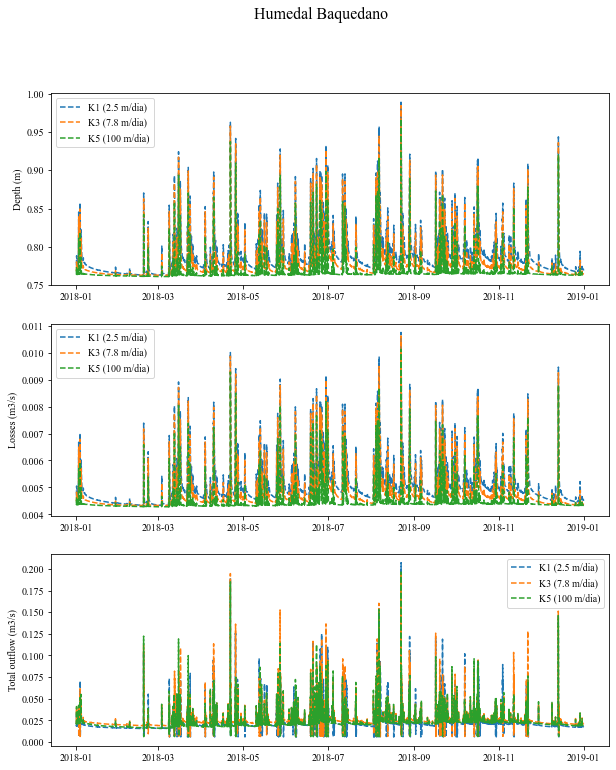

In [7]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Depth (m)"], label="K1 (2.5 m/dia)",linestyle="--" )
ax1.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Depth (m)"], label="K3 (7.8 m/dia)",linestyle="--" )
ax1.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Depth (m)"], label="K5 (100 m/dia)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Losses (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--")
ax3.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Losses (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--")
ax3.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Losses (m3/s)"],label="K5 (100 m/dia)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Total outflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
ax4.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Total outflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
ax4.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Total outflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Baquedano",fontsize=16)
plt.show()

In [8]:
WSU_name="W2"
i=WSU_names_list.index(WSU_name)

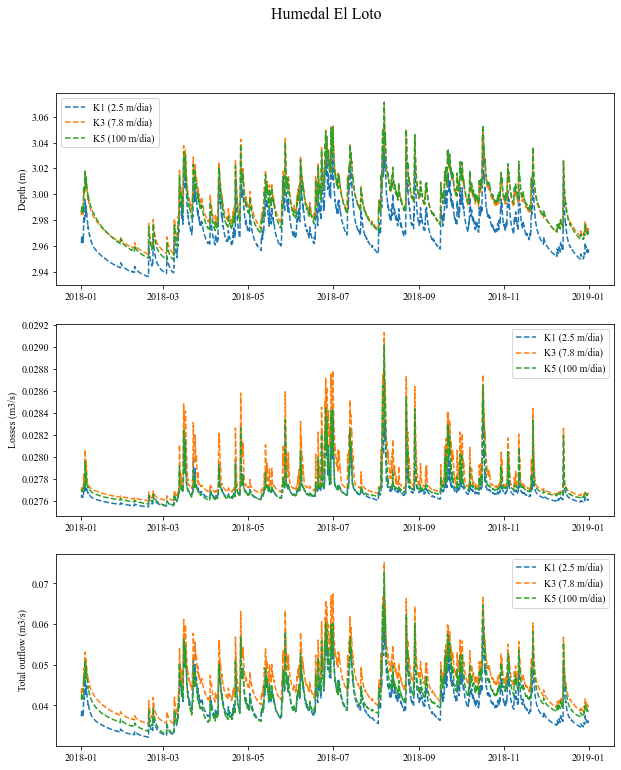

In [9]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Depth (m)"], label="K1 (2.5 m/dia)",linestyle="--" )
ax1.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Depth (m)"], label="K3 (7.8 m/dia)",linestyle="--" )
ax1.plot(df_WSU_K4[i]["2018"].index,df_WSU_K4[i]["2018"]["Depth (m)"], label="K5 (100 m/dia)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Losses (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--")
ax3.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Losses (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--")
ax3.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Losses (m3/s)"],label="K5 (100 m/dia)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Total outflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
ax4.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Total outflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
ax4.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Total outflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal El Loto",fontsize=16)
plt.show()

In [10]:
# WSU_name="W1"
# i=WSU_names_list.index(WSU_name)

In [11]:
# f, (ax1,ax2, ax4) = plt.subplots(3,1, figsize=(15,12))
# ax1.plot(df_WSU_C2[i]["2017-06-01":"2019-01-31"].index,df_WSU_C2[i]["2017-06-01":"2019-01-31"]["Depth (m)"],linestyle="--" )
# #ax1.set_ylim([0, 0.5])
# ax1.grid()
# ax1.set_ylabel("Altura (m)")
# ax2.plot(df_WSU_C2[i]["2017-06-01":"2019-01-31"].index,df_WSU_C2[i]["2017-06-01":"2019-01-31"]["Total inflow (m3/s)"],linestyle="--" )
# ax2.grid()
# ax2.set_ylabel("Entrada (m3/s)")
# ax4.plot(df_WSU_C2[i]["2017-06-01":"2019-01-31"].index,df_WSU_C2[i]["2017-06-01":"2019-01-31"]["Total outflow (m3/s)"],linestyle="--" )
# ax4.set_ylabel("Salida (m3/s)")
# ax4.grid()
# f.suptitle("Humedal Baquedano",fontsize=16)
# plt.show()

In [12]:
WSU_name="W3"
i=WSU_names_list.index(WSU_name)

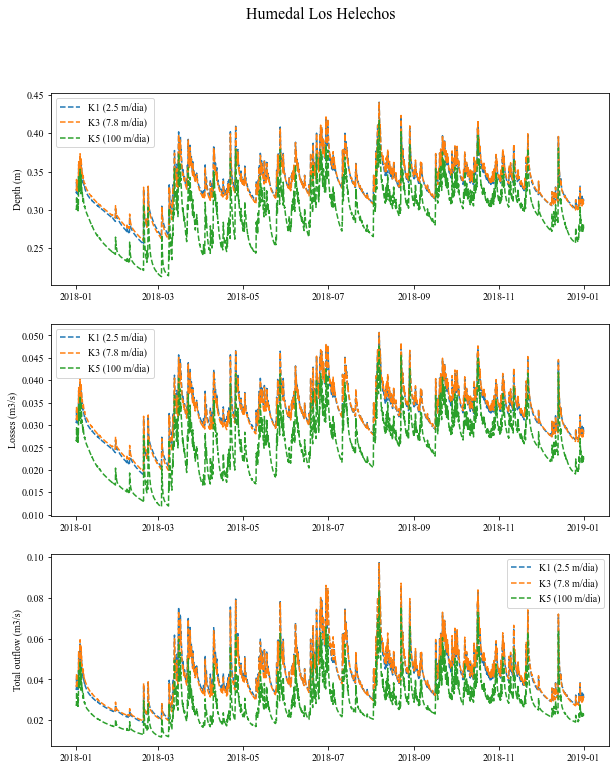

In [13]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Depth (m)"], label="K1 (2.5 m/dia)",linestyle="--" )
ax1.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Depth (m)"], label="K3 (7.8 m/dia)",linestyle="--" )
ax1.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Depth (m)"], label="K5 (100 m/dia)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Losses (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--")
ax3.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Losses (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--")
ax3.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Losses (m3/s)"],label="K5 (100 m/dia)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Total outflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
ax4.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Total outflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
ax4.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Total outflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Los Helechos",fontsize=16)
plt.show()

In [14]:
WSU_name="W4"
i=WSU_names_list.index(WSU_name)

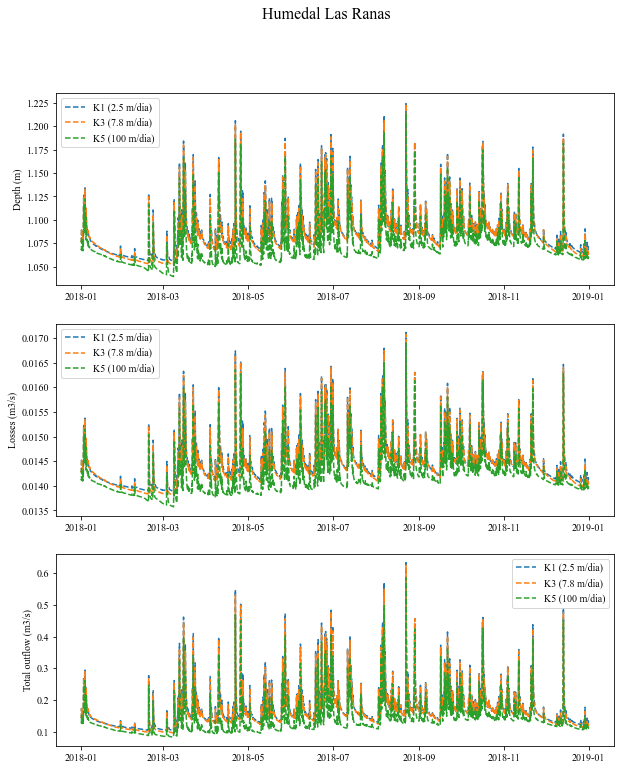

In [15]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Depth (m)"], label="K1 (2.5 m/dia)",linestyle="--" )
ax1.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Depth (m)"], label="K3 (7.8 m/dia)",linestyle="--" )
ax1.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Depth (m)"], label="K5 (100 m/dia)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Losses (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--")
ax3.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Losses (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--")
ax3.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Losses (m3/s)"],label="K5 (100 m/dia)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Total outflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
ax4.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Total outflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
ax4.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Total outflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Las Ranas",fontsize=16)
plt.show()

In [16]:
WSU_name="W5"
i=WSU_names_list.index(WSU_name)

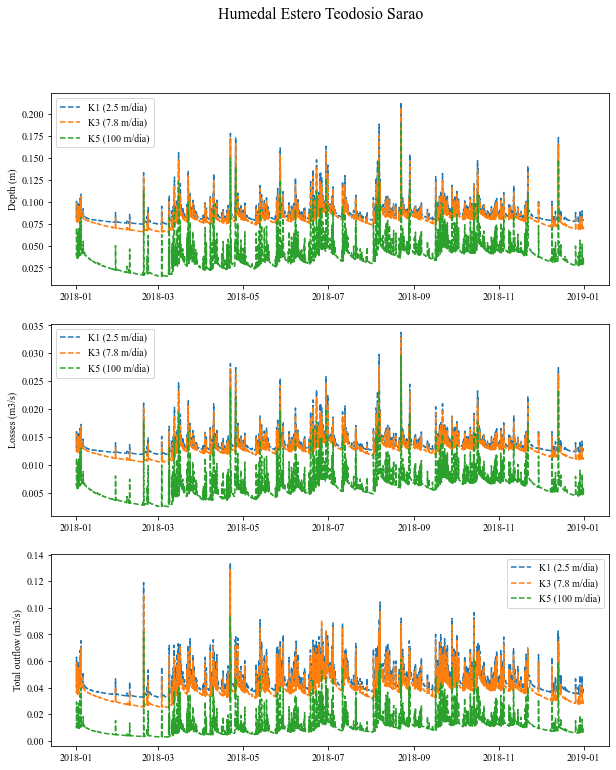

In [17]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Depth (m)"], label="K1 (2.5 m/dia)",linestyle="--" )
ax1.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Depth (m)"], label="K3 (7.8 m/dia)",linestyle="--" )
ax1.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Depth (m)"], label="K5 (100 m/dia)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Losses (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--")
ax3.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Losses (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--")
ax3.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Losses (m3/s)"],label="K5 (100 m/dia)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_K1[i]["2018"].index,df_WSU_K1[i]["2018"]["Total outflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
ax4.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Total outflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
ax4.plot(df_WSU_K5[i]["2018"].index,df_WSU_K5[i]["2018"]["Total outflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Estero Teodosio Sarao",fontsize=16)
plt.show()

### Curvas de Duración

In [18]:
def C_duracion(df_WSU,W):
    WSU_name=W
    i=WSU_names_list.index(WSU_name)
    W_TS_df=pd.DataFrame()
    W_TS_df["Depth (m)"]=df_WSU[i]["2017-05-01":"2019-03-01"]["Depth (m)"]
    W_TS_df["Time"]=df_WSU[i]["2017-05-01":"2019-03-01"].index
    W_TS_df_sort=W_TS_df.sort_values(by=["Depth (m)"], ascending=False)
    W_TS_df_sort= W_TS_df_sort.reset_index(drop=True)
    W_TS_df_sort["% Tiempo"]=(W_TS_df_sort.index+1)/(len(W_TS_df_sort)+1)*100
    return(W_TS_df_sort)

In [19]:
W1_K1_TS_df_sort=C_duracion(df_WSU_K1, "W1")
W1_K2_TS_df_sort=C_duracion(df_WSU_K2, "W1")
W1_K3_TS_df_sort=C_duracion(df_WSU_K3, "W1")
W1_K4_TS_df_sort=C_duracion(df_WSU_K4, "W1")
W1_K5_TS_df_sort=C_duracion(df_WSU_K5, "W1")
W1_K6_TS_df_sort=C_duracion(df_WSU_K6, "W1")

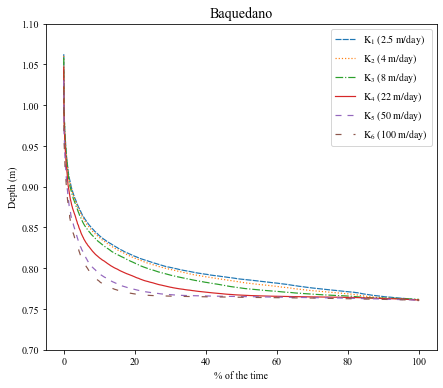

In [20]:
plt.figure(figsize=(7,6))
plt.plot(W1_K1_TS_df_sort["% Tiempo"], W1_K1_TS_df_sort["Depth (m)"], label="$\mathrm{K_1}\ \mathrm{(2.5}\ \mathrm{m/day})$",linestyle= '--',  dashes=[5, 1], linewidth=1.2)
plt.plot(W1_K2_TS_df_sort["% Tiempo"], W1_K2_TS_df_sort["Depth (m)"], label="$\mathrm{K_2}\ \mathrm{(4}\ \mathrm{m/day})$", linestyle=':', linewidth=1.2)
plt.plot(W1_K3_TS_df_sort["% Tiempo"], W1_K3_TS_df_sort["Depth (m)"], label="$\mathrm{K_3}\ \mathrm{(8}\ \mathrm{m/day})$", linestyle="-.", linewidth=1.2)
plt.plot(W1_K4_TS_df_sort["% Tiempo"], W1_K4_TS_df_sort["Depth (m)"], label="$\mathrm{K_4}\ \mathrm{(22}\ \mathrm{m/day})$", linestyle='-', linewidth=1.2)
plt.plot(W1_K6_TS_df_sort["% Tiempo"], W1_K6_TS_df_sort["Depth (m)"], label="$\mathrm{K_5}\ \mathrm{(50}\ \mathrm{m/day})$", linestyle='--' ,dashes=[5, 5], linewidth=1.2)
plt.plot(W1_K5_TS_df_sort["% Tiempo"], W1_K5_TS_df_sort["Depth (m)"], label="$\mathrm{K_6}\ \mathrm{(100}\ \mathrm{m/day})$", linestyle='-', dashes=[5,10], linewidth=1.2)
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend()
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.ylim(0.7, 1.1)
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.title("Baquedano")
plt.savefig("Figures/Anexos/DC_W1_K.svg")

In [21]:
W2_K1_TS_df_sort=C_duracion(df_WSU_K1, "W2")
W2_K2_TS_df_sort=C_duracion(df_WSU_K2, "W2")
W2_K3_TS_df_sort=C_duracion(df_WSU_K3, "W2")
W2_K4_TS_df_sort=C_duracion(df_WSU_K4, "W2")
W2_K5_TS_df_sort=C_duracion(df_WSU_K5, "W2")
W2_K6_TS_df_sort=C_duracion(df_WSU_K6, "W2")

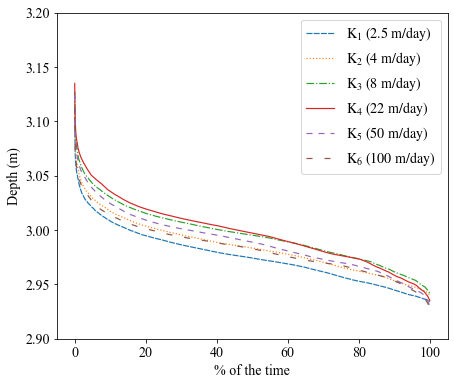

In [22]:
plt.figure(figsize=(7,6))
plt.plot(W2_K1_TS_df_sort["% Tiempo"], W2_K1_TS_df_sort["Depth (m)"], label="$\mathrm{K_1}\ \mathrm{(2.5}\ \mathrm{m/day})$",linestyle= '--',  dashes=[5, 1], linewidth=1.2)
plt.plot(W2_K2_TS_df_sort["% Tiempo"], W2_K2_TS_df_sort["Depth (m)"], label="$\mathrm{K_2}\ \mathrm{(4}\ \mathrm{m/day})$", linestyle=':', linewidth=1.2)
plt.plot(W2_K3_TS_df_sort["% Tiempo"], W2_K3_TS_df_sort["Depth (m)"], label="$\mathrm{K_3}\ \mathrm{(8}\ \mathrm{m/day})$", linestyle="-.", linewidth=1.2)
plt.plot(W2_K4_TS_df_sort["% Tiempo"], W2_K4_TS_df_sort["Depth (m)"], label="$\mathrm{K_4}\ \mathrm{(22}\ \mathrm{m/day})$", linestyle='-', linewidth=1.2)
plt.plot(W2_K6_TS_df_sort["% Tiempo"], W2_K6_TS_df_sort["Depth (m)"], label="$\mathrm{K_5}\ \mathrm{(50}\ \mathrm{m/day})$", linestyle='--' ,dashes=[5, 5], linewidth=1.2)
plt.plot(W2_K5_TS_df_sort["% Tiempo"], W2_K5_TS_df_sort["Depth (m)"], label="$\mathrm{K_6}\ \mathrm{(100}\ \mathrm{m/day})$", linestyle='-', dashes=[5,10], linewidth=1.2)
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend()
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.ylim(2.9, 3.2)
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.savefig("Figures/Fig7a.svg")

In [23]:
# plt.figure(figsize=(7,6))
# plt.plot(W2_K1_TS_df_sort["% Tiempo"], W2_K1_TS_df_sort["Depth (m)"], label="$K_1$ (2.5 m/dia)", marker="o", markevery=0.1)
# plt.plot(W2_K2_TS_df_sort["% Tiempo"], W2_K2_TS_df_sort["Depth (m)"], label="$K_2$ (4 m/dia)",  marker="v", markevery=0.1)
# plt.plot(W2_K3_TS_df_sort["% Tiempo"], W2_K3_TS_df_sort["Depth (m)"], label="$K_3$ (8 m/dia)",  marker="+", markevery=0.1)
# plt.plot(W2_K4_TS_df_sort["% Tiempo"], W2_K4_TS_df_sort["Depth (m)"], label="$K_4$ (22 m/dia)",  marker="8", markevery=0.1)
# plt.plot(W2_K6_TS_df_sort["% Tiempo"], W2_K6_TS_df_sort["Depth (m)"], label="$K_5$ (50 m/dia)",  marker="|", markevery=0.1)
# plt.plot(W2_K5_TS_df_sort["% Tiempo"], W2_K5_TS_df_sort["Depth (m)"], label="$K_6$ (100 m/dia)",  marker="x", markevery=0.1)
# plt.ylabel("Depth (m)")
# plt.xlabel("% of the time")
# plt.legend()
# plt.ylim(2.9, 3.2)
# plt.rc('font', size=14)          # controls default text sizes
# plt.rc('axes', titlesize=14)     # fontsize of the axes title
# plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
# plt.rc('legend', fontsize=14)    # legend fontsize
# #plt.title("Curvas de Duración Altura Humedal El Loto")
# #plt.savefig("Figures/Fig7a.png")

In [24]:
W3_K1_TS_df_sort=C_duracion(df_WSU_K1, "W3")
W3_K2_TS_df_sort=C_duracion(df_WSU_K2, "W3")
W3_K3_TS_df_sort=C_duracion(df_WSU_K3, "W3")
W3_K4_TS_df_sort=C_duracion(df_WSU_K4, "W3")
W3_K5_TS_df_sort=C_duracion(df_WSU_K5, "W3")
W3_K6_TS_df_sort=C_duracion(df_WSU_K6, "W3")

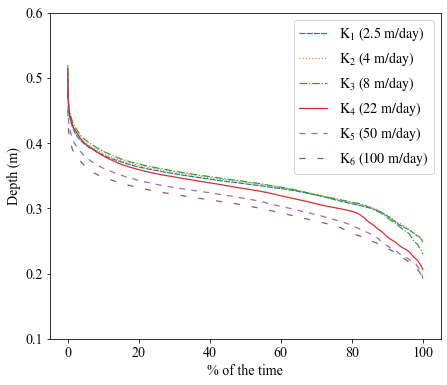

In [25]:
plt.figure(figsize=(7,6))
plt.plot(W3_K1_TS_df_sort["% Tiempo"], W3_K1_TS_df_sort["Depth (m)"],label="$\mathrm{K_1}\ \mathrm{(2.5}\ \mathrm{m/day})$",linestyle= '--',  dashes=[5, 1], linewidth=1.2)
plt.plot(W3_K2_TS_df_sort["% Tiempo"], W3_K2_TS_df_sort["Depth (m)"], label="$\mathrm{K_2}\ \mathrm{(4}\ \mathrm{m/day})$",linestyle= ':', linewidth=1.2)
plt.plot(W3_K3_TS_df_sort["% Tiempo"], W3_K3_TS_df_sort["Depth (m)"], label="$\mathrm{K_3}\ \mathrm{(8}\ \mathrm{m/day})$",linestyle= '-.', linewidth=1.2)
plt.plot(W3_K4_TS_df_sort["% Tiempo"], W3_K4_TS_df_sort["Depth (m)"], label="$\mathrm{K_4}\ \mathrm{(22}\ \mathrm{m/day})$",linestyle= '-', linewidth=1.2)
plt.plot(W3_K6_TS_df_sort["% Tiempo"], W3_K6_TS_df_sort["Depth (m)"], label="$\mathrm{K_5}\ \mathrm{(50}\ \mathrm{m/day})$", linestyle='--' ,dashes=[5, 5], linewidth=1.2)
plt.plot(W3_K5_TS_df_sort["% Tiempo"], W3_K5_TS_df_sort["Depth (m)"], label="$\mathrm{K_6}\ \mathrm{(100}\ \mathrm{m/day})$", linestyle='--' ,dashes=[5, 10], linewidth=1.2)
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.ylim(0.1, 0.6)
plt.legend()
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
#plt.title("Curvas de Duración Altura Humedal El Loto")
plt.savefig("Figures/Fig8a.svg")

In [26]:
W4_K1_TS_df_sort=C_duracion(df_WSU_K1, "W4")
W4_K2_TS_df_sort=C_duracion(df_WSU_K2, "W4")
W4_K3_TS_df_sort=C_duracion(df_WSU_K3, "W4")
W4_K4_TS_df_sort=C_duracion(df_WSU_K4, "W4")
W4_K5_TS_df_sort=C_duracion(df_WSU_K5, "W4")
W4_K6_TS_df_sort=C_duracion(df_WSU_K6, "W4")

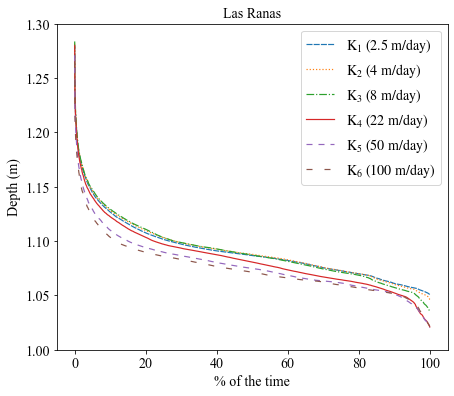

In [27]:
plt.figure(figsize=(7,6))
plt.plot(W4_K1_TS_df_sort["% Tiempo"], W4_K1_TS_df_sort["Depth (m)"],label="$\mathrm{K_1}\ \mathrm{(2.5}\ \mathrm{m/day})$",linestyle= '--',  dashes=[5, 1], linewidth=1.2)
plt.plot(W4_K2_TS_df_sort["% Tiempo"], W4_K2_TS_df_sort["Depth (m)"], label="$\mathrm{K_2}\ \mathrm{(4}\ \mathrm{m/day})$",linestyle= ':', linewidth=1.2)
plt.plot(W4_K3_TS_df_sort["% Tiempo"], W4_K3_TS_df_sort["Depth (m)"], label="$\mathrm{K_3}\ \mathrm{(8}\ \mathrm{m/day})$",linestyle= '-.', linewidth=1.2)
plt.plot(W4_K4_TS_df_sort["% Tiempo"], W4_K4_TS_df_sort["Depth (m)"], label="$\mathrm{K_4}\ \mathrm{(22}\ \mathrm{m/day})$",linestyle= '-', linewidth=1.2)
plt.plot(W4_K6_TS_df_sort["% Tiempo"], W4_K6_TS_df_sort["Depth (m)"], label="$\mathrm{K_5}\ \mathrm{(50}\ \mathrm{m/day})$", linestyle='--' ,dashes=[5, 5], linewidth=1.2)
plt.plot(W4_K5_TS_df_sort["% Tiempo"], W4_K5_TS_df_sort["Depth (m)"], label="$\mathrm{K_6}\ \mathrm{(100}\ \mathrm{m/day})$", linestyle='--' ,dashes=[5, 10], linewidth=1.2)
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.ylim(1, 1.3)
plt.legend()
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.title("Las Ranas")
plt.savefig("Figures/Anexos/DC_W4_K.svg")

In [28]:
W5_K1_TS_df_sort=C_duracion(df_WSU_K1, "W5")
W5_K2_TS_df_sort=C_duracion(df_WSU_K2, "W5")
W5_K3_TS_df_sort=C_duracion(df_WSU_K3, "W5")
W5_K4_TS_df_sort=C_duracion(df_WSU_K4, "W5")
W5_K5_TS_df_sort=C_duracion(df_WSU_K5, "W5")
W5_K6_TS_df_sort=C_duracion(df_WSU_K6, "W5")

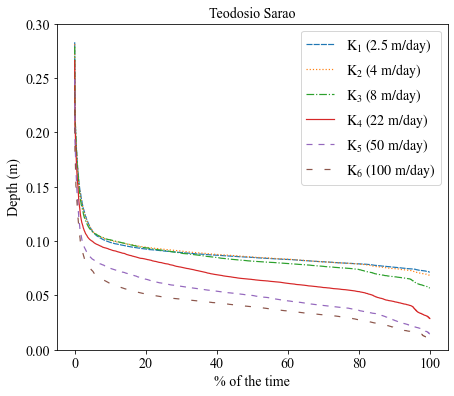

In [29]:
plt.figure(figsize=(7,6))
plt.plot(W5_K1_TS_df_sort["% Tiempo"], W5_K1_TS_df_sort["Depth (m)"],label="$\mathrm{K_1}\ \mathrm{(2.5}\ \mathrm{m/day})$",linestyle= '--',  dashes=[5, 1], linewidth=1.2)
plt.plot(W5_K2_TS_df_sort["% Tiempo"], W5_K2_TS_df_sort["Depth (m)"], label="$\mathrm{K_2}\ \mathrm{(4}\ \mathrm{m/day})$",linestyle= ':', linewidth=1.2)
plt.plot(W5_K3_TS_df_sort["% Tiempo"], W5_K3_TS_df_sort["Depth (m)"], label="$\mathrm{K_3}\ \mathrm{(8}\ \mathrm{m/day})$",linestyle= '-.', linewidth=1.2)
plt.plot(W5_K4_TS_df_sort["% Tiempo"], W5_K4_TS_df_sort["Depth (m)"], label="$\mathrm{K_4}\ \mathrm{(22}\ \mathrm{m/day})$",linestyle= '-', linewidth=1.2)
plt.plot(W5_K6_TS_df_sort["% Tiempo"], W5_K6_TS_df_sort["Depth (m)"], label="$\mathrm{K_5}\ \mathrm{(50}\ \mathrm{m/day})$", linestyle='--' ,dashes=[5, 5], linewidth=1.2)
plt.plot(W5_K5_TS_df_sort["% Tiempo"], W5_K5_TS_df_sort["Depth (m)"], label="$\mathrm{K_6}\ \mathrm{(100}\ \mathrm{m/day})$", linestyle='--' ,dashes=[5, 10], linewidth=1.2)
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.ylim(0, 0.3)
plt.legend()
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.title("Teodosio Sarao")
plt.savefig("Figures/Anexos/DC_W5_K.svg")


## Flooding Storage Units

### Time Series

In [30]:
df_FSU_K1=import_xls('Iteracion_K_1/FSU_SWMM_TS.xls') #2.5
df_FSU_K2=import_xls('Iteracion_K_2/FSU_SWMM_TS.xls') #3.95
df_FSU_K3=import_xls('Iteracion_K_3/FSU_SWMM_TS.xls') #7.85
df_FSU_K4=import_xls('Iteracion_K_4/FSU_SWMM_TS.xls') #22
df_FSU_K5=import_xls('Iteracion_K_5/FSU_SWMM_TS.xls') #103.4
df_FSU_K6=import_xls('Iteracion_K_6/FSU_SWMM_TS.xls') #50

In [31]:
FSU_name="SU3"
i=FSU_names_list.index(FSU_name)

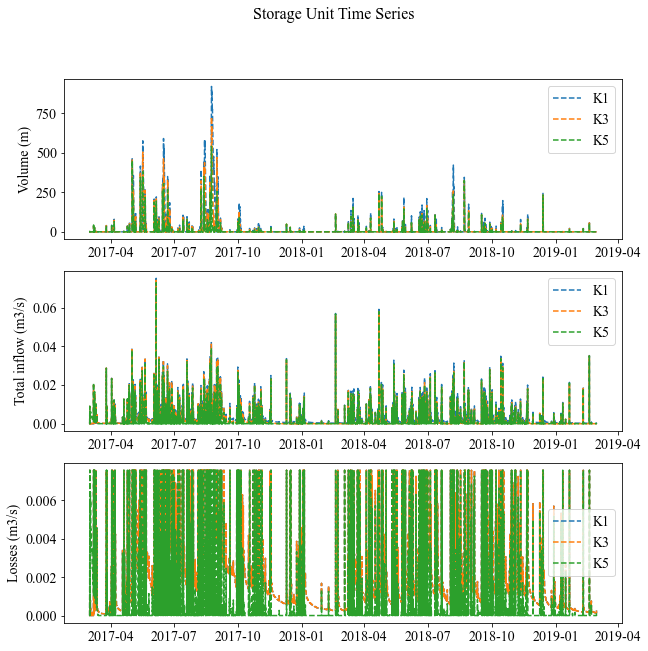

In [32]:
f, (ax1, ax2, ax3) = plt.subplots(3,1, figsize=(10,10))
ax1.plot(df_FSU_K1[i].index,df_FSU_K1[i]["Volume (m3)"], label="K1",linestyle="--" )
ax1.plot(df_FSU_K3[i].index,df_FSU_K3[i]["Volume (m3)"], label="K3",linestyle="--" )
ax1.plot(df_FSU_K5[i].index,df_FSU_K5[i]["Volume (m3)"], label="K5",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Volume (m)")
ax2.plot(df_FSU_K1[i].index,df_FSU_K1[i]["Total inflow (m3/s)"],label="K1",linestyle="--" )
ax2.plot(df_FSU_K3[i].index,df_FSU_K3[i]["Total inflow (m3/s)"],label="K3",linestyle="--" )
ax2.plot(df_FSU_K5[i].index,df_FSU_K5[i]["Total inflow (m3/s)"],label="K5",linestyle="--" )
ax2.legend()
ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_FSU_K1[i].index,df_FSU_K1[i]["Losses (m3/s)"],label="K1",linestyle="--")
ax3.plot(df_FSU_K3[i].index,df_FSU_K1[i]["Losses (m3/s)"],label="K3",linestyle="--")
ax3.plot(df_FSU_K5[i].index,df_FSU_K5[i]["Losses (m3/s)"],label="K5",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
f.suptitle("Storage Unit Time Series",fontsize=16)
plt.show()

In [33]:
FSU_name="SU6"
i=FSU_names_list.index(FSU_name)

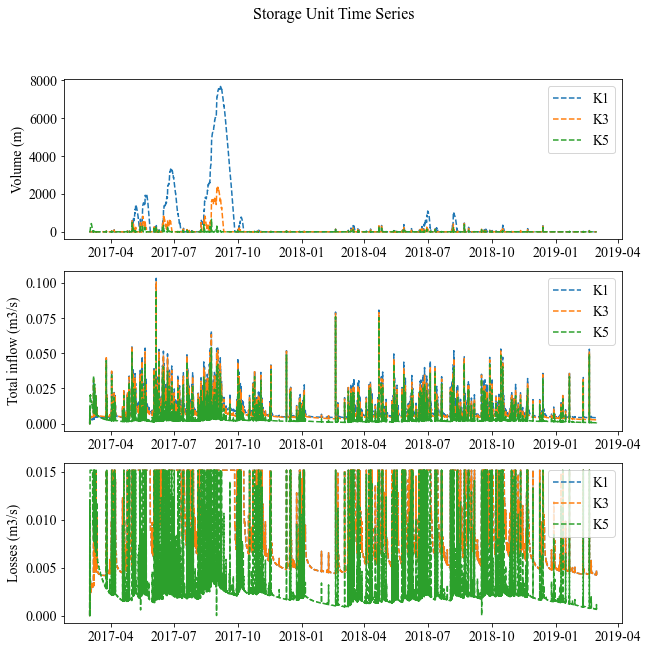

In [34]:
f, (ax1, ax2, ax3) = plt.subplots(3,1, figsize=(10,10))
ax1.plot(df_FSU_K1[i].index,df_FSU_K1[i]["Volume (m3)"], label="K1",linestyle="--" )
ax1.plot(df_FSU_K3[i].index,df_FSU_K3[i]["Volume (m3)"], label="K3",linestyle="--" )
ax1.plot(df_FSU_K5[i].index,df_FSU_K5[i]["Volume (m3)"], label="K5",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Volume (m)")
ax2.plot(df_FSU_K1[i].index,df_FSU_K1[i]["Total inflow (m3/s)"],label="K1",linestyle="--" )
ax2.plot(df_FSU_K3[i].index,df_FSU_K3[i]["Total inflow (m3/s)"],label="K3",linestyle="--" )
ax2.plot(df_FSU_K5[i].index,df_FSU_K5[i]["Total inflow (m3/s)"],label="K5",linestyle="--" )
ax2.legend()
ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_FSU_K1[i].index,df_FSU_K1[i]["Losses (m3/s)"],label="K1",linestyle="--")
ax3.plot(df_FSU_K3[i].index,df_FSU_K1[i]["Losses (m3/s)"],label="K3",linestyle="--")
ax3.plot(df_FSU_K5[i].index,df_FSU_K5[i]["Losses (m3/s)"],label="K5",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
f.suptitle("Storage Unit Time Series",fontsize=16)
plt.show()

### Frecuency Analysis

In [35]:
def A_frecuencia(df_FSU,FSU, phi):
    FSU_name=FSU
    i=FSU_names_list.index(FSU_name)
    FSU_TS_df=pd.DataFrame()
    FSU_TS_df["Volume (m3)"]=df_FSU[i]["2017-05-01":"2019-03-01"]["Volume (m3)"]
    FSU_TS_df["Time"]=df_FSU[i]["2017-05-01":"2019-03-01"].index
    anos=len(FSU_TS_df)/24/365
    #Definir Eventos - Vol max
    FSU_df_events=pd.DataFrame()
    FSU_df_events["Time"]=""
    FSU_df_events["Volume (m3)"]=""
    FSU_df_events["Duration (h)"]=""
    
    duracion=0
    m3=0
    j=0
    while j<len(FSU_TS_df):
    #Ordenarlos Segpun Volumen 
        if FSU_TS_df["Volume (m3)"][j]>phi:
            duracion+=1
            if FSU_TS_df["Volume (m3)"][j]>m3:
                m3=FSU_TS_df["Volume (m3)"][j]
            if FSU_TS_df["Volume (m3)"][j+1]<phi:
                FSU_df_events=FSU_df_events.append({"Time": FSU_TS_df["Time"][j],"Volume (m3)": m3, "Duration (h)": duracion}, ignore_index=True)
                duracion=0
                m3=0
                j+=1
            else:
                j+=1
        else:
            j+=1
            
#     #Asignar probobilidad de excedencia
    
    FSU_TS_df_sort=FSU_df_events.sort_values(by=["Volume (m3)"], ascending=False)
    FSU_TS_df_sort= FSU_TS_df_sort.reset_index(drop=True)
    FSU_TS_df_sort["T"]=(anos)/(FSU_TS_df_sort.index+1)
    
#     #Correccion Prob Excedencia
#     df_aux=FSU_TS_df_sort.groupby("Volume (m3)").last()
#     df_aux["Volume (m3)"]=df_aux.index
#     df_aux=df_aux.reset_index(drop=True)
    
#     df_join=FSU_TS_df_sort.merge(df_aux, on="Volume (m3)", how="outer", suffixes=("", "_corr"))
#     df_join=df_join.drop(columns="Time_corr")
    return(FSU_TS_df, FSU_df_events,FSU_TS_df_sort)

In [36]:
phi=1
SU1_K1_TS_df_sort=A_frecuencia(df_FSU_K1,"SU1",phi)
SU1_K2_TS_df_sort=A_frecuencia(df_FSU_K2,"SU1",phi)
SU1_K3_TS_df_sort=A_frecuencia(df_FSU_K3,"SU1",phi)
SU1_K4_TS_df_sort=A_frecuencia(df_FSU_K4,"SU1",phi)
SU1_K5_TS_df_sort=A_frecuencia(df_FSU_K5,"SU1",phi)
SU1_K6_TS_df_sort=A_frecuencia(df_FSU_K6,"SU1",phi)

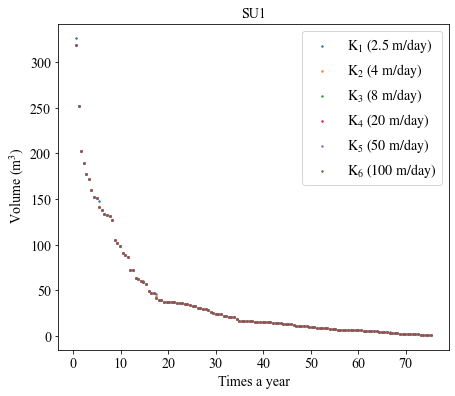

In [37]:
plt.figure(figsize=(7,6))
plt.scatter(1/SU1_K1_TS_df_sort[2]["T"], SU1_K1_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_1}\ \mathrm{(2.5}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU1_K2_TS_df_sort[2]["T"], SU1_K2_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_2}\ \mathrm{(4}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU1_K3_TS_df_sort[2]["T"], SU1_K3_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_3}\ \mathrm{(8}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU1_K4_TS_df_sort[2]["T"], SU1_K4_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_4}\ \mathrm{(20}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU1_K6_TS_df_sort[2]["T"], SU1_K6_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_5}\ \mathrm{(50}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU1_K5_TS_df_sort[2]["T"], SU1_K5_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_6}\ \mathrm{(100}\ \mathrm{m/day})$", s=2)
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.ylabel(" Volume $\mathrm{(m^3)}$")
plt.xlabel('Times a year')
#plt.xscale("log")
plt.title("SU1")
plt.legend()
#plt.savefig("Figures/Anexos/FA_SU1_K.svg")

In [38]:
phi=1
SU2_K1_TS_df_sort=A_frecuencia(df_FSU_K1,"SU2", phi)
SU2_K2_TS_df_sort=A_frecuencia(df_FSU_K2,"SU2", phi)
SU2_K3_TS_df_sort=A_frecuencia(df_FSU_K3,"SU2", phi)
SU2_K4_TS_df_sort=A_frecuencia(df_FSU_K4,"SU2", phi)
SU2_K5_TS_df_sort=A_frecuencia(df_FSU_K5,"SU2", phi)
SU2_K6_TS_df_sort=A_frecuencia(df_FSU_K6,"SU2", phi)

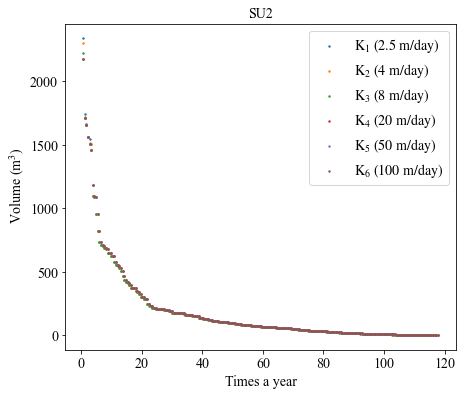

In [39]:
plt.figure(figsize=(7,6))
plt.scatter(1/SU2_K1_TS_df_sort[2]["T"], SU2_K1_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_1}\ \mathrm{(2.5}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU2_K2_TS_df_sort[2]["T"], SU2_K2_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_2}\ \mathrm{(4}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU2_K3_TS_df_sort[2]["T"], SU2_K3_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_3}\ \mathrm{(8}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU2_K4_TS_df_sort[2]["T"], SU2_K4_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_4}\ \mathrm{(20}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU2_K6_TS_df_sort[2]["T"], SU2_K6_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_5}\ \mathrm{(50}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU2_K5_TS_df_sort[2]["T"], SU2_K5_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_6}\ \mathrm{(100}\ \mathrm{m/day})$", s=2)
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.ylabel(" Volume $\mathrm{(m^3)}$")
plt.xlabel('Times a year')
#plt.xscale("log")
plt.title("SU2")
plt.legend()
#plt.savefig("Figures/Anexos/FA_SU2_K.svg")

In [40]:
phi=1
SU3_K1_TS_df_sort=A_frecuencia(df_FSU_K1,"SU3", phi)
SU3_K2_TS_df_sort=A_frecuencia(df_FSU_K2,"SU3", phi)
SU3_K3_TS_df_sort=A_frecuencia(df_FSU_K3,"SU3", phi)
SU3_K4_TS_df_sort=A_frecuencia(df_FSU_K4,"SU3", phi)
SU3_K5_TS_df_sort=A_frecuencia(df_FSU_K5,"SU3", phi)
SU3_K6_TS_df_sort=A_frecuencia(df_FSU_K6,"SU3", phi)

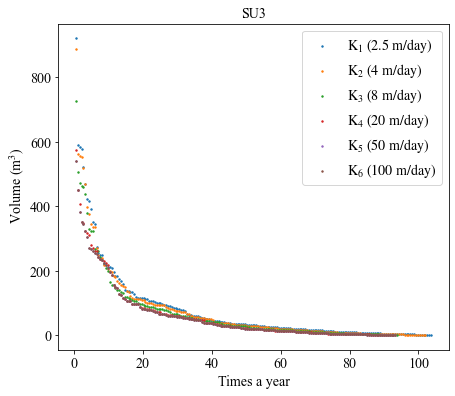

In [41]:
plt.figure(figsize=(7,6))
plt.scatter(1/SU3_K1_TS_df_sort[2]["T"], SU3_K1_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_1}\ \mathrm{(2.5}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU3_K2_TS_df_sort[2]["T"], SU3_K2_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_2}\ \mathrm{(4}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU3_K3_TS_df_sort[2]["T"], SU3_K3_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_3}\ \mathrm{(8}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU3_K4_TS_df_sort[2]["T"], SU3_K4_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_4}\ \mathrm{(20}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU3_K6_TS_df_sort[2]["T"], SU3_K6_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_5}\ \mathrm{(50}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU3_K5_TS_df_sort[2]["T"], SU3_K5_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_6}\ \mathrm{(100}\ \mathrm{m/day})$", s=2)
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.ylabel(" Volume $\mathrm{(m^3)}$")
plt.xlabel('Times a year')
#plt.xscale("log")
plt.title("SU3")
plt.legend()
#plt.savefig("Figures/Anexos/FA_SU3_K.svg")

In [42]:
phi=1
SU4_K1_TS_df_sort=A_frecuencia(df_FSU_K1,"SU4", phi)
SU4_K2_TS_df_sort=A_frecuencia(df_FSU_K2,"SU4", phi)
SU4_K3_TS_df_sort=A_frecuencia(df_FSU_K3,"SU4", phi)
SU4_K4_TS_df_sort=A_frecuencia(df_FSU_K4,"SU4", phi)
SU4_K5_TS_df_sort=A_frecuencia(df_FSU_K5,"SU4", phi)
SU4_K6_TS_df_sort=A_frecuencia(df_FSU_K6,"SU4", phi)

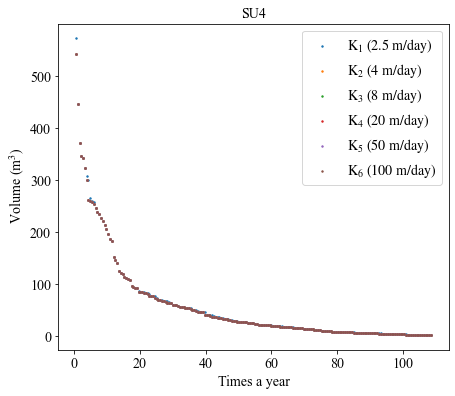

In [43]:
plt.figure(figsize=(7,6))
plt.scatter(1/SU4_K1_TS_df_sort[2]["T"], SU4_K1_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_1}\ \mathrm{(2.5}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU4_K2_TS_df_sort[2]["T"], SU4_K2_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_2}\ \mathrm{(4}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU4_K3_TS_df_sort[2]["T"], SU4_K3_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_3}\ \mathrm{(8}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU4_K4_TS_df_sort[2]["T"], SU4_K4_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_4}\ \mathrm{(20}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU4_K6_TS_df_sort[2]["T"], SU4_K6_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_5}\ \mathrm{(50}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU4_K5_TS_df_sort[2]["T"], SU4_K5_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_6}\ \mathrm{(100}\ \mathrm{m/day})$", s=2)
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.ylabel(" Volume $\mathrm{(m^3)}$")
plt.xlabel('Times a year')
#plt.xscale("log")
plt.title("SU4")
plt.legend()
#plt.savefig("Figures/Anexos/FA_SU4_K.svg")

In [44]:
phi=1
SU5_K1_TS_df_sort=A_frecuencia(df_FSU_K1,"SU5", phi)
SU5_K2_TS_df_sort=A_frecuencia(df_FSU_K2,"SU5", phi)
SU5_K3_TS_df_sort=A_frecuencia(df_FSU_K3,"SU5", phi)
SU5_K4_TS_df_sort=A_frecuencia(df_FSU_K4,"SU5", phi)
SU5_K5_TS_df_sort=A_frecuencia(df_FSU_K5,"SU5", phi)
SU5_K6_TS_df_sort=A_frecuencia(df_FSU_K6,"SU5", phi)

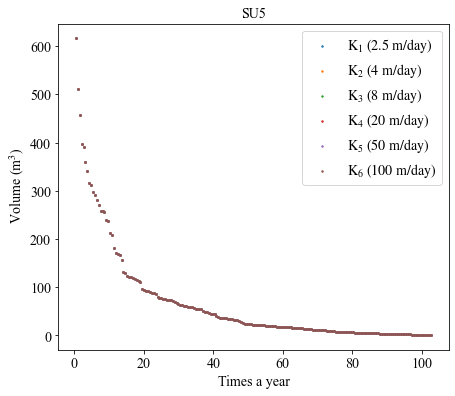

In [45]:
plt.figure(figsize=(7,6))
plt.scatter(1/SU5_K1_TS_df_sort[2]["T"], SU5_K1_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_1}\ \mathrm{(2.5}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU5_K2_TS_df_sort[2]["T"], SU5_K2_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_2}\ \mathrm{(4}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU5_K3_TS_df_sort[2]["T"], SU5_K3_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_3}\ \mathrm{(8}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU5_K4_TS_df_sort[2]["T"], SU5_K4_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_4}\ \mathrm{(20}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU5_K6_TS_df_sort[2]["T"], SU5_K6_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_5}\ \mathrm{(50}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU5_K5_TS_df_sort[2]["T"], SU5_K5_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_6}\ \mathrm{(100}\ \mathrm{m/day})$", s=2)
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.ylabel(" Volume $\mathrm{(m^3)}$")
plt.xlabel('Times a year')
#plt.xscale("log")
plt.title("SU5")
plt.legend()
#plt.savefig("Figures/Anexos/FA_SU5_K.svg")

In [46]:
phi=1
SU6_K1_TS_df_sort=A_frecuencia(df_FSU_K1,"SU6",phi)
SU6_K2_TS_df_sort=A_frecuencia(df_FSU_K2,"SU6",phi)
SU6_K3_TS_df_sort=A_frecuencia(df_FSU_K3,"SU6",phi)
SU6_K4_TS_df_sort=A_frecuencia(df_FSU_K4,"SU6",phi)
SU6_K5_TS_df_sort=A_frecuencia(df_FSU_K5,"SU6",phi)
SU6_K6_TS_df_sort=A_frecuencia(df_FSU_K6,"SU6",phi)

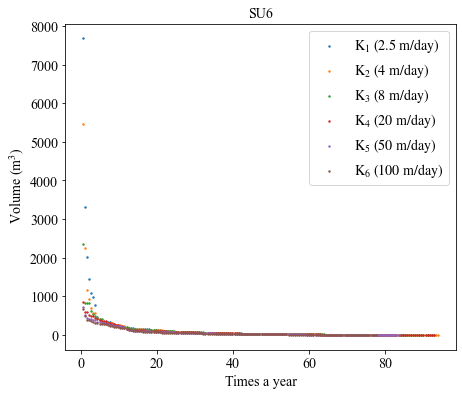

In [47]:
plt.figure(figsize=(7,6))
plt.scatter(1/SU6_K1_TS_df_sort[2]["T"], SU6_K1_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_1}\ \mathrm{(2.5}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU6_K2_TS_df_sort[2]["T"], SU6_K2_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_2}\ \mathrm{(4}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU6_K3_TS_df_sort[2]["T"], SU6_K3_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_3}\ \mathrm{(8}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU6_K4_TS_df_sort[2]["T"], SU6_K4_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_4}\ \mathrm{(20}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU6_K6_TS_df_sort[2]["T"], SU6_K6_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_5}\ \mathrm{(50}\ \mathrm{m/day})$", s=2)
plt.scatter(1/SU6_K5_TS_df_sort[2]["T"], SU6_K5_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{K_6}\ \mathrm{(100}\ \mathrm{m/day})$", s=2)
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.ylabel(" Volume $\mathrm{(m^3)}$")
plt.xlabel('Times a year')
#plt.xscale("log")
plt.title("SU6")
plt.legend()
#plt.savefig("Figures/Anexos/FA_SU6_K.svg")

### Curvas de Duración

In [48]:
def C_duracion_FSU(df_FSU,FSU):
    FSU_name=FSU
    i=FSU_names_list.index(FSU_name)
    F_TS_df=pd.DataFrame()
    F_TS_df["Volume (m3)"]=df_FSU[i]["2017-05-01":"2019-03-01"]["Volume (m3)"]
    F_TS_df["Time"]=df_FSU[i]["2017-05-01":"2019-03-01"].index
    F_TS_df_sort=F_TS_df.sort_values(by=["Volume (m3)"], ascending=False)
    F_TS_df_sort= F_TS_df_sort.reset_index(drop=True)
    F_TS_df_sort["% Tiempo"]=(F_TS_df_sort.index+1)/(len(F_TS_df_sort)+1)*100
    return(F_TS_df_sort)

In [49]:
FSU6_K1_TS_df_sort=C_duracion_FSU(df_FSU_K1, "SU6")
FSU6_K2_TS_df_sort=C_duracion_FSU(df_FSU_K2, "SU6")
FSU6_K3_TS_df_sort=C_duracion_FSU(df_FSU_K3, "SU6")
FSU6_K4_TS_df_sort=C_duracion_FSU(df_FSU_K4, "SU6")
FSU6_K5_TS_df_sort=C_duracion_FSU(df_FSU_K5, "SU6")
FSU6_K6_TS_df_sort=C_duracion_FSU(df_FSU_K6, "SU6")

Text(0.5, 1.0, 'Curvas de Duración Volumen Inundado SU6')

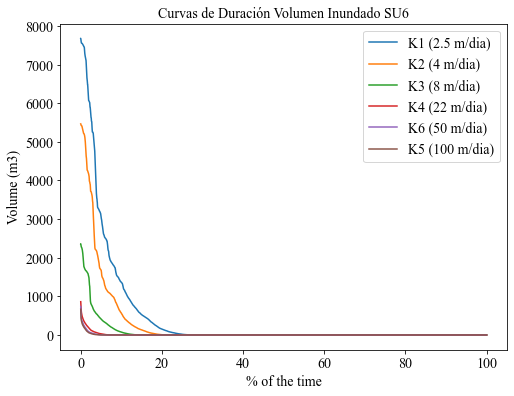

In [50]:
plt.figure(figsize=(8,6))
plt.plot(FSU6_K1_TS_df_sort["% Tiempo"], FSU6_K1_TS_df_sort["Volume (m3)"], label="K1 (2.5 m/dia)")
plt.plot(FSU6_K2_TS_df_sort["% Tiempo"], FSU6_K2_TS_df_sort["Volume (m3)"], label="K2 (4 m/dia)")
plt.plot(FSU6_K3_TS_df_sort["% Tiempo"], FSU6_K3_TS_df_sort["Volume (m3)"], label="K3 (8 m/dia)")
plt.plot(FSU6_K4_TS_df_sort["% Tiempo"], FSU6_K4_TS_df_sort["Volume (m3)"], label="K4 (22 m/dia)")
plt.plot(FSU6_K6_TS_df_sort["% Tiempo"], FSU6_K6_TS_df_sort["Volume (m3)"], label="K6 (50 m/dia)")
plt.plot(FSU6_K5_TS_df_sort["% Tiempo"], FSU6_K5_TS_df_sort["Volume (m3)"], label="K5 (100 m/dia)")
plt.ylabel("Volume (m3)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Volumen Inundado SU6")

In [51]:
FSU5_K1_TS_df_sort=C_duracion_FSU(df_FSU_K1, "SU5")
FSU5_K2_TS_df_sort=C_duracion_FSU(df_FSU_K2, "SU5")
FSU5_K3_TS_df_sort=C_duracion_FSU(df_FSU_K3, "SU5")
FSU5_K4_TS_df_sort=C_duracion_FSU(df_FSU_K4, "SU5")
FSU5_K5_TS_df_sort=C_duracion_FSU(df_FSU_K5, "SU5")
FSU5_K6_TS_df_sort=C_duracion_FSU(df_FSU_K6, "SU5")

Text(0.5, 1.0, 'Curvas de Duración Volumen Inundado SU5')

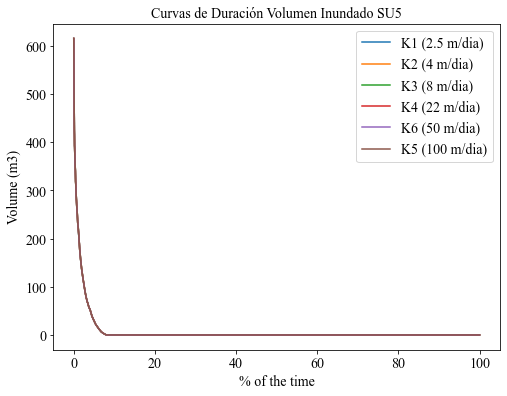

In [52]:
plt.figure(figsize=(8,6))
plt.plot(FSU5_K1_TS_df_sort["% Tiempo"], FSU5_K1_TS_df_sort["Volume (m3)"], label="K1 (2.5 m/dia)")
plt.plot(FSU5_K2_TS_df_sort["% Tiempo"], FSU5_K2_TS_df_sort["Volume (m3)"], label="K2 (4 m/dia)")
plt.plot(FSU5_K3_TS_df_sort["% Tiempo"], FSU5_K3_TS_df_sort["Volume (m3)"], label="K3 (8 m/dia)")
plt.plot(FSU5_K4_TS_df_sort["% Tiempo"], FSU5_K4_TS_df_sort["Volume (m3)"], label="K4 (22 m/dia)")
plt.plot(FSU5_K6_TS_df_sort["% Tiempo"], FSU5_K6_TS_df_sort["Volume (m3)"], label="K6 (50 m/dia)")
plt.plot(FSU5_K5_TS_df_sort["% Tiempo"], FSU5_K5_TS_df_sort["Volume (m3)"], label="K5 (100 m/dia)")
plt.ylabel("Volume (m3)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Volumen Inundado SU5")

In [53]:
FSU4_K1_TS_df_sort=C_duracion_FSU(df_FSU_K1, "SU4")
FSU4_K2_TS_df_sort=C_duracion_FSU(df_FSU_K2, "SU4")
FSU4_K3_TS_df_sort=C_duracion_FSU(df_FSU_K3, "SU4")
FSU4_K4_TS_df_sort=C_duracion_FSU(df_FSU_K4, "SU4")
FSU4_K5_TS_df_sort=C_duracion_FSU(df_FSU_K5, "SU4")
FSU4_K6_TS_df_sort=C_duracion_FSU(df_FSU_K6, "SU4")

Text(0.5, 1.0, 'Curvas de Duración Volumen Inundado SU4')

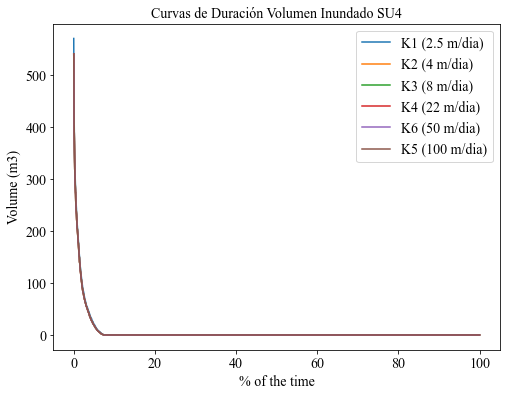

In [54]:
plt.figure(figsize=(8,6))
plt.plot(FSU4_K1_TS_df_sort["% Tiempo"], FSU4_K1_TS_df_sort["Volume (m3)"], label="K1 (2.5 m/dia)")
plt.plot(FSU4_K2_TS_df_sort["% Tiempo"], FSU4_K2_TS_df_sort["Volume (m3)"], label="K2 (4 m/dia)")
plt.plot(FSU4_K3_TS_df_sort["% Tiempo"], FSU4_K3_TS_df_sort["Volume (m3)"], label="K3 (8 m/dia)")
plt.plot(FSU4_K4_TS_df_sort["% Tiempo"], FSU4_K4_TS_df_sort["Volume (m3)"], label="K4 (22 m/dia)")
plt.plot(FSU4_K6_TS_df_sort["% Tiempo"], FSU4_K6_TS_df_sort["Volume (m3)"], label="K6 (50 m/dia)")
plt.plot(FSU4_K5_TS_df_sort["% Tiempo"], FSU4_K5_TS_df_sort["Volume (m3)"], label="K5 (100 m/dia)")
plt.ylabel("Volume (m3)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Volumen Inundado SU4")

In [55]:
FSU3_K1_TS_df_sort=C_duracion_FSU(df_FSU_K1, "SU3")
FSU3_K2_TS_df_sort=C_duracion_FSU(df_FSU_K2, "SU3")
FSU3_K3_TS_df_sort=C_duracion_FSU(df_FSU_K3, "SU3")
FSU3_K4_TS_df_sort=C_duracion_FSU(df_FSU_K4, "SU3")
FSU3_K5_TS_df_sort=C_duracion_FSU(df_FSU_K5, "SU3")
FSU3_K6_TS_df_sort=C_duracion_FSU(df_FSU_K6, "SU3")

Text(0.5, 1.0, 'Curvas de Duración Volumen Inundado SU3')

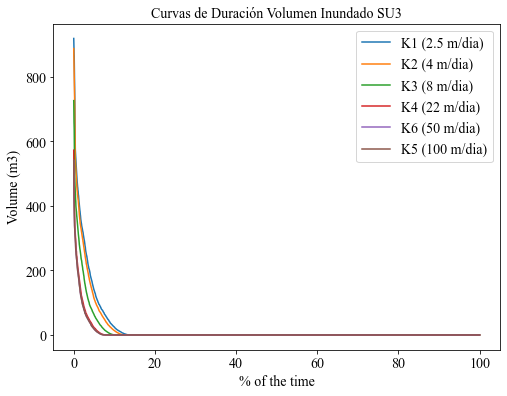

In [56]:
plt.figure(figsize=(8,6))
plt.plot(FSU3_K1_TS_df_sort["% Tiempo"], FSU3_K1_TS_df_sort["Volume (m3)"], label="K1 (2.5 m/dia)")
plt.plot(FSU3_K2_TS_df_sort["% Tiempo"], FSU3_K2_TS_df_sort["Volume (m3)"], label="K2 (4 m/dia)")
plt.plot(FSU3_K3_TS_df_sort["% Tiempo"], FSU3_K3_TS_df_sort["Volume (m3)"], label="K3 (8 m/dia)")
plt.plot(FSU3_K4_TS_df_sort["% Tiempo"], FSU3_K4_TS_df_sort["Volume (m3)"], label="K4 (22 m/dia)")
plt.plot(FSU3_K6_TS_df_sort["% Tiempo"], FSU3_K6_TS_df_sort["Volume (m3)"], label="K6 (50 m/dia)")
plt.plot(FSU3_K5_TS_df_sort["% Tiempo"], FSU3_K5_TS_df_sort["Volume (m3)"], label="K5 (100 m/dia)")
plt.ylabel("Volume (m3)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Volumen Inundado SU3")

In [57]:
FSU2_K1_TS_df_sort=C_duracion_FSU(df_FSU_K1, "SU2")
FSU2_K2_TS_df_sort=C_duracion_FSU(df_FSU_K2, "SU2")
FSU2_K3_TS_df_sort=C_duracion_FSU(df_FSU_K3, "SU2")
FSU2_K4_TS_df_sort=C_duracion_FSU(df_FSU_K4, "SU2")
FSU2_K5_TS_df_sort=C_duracion_FSU(df_FSU_K5, "SU2")
FSU2_K6_TS_df_sort=C_duracion_FSU(df_FSU_K6, "SU2")

Text(0.5, 1.0, 'Curvas de Duración Volumen Inundado SU2')

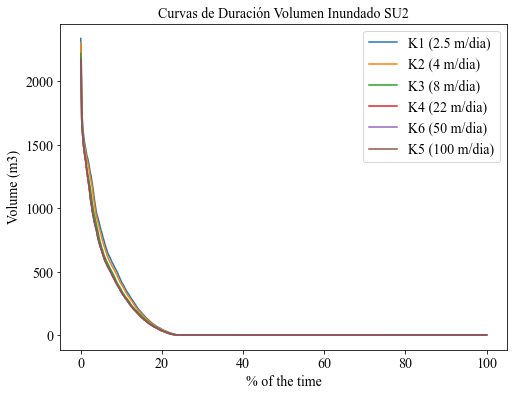

In [58]:
plt.figure(figsize=(8,6))
plt.plot(FSU2_K1_TS_df_sort["% Tiempo"], FSU2_K1_TS_df_sort["Volume (m3)"], label="K1 (2.5 m/dia)")
plt.plot(FSU2_K2_TS_df_sort["% Tiempo"], FSU2_K2_TS_df_sort["Volume (m3)"], label="K2 (4 m/dia)")
plt.plot(FSU2_K3_TS_df_sort["% Tiempo"], FSU2_K3_TS_df_sort["Volume (m3)"], label="K3 (8 m/dia)")
plt.plot(FSU2_K4_TS_df_sort["% Tiempo"], FSU2_K4_TS_df_sort["Volume (m3)"], label="K4 (22 m/dia)")
plt.plot(FSU2_K6_TS_df_sort["% Tiempo"], FSU2_K6_TS_df_sort["Volume (m3)"], label="K6 (50 m/dia)")
plt.plot(FSU2_K5_TS_df_sort["% Tiempo"], FSU2_K5_TS_df_sort["Volume (m3)"], label="K5 (100 m/dia)")
plt.ylabel("Volume (m3)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Volumen Inundado SU2")

In [59]:
FSU1_K1_TS_df_sort=C_duracion_FSU(df_FSU_K1, "SU1")
FSU1_K2_TS_df_sort=C_duracion_FSU(df_FSU_K2, "SU1")
FSU1_K3_TS_df_sort=C_duracion_FSU(df_FSU_K3, "SU1")
FSU1_K4_TS_df_sort=C_duracion_FSU(df_FSU_K4, "SU1")
FSU1_K5_TS_df_sort=C_duracion_FSU(df_FSU_K5, "SU1")
FSU1_K6_TS_df_sort=C_duracion_FSU(df_FSU_K6, "SU1")

Text(0.5, 1.0, 'Curvas de Duración Volumen Inundado SU1')

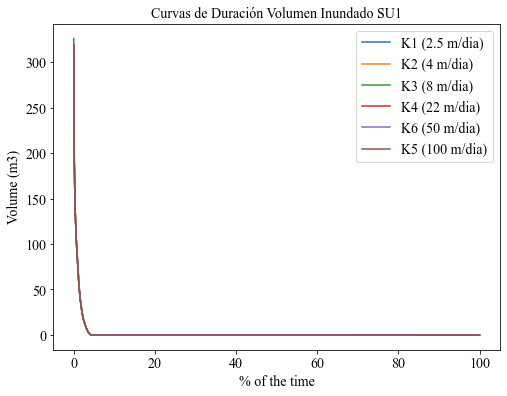

In [60]:
plt.figure(figsize=(8,6))
plt.plot(FSU1_K1_TS_df_sort["% Tiempo"], FSU1_K1_TS_df_sort["Volume (m3)"], label="K1 (2.5 m/dia)")
plt.plot(FSU1_K2_TS_df_sort["% Tiempo"], FSU1_K2_TS_df_sort["Volume (m3)"], label="K2 (4 m/dia)")
plt.plot(FSU1_K3_TS_df_sort["% Tiempo"], FSU1_K3_TS_df_sort["Volume (m3)"], label="K3 (8 m/dia)")
plt.plot(FSU1_K4_TS_df_sort["% Tiempo"], FSU1_K4_TS_df_sort["Volume (m3)"], label="K4 (22 m/dia)")
plt.plot(FSU1_K6_TS_df_sort["% Tiempo"], FSU1_K6_TS_df_sort["Volume (m3)"], label="K6 (50 m/dia)")
plt.plot(FSU1_K5_TS_df_sort["% Tiempo"], FSU1_K5_TS_df_sort["Volume (m3)"], label="K5 (100 m/dia)")
plt.ylabel("Volume (m3)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Volumen Inundado SU1")

## Subcatchments

In [61]:
# xls=pd.ExcelFile('Iteracion3/S_SWMM_TS.xls')
# dict_S_SWMM_TS = pd.read_excel(xls, sheet_name=None)
# S_SWMM_TS=list(dict_S_SWMM_TS.values())

In [62]:
# S_name="S25"
# i=S_names_list.index(S_name)

In [63]:
# f, (ax1, ax2, ax4, ax5) = plt.subplots(4,1, figsize=(10,13))
# ax1.plot(S_SWMM_TS[i].Time,S_SWMM_TS[i]["Precipitation (mm/h)"], label=S_name,linestyle="--" )
# ax1.set_ylabel("Precipitation (mm/h)")
# ax1.legend()
# ax2.plot(S_SWMM_TS[i].Time, S_SWMM_TS[i]["Infiltration (mm/h)"], label=S_name,linestyle="--"  )
# ax2.set_ylabel("Infiltration (mm/h)")
# ax2.legend()
# # ax3.plot(S_SWMM_TS[i].Time,S_SWMM_TS[i]["Cumulative Infiltration (m3)"], label=S_name,linestyle="--" )
# # ax3.set_ylabel("Cumulative Infiltration (m3)")
# #ax3.legend()
# ax4.plot(S_SWMM_TS[i].Time,S_SWMM_TS[i]["Runoff (m3/s)"], label=S_name,linestyle="--" )
# ax4.legend()
# ax4.set_ylabel("Runoff (m3/s)")
# ax5.plot(S_SWMM_TS[i].Time,S_SWMM_TS[i]["Evaporation (mm/d)"], label=S_name,linestyle="--" )
# ax5.legend()
# ax5.set_ylabel("Evaporation (mm/d)")
# f.suptitle("Subcatchment Time Series",fontsize=16)
# plt.show()

## Junctions

In [64]:
xls=pd.ExcelFile('Iteracion_inf_2/J_SWMM_TS.xls')
dict_J_SWMM_TS = pd.read_excel(xls, sheet_name=None)
J_SWMM_TS=list(dict_J_SWMM_TS.values())

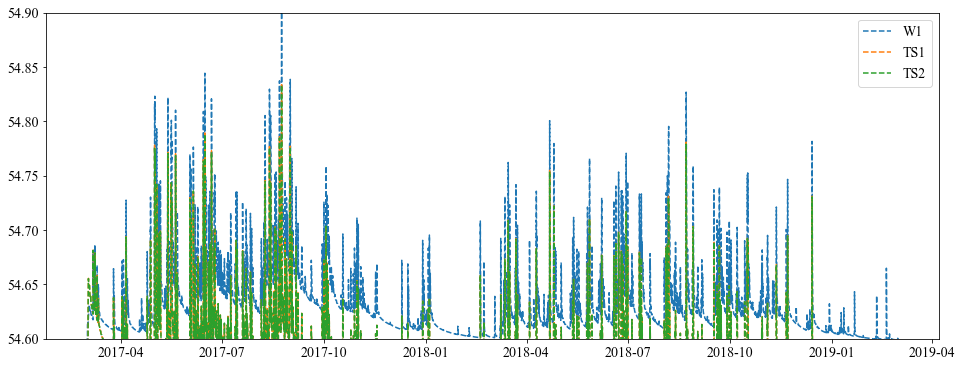

In [65]:
J_name1="W1"
J_name2="TS1"
J_name3="TS2"
i=WSU_names_list.index(J_name1)
j=J_names_list.index(J_name2)
k=J_names_list.index(J_name3)
plt.figure(figsize=(16,6))
plt.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Head (m)"], label=J_name1,linestyle="--" )
plt.plot(J_SWMM_TS[j].Time,J_SWMM_TS[j]["Head (m)"], label=J_name2,linestyle="--" )
plt.plot(J_SWMM_TS[k].Time,J_SWMM_TS[k]["Head (m)"], label=J_name3,linestyle="--" )
plt.ylim(54.6,54.9)
plt.legend()

In [66]:
# J_name1="N2"
# j=J_names_list.index(J_name1)
# plt.figure(figsize=(16,6))
# plt.plot(J_SWMM_TS[j].Time,J_SWMM_TS[j]["Total inflow (m3/s)"], label="Total inflow (m3/s)",linestyle="--" )
# plt.plot(J_SWMM_TS[j].Time,J_SWMM_TS[j]["Total outflow (m3/s)"], label="Total outflow (m3/s)",linestyle="--" )
# plt.legend()

## Weirs and Orifices

In [67]:
xls=pd.ExcelFile('Iteracion_C_2/V_SWMM_TS.xls')
dict_V_SWMM_TS = pd.read_excel(xls, sheet_name=None)
V_SWMM_TS=list(dict_V_SWMM_TS.values())

In [68]:
V_name="O2"
i=V_names_list.index(V_name)

Text(0, 0.5, 'Depth (m)')

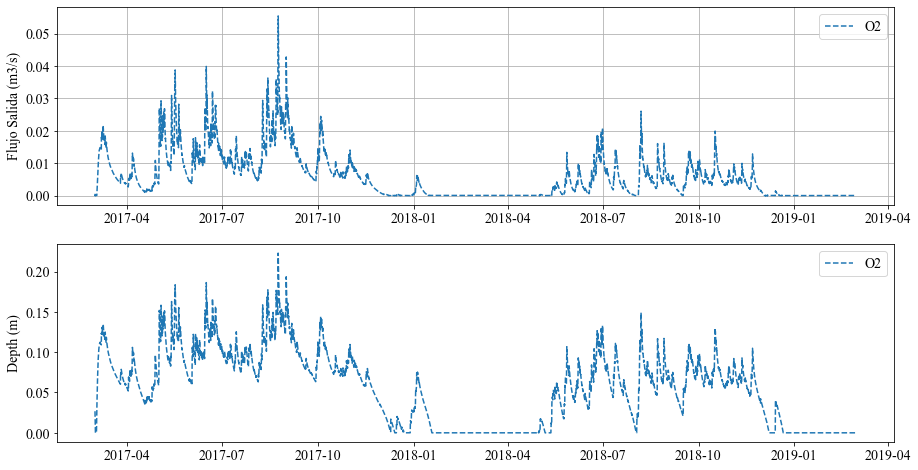

In [69]:
f, (ax1, ax2) = plt.subplots(2,1, figsize=(15,8))
ax1.plot(V_SWMM_TS[i].Time,V_SWMM_TS[i]["Flow (m3/s)"], label=V_name,linestyle="--" )
ax1.legend()
ax1.grid()
ax1.set_ylabel("Flujo Salida (m3/s)")
ax2.plot(V_SWMM_TS[i].Time,V_SWMM_TS[i]["Depth (m)"],label=V_name,linestyle="--" )
ax2.legend()
ax2.set_ylabel("Depth (m)")

## Conduits

In [70]:
xls=pd.ExcelFile('Iteracion_C_2/C_SWMM_TS.xls')
dict_C_SWMM_TS = pd.read_excel(xls, sheet_name=None)
C_SWMM_TS=list(dict_C_SWMM_TS.values())

In [71]:
C_name="C26"
i=C_names_list.index(C_name)

Text(0, 0.5, 'Depth (m)')

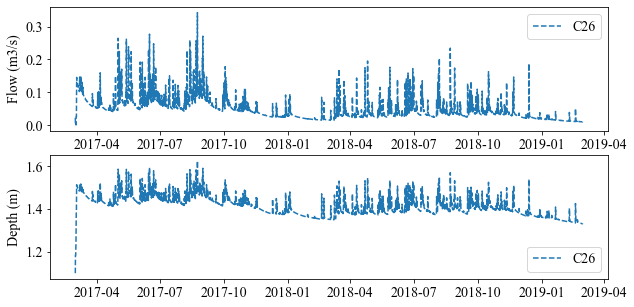

In [72]:
f, (ax1, ax2) = plt.subplots(2,1, figsize=(10,5))
ax1.plot(C_SWMM_TS[i].Time,C_SWMM_TS[i]["Flow (m3/s)"], label=C_name,linestyle="--" )
ax1.legend()
ax1.set_ylabel("Flow (m3/s)")
ax2.plot(C_SWMM_TS[i].Time,C_SWMM_TS[i]["Depth (m)"],label=C_name,linestyle="--" )
ax2.legend()
ax2.set_ylabel("Depth (m)")

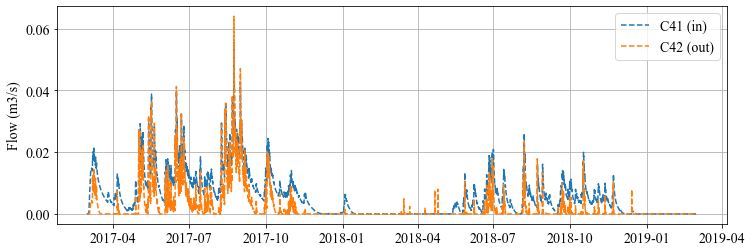

In [73]:
#Analisis para helechos
i=C_names_list.index("C41")
j=C_names_list.index("C42")
f, (ax1) = plt.subplots(1,1, figsize=(12,4))
ax1.plot(C_SWMM_TS[i].Time,C_SWMM_TS[i]["Flow (m3/s)"], label="C41 (in)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Flow (m3/s)")
ax1.plot(C_SWMM_TS[j].Time,C_SWMM_TS[j]["Flow (m3/s)"], label="C42 (out)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Flow (m3/s)")
plt.grid()

## Zonde Budget: RCH - DRN

In [74]:
def import_xls_2(path):
    xls=pd.ExcelFile(path)
    dict_TS=pd.read_excel(xls, sheet_name=None)
    lista=list(dict_TS.values())
    return(lista)

In [75]:
date_rng = pd.date_range(start='2017-03-01', end='2019-02-28', freq='D')
len(date_rng)

730

In [76]:
ZB_by_zone_K1=import_xls_2('Iteracion_K_1/ZB_by_zone.xls') #2.5
ZB_by_zone_K2=import_xls_2('Iteracion_K_2/ZB_by_zone.xls') #3.95
ZB_by_zone_K3=import_xls_2('Iteracion_K_3/ZB_by_zone.xls') #7.85
ZB_by_zone_K4=import_xls_2('Iteracion_K_4/ZB_by_zone.xls') #22
ZB_by_zone_K5=import_xls_2('Iteracion_K_5/ZB_by_zone.xls') #103.4
ZB_by_zone_K6=import_xls_2('Iteracion_K_6/ZB_by_zone.xls') #50

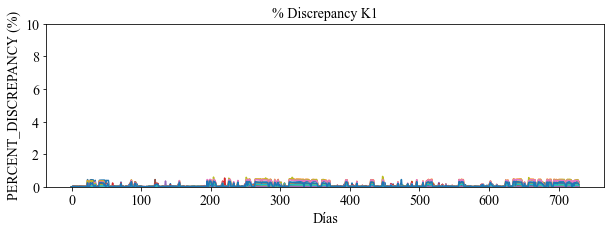

In [77]:
for i in range(len(ZB_by_zone_K1)):
    ZB_by_zone_K1[i]["PERCENT_DISCREPANCY"].plot(figsize=(10,3))
plt.ylabel("PERCENT_DISCREPANCY (%)")
plt.xlabel("Días")
plt.title("% Discrepancy K1")
plt.ylim((0,10))
plt.show()

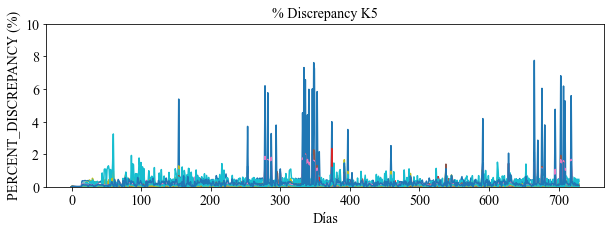

In [78]:
for i in range(len(ZB_by_zone_K5)):
    ZB_by_zone_K5[i]["PERCENT_DISCREPANCY"].plot(figsize=(10,3))
plt.ylabel("PERCENT_DISCREPANCY (%)")
plt.xlabel("Días")
plt.title("% Discrepancy K5")
plt.ylim((0,10))
plt.show()

In [79]:
rch_drn_K1=import_xls_2('Iteracion_K_1/rch_drn.xls') #2.5
rch_drn_K2=import_xls_2('Iteracion_K_2/rch_drn.xls') #3.95
rch_drn_K3=import_xls_2('Iteracion_K_3/rch_drn.xls') #7.85
rch_drn_K4=import_xls_2('Iteracion_K_4/rch_drn.xls') #22
rch_drn_K5=import_xls_2('Iteracion_K_5/rch_drn.xls') #103.4
rch_drn_K6=import_xls_2('Iteracion_K_6/rch_drn.xls') #50

In [80]:
def rch_drn_S_WSU(rch_drn):
    
    S_rch_df=rch_drn[0].set_index(date_rng)
    S_drn_df=rch_drn[1].set_index(date_rng)
    WSU_rch_df=rch_drn[2].set_index(date_rng)
    WSU_drn_df=rch_drn[3].set_index(date_rng)

    WSU_drn_df=WSU_drn_df.drop(columns=["Unnamed: 0"])
    WSU_rch_df=WSU_rch_df.drop(columns=["Unnamed: 0"])
    S_drn_df=S_drn_df.drop(columns=["Unnamed: 0"])
    S_rch_df=S_rch_df.drop(columns=["Unnamed: 0"])
    
    return(WSU_drn_df,WSU_rch_df, S_drn_df, S_rch_df)
#0: WSU drn
#1: WSU rch
#2: S drn
#3: S rch

In [81]:
rch_drn_K1_S_WSU=rch_drn_S_WSU(rch_drn_K1)
rch_drn_K2_S_WSU=rch_drn_S_WSU(rch_drn_K2)
rch_drn_K3_S_WSU=rch_drn_S_WSU(rch_drn_K3)
rch_drn_K4_S_WSU=rch_drn_S_WSU(rch_drn_K4)
rch_drn_K5_S_WSU=rch_drn_S_WSU(rch_drn_K5)
rch_drn_K6_S_WSU=rch_drn_S_WSU(rch_drn_K6)

### Humedal Baquedano

Text(0.5, 1.0, 'DRN rate Baquedano')

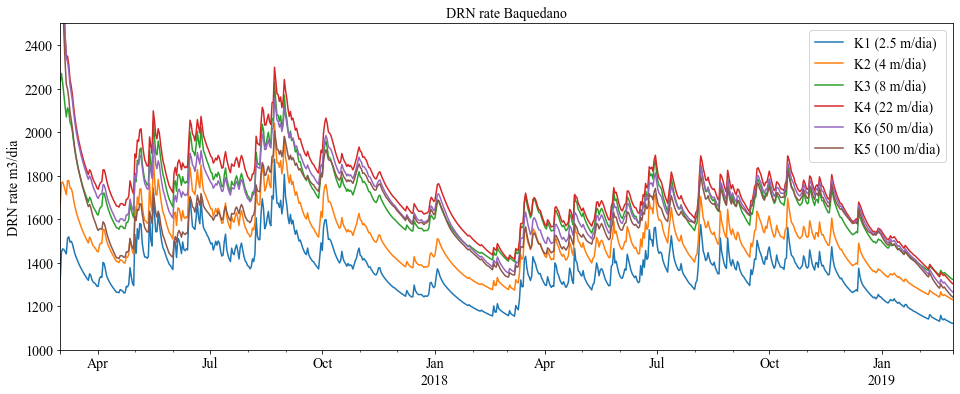

In [82]:
rch_drn_K1_S_WSU[0].W1.plot(label="K1 (2.5 m/dia)", figsize=(16,6))
rch_drn_K2_S_WSU[0].W1.plot(label="K2 (4 m/dia)")
rch_drn_K3_S_WSU[0].W1.plot(label="K3 (8 m/dia)")
rch_drn_K4_S_WSU[0].W1.plot(label="K4 (22 m/dia)")
rch_drn_K6_S_WSU[0].W1.plot(label="K6 (50 m/dia)")
rch_drn_K5_S_WSU[0].W1.plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("DRN rate m3/dia")
plt.ylim([1000,2500])
plt.title("DRN rate Baquedano")

Text(0.5, 1.0, 'RCH rate Baquedano')

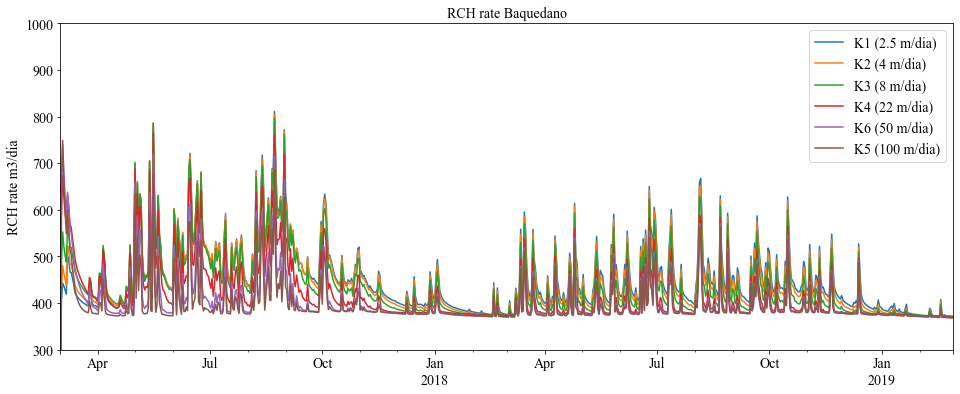

In [83]:
rch_drn_K1_S_WSU[1].W1.plot(label="K1 (2.5 m/dia)", figsize=(16,6))
rch_drn_K2_S_WSU[1].W1.plot(label="K2 (4 m/dia)")
rch_drn_K3_S_WSU[1].W1.plot(label="K3 (8 m/dia)")
rch_drn_K4_S_WSU[1].W1.plot(label="K4 (22 m/dia)")
rch_drn_K6_S_WSU[1].W1.plot(label="K6 (50 m/dia)")
rch_drn_K5_S_WSU[1].W1.plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.ylim([300,1000])
plt.title("RCH rate Baquedano")

Text(0.5, 1.0, 'DRN rate Baquedano + S10')

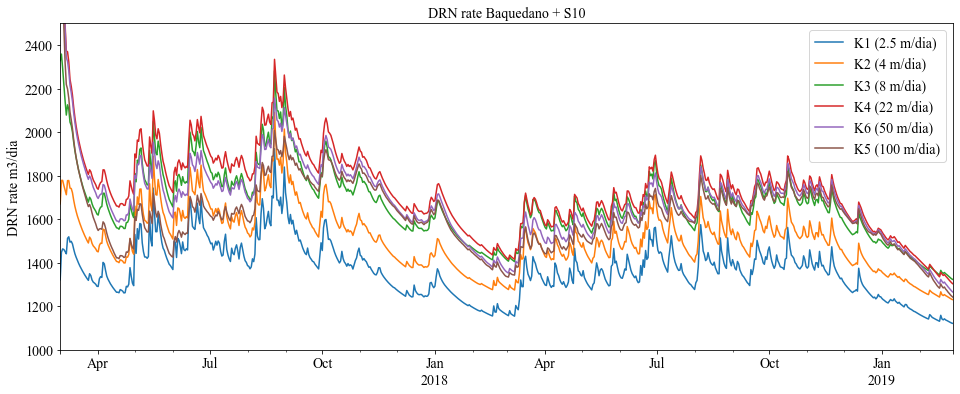

In [84]:
(rch_drn_K1_S_WSU[0].W1+rch_drn_K1_S_WSU[2].S10).plot(label="K1 (2.5 m/dia)", figsize=(16,6))
(rch_drn_K2_S_WSU[0].W1+rch_drn_K2_S_WSU[2].S10).plot(label="K2 (4 m/dia)")
(rch_drn_K3_S_WSU[0].W1+rch_drn_K3_S_WSU[2].S10).plot(label="K3 (8 m/dia)")
(rch_drn_K4_S_WSU[0].W1+rch_drn_K4_S_WSU[2].S10).plot(label="K4 (22 m/dia)")
(rch_drn_K6_S_WSU[0].W1+rch_drn_K6_S_WSU[2].S10).plot(label="K6 (50 m/dia)")
(rch_drn_K5_S_WSU[0].W1+rch_drn_K5_S_WSU[2].S10).plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("DRN rate m3/dia")
plt.ylim([1000,2500])
plt.title("DRN rate Baquedano + S10")

In [85]:
# (rch_drn_C2_S_WSU[0]["2017-06-01":"2019-01-31"].W1+rch_drn_C2_S_WSU[2]["2017-06-01":"2019-01-31"].S10-rch_drn_C2_S_WSU[1]["2017-06-01":"2019-01-31"].W1).plot(figsize=(16,6))
# # (rch_drn_K1_S_WSU[0].W1+rch_drn_K1_S_WSU[2].S10-rch_drn_K1_S_WSU[1].W1).plot(label="K1 (2.5 m/dia)", figsize=(16,6))
# # (rch_drn_K2_S_WSU[0].W1+rch_drn_K2_S_WSU[2].S10-rch_drn_K2_S_WSU[1].W1).plot(label="K2 (4 m/dia)")
# # (rch_drn_K3_S_WSU[0].W1+rch_drn_K3_S_WSU[2].S10-rch_drn_K3_S_WSU[1].W1).plot(label="K3 (8 m/dia)")
# # (rch_drn_K4_S_WSU[0].W1+rch_drn_K4_S_WSU[2].S10-rch_drn_K4_S_WSU[1].W1).plot(label="K4 (22 m/dia)")
# # (rch_drn_K6_S_WSU[0].W1+rch_drn_K6_S_WSU[2].S10-rch_drn_K6_S_WSU[1].W1).plot(label="K6 (50 m/dia)")
# # (rch_drn_K5_S_WSU[0].W1+rch_drn_K5_S_WSU[2].S10-rch_drn_K5_S_WSU[1].W1).plot(label="K5 (100 m/dia)")
# # plt.legend()
# plt.ylabel("m3/dia")
# #plt.ylim([500,2000])
# plt.title("Flujo Neto Baquedano")
# plt.grid()

### Humedal El Loto

Text(0.5, 1.0, 'DRN rate El Loto')

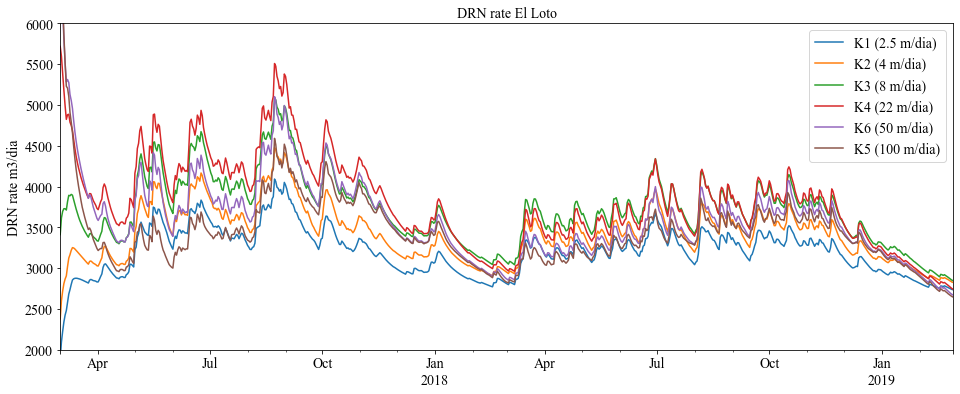

In [86]:
rch_drn_K1_S_WSU[0].W2.plot(label="K1 (2.5 m/dia)", figsize=(16,6))
rch_drn_K2_S_WSU[0].W2.plot(label="K2 (4 m/dia)")
rch_drn_K3_S_WSU[0].W2.plot(label="K3 (8 m/dia)")
rch_drn_K4_S_WSU[0].W2.plot(label="K4 (22 m/dia)")
rch_drn_K6_S_WSU[0].W2.plot(label="K6 (50 m/dia)")
rch_drn_K5_S_WSU[0].W2.plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("DRN rate m3/dia")
plt.ylim([2000,6000])
plt.title("DRN rate El Loto")

Text(0.5, 1.0, 'DRN  El Loto + S16 + S17 + S23')

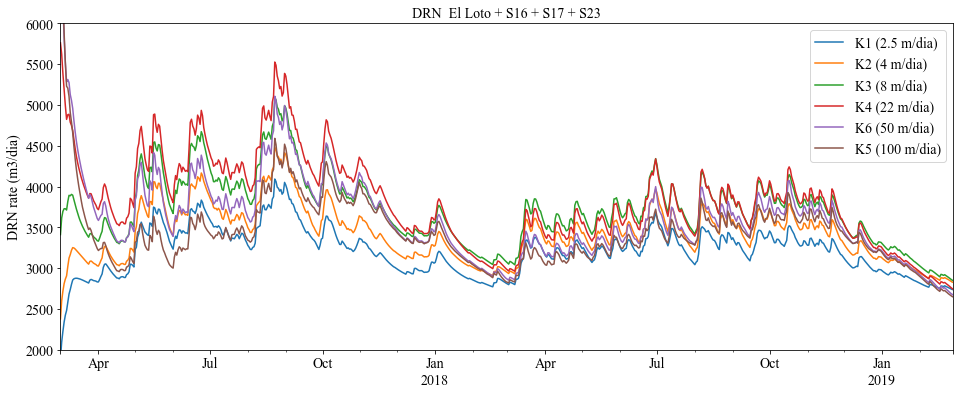

In [87]:
(rch_drn_K1_S_WSU[0].W2+rch_drn_K1_S_WSU[2].S16+rch_drn_K1_S_WSU[2].S17+rch_drn_K1_S_WSU[2].S23).plot(label="K1 (2.5 m/dia)", figsize=(16,6))
(rch_drn_K2_S_WSU[0].W2+rch_drn_K2_S_WSU[2].S16+rch_drn_K2_S_WSU[2].S17+rch_drn_K2_S_WSU[2].S23).plot(label="K2 (4 m/dia)")
(rch_drn_K3_S_WSU[0].W2+rch_drn_K3_S_WSU[2].S16+rch_drn_K3_S_WSU[2].S17+rch_drn_K3_S_WSU[2].S23).plot(label="K3 (8 m/dia)")
(rch_drn_K4_S_WSU[0].W2+rch_drn_K4_S_WSU[2].S16+rch_drn_K4_S_WSU[2].S17+rch_drn_K4_S_WSU[2].S23).plot(label="K4 (22 m/dia)")
(rch_drn_K6_S_WSU[0].W2+rch_drn_K6_S_WSU[2].S16+rch_drn_K6_S_WSU[2].S17+rch_drn_K6_S_WSU[2].S23).plot(label="K6 (50 m/dia)")
(rch_drn_K5_S_WSU[0].W2+rch_drn_K5_S_WSU[2].S16+rch_drn_K5_S_WSU[2].S17+rch_drn_K5_S_WSU[2].S23).plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
plt.ylim([2000,6000])
plt.title("DRN  El Loto + S16 + S17 + S23")

Text(0.5, 1.0, 'RCH El Loto')

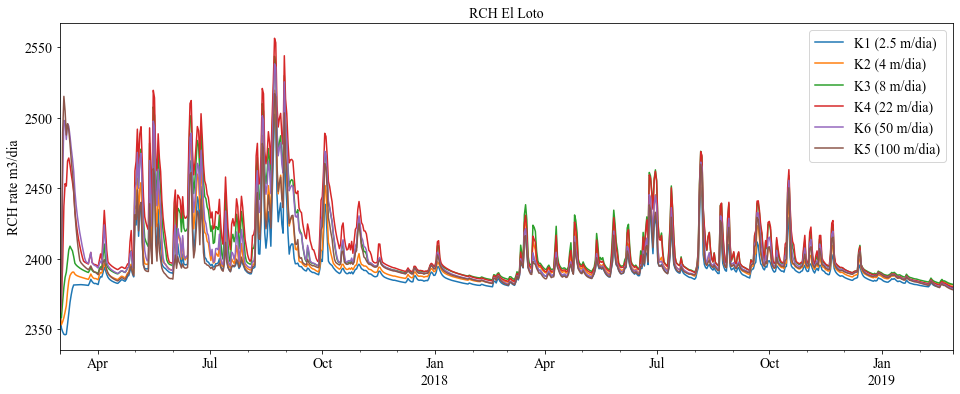

In [88]:
rch_drn_K1_S_WSU[1].W2.plot(label="K1 (2.5 m/dia)", figsize=(16,6))
rch_drn_K2_S_WSU[1].W2.plot(label="K2 (4 m/dia)")
rch_drn_K3_S_WSU[1].W2.plot(label="K3 (8 m/dia)")
rch_drn_K4_S_WSU[1].W2.plot(label="K4 (22 m/dia)")
rch_drn_K6_S_WSU[1].W2.plot(label="K6 (50 m/dia)")
rch_drn_K5_S_WSU[1].W2.plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("RCH rate m3/dia")
#plt.ylim([300,1000])
plt.title("RCH El Loto")

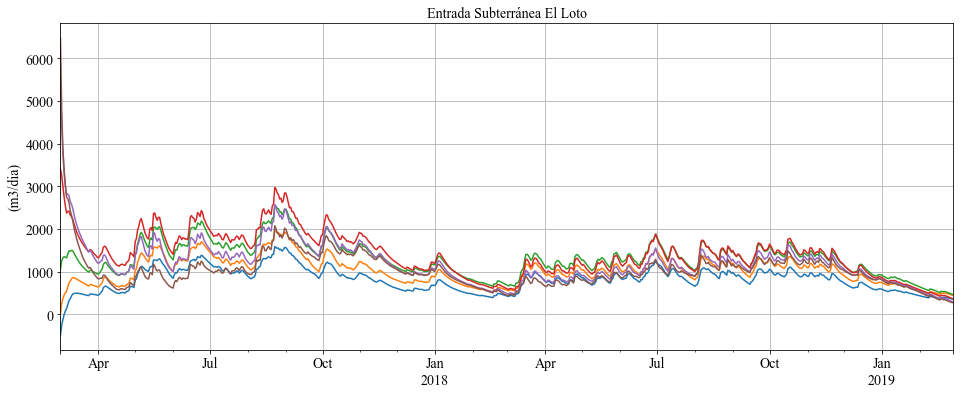

In [89]:
#(rch_drn_C2_S_WSU[0]["2017-06-01":"2019-01-31"].W2+rch_drn_C2_S_WSU[2]["2017-06-01":"2019-01-31"].S16+rch_drn_C2_S_WSU[2]["2017-06-01":"2019-01-31"].S17+rch_drn_C2_S_WSU[2]["2017-06-01":"2019-01-31"].S23-rch_drn_C2_S_WSU[1]["2017-06-01":"2019-01-31"].W2).plot(figsize=(16,6))
(rch_drn_K1_S_WSU[0].W2+rch_drn_K1_S_WSU[2].S16+rch_drn_K1_S_WSU[2].S17+rch_drn_K1_S_WSU[2].S23-rch_drn_K1_S_WSU[1].W2).plot(label="K1 (2.5 m/dia)", figsize=(16,6))
(rch_drn_K2_S_WSU[0].W2+rch_drn_K2_S_WSU[2].S16+rch_drn_K2_S_WSU[2].S17+rch_drn_K2_S_WSU[2].S23-rch_drn_K2_S_WSU[1].W2).plot(label="K2 (4 m/dia)")
(rch_drn_K3_S_WSU[0].W2+rch_drn_K3_S_WSU[2].S16+rch_drn_K3_S_WSU[2].S17+rch_drn_K3_S_WSU[2].S23-rch_drn_K3_S_WSU[1].W2).plot(label="K3 (8 m/dia)")
(rch_drn_K4_S_WSU[0].W2+rch_drn_K4_S_WSU[2].S16+rch_drn_K4_S_WSU[2].S17+rch_drn_K4_S_WSU[2].S23-rch_drn_K4_S_WSU[1].W2).plot(label="K4 (22 m/dia)")
(rch_drn_K6_S_WSU[0].W2+rch_drn_K6_S_WSU[2].S16+rch_drn_K6_S_WSU[2].S17+rch_drn_K6_S_WSU[2].S23-rch_drn_K6_S_WSU[1].W2).plot(label="K6 (50 m/dia)")
(rch_drn_K5_S_WSU[0].W2+rch_drn_K5_S_WSU[2].S16+rch_drn_K5_S_WSU[2].S17+rch_drn_K5_S_WSU[2].S23-rch_drn_K5_S_WSU[1].W2).plot(label="K5 (100 m/dia)")
#plt.legend()
plt.ylabel("(m3/dia)")
plt.title("Entrada Subterránea El Loto")
plt.grid()

In [90]:
def curva_duracion_FN(FN):
    df_FN=pd.DataFrame(FN[30:-1])
    df_FN.columns = ['Volume (m3)']
    FN_df_sort=df_FN.sort_values(by=["Volume (m3)"], ascending=False)
    FN_df_sort= FN_df_sort.reset_index(drop=True)
    FN_df_sort["% Tiempo"]=(FN_df_sort.index+1)/(len(FN_df_sort)+1)*100
    return(FN_df_sort)

In [91]:
flujo_neto_W2_K1=rch_drn_K1_S_WSU[0].W2+rch_drn_K1_S_WSU[2].S16+rch_drn_K1_S_WSU[2].S17+rch_drn_K1_S_WSU[2].S23-rch_drn_K1_S_WSU[1].W2
flujo_neto_W2_K2=rch_drn_K2_S_WSU[0].W2+rch_drn_K2_S_WSU[2].S16+rch_drn_K2_S_WSU[2].S17+rch_drn_K2_S_WSU[2].S23-rch_drn_K2_S_WSU[1].W2
flujo_neto_W2_K3=rch_drn_K3_S_WSU[0].W2+rch_drn_K3_S_WSU[2].S16+rch_drn_K3_S_WSU[2].S17+rch_drn_K3_S_WSU[2].S23-rch_drn_K3_S_WSU[1].W2
flujo_neto_W2_K4=rch_drn_K4_S_WSU[0].W2+rch_drn_K4_S_WSU[2].S16+rch_drn_K4_S_WSU[2].S17+rch_drn_K4_S_WSU[2].S23-rch_drn_K4_S_WSU[1].W2
flujo_neto_W2_K5=rch_drn_K5_S_WSU[0].W2+rch_drn_K5_S_WSU[2].S16+rch_drn_K5_S_WSU[2].S17+rch_drn_K5_S_WSU[2].S23-rch_drn_K5_S_WSU[1].W2
flujo_neto_W2_K6=rch_drn_K6_S_WSU[0].W2+rch_drn_K6_S_WSU[2].S16+rch_drn_K6_S_WSU[2].S17+rch_drn_K6_S_WSU[2].S23-rch_drn_K6_S_WSU[1].W2

In [92]:
cd_flujo_neto_K1_W2=curva_duracion_FN(flujo_neto_W2_K1)
cd_flujo_neto_K2_W2=curva_duracion_FN(flujo_neto_W2_K2)
cd_flujo_neto_K3_W2=curva_duracion_FN(flujo_neto_W2_K3)
cd_flujo_neto_K4_W2=curva_duracion_FN(flujo_neto_W2_K4)
cd_flujo_neto_K5_W2=curva_duracion_FN(flujo_neto_W2_K5)
cd_flujo_neto_K6_W2=curva_duracion_FN(flujo_neto_W2_K6)

Text(0.5, 1.0, 'Curvas de Duración Volumen Neto Loto')

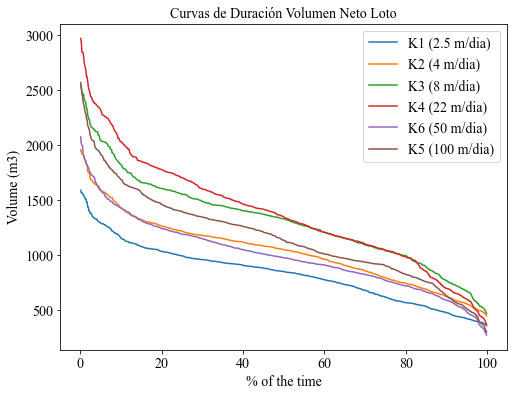

In [93]:
plt.figure(figsize=(8,6))
plt.plot(cd_flujo_neto_K1_W2["% Tiempo"], cd_flujo_neto_K1_W2["Volume (m3)"], label="K1 (2.5 m/dia)")
plt.plot(cd_flujo_neto_K2_W2["% Tiempo"], cd_flujo_neto_K2_W2["Volume (m3)"], label="K2 (4 m/dia)")
plt.plot(cd_flujo_neto_K3_W2["% Tiempo"], cd_flujo_neto_K3_W2["Volume (m3)"], label="K3 (8 m/dia)")
plt.plot(cd_flujo_neto_K4_W2["% Tiempo"], cd_flujo_neto_K4_W2["Volume (m3)"], label="K4 (22 m/dia)")
plt.plot(cd_flujo_neto_K5_W2["% Tiempo"], cd_flujo_neto_K5_W2["Volume (m3)"], label="K6 (50 m/dia)")
plt.plot(cd_flujo_neto_K6_W2["% Tiempo"], cd_flujo_neto_K6_W2["Volume (m3)"], label="K5 (100 m/dia)")
plt.ylabel("Volume (m3)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Volumen Neto Loto")

### Los Helechos

Text(0.5, 1.0, 'DRN Los Helechos')

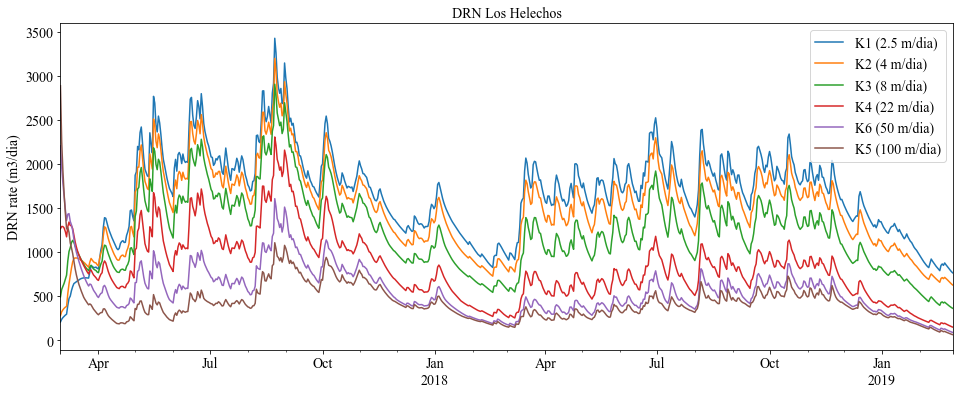

In [94]:
rch_drn_K1_S_WSU[0].W3.plot(label="K1 (2.5 m/dia)", figsize=(16,6))
rch_drn_K2_S_WSU[0].W3.plot(label="K2 (4 m/dia)")
rch_drn_K3_S_WSU[0].W3.plot(label="K3 (8 m/dia)")
rch_drn_K4_S_WSU[0].W3.plot(label="K4 (22 m/dia)")
rch_drn_K6_S_WSU[0].W3.plot(label="K6 (50 m/dia)")
rch_drn_K5_S_WSU[0].W3.plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
plt.title("DRN Los Helechos")

Text(0.5, 1.0, 'RCH Los Helechos')

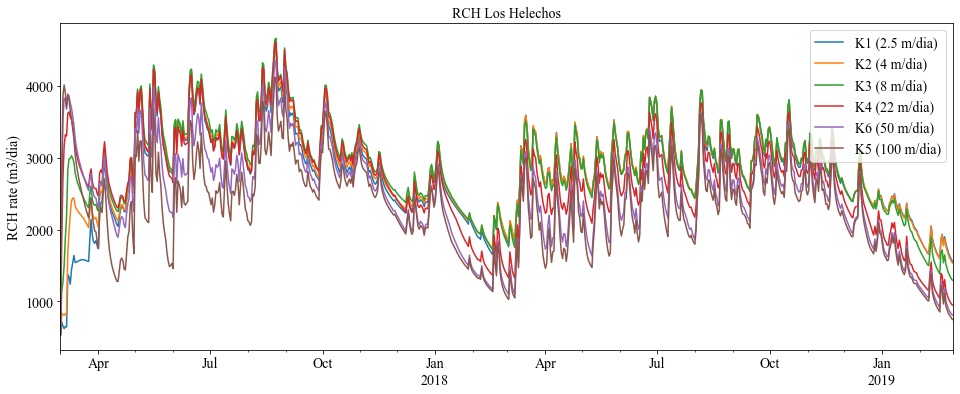

In [95]:
rch_drn_K1_S_WSU[1].W3.plot(label="K1 (2.5 m/dia)", figsize=(16,6))
rch_drn_K2_S_WSU[1].W3.plot(label="K2 (4 m/dia)")
rch_drn_K3_S_WSU[1].W3.plot(label="K3 (8 m/dia)")
rch_drn_K4_S_WSU[1].W3.plot(label="K4 (22 m/dia)")
rch_drn_K6_S_WSU[1].W3.plot(label="K6 (50 m/dia)")
rch_drn_K5_S_WSU[1].W3.plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("RCH rate (m3/dia)")
plt.title("RCH Los Helechos")

Text(0.5, 1.0, 'DRN Los Helechos + S29')

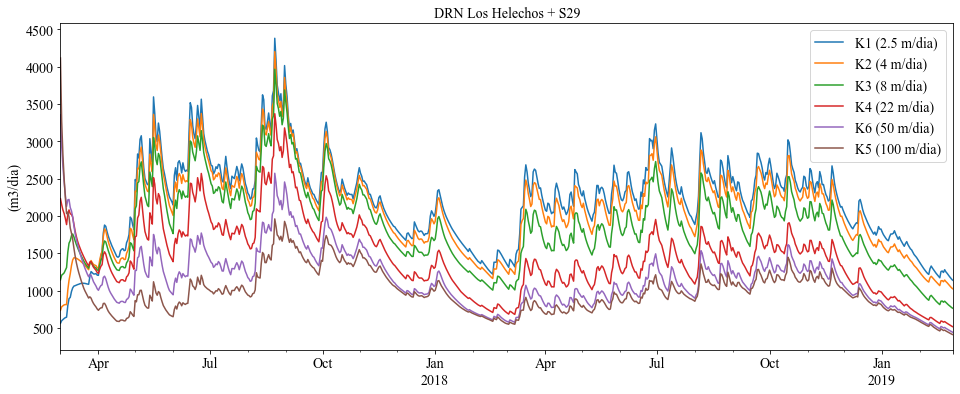

In [96]:
(rch_drn_K1_S_WSU[0].W3+rch_drn_K1_S_WSU[2].S29).plot(label="K1 (2.5 m/dia)", figsize=(16,6))
(rch_drn_K2_S_WSU[0].W3+rch_drn_K2_S_WSU[2].S29).plot(label="K2 (4 m/dia)")
(rch_drn_K3_S_WSU[0].W3+rch_drn_K3_S_WSU[2].S29).plot(label="K3 (8 m/dia)")
(rch_drn_K4_S_WSU[0].W3+rch_drn_K4_S_WSU[2].S29).plot(label="K4 (22 m/dia)")
(rch_drn_K6_S_WSU[0].W3+rch_drn_K6_S_WSU[2].S29).plot(label="K6 (50 m/dia)")
(rch_drn_K5_S_WSU[0].W3+rch_drn_K5_S_WSU[2].S29).plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("(m3/dia)")
plt.title("DRN Los Helechos + S29")

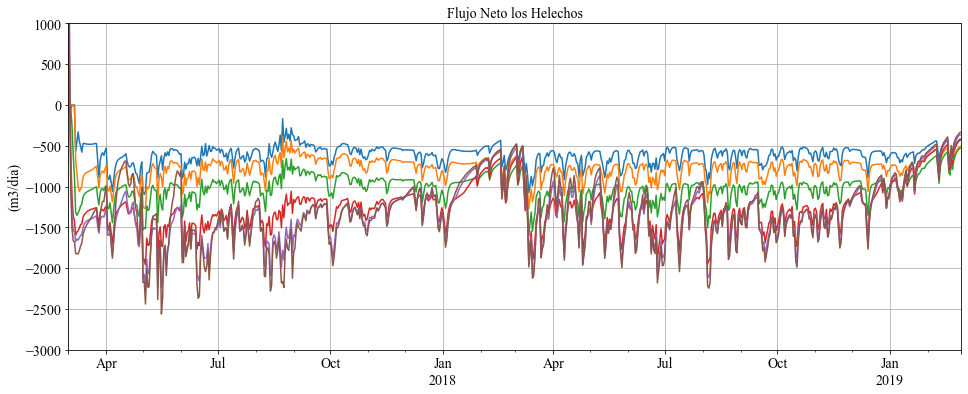

In [97]:
#(rch_drn_C2_S_WSU[0]["2017-06-01":"2019-01-31"].W3+rch_drn_C2_S_WSU[2]["2017-06-01":"2019-01-31"].S29-rch_drn_C2_S_WSU[1]["2017-06-01":"2019-01-31"].W3).plot( figsize=(16,6))
(rch_drn_K1_S_WSU[0].W3+rch_drn_K1_S_WSU[2].S29-rch_drn_K1_S_WSU[1].W3).plot(label="K1 (2.5 m/dia)", figsize=(16,6))
(rch_drn_K2_S_WSU[0].W3+rch_drn_K2_S_WSU[2].S29-rch_drn_K2_S_WSU[1].W3).plot(label="K2 (4 m/dia)")
(rch_drn_K3_S_WSU[0].W3+rch_drn_K3_S_WSU[2].S29-rch_drn_K3_S_WSU[1].W3).plot(label="K3 (8 m/dia)")
(rch_drn_K4_S_WSU[0].W3+rch_drn_K4_S_WSU[2].S29-rch_drn_K4_S_WSU[1].W3).plot(label="K4 (22 m/dia)")
(rch_drn_K6_S_WSU[0].W3+rch_drn_K6_S_WSU[2].S29-rch_drn_K6_S_WSU[1].W3).plot(label="K6 (50 m/dia)")
(rch_drn_K5_S_WSU[0].W3+rch_drn_K5_S_WSU[2].S29-rch_drn_K5_S_WSU[1].W3).plot(label="K5 (100 m/dia)")
#plt.legend()
plt.ylabel("(m3/dia)")
plt.ylim(-3000, 1000)
plt.title("Flujo Neto los Helechos")
plt.grid()


### Las Ranas

Text(0.5, 1.0, 'DRN La Ranas')

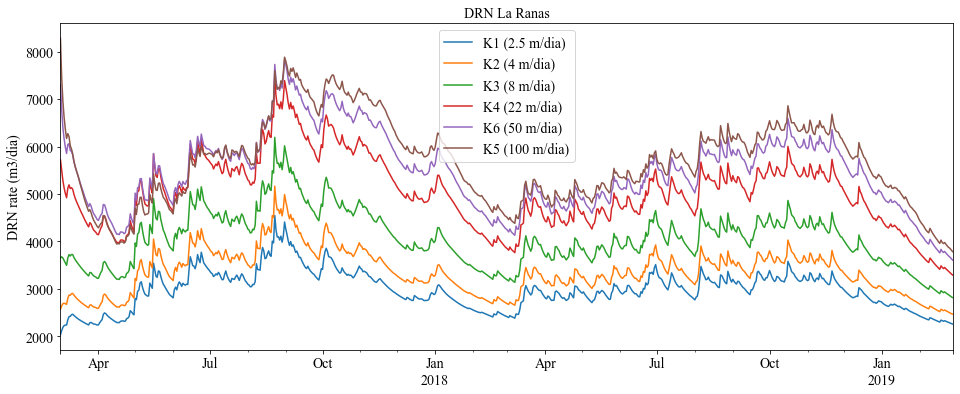

In [98]:
rch_drn_K1_S_WSU[0].W4.plot(label="K1 (2.5 m/dia)", figsize=(16,6))
rch_drn_K2_S_WSU[0].W4.plot(label="K2 (4 m/dia)")
rch_drn_K3_S_WSU[0].W4.plot(label="K3 (8 m/dia)")
rch_drn_K4_S_WSU[0].W4.plot(label="K4 (22 m/dia)")
rch_drn_K6_S_WSU[0].W4.plot(label="K6 (50 m/dia)")
rch_drn_K5_S_WSU[0].W4.plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
#plt.ylim([2000,6000])
plt.title("DRN La Ranas")

Text(0.5, 1.0, 'RCH La Ranas')

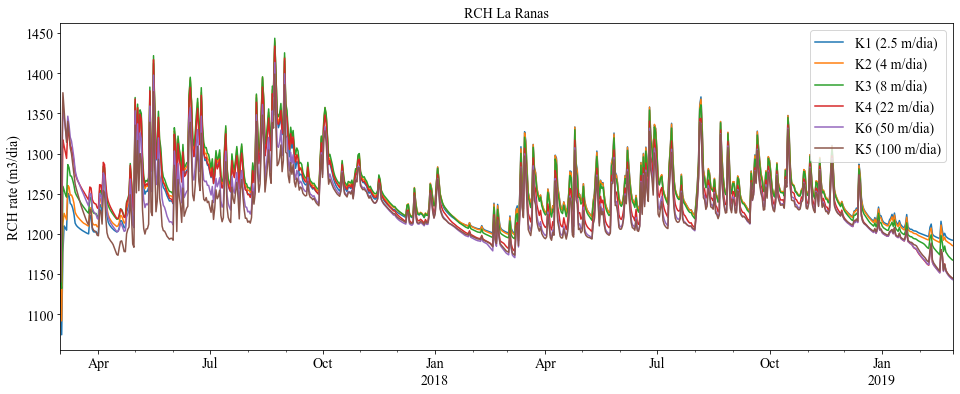

In [99]:
rch_drn_K1_S_WSU[1].W4.plot(label="K1 (2.5 m/dia)", figsize=(16,6))
rch_drn_K2_S_WSU[1].W4.plot(label="K2 (4 m/dia)")
rch_drn_K3_S_WSU[1].W4.plot(label="K3 (8 m/dia)")
rch_drn_K4_S_WSU[1].W4.plot(label="K4 (22 m/dia)")
rch_drn_K6_S_WSU[1].W4.plot(label="K6 (50 m/dia)")
rch_drn_K5_S_WSU[1].W4.plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("RCH rate (m3/dia)")
#plt.ylim([2000,6000])
plt.title("RCH La Ranas")

Text(0.5, 1.0, 'DRN La Ranas + S31 + S33 + S34')

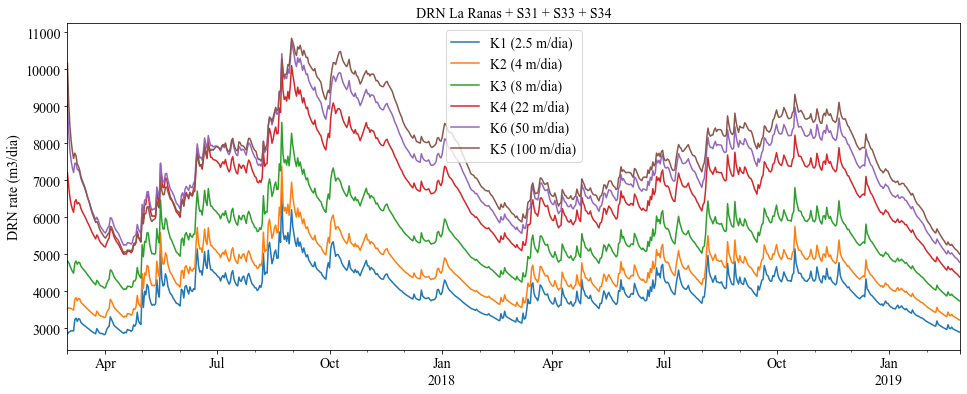

In [100]:
(rch_drn_K1_S_WSU[0].W4+rch_drn_K1_S_WSU[2].S31+rch_drn_K1_S_WSU[2].S33+rch_drn_K1_S_WSU[2].S34).plot(label="K1 (2.5 m/dia)", figsize=(16,6))
(rch_drn_K2_S_WSU[0].W4+rch_drn_K2_S_WSU[2].S31+rch_drn_K2_S_WSU[2].S33+rch_drn_K2_S_WSU[2].S34).plot(label="K2 (4 m/dia)")
(rch_drn_K3_S_WSU[0].W4+rch_drn_K3_S_WSU[2].S31+rch_drn_K3_S_WSU[2].S33+rch_drn_K3_S_WSU[2].S34).plot(label="K3 (8 m/dia)")
(rch_drn_K4_S_WSU[0].W4+rch_drn_K4_S_WSU[2].S31+rch_drn_K4_S_WSU[2].S33+rch_drn_K4_S_WSU[2].S34).plot(label="K4 (22 m/dia)")
(rch_drn_K6_S_WSU[0].W4+rch_drn_K6_S_WSU[2].S31+rch_drn_K6_S_WSU[2].S33+rch_drn_K6_S_WSU[2].S34).plot(label="K6 (50 m/dia)")
(rch_drn_K5_S_WSU[0].W4+rch_drn_K5_S_WSU[2].S31+rch_drn_K5_S_WSU[2].S33+rch_drn_K5_S_WSU[2].S34).plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
plt.title("DRN La Ranas + S31 + S33 + S34")

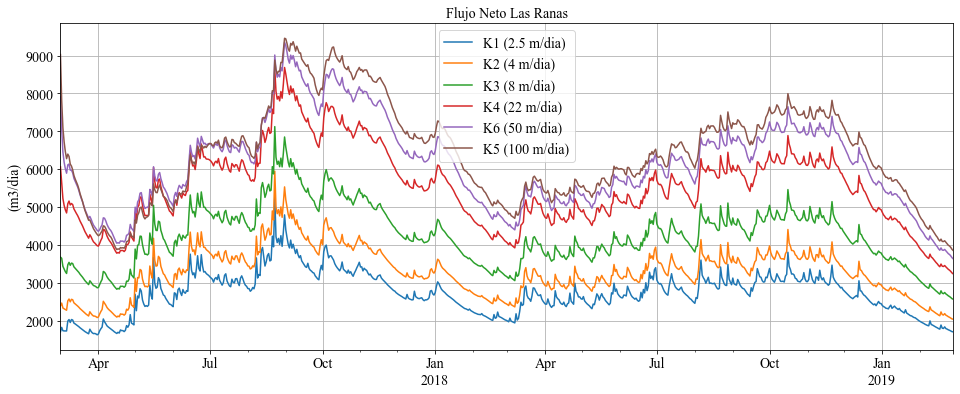

In [101]:
# (rch_drn_C2_S_WSU[0]["2017-06-01":"2019-01-31"].W4+rch_drn_C2_S_WSU[2]["2017-06-01":"2019-01-31"].S31+rch_drn_C2_S_WSU[2]["2017-06-01":"2019-01-31"].S33+rch_drn_C2_S_WSU[2]["2017-06-01":"2019-01-31"].S34-rch_drn_C2_S_WSU[1]["2017-06-01":"2019-01-31"].W4).plot(figsize=(16,6))
(rch_drn_K1_S_WSU[0].W4+rch_drn_K1_S_WSU[2].S31+rch_drn_K1_S_WSU[2].S33+rch_drn_K1_S_WSU[2].S34-rch_drn_K1_S_WSU[1].W4).plot(label="K1 (2.5 m/dia)", figsize=(16,6))
(rch_drn_K2_S_WSU[0].W4+rch_drn_K2_S_WSU[2].S31+rch_drn_K2_S_WSU[2].S33+rch_drn_K2_S_WSU[2].S34-rch_drn_K2_S_WSU[1].W4).plot(label="K2 (4 m/dia)")
(rch_drn_K3_S_WSU[0].W4+rch_drn_K3_S_WSU[2].S31+rch_drn_K3_S_WSU[2].S33+rch_drn_K3_S_WSU[2].S34-rch_drn_K3_S_WSU[1].W4).plot(label="K3 (8 m/dia)")
(rch_drn_K4_S_WSU[0].W4+rch_drn_K4_S_WSU[2].S31+rch_drn_K4_S_WSU[2].S33+rch_drn_K4_S_WSU[2].S34-rch_drn_K4_S_WSU[1].W4).plot(label="K4 (22 m/dia)")
(rch_drn_K6_S_WSU[0].W4+rch_drn_K6_S_WSU[2].S31+rch_drn_K6_S_WSU[2].S33+rch_drn_K6_S_WSU[2].S34-rch_drn_K6_S_WSU[1].W4).plot(label="K6 (50 m/dia)")
(rch_drn_K5_S_WSU[0].W4+rch_drn_K5_S_WSU[2].S31+rch_drn_K5_S_WSU[2].S33+rch_drn_K5_S_WSU[2].S34-rch_drn_K5_S_WSU[1].W4).plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("(m3/dia)")
plt.title("Flujo Neto Las Ranas")
plt.grid()

### Humedal Estero Teodosio

Text(0.5, 1.0, 'DRN Humedal Estero Teodosio Sarao')

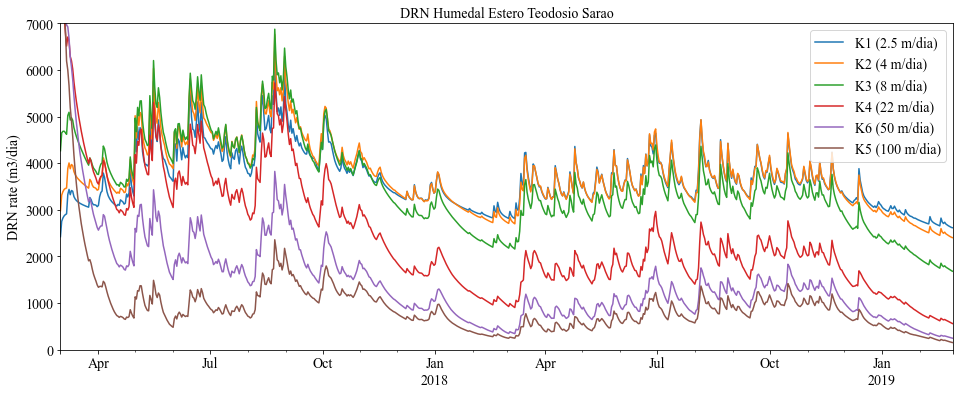

In [102]:
rch_drn_K1_S_WSU[0].W5.plot(label="K1 (2.5 m/dia)", figsize=(16,6))
rch_drn_K2_S_WSU[0].W5.plot(label="K2 (4 m/dia)")
rch_drn_K3_S_WSU[0].W5.plot(label="K3 (8 m/dia)")
rch_drn_K4_S_WSU[0].W5.plot(label="K4 (22 m/dia)")
rch_drn_K6_S_WSU[0].W5.plot(label="K6 (50 m/dia)")
rch_drn_K5_S_WSU[0].W5.plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylim([0,7000])
plt.ylabel("DRN rate (m3/dia)")
plt.title("DRN Humedal Estero Teodosio Sarao")

Text(0.5, 1.0, 'RCH Humedal Estero Teodosio Sarao')

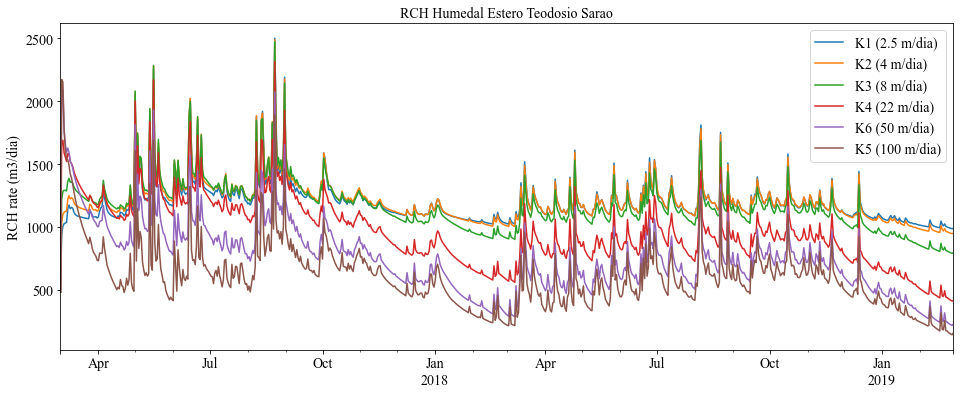

In [103]:
rch_drn_K1_S_WSU[1].W5.plot(label="K1 (2.5 m/dia)", figsize=(16,6))
rch_drn_K2_S_WSU[1].W5.plot(label="K2 (4 m/dia)")
rch_drn_K3_S_WSU[1].W5.plot(label="K3 (8 m/dia)")
rch_drn_K4_S_WSU[1].W5.plot(label="K4 (22 m/dia)")
rch_drn_K6_S_WSU[1].W5.plot(label="K6 (50 m/dia)")
rch_drn_K5_S_WSU[1].W5.plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylabel("RCH rate (m3/dia)")
#plt.ylim([2000,6000])
plt.title("RCH Humedal Estero Teodosio Sarao")

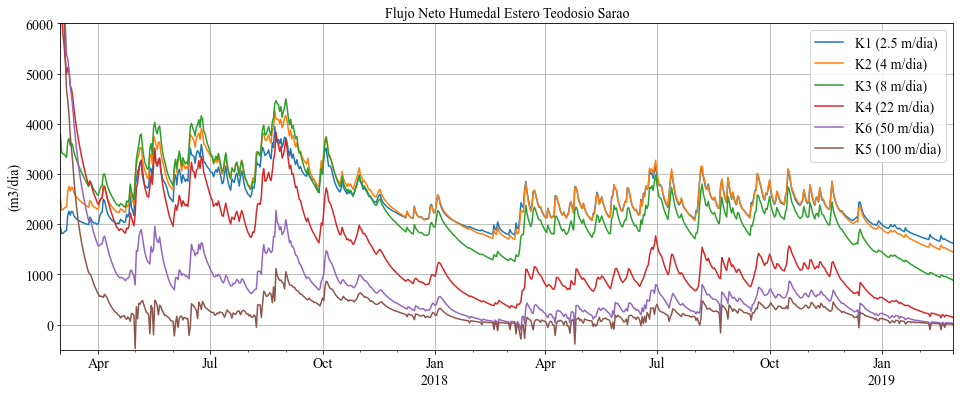

In [104]:
(rch_drn_K1_S_WSU[0].W5-rch_drn_K1_S_WSU[1].W5).plot(label="K1 (2.5 m/dia)", figsize=(16,6))
(rch_drn_K2_S_WSU[0].W5-rch_drn_K2_S_WSU[1].W5).plot(label="K2 (4 m/dia)")
(rch_drn_K3_S_WSU[0].W5-rch_drn_K3_S_WSU[1].W5).plot(label="K3 (8 m/dia)")
(rch_drn_K4_S_WSU[0].W5-rch_drn_K4_S_WSU[1].W5).plot(label="K4 (22 m/dia)")
(rch_drn_K6_S_WSU[0].W5-rch_drn_K6_S_WSU[1].W5).plot(label="K6 (50 m/dia)")
(rch_drn_K5_S_WSU[0].W5-rch_drn_K5_S_WSU[1].W5).plot(label="K5 (100 m/dia)")
plt.legend()
plt.ylim(-500,6000)
plt.ylabel("(m3/dia)")
plt.title("Flujo Neto Humedal Estero Teodosio Sarao")
plt.grid()

## Zone Budget: FROM - TO

In [105]:
aliases=pd.read_csv("aliases.csv")
aliases=list(aliases["0"])

In [106]:
zonas=list(ZB_by_zone_K1[0].columns.values)

Text(0.5, 1.0, 'RIVER ZONE BUDGET')

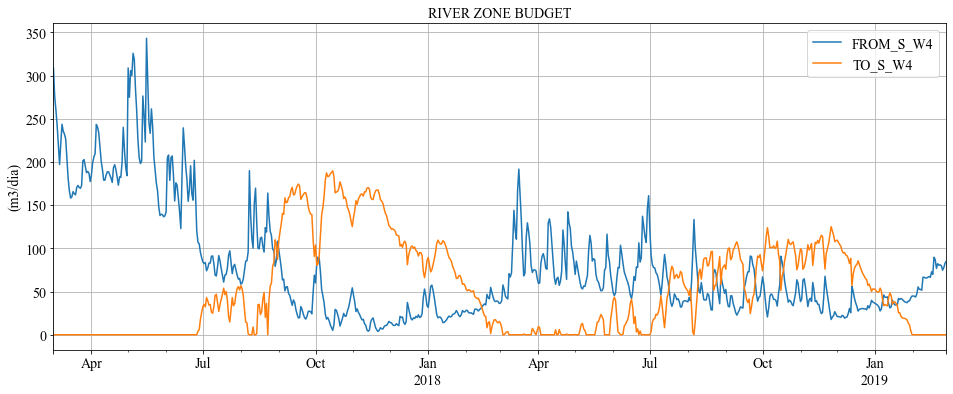

In [107]:
ZB_by_zone_K3[2].set_index(date_rng)["FROM_S_W4"].plot(figsize=(16,6))
ZB_by_zone_K3[2].set_index(date_rng)["TO_S_W4"].plot()
#ZB_by_zone_K2[2]["FROM_E1"].plot()
#ZB_by_zone_K2[2]["TO_E1"].plot()
# ZB_by_zone_K2[2]["FROM_S34"].plot()
# ZB_by_zone_K2[2]["TO_S34"].plot()
plt.ylabel("(m3/dia)")
plt.grid()
plt.legend()
plt.title("RIVER ZONE BUDGET")

Text(0.5, 1.0, 'LAKE ZONE BUDGET')

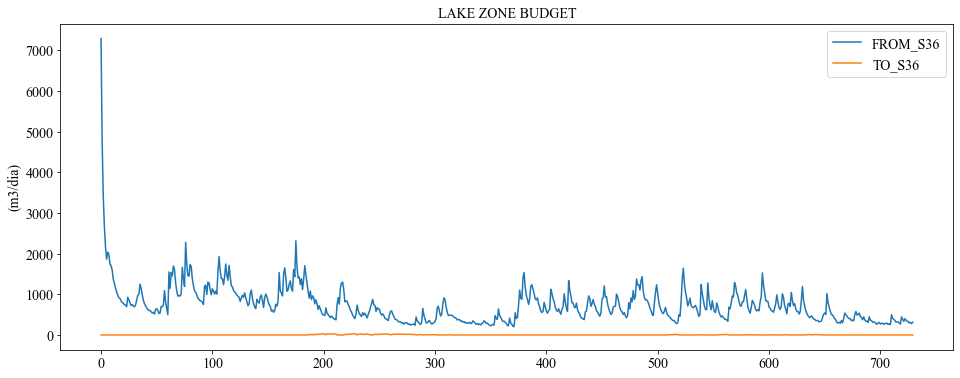

In [108]:
ZB_by_zone_K1[1]["FROM_S36"].plot(figsize=(16,6))
ZB_by_zone_K1[1]["TO_S36"].plot()
plt.legend()
plt.ylabel("(m3/dia)")
plt.title("LAKE ZONE BUDGET")

### WETLANDS

Baquedano

In [109]:
# index = aliases.index('S_W1')
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S10"].plot(figsize=(16,6))
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S10"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S11"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S11"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S8"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S8"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S4"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S4"].plot(linestyle="--" )
# plt.ylabel("(m3/dia)")
# plt.legend()
# plt.grid()
# plt.title("BAQUEDANO ZONE BUDGET")

Loto

In [110]:
# index = aliases.index('S_W2')
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S15"].plot(figsize=(16,6))
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S15"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S16"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S16"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S17"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S17"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S23"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S23"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S14"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S14"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S_W3"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S_W3"].plot(linestyle="--" )
# plt.ylabel("(m3/dia)")
# plt.legend()
# plt.grid()
# plt.title("EL LOTO ZONE BUDGET")

Los Helechos

In [111]:
# index = aliases.index('S_W3')
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S29"].plot(figsize=(16,6))
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S29"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S31"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S31"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S28"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S28"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S26"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S26"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S_W2"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S_W2"].plot(linestyle="--" )
# plt.ylabel("(m3/dia)")
# plt.grid()
# plt.legend(loc=1)
# plt.title("LOS HELECHOS ZONE BUDGET")

In [112]:
# index = aliases.index('S_W4')
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S34"].plot(figsize=(16,6))
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S34"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S31"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S31"].plot(linestyle="--" )
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_S26"].plot()
# ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_S26"].plot(linestyle="--" )
# # ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["FROM_River"].plot()
# # ZB_by_zone_C2[index].set_index(date_rng)["2017-06-01":"2019-01-31"]["TO_River"].plot(linestyle="--" )
# plt.ylabel("(m3/dia)")
# plt.legend(loc=1)
# plt.title("LAS RANAS ZONE BUDGET")
# plt.grid()

Text(0.5, 1.0, 'HUMEDAL ESTERO ZONE BUDGET')

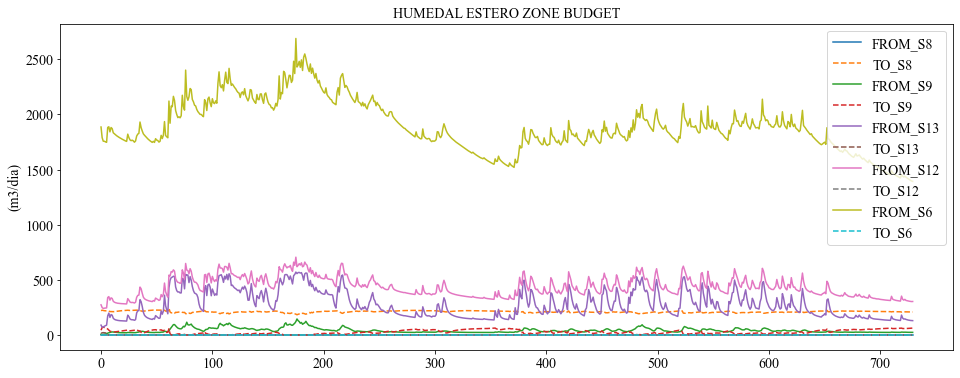

In [113]:
index = aliases.index('S_W5')
ZB_by_zone_K1[index]["FROM_S8"].plot(figsize=(16,6))
ZB_by_zone_K1[index]["TO_S8"].plot(linestyle="--" )
ZB_by_zone_K1[index]["FROM_S9"].plot()
ZB_by_zone_K1[index]["TO_S9"].plot(linestyle="--" )
ZB_by_zone_K1[index]["FROM_S13"].plot()
ZB_by_zone_K1[index]["TO_S13"].plot(linestyle="--" )
ZB_by_zone_K1[index]["FROM_S12"].plot()
ZB_by_zone_K1[index]["TO_S12"].plot(linestyle="--" )
ZB_by_zone_K1[index]["FROM_S6"].plot()
ZB_by_zone_K1[index]["TO_S6"].plot(linestyle="--" )
plt.ylabel("(m3/dia)")
plt.legend()
plt.title("HUMEDAL ESTERO ZONE BUDGET")

## Analisis  Loto

Text(0.5, 1.0, 'EL LOTO ZONE BUDGET, S14')

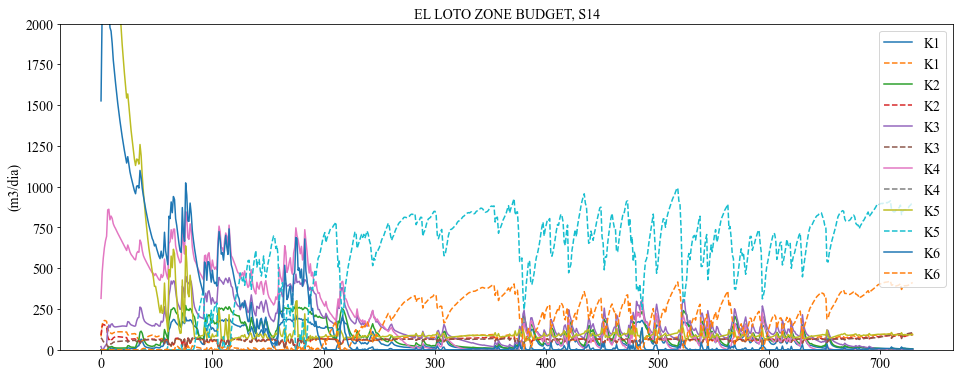

In [114]:
index = aliases.index('S_W2')
ZB_by_zone_K1[index]["FROM_S14"].plot(figsize=(16,6), label="K1")
ZB_by_zone_K1[index]["TO_S14"].plot(linestyle="--" , label="K1")
ZB_by_zone_K2[index]["FROM_S14"].plot(figsize=(16,6), label="K2")
ZB_by_zone_K2[index]["TO_S14"].plot(linestyle="--" , label="K2")
ZB_by_zone_K3[index]["FROM_S14"].plot(figsize=(16,6), label="K3")
ZB_by_zone_K3[index]["TO_S14"].plot(linestyle="--" , label="K3")
ZB_by_zone_K4[index]["FROM_S14"].plot(figsize=(16,6), label="K4")
ZB_by_zone_K4[index]["TO_S12"].plot(linestyle="--" , label="K4")
ZB_by_zone_K5[index]["FROM_S14"].plot(figsize=(16,6), label="K5")
ZB_by_zone_K5[index]["TO_S14"].plot(linestyle="--" , label="K5")
ZB_by_zone_K6[index]["FROM_S14"].plot(figsize=(16,6), label="K6")
ZB_by_zone_K6[index]["TO_S14"].plot(linestyle="--", label="K6" )
plt.ylabel("(m3/dia)")
plt.ylim(0,2000)
plt.legend()
plt.title("EL LOTO ZONE BUDGET, S14")

Text(0.5, 1.0, 'EL LOTO ZONE BUDGET, S15')

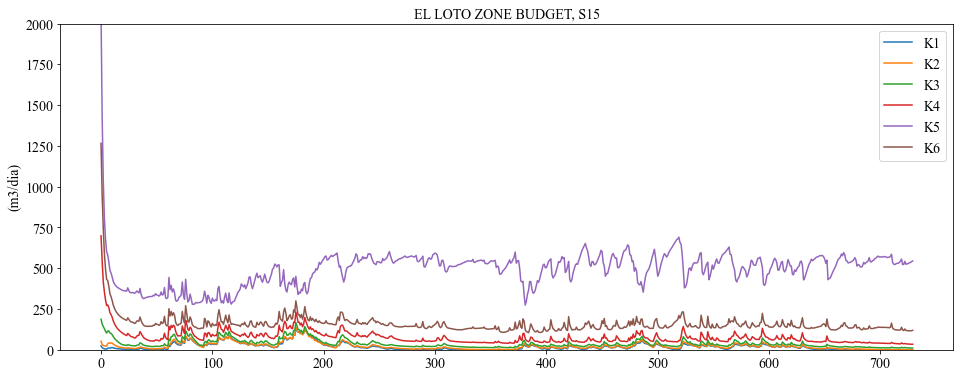

In [115]:
index = aliases.index('S_W2')
ZB_by_zone_K1[index]["FROM_S15"].plot(figsize=(16,6), label="K1")
#ZB_by_zone_K1[index]["TO_S15"].plot(linestyle="--" , label="K1")
ZB_by_zone_K2[index]["FROM_S15"].plot(figsize=(16,6), label="K2")
#ZB_by_zone_K2[index]["TO_S15"].plot(linestyle="--" , label="K2")
ZB_by_zone_K3[index]["FROM_S15"].plot(figsize=(16,6), label="K3")
#ZB_by_zone_K3[index]["TO_S15"].plot(linestyle="--" , label="K3")
ZB_by_zone_K4[index]["FROM_S15"].plot(figsize=(16,6), label="K4")
#ZB_by_zone_K4[index]["TO_S15"].plot(linestyle="--" , label="K4")
ZB_by_zone_K5[index]["FROM_S15"].plot(figsize=(16,6), label="K5")
#ZB_by_zone_K5[index]["TO_S15"].plot(linestyle="--" , label="K5")
ZB_by_zone_K6[index]["FROM_S15"].plot(figsize=(16,6), label="K6")
#ZB_by_zone_K6[index]["TO_S15"].plot(linestyle="--", label="K6" )
plt.ylabel("(m3/dia)")
plt.ylim(0,2000)
plt.legend()
plt.title("EL LOTO ZONE BUDGET, S15")

Text(0.5, 1.0, 'EL LOTO ZONE BUDGET, S16')

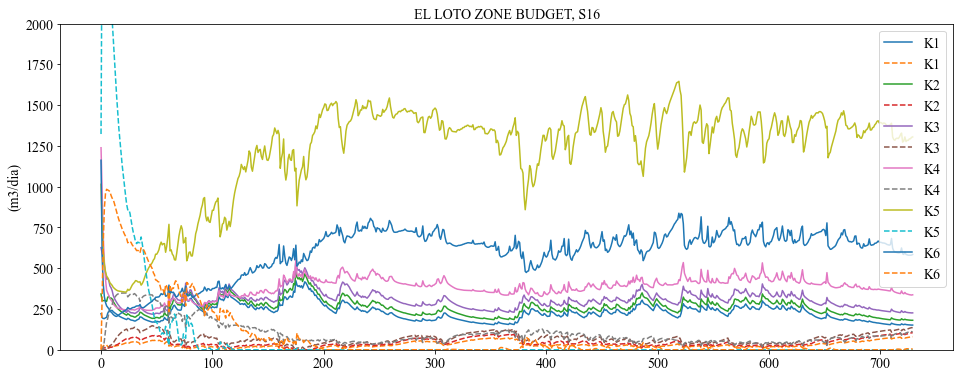

In [116]:
index = aliases.index('S_W2')
ZB_by_zone_K1[index]["FROM_S16"].plot(figsize=(16,6), label="K1")
ZB_by_zone_K1[index]["TO_S16"].plot(linestyle="--" , label="K1")
ZB_by_zone_K2[index]["FROM_S16"].plot(figsize=(16,6), label="K2")
ZB_by_zone_K2[index]["TO_S16"].plot(linestyle="--" , label="K2")
ZB_by_zone_K3[index]["FROM_S16"].plot(figsize=(16,6), label="K3")
ZB_by_zone_K3[index]["TO_S16"].plot(linestyle="--" , label="K3")
ZB_by_zone_K4[index]["FROM_S16"].plot(figsize=(16,6), label="K4")
ZB_by_zone_K4[index]["TO_S16"].plot(linestyle="--" , label="K4")
ZB_by_zone_K5[index]["FROM_S16"].plot(figsize=(16,6), label="K5")
ZB_by_zone_K5[index]["TO_S16"].plot(linestyle="--" , label="K5")
ZB_by_zone_K6[index]["FROM_S16"].plot(figsize=(16,6), label="K6")
ZB_by_zone_K6[index]["TO_S16"].plot(linestyle="--", label="K6" )
plt.ylabel("(m3/dia)")
plt.ylim(0,2000)
plt.legend()
plt.title("EL LOTO ZONE BUDGET, S16")

Text(0.5, 1.0, 'EL LOTO ZONE BUDGET, S17')

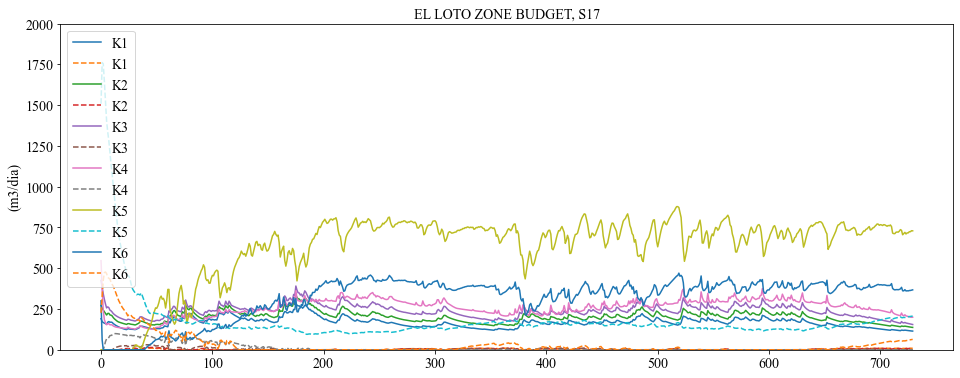

In [117]:
index = aliases.index('S_W2')
ZB_by_zone_K1[index]["FROM_S17"].plot(figsize=(16,6), label="K1")
ZB_by_zone_K1[index]["TO_S17"].plot(linestyle="--" , label="K1")
ZB_by_zone_K2[index]["FROM_S17"].plot(figsize=(16,6), label="K2")
ZB_by_zone_K2[index]["TO_S17"].plot(linestyle="--" , label="K2")
ZB_by_zone_K3[index]["FROM_S17"].plot(figsize=(16,6), label="K3")
ZB_by_zone_K3[index]["TO_S17"].plot(linestyle="--" , label="K3")
ZB_by_zone_K4[index]["FROM_S17"].plot(figsize=(16,6), label="K4")
ZB_by_zone_K4[index]["TO_S17"].plot(linestyle="--" , label="K4")
ZB_by_zone_K5[index]["FROM_S17"].plot(figsize=(16,6), label="K5")
ZB_by_zone_K5[index]["TO_S17"].plot(linestyle="--" , label="K5")
ZB_by_zone_K6[index]["FROM_S17"].plot(figsize=(16,6), label="K6")
ZB_by_zone_K6[index]["TO_S17"].plot(linestyle="--", label="K6" )
plt.ylabel("(m3/dia)")
plt.ylim(0,2000)
plt.legend()
plt.title("EL LOTO ZONE BUDGET, S17")

Text(0.5, 1.0, 'EL LOTO ZONE BUDGET, S23')

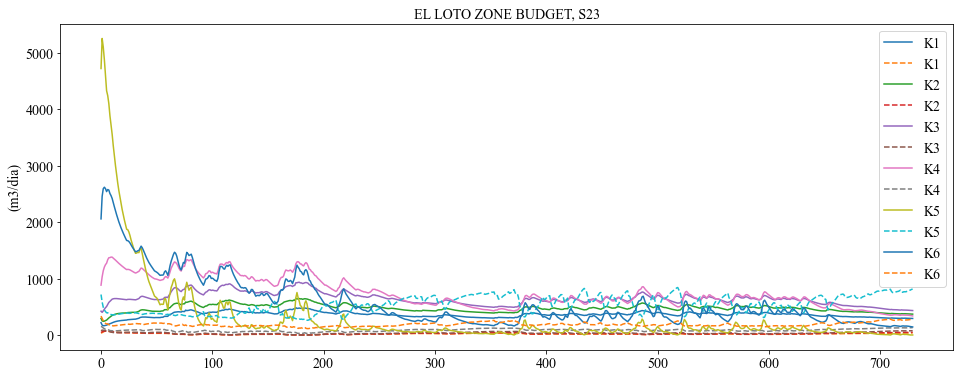

In [118]:
index = aliases.index('S_W2')
ZB_by_zone_K1[index]["FROM_S23"].plot(figsize=(16,6), label="K1")
ZB_by_zone_K1[index]["TO_S23"].plot(linestyle="--" , label="K1")
ZB_by_zone_K2[index]["FROM_S23"].plot(figsize=(16,6), label="K2")
ZB_by_zone_K2[index]["TO_S23"].plot(linestyle="--" , label="K2")
ZB_by_zone_K3[index]["FROM_S23"].plot(figsize=(16,6), label="K3")
ZB_by_zone_K3[index]["TO_S23"].plot(linestyle="--" , label="K3")
ZB_by_zone_K4[index]["FROM_S23"].plot(figsize=(16,6), label="K4")
ZB_by_zone_K4[index]["TO_S23"].plot(linestyle="--" , label="K4")
ZB_by_zone_K5[index]["FROM_S23"].plot(figsize=(16,6), label="K5")
ZB_by_zone_K5[index]["TO_S23"].plot(linestyle="--" , label="K5")
ZB_by_zone_K6[index]["FROM_S23"].plot(figsize=(16,6), label="K6")
ZB_by_zone_K6[index]["TO_S23"].plot(linestyle="--", label="K6" )
plt.ylabel("(m3/dia)")
plt.legend()
plt.title("EL LOTO ZONE BUDGET, S23")

Text(0.5, 1.0, 'S23 ZONE BUDGET, S28')

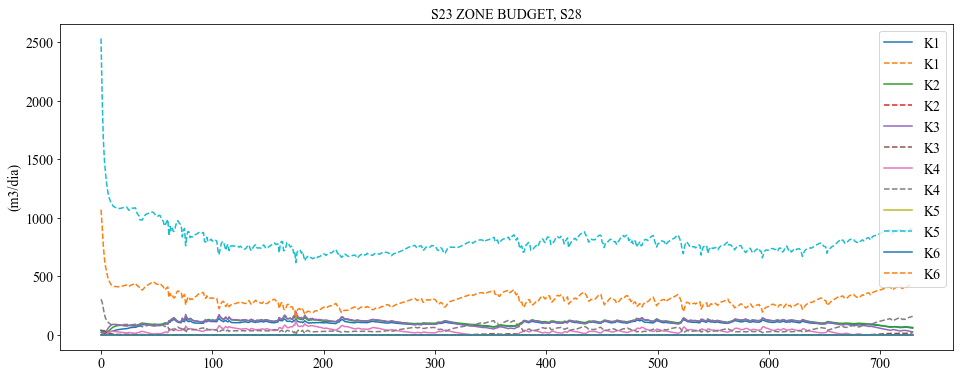

In [119]:
index = aliases.index('S23')
ZB_by_zone_K1[index]["FROM_S28"].plot(figsize=(16,6), label="K1")
ZB_by_zone_K1[index]["TO_S28"].plot(linestyle="--" , label="K1")
ZB_by_zone_K2[index]["FROM_S28"].plot(figsize=(16,6), label="K2")
ZB_by_zone_K2[index]["TO_S28"].plot(linestyle="--" , label="K2")
ZB_by_zone_K3[index]["FROM_S28"].plot(figsize=(16,6), label="K3")
ZB_by_zone_K3[index]["TO_S28"].plot(linestyle="--" , label="K3")
ZB_by_zone_K4[index]["FROM_S28"].plot(figsize=(16,6), label="K4")
ZB_by_zone_K4[index]["TO_S28"].plot(linestyle="--" , label="K4")
ZB_by_zone_K5[index]["FROM_S28"].plot(figsize=(16,6), label="K5")
ZB_by_zone_K5[index]["TO_S28"].plot(linestyle="--" , label="K5")
ZB_by_zone_K6[index]["FROM_S28"].plot(figsize=(16,6), label="K6")
ZB_by_zone_K6[index]["TO_S28"].plot(linestyle="--", label="K6" )
plt.ylabel("(m3/dia)")
plt.legend()
plt.title("S23 ZONE BUDGET, S28")

Text(0.5, 1.0, 'S23 ZONE BUDGET, S22')

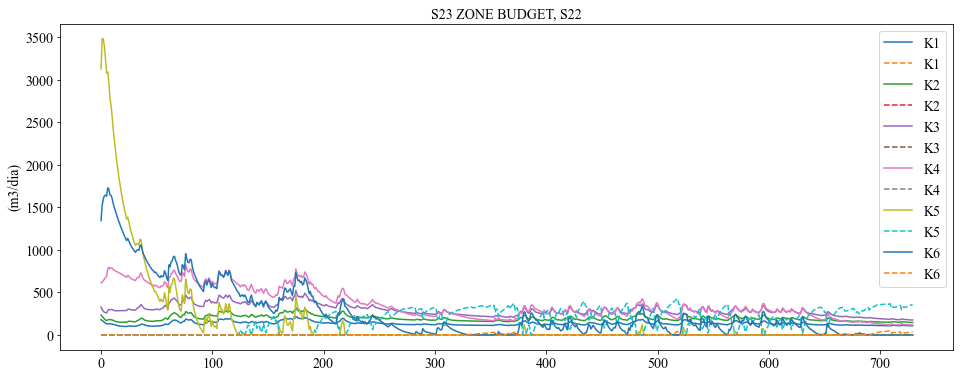

In [120]:
index = aliases.index('S23')
ZB_by_zone_K1[index]["FROM_S22"].plot(figsize=(16,6), label="K1")
ZB_by_zone_K1[index]["TO_S22"].plot(linestyle="--" , label="K1")
ZB_by_zone_K2[index]["FROM_S22"].plot(figsize=(16,6), label="K2")
ZB_by_zone_K2[index]["TO_S22"].plot(linestyle="--" , label="K2")
ZB_by_zone_K3[index]["FROM_S22"].plot(figsize=(16,6), label="K3")
ZB_by_zone_K3[index]["TO_S22"].plot(linestyle="--" , label="K3")
ZB_by_zone_K4[index]["FROM_S22"].plot(figsize=(16,6), label="K4")
ZB_by_zone_K4[index]["TO_S22"].plot(linestyle="--" , label="K4")
ZB_by_zone_K5[index]["FROM_S22"].plot(figsize=(16,6), label="K5")
ZB_by_zone_K5[index]["TO_S22"].plot(linestyle="--" , label="K5")
ZB_by_zone_K6[index]["FROM_S22"].plot(figsize=(16,6), label="K6")
ZB_by_zone_K6[index]["TO_S22"].plot(linestyle="--", label="K6" )
plt.ylabel("(m3/dia)")
plt.legend()
plt.title("S23 ZONE BUDGET, S22")

Text(0.5, 1.0, 'S23 ZONE BUDGET, S21')

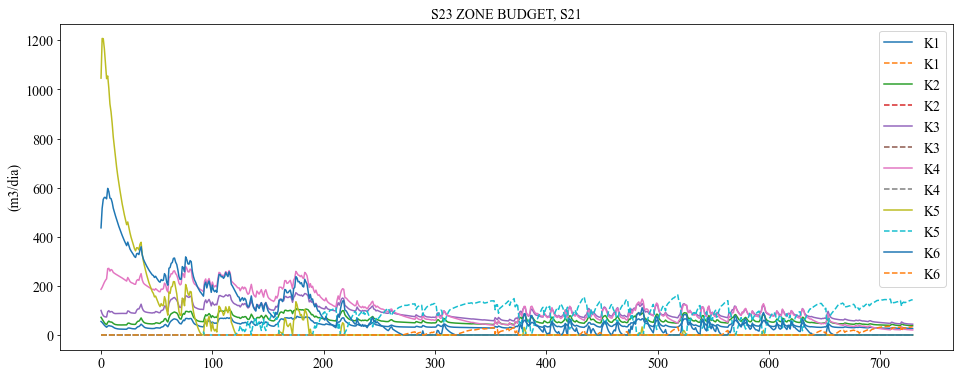

In [121]:
index = aliases.index('S23')
ZB_by_zone_K1[index]["FROM_S21"].plot(figsize=(16,6), label="K1")
ZB_by_zone_K1[index]["TO_S21"].plot(linestyle="--" , label="K1")
ZB_by_zone_K2[index]["FROM_S21"].plot(figsize=(16,6), label="K2")
ZB_by_zone_K2[index]["TO_S21"].plot(linestyle="--" , label="K2")
ZB_by_zone_K3[index]["FROM_S21"].plot(figsize=(16,6), label="K3")
ZB_by_zone_K3[index]["TO_S21"].plot(linestyle="--" , label="K3")
ZB_by_zone_K4[index]["FROM_S21"].plot(figsize=(16,6), label="K4")
ZB_by_zone_K4[index]["TO_S21"].plot(linestyle="--" , label="K4")
ZB_by_zone_K5[index]["FROM_S21"].plot(figsize=(16,6), label="K5")
ZB_by_zone_K5[index]["TO_S21"].plot(linestyle="--" , label="K5")
ZB_by_zone_K6[index]["FROM_S21"].plot(figsize=(16,6), label="K6")
ZB_by_zone_K6[index]["TO_S21"].plot(linestyle="--", label="K6" )
plt.ylabel("(m3/dia)")
plt.legend()
plt.title("S23 ZONE BUDGET, S21")

Text(0.5, 1.0, 'S27 ZONE BUDGET, S26')

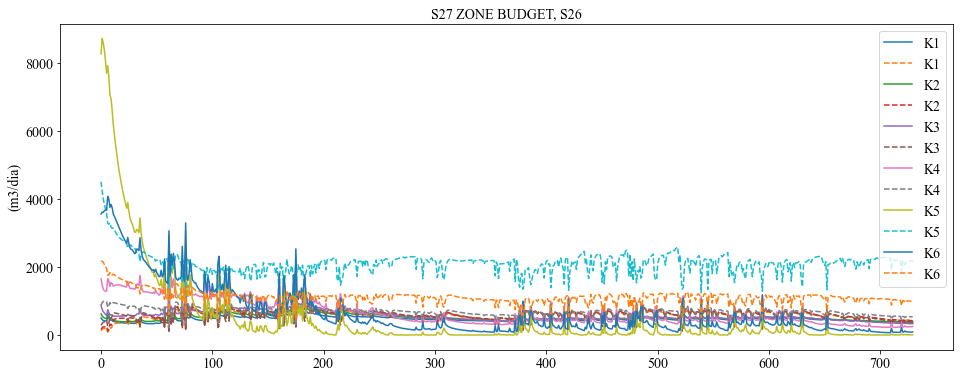

In [122]:
index = aliases.index('S27')
ZB_by_zone_K1[index]["FROM_S26"].plot(figsize=(16,6), label="K1")
ZB_by_zone_K1[index]["TO_S26"].plot(linestyle="--" , label="K1")
ZB_by_zone_K2[index]["FROM_S26"].plot(figsize=(16,6), label="K2")
ZB_by_zone_K2[index]["TO_S26"].plot(linestyle="--" , label="K2")
ZB_by_zone_K3[index]["FROM_S26"].plot(figsize=(16,6), label="K3")
ZB_by_zone_K3[index]["TO_S26"].plot(linestyle="--" , label="K3")
ZB_by_zone_K4[index]["FROM_S26"].plot(figsize=(16,6), label="K4")
ZB_by_zone_K4[index]["TO_S26"].plot(linestyle="--" , label="K4")
ZB_by_zone_K5[index]["FROM_S26"].plot(figsize=(16,6), label="K5")
ZB_by_zone_K5[index]["TO_S26"].plot(linestyle="--" , label="K5")
ZB_by_zone_K6[index]["FROM_S26"].plot(figsize=(16,6), label="K6")
ZB_by_zone_K6[index]["TO_S26"].plot(linestyle="--", label="K6" )
plt.ylabel("(m3/dia)")
plt.legend()
plt.title("S27 ZONE BUDGET, S26")

Text(0.5, 1.0, 'S37 ZONE BUDGET, S19')

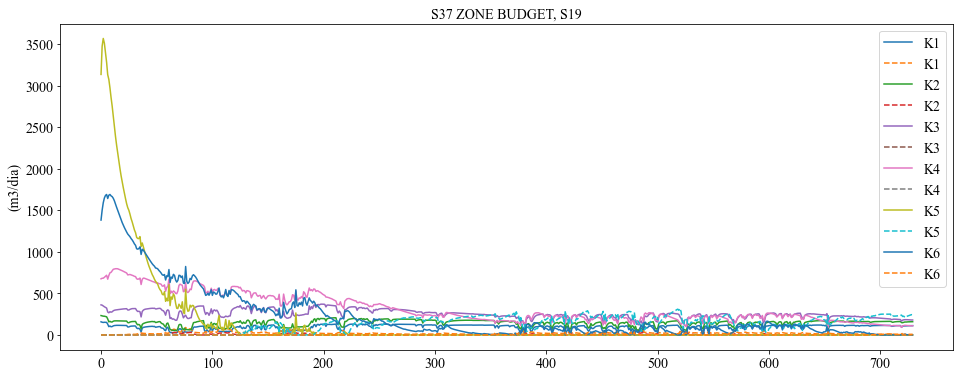

In [123]:
index = aliases.index('S37')
ZB_by_zone_K1[index]["FROM_S19"].plot(figsize=(16,6), label="K1")
ZB_by_zone_K1[index]["TO_S19"].plot(linestyle="--" , label="K1")
ZB_by_zone_K2[index]["FROM_S19"].plot(figsize=(16,6), label="K2")
ZB_by_zone_K2[index]["TO_S19"].plot(linestyle="--" , label="K2")
ZB_by_zone_K3[index]["FROM_S19"].plot(figsize=(16,6), label="K3")
ZB_by_zone_K3[index]["TO_S19"].plot(linestyle="--" , label="K3")
ZB_by_zone_K4[index]["FROM_S19"].plot(figsize=(16,6), label="K4")
ZB_by_zone_K4[index]["TO_S19"].plot(linestyle="--" , label="K4")
ZB_by_zone_K5[index]["FROM_S19"].plot(figsize=(16,6), label="K5")
ZB_by_zone_K5[index]["TO_S19"].plot(linestyle="--" , label="K5")
ZB_by_zone_K6[index]["FROM_S19"].plot(figsize=(16,6), label="K6")
ZB_by_zone_K6[index]["TO_S19"].plot(linestyle="--", label="K6" )
plt.ylabel("(m3/dia)")
plt.legend()
plt.title("S37 ZONE BUDGET, S19")

Text(0.5, 1.0, 'S37 ZONE BUDGET, S20')

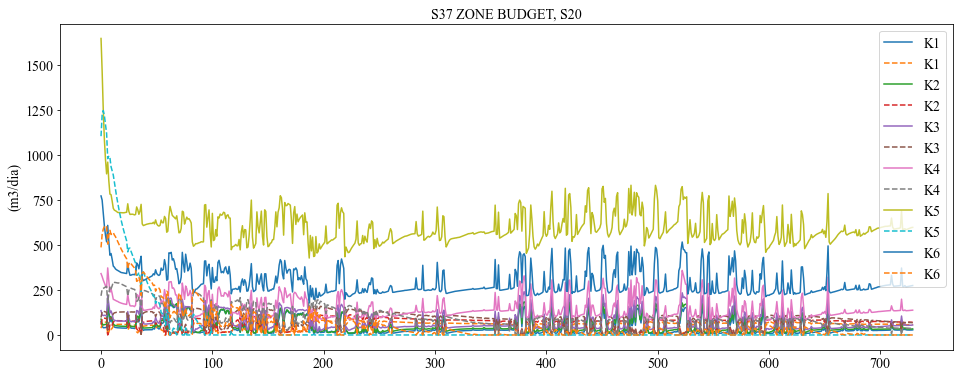

In [124]:
index = aliases.index('S37')
ZB_by_zone_K1[index]["FROM_S20"].plot(figsize=(16,6), label="K1")
ZB_by_zone_K1[index]["TO_S20"].plot(linestyle="--" , label="K1")
ZB_by_zone_K2[index]["FROM_S20"].plot(figsize=(16,6), label="K2")
ZB_by_zone_K2[index]["TO_S20"].plot(linestyle="--" , label="K2")
ZB_by_zone_K3[index]["FROM_S20"].plot(figsize=(16,6), label="K3")
ZB_by_zone_K3[index]["TO_S20"].plot(linestyle="--" , label="K3")
ZB_by_zone_K4[index]["FROM_S20"].plot(figsize=(16,6), label="K4")
ZB_by_zone_K4[index]["TO_S20"].plot(linestyle="--" , label="K4")
ZB_by_zone_K5[index]["FROM_S20"].plot(figsize=(16,6), label="K5")
ZB_by_zone_K5[index]["TO_S20"].plot(linestyle="--" , label="K5")
ZB_by_zone_K6[index]["FROM_S20"].plot(figsize=(16,6), label="K6")
ZB_by_zone_K6[index]["TO_S20"].plot(linestyle="--", label="K6" )
plt.ylabel("(m3/dia)")
plt.legend()
plt.title("S37 ZONE BUDGET, S20")

## Sensitive Analisis Resume

In [125]:
df_sensitive_analisis_W_h=pd.DataFrame(index=["K", "W1", "W2", "W3", "W4", "W5"])

In [126]:
df_sensitive_analisis_W_h["K1"]=""
df_sensitive_analisis_W_h["K2"]=""
df_sensitive_analisis_W_h["K3"]=""
df_sensitive_analisis_W_h["K4"]=""
df_sensitive_analisis_W_h["K5"]=""
df_sensitive_analisis_W_h["K6"]=""

In [127]:
df_sensitive_analisis_W_h["K1"]["K"]=2.5
df_sensitive_analisis_W_h["K2"]["K"]=4
df_sensitive_analisis_W_h["K3"]["K"]=8
df_sensitive_analisis_W_h["K4"]["K"]=22
df_sensitive_analisis_W_h["K5"]["K"]=50
df_sensitive_analisis_W_h["K6"]["K"]=100

In [128]:
j="W1"
df_sensitive_analisis_W_h["K1"][j]= W1_K1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K2"][j]= W1_K2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K3"][j]= W1_K3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K4"][j]= W1_K4_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K5"][j]= W1_K6_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K6"][j]= W1_K5_TS_df_sort["Depth (m)"].mean()

In [129]:
j="W2"
df_sensitive_analisis_W_h["K1"][j]= W2_K1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K2"][j]= W2_K2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K3"][j]= W2_K3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K4"][j]= W2_K4_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K5"][j]= W2_K6_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K6"][j]= W2_K5_TS_df_sort["Depth (m)"].mean()

In [130]:
j="W3"
df_sensitive_analisis_W_h["K1"][j]= W3_K1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K2"][j]= W3_K2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K3"][j]= W3_K3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K4"][j]= W3_K4_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K5"][j]= W3_K6_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K6"][j]= W3_K5_TS_df_sort["Depth (m)"].mean()

In [131]:
j="W4"
df_sensitive_analisis_W_h["K1"][j]= W4_K1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K2"][j]= W4_K2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K3"][j]= W4_K3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K4"][j]= W4_K4_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K5"][j]= W4_K6_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K6"][j]= W4_K5_TS_df_sort["Depth (m)"].mean()

In [132]:
j="W5"
df_sensitive_analisis_W_h["K1"][j]= W5_K1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K2"][j]= W5_K2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K3"][j]= W5_K3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K4"][j]= W5_K4_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K5"][j]= W5_K6_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h["K6"][j]= W5_K5_TS_df_sort["Depth (m)"].mean()

In [133]:
df_sensitive_analisis_W_h

,K1,K2,K3,K4,K5,K6
K,2.5,4,8,22,50,100
W1,0.796543,0.793865,0.789081,0.780085,0.773816,0.77122
W2,2.97596,2.9849,2.99596,2.99748,2.98929,2.9833
W3,0.336567,0.338511,0.338904,0.325817,0.309374,0.299063
W4,1.09122,1.09187,1.09098,1.08426,1.0782,1.07532
W5,0.0879369,0.0882043,0.0845765,0.0680864,0.0516321,0.0414785


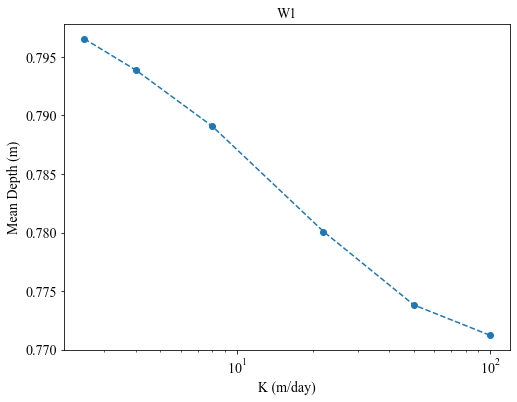

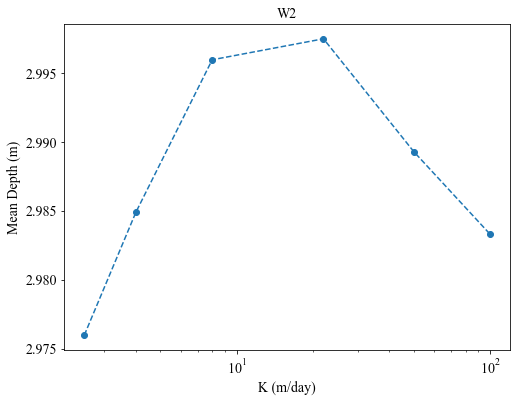

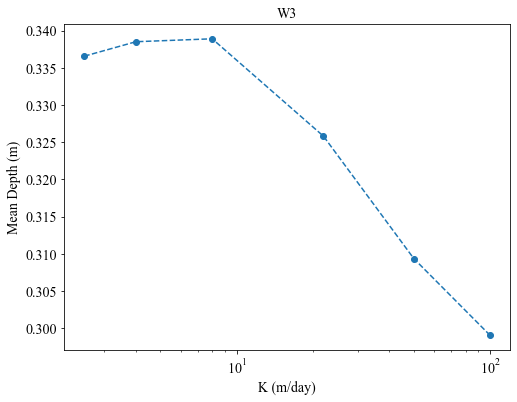

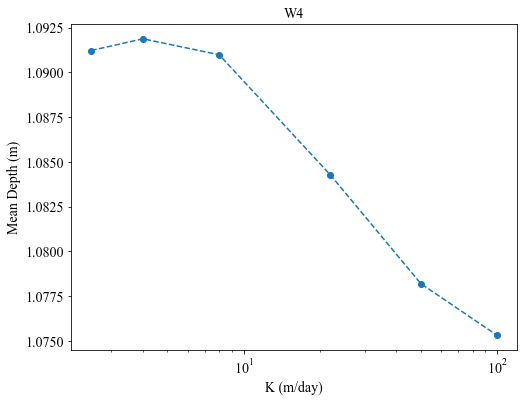

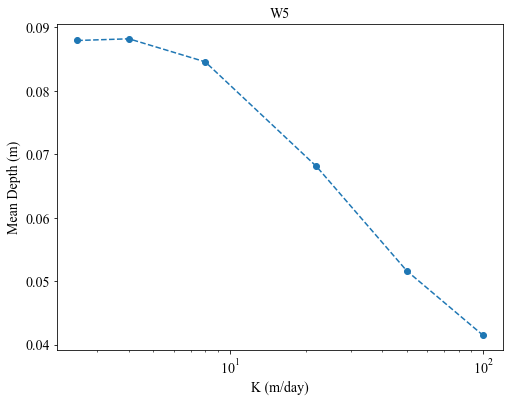

In [134]:
for i in df_sensitive_analisis_W_h.index[1:]:
    row=df_sensitive_analisis_W_h.loc[i]
    plt.figure(figsize=(8,6))
    plt.title(i)
    plt.ylabel("Mean Depth (m)")
    plt.xlabel("K (m/day)")
    plt.plot(df_sensitive_analisis_W_h.loc["K"],df_sensitive_analisis_W_h.loc[i], '--o')
    plt.xscale("log")

In [135]:
df_sensitive_analisis_W_h.index[1:]

Index(['W1', 'W2', 'W3', 'W4', 'W5'], dtype='object')

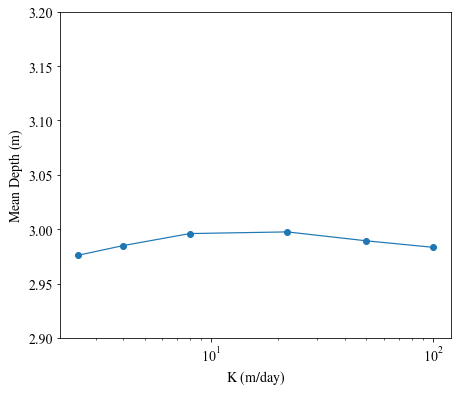

In [136]:
plt.figure(figsize=(7,6))
plt.plot(df_sensitive_analisis_W_h.loc["K"],df_sensitive_analisis_W_h.loc["W2"], marker='o', linewidth=1.2)
plt.ylim(2.9, 3.2)
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.xlabel("$\mathrm{K}$ ($\mathrm{m/day}$)")
plt.ylabel(r"$\mathrm{Mean\ Depth}$ ($\mathrm{m}$)")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.xscale("log")

# plt.rc('legend', fontsize=14)    # legend fontsize
#plt.title("Curvas de Duración Altura Humedal El Loto")
#plt.savefig("Figures/Fig7d.png")

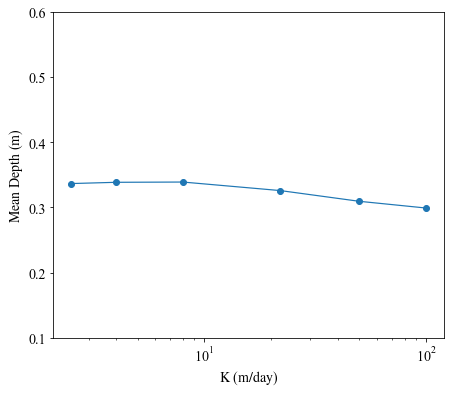

In [137]:
plt.figure(figsize=(7,6))
plt.plot(df_sensitive_analisis_W_h.loc["K"],df_sensitive_analisis_W_h.loc["W3"], marker='o', linewidth=1.2)
plt.ylim(0.1, 0.6)
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.xlabel("$\mathrm{K}$ ($\mathrm{m/day}$)")
plt.ylabel(r"$\mathrm{Mean\ Depth}$ ($\mathrm{m}$)")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.xscale("log")

# plt.rc('legend', fontsize=14)    # legend fontsize
#plt.title("Curvas de Duración Altura Humedal El Loto")
#plt.savefig("Figures/Fig8d.png")

# CONDUCTANCE

## Wetland Storage Units

### Time Series

In [138]:
df_WSU_C1=import_xls('Iteracion_C_1/WSU_SWMM_TS.xls') #0.01
df_WSU_C2=import_xls('Iteracion_C_2/WSU_SWMM_TS.xls') #0.05
df_WSU_C3=import_xls('Iteracion_K_4/WSU_SWMM_TS.xls') #0.1
df_WSU_C4=import_xls('Iteracion_C_4/WSU_SWMM_TS.xls') #0.5
df_WSU_C5=import_xls('Iteracion_C_5/WSU_SWMM_TS.xls') #1

In [139]:
WSU_name="W1"
i=WSU_names_list.index(WSU_name)

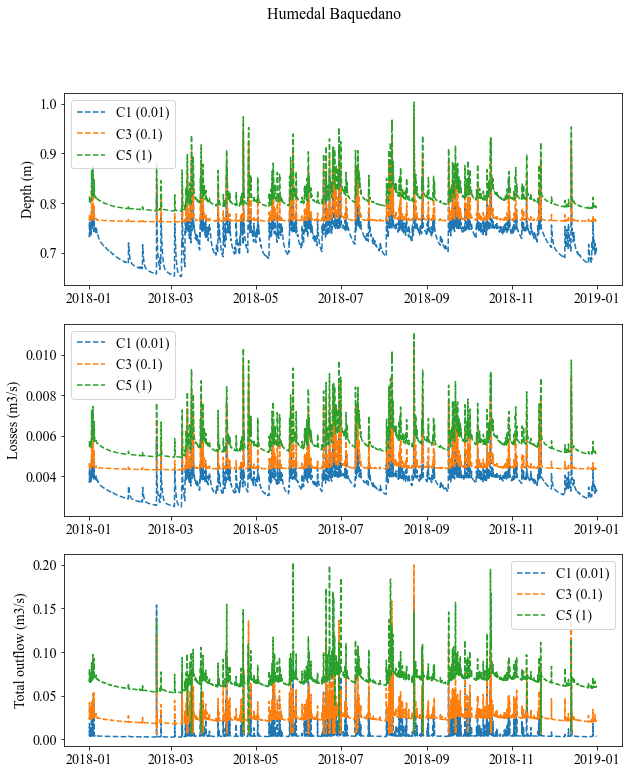

In [140]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Depth (m)"], label="C1 (0.01)",linestyle="--" )
ax1.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Depth (m)"], label="C3 (0.1)",linestyle="--" )
ax1.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Depth (m)"], label="C5 (1)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Losses (m3/s)"],label="C1 (0.01)",linestyle="--")
ax3.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Losses (m3/s)"],label="C3 (0.1)",linestyle="--")
ax3.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Losses (m3/s)"],label="C5 (1)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Total outflow (m3/s)"],label="C1 (0.01)",linestyle="--" )
ax4.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Total outflow (m3/s)"],label="C3 (0.1)",linestyle="--" )
ax4.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Total outflow (m3/s)"],label="C5 (1)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Baquedano",fontsize=16)
plt.show()

In [141]:
WSU_name="W2"
i=WSU_names_list.index(WSU_name)

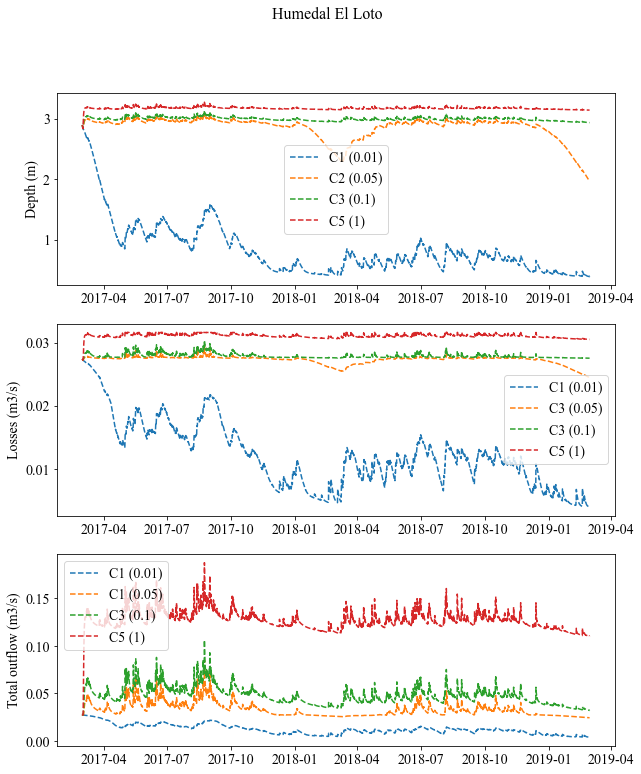

In [142]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_C1[i].index,df_WSU_C1[i]["Depth (m)"], label="C1 (0.01)",linestyle="--" )
ax1.plot(df_WSU_C2[i].index,df_WSU_C2[i]["Depth (m)"], label="C2 (0.05)",linestyle="--" )
ax1.plot(df_WSU_C3[i].index,df_WSU_C3[i]["Depth (m)"], label="C3 (0.1)",linestyle="--" )
ax1.plot(df_WSU_C5[i].index,df_WSU_C5[i]["Depth (m)"], label="C5 (1)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_C1[i].index,df_WSU_C1[i]["Losses (m3/s)"],label="C1 (0.01)",linestyle="--")
ax3.plot(df_WSU_C2[i].index,df_WSU_C2[i]["Losses (m3/s)"], label="C3 (0.05)",linestyle="--" )
ax3.plot(df_WSU_C3[i].index,df_WSU_C3[i]["Losses (m3/s)"],label="C3 (0.1)",linestyle="--")
ax3.plot(df_WSU_C5[i].index,df_WSU_C5[i]["Losses (m3/s)"],label="C5 (1)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_C1[i].index,df_WSU_C1[i]["Total outflow (m3/s)"],label="C1 (0.01)",linestyle="--" )
ax4.plot(df_WSU_C2[i].index,df_WSU_C2[i]["Total outflow (m3/s)"],label="C1 (0.05)",linestyle="--" )
ax4.plot(df_WSU_C3[i].index,df_WSU_C3[i]["Total outflow (m3/s)"],label="C3 (0.1)",linestyle="--" )
ax4.plot(df_WSU_C5[i].index,df_WSU_C5[i]["Total outflow (m3/s)"],label="C5 (1)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal El Loto",fontsize=16)
plt.show()

In [143]:
# f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
# ax1.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Depth (m)"], label="C1 (0.01)",linestyle="--" )
# ax1.plot(df_WSU_C2[i]["2018"].index,df_WSU_C2[i]["2018"]["Depth (m)"], label="C2 (0.05)",linestyle="--" )
# ax1.plot(df_WSU_K3[i]["2018"].index,df_WSU_K3[i]["2018"]["Depth (m)"], label="last",linestyle="--" )
# ax1.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Depth (m)"], label="C3 (0.1)",linestyle="--" )
# ax1.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Depth (m)"], label="C5 (1)",linestyle="--" )
# ax1.legend()
# ax1.set_ylabel("Depth (m)")
# # ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# # ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# # ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# # ax2.legend()
# # ax2.set_ylabel("Total inflow (m3/s)")
# ax3.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Losses (m3/s)"],label="C1 (0.01)",linestyle="--")
# ax3.plot(df_WSU_C2[i]["2018"].index,df_WSU_C2[i]["2018"]["Losses (m3/s)"], label="C3 (0.05)",linestyle="--" )
# ax3.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Losses (m3/s)"],label="C3 (0.1)",linestyle="--")
# ax3.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Losses (m3/s)"],label="C5 (1)",linestyle="--")
# ax3.legend()
# ax3.set_ylabel("Losses (m3/s)")
# ax4.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Total outflow (m3/s)"],label="C1 (0.01)",linestyle="--" )
# ax4.plot(df_WSU_C2[i]["2018"].index,df_WSU_C2[i]["2018"]["Total outflow (m3/s)"],label="C1 (0.05)",linestyle="--" )
# ax4.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Total outflow (m3/s)"],label="C3 (0.1)",linestyle="--" )
# ax4.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Total outflow (m3/s)"],label="C5 (1)",linestyle="--" )
# ax4.legend()
# ax4.set_ylabel("Total outflow (m3/s)")
# f.suptitle("Humedal El Loto",fontsize=16)
# plt.show()

In [144]:
# with plt.xkcd():
#     f, (ax1,ax2) = plt.subplots(2,1, figsize=(10,7))
#     ax1.plot(df_WSU_C2[i]["2017":"2018"].index,df_WSU_C2[i]["2017":"2018"]["Depth (m)"], label="C2 (0.05)")
#     ax1.set_ylabel("Altura $(m)$")
#     ax1.set_xlabel("Tiempo")
#     ax1.set_yticklabels([])
#     ax1.set_xticklabels([])
#     ax2.plot(df_WSU_C2[i]["2017":"2018"].index,df_WSU_C2[i]["2017":"2018"]["Total outflow (m3/s)"],label="C1 (0.05)" )
#     ax2.set_ylabel("Flujo de Salida $(m^3/s)$")
#     ax2.set_xlabel("Tiempo")
#     ax2.set_yticklabels([])
#     ax2.set_xticklabels([])
#     plt.show()
#     f.savefig("xkcd_time_series.png")

In [145]:
WSU_name="W3"
i=WSU_names_list.index(WSU_name)

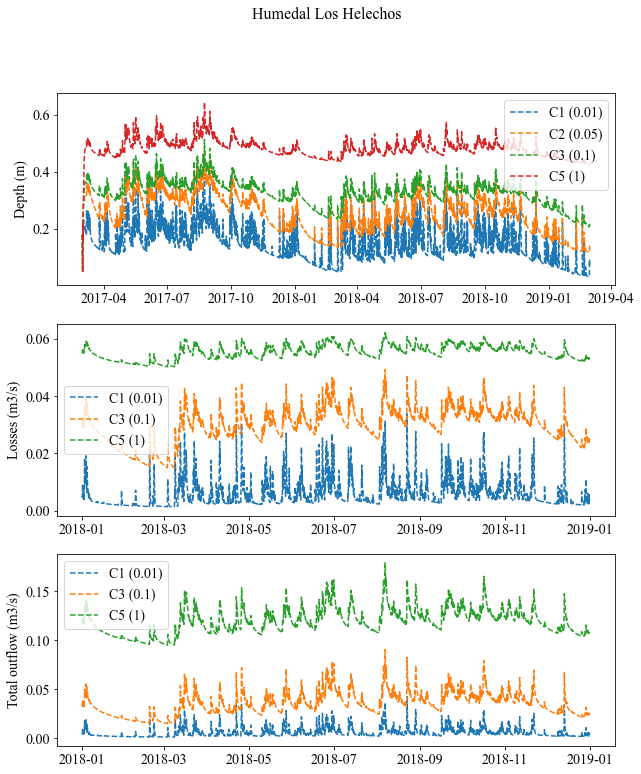

In [146]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_C1[i].index,df_WSU_C1[i]["Depth (m)"], label="C1 (0.01)",linestyle="--" )
ax1.plot(df_WSU_C2[i].index,df_WSU_C2[i]["Depth (m)"], label="C2 (0.05)",linestyle="--" )
ax1.plot(df_WSU_C3[i].index,df_WSU_C3[i]["Depth (m)"], label="C3 (0.1)",linestyle="--" )
ax1.plot(df_WSU_C5[i].index,df_WSU_C5[i]["Depth (m)"], label="C5 (1)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Losses (m3/s)"],label="C1 (0.01)",linestyle="--")
ax3.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Losses (m3/s)"],label="C3 (0.1)",linestyle="--")
ax3.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Losses (m3/s)"],label="C5 (1)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Total outflow (m3/s)"],label="C1 (0.01)",linestyle="--" )
ax4.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Total outflow (m3/s)"],label="C3 (0.1)",linestyle="--" )
ax4.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Total outflow (m3/s)"],label="C5 (1)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Los Helechos",fontsize=16)
plt.show()

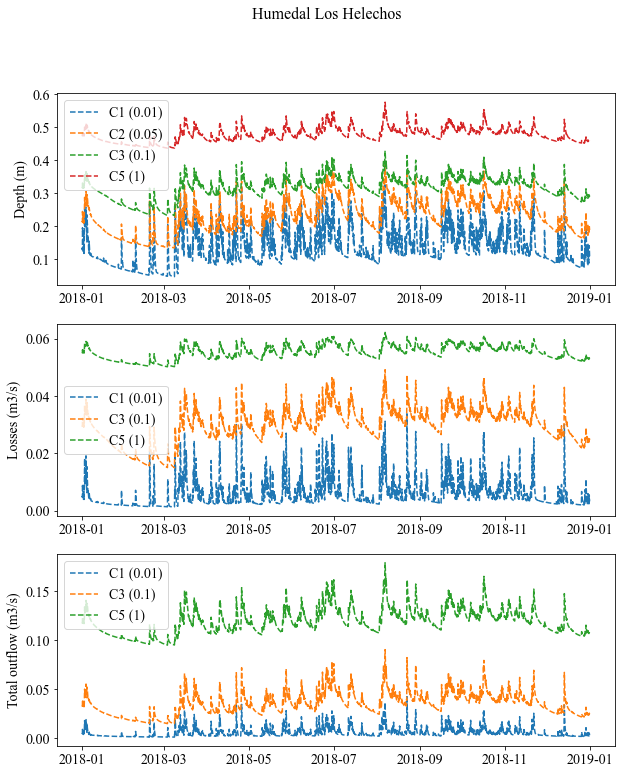

In [147]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Depth (m)"], label="C1 (0.01)",linestyle="--" )
ax1.plot(df_WSU_C2[i]["2018"].index,df_WSU_C2[i]["2018"]["Depth (m)"], label="C2 (0.05)",linestyle="--" )
ax1.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Depth (m)"], label="C3 (0.1)",linestyle="--" )
ax1.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Depth (m)"], label="C5 (1)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Losses (m3/s)"],label="C1 (0.01)",linestyle="--")
ax3.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Losses (m3/s)"],label="C3 (0.1)",linestyle="--")
ax3.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Losses (m3/s)"],label="C5 (1)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Total outflow (m3/s)"],label="C1 (0.01)",linestyle="--" )
ax4.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Total outflow (m3/s)"],label="C3 (0.1)",linestyle="--" )
ax4.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Total outflow (m3/s)"],label="C5 (1)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Los Helechos",fontsize=16)
plt.show()

In [148]:
WSU_name="W4"
i=WSU_names_list.index(WSU_name)

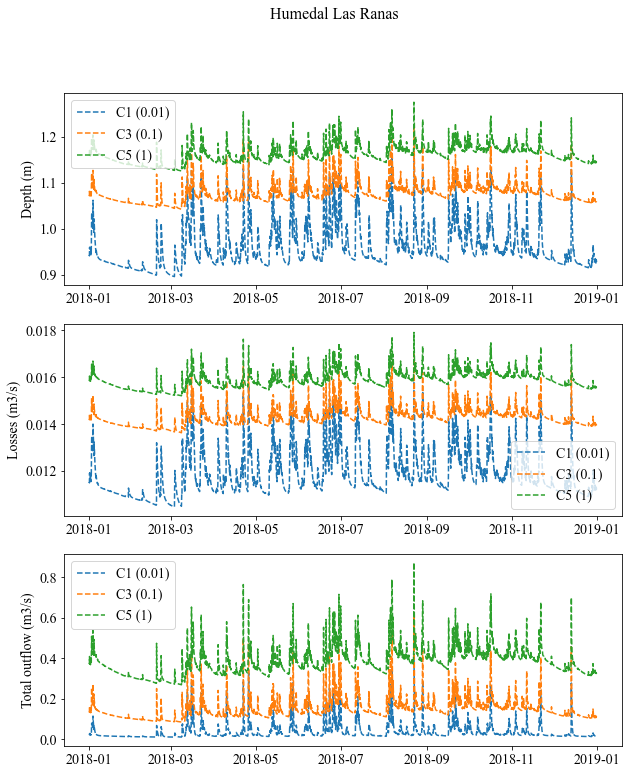

In [149]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Depth (m)"], label="C1 (0.01)",linestyle="--" )
ax1.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Depth (m)"], label="C3 (0.1)",linestyle="--" )
ax1.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Depth (m)"], label="C5 (1)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Losses (m3/s)"],label="C1 (0.01)",linestyle="--")
ax3.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Losses (m3/s)"],label="C3 (0.1)",linestyle="--")
ax3.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Losses (m3/s)"],label="C5 (1)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Total outflow (m3/s)"],label="C1 (0.01)",linestyle="--" )
ax4.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Total outflow (m3/s)"],label="C3 (0.1)",linestyle="--" )
ax4.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Total outflow (m3/s)"],label="C5 (1)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Las Ranas",fontsize=16)
plt.show()

In [150]:
WSU_name="W5"
i=WSU_names_list.index(WSU_name)

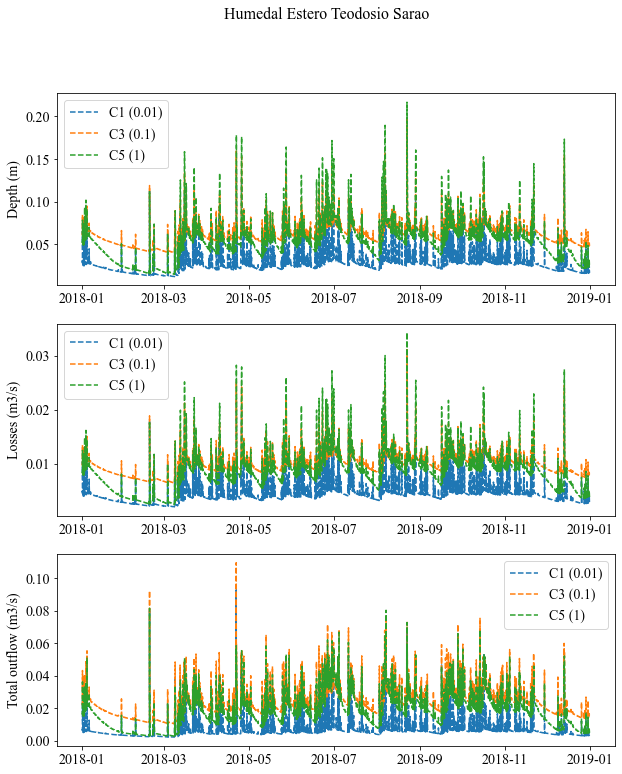

In [151]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Depth (m)"], label="C1 (0.01)",linestyle="--" )
ax1.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Depth (m)"], label="C3 (0.1)",linestyle="--" )
ax1.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Depth (m)"], label="C5 (1)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Losses (m3/s)"],label="C1 (0.01)",linestyle="--")
ax3.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Losses (m3/s)"],label="C3 (0.1)",linestyle="--")
ax3.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Losses (m3/s)"],label="C5 (1)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_C1[i]["2018"].index,df_WSU_C1[i]["2018"]["Total outflow (m3/s)"],label="C1 (0.01)",linestyle="--" )
ax4.plot(df_WSU_C3[i]["2018"].index,df_WSU_C3[i]["2018"]["Total outflow (m3/s)"],label="C3 (0.1)",linestyle="--" )
ax4.plot(df_WSU_C5[i]["2018"].index,df_WSU_C5[i]["2018"]["Total outflow (m3/s)"],label="C5 (1)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Estero Teodosio Sarao",fontsize=16)
plt.show()

### Curvas de Duración

Baquedano

In [152]:
W1_C1_TS_df_sort=C_duracion(df_WSU_C1, "W1")
W1_C2_TS_df_sort=C_duracion(df_WSU_C2, "W1")
W1_C3_TS_df_sort=C_duracion(df_WSU_C3, "W1")
W1_C4_TS_df_sort=C_duracion(df_WSU_C4, "W1")
W1_C5_TS_df_sort=C_duracion(df_WSU_C5, "W1")

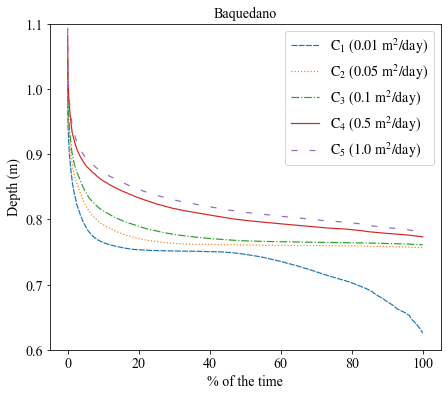

In [153]:
plt.figure(figsize=(7,6))
plt.plot(W1_C1_TS_df_sort["% Tiempo"], W1_C1_TS_df_sort["Depth (m)"], label="$\mathrm{C_1}$ ($\mathrm{0.01}$ $\mathrm{m^2/day}$)",linestyle= '--',  dashes=[5, 1], linewidth=1.2)
plt.plot(W1_C2_TS_df_sort["% Tiempo"], W1_C2_TS_df_sort["Depth (m)"], label="$\mathrm{C_2}$ ($\mathrm{0.05}$ $\mathrm{m^2/day}$)",linestyle= ':',  linewidth=1.2)
plt.plot(W1_C3_TS_df_sort["% Tiempo"], W1_C3_TS_df_sort["Depth (m)"], label="$\mathrm{C_3}$ ($\mathrm{0.1}$ $\mathrm{m^2/day}$)",linestyle= '-.',  linewidth=1.2)
plt.plot(W1_C4_TS_df_sort["% Tiempo"], W1_C4_TS_df_sort["Depth (m)"], label="$\mathrm{C_4}$ ($\mathrm{0.5}$ $\mathrm{m^2/day}$)",linestyle= '-',  linewidth=1.2)
plt.plot(W1_C5_TS_df_sort["% Tiempo"], W1_C5_TS_df_sort["Depth (m)"], label="$\mathrm{C_5}$ ($\mathrm{1.0}$ $\mathrm{m^2/day}$)",linestyle= '--',  dashes=[5, 10], linewidth=1.2)
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.rc('legend', fontsize=14)    # legend fontsize
plt.legend()
plt.ylim(0.6,1.1)
plt.title("Baquedano")
plt.savefig("Figures/Anexos/DC_W1_C.svg")

El Loto

In [154]:
W2_C1_TS_df_sort=C_duracion(df_WSU_C1, "W2")
W2_C2_TS_df_sort=C_duracion(df_WSU_C2, "W2")
W2_C3_TS_df_sort=C_duracion(df_WSU_C3, "W2")
W2_C4_TS_df_sort=C_duracion(df_WSU_C4, "W2")
W2_C5_TS_df_sort=C_duracion(df_WSU_C5, "W2")

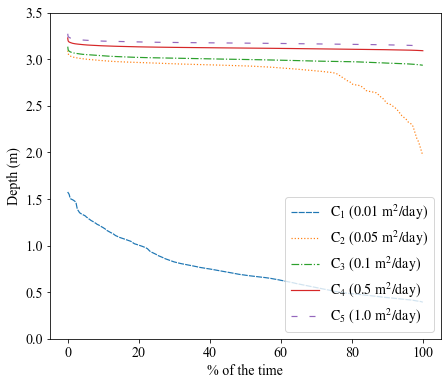

In [155]:
plt.figure(figsize=(7,6))
plt.plot(W2_C1_TS_df_sort["% Tiempo"], W2_C1_TS_df_sort["Depth (m)"], label="$\mathrm{C_1}$ ($\mathrm{0.01}$ $\mathrm{m^2/day}$)",linestyle= '--',  dashes=[5, 1], linewidth=1.2)
plt.plot(W2_C2_TS_df_sort["% Tiempo"], W2_C2_TS_df_sort["Depth (m)"], label="$\mathrm{C_2}$ ($\mathrm{0.05}$ $\mathrm{m^2/day}$)",linestyle= ':',  linewidth=1.2)
plt.plot(W2_C3_TS_df_sort["% Tiempo"], W2_C3_TS_df_sort["Depth (m)"], label="$\mathrm{C_3}$ ($\mathrm{0.1}$ $\mathrm{m^2/day}$)",linestyle= '-.',  linewidth=1.2)
plt.plot(W2_C4_TS_df_sort["% Tiempo"], W2_C4_TS_df_sort["Depth (m)"], label="$\mathrm{C_4}$ ($\mathrm{0.5}$ $\mathrm{m^2/day}$)",linestyle= '-',  linewidth=1.2)
plt.plot(W2_C5_TS_df_sort["% Tiempo"], W2_C5_TS_df_sort["Depth (m)"], label="$\mathrm{C_5}$ ($\mathrm{1.0}$ $\mathrm{m^2/day}$)",linestyle= '--',  dashes=[5, 10], linewidth=1.2)
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.rc('legend', fontsize=14)    # legend fontsize
plt.legend(loc=4)
plt.ylim(0,3.5)
#plt.title("Curvas de Duración Altura Humedal El Loto")
plt.savefig("Figures/Fig7b.svg")

Los Helechos

In [156]:
W3_C1_TS_df_sort=C_duracion(df_WSU_C1, "W3")
W3_C2_TS_df_sort=C_duracion(df_WSU_C2, "W3")
W3_C3_TS_df_sort=C_duracion(df_WSU_C3, "W3")
W3_C4_TS_df_sort=C_duracion(df_WSU_C4, "W3")
W3_C5_TS_df_sort=C_duracion(df_WSU_C5, "W3")

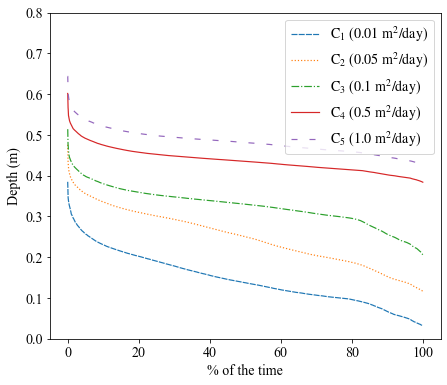

In [157]:
plt.figure(figsize=(7,6))
plt.plot(W3_C1_TS_df_sort["% Tiempo"], W3_C1_TS_df_sort["Depth (m)"],label="$\mathrm{C_1}$ ($\mathrm{0.01}$ $\mathrm{m^2/day}$)",linestyle= '--' , dashes=[5, 1], linewidth=1.2)
plt.plot(W3_C2_TS_df_sort["% Tiempo"], W3_C2_TS_df_sort["Depth (m)"],label="$\mathrm{C_2}$ ($\mathrm{0.05}$ $\mathrm{m^2/day}$)",linestyle= ':',  linewidth=1.2)
plt.plot(W3_C3_TS_df_sort["% Tiempo"], W3_C3_TS_df_sort["Depth (m)"],label="$\mathrm{C_3}$ ($\mathrm{0.1}$ $\mathrm{m^2/day}$)",linestyle= '-.',  linewidth=1.2)
plt.plot(W3_C4_TS_df_sort["% Tiempo"], W3_C4_TS_df_sort["Depth (m)"],label="$\mathrm{C_4}$ ($\mathrm{0.5}$ $\mathrm{m^2/day}$)",linestyle= '-',  linewidth=1.2)
plt.plot(W3_C5_TS_df_sort["% Tiempo"], W3_C5_TS_df_sort["Depth (m)"],label="$\mathrm{C_5}$ ($\mathrm{1.0}$ $\mathrm{m^2/day}$)", dashes=[5, 10], linewidth=1.2)
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend(loc=1)
plt.ylim(0,0.8)
plt.rc('legend', fontsize=14)    # legend fontsize
#plt.title("Curvas de Duración Altura Humedal El Loto")
plt.savefig("Figures/Fig8b.svg")

Las Ranas

In [158]:
W4_C1_TS_df_sort=C_duracion(df_WSU_C1, "W4")
W4_C2_TS_df_sort=C_duracion(df_WSU_C2, "W4")
W4_C3_TS_df_sort=C_duracion(df_WSU_C3, "W4")
W4_C4_TS_df_sort=C_duracion(df_WSU_C4, "W4")
W4_C5_TS_df_sort=C_duracion(df_WSU_C5, "W4")

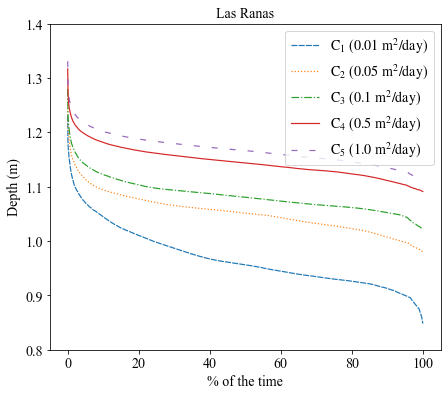

In [159]:
plt.figure(figsize=(7,6))
plt.plot(W4_C1_TS_df_sort["% Tiempo"], W4_C1_TS_df_sort["Depth (m)"], label="$\mathrm{C_1}$ ($\mathrm{0.01}$ $\mathrm{m^2/day}$)",linestyle= '--',  dashes=[5, 1], linewidth=1.2)
plt.plot(W4_C2_TS_df_sort["% Tiempo"], W4_C2_TS_df_sort["Depth (m)"], label="$\mathrm{C_2}$ ($\mathrm{0.05}$ $\mathrm{m^2/day}$)",linestyle= ':',  linewidth=1.2)
plt.plot(W4_C3_TS_df_sort["% Tiempo"], W4_C3_TS_df_sort["Depth (m)"], label="$\mathrm{C_3}$ ($\mathrm{0.1}$ $\mathrm{m^2/day}$)",linestyle= '-.',  linewidth=1.2)
plt.plot(W4_C4_TS_df_sort["% Tiempo"], W4_C4_TS_df_sort["Depth (m)"], label="$\mathrm{C_4}$ ($\mathrm{0.5}$ $\mathrm{m^2/day}$)",linestyle= '-',  linewidth=1.2)
plt.plot(W4_C5_TS_df_sort["% Tiempo"], W4_C5_TS_df_sort["Depth (m)"], label="$\mathrm{C_5}$ ($\mathrm{1.0}$ $\mathrm{m^2/day}$)",linestyle= '--',  dashes=[5, 10], linewidth=1.2)
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.rc('legend', fontsize=14)    # legend fontsize
plt.legend()
plt.ylim(0.8,1.4)
plt.title("Las Ranas")
plt.savefig("Figures/Anexos/DC_W4_C.svg")

Humedal Estero Teodosio

In [160]:
W5_C1_TS_df_sort=C_duracion(df_WSU_C1, "W5")
W5_C2_TS_df_sort=C_duracion(df_WSU_C2, "W5")
W5_C3_TS_df_sort=C_duracion(df_WSU_C3, "W5")
W5_C4_TS_df_sort=C_duracion(df_WSU_C4, "W5")
W5_C5_TS_df_sort=C_duracion(df_WSU_C5, "W5")

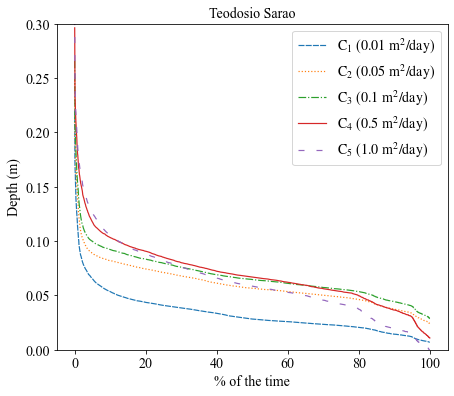

In [161]:
plt.figure(figsize=(7,6))
plt.plot(W5_C1_TS_df_sort["% Tiempo"], W5_C1_TS_df_sort["Depth (m)"], label="$\mathrm{C_1}$ ($\mathrm{0.01}$ $\mathrm{m^2/day}$)",linestyle= '--',  dashes=[5, 1], linewidth=1.2)
plt.plot(W5_C2_TS_df_sort["% Tiempo"], W5_C2_TS_df_sort["Depth (m)"], label="$\mathrm{C_2}$ ($\mathrm{0.05}$ $\mathrm{m^2/day}$)",linestyle= ':',  linewidth=1.2)
plt.plot(W5_C3_TS_df_sort["% Tiempo"], W5_C3_TS_df_sort["Depth (m)"], label="$\mathrm{C_3}$ ($\mathrm{0.1}$ $\mathrm{m^2/day}$)",linestyle= '-.',  linewidth=1.2)
plt.plot(W5_C4_TS_df_sort["% Tiempo"], W5_C4_TS_df_sort["Depth (m)"], label="$\mathrm{C_4}$ ($\mathrm{0.5}$ $\mathrm{m^2/day}$)",linestyle= '-',  linewidth=1.2)
plt.plot(W5_C5_TS_df_sort["% Tiempo"], W5_C5_TS_df_sort["Depth (m)"], label="$\mathrm{C_5}$ ($\mathrm{1.0}$ $\mathrm{m^2/day}$)",linestyle= '--',  dashes=[5, 10], linewidth=1.2)
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.rc('legend', fontsize=14)    # legend fontsize
plt.legend()
plt.ylim(0,0.3)
plt.title("Teodosio Sarao")
plt.savefig("Figures/Anexos/DC_W5_C.svg")

## Flooding Storage Units

In [162]:
df_FSU_C1=import_xls('Iteracion_C_1/FSU_SWMM_TS.xls') #0.01
df_FSU_C2=import_xls('Iteracion_C_2/FSU_SWMM_TS.xls') #0.05
df_FSU_C3=import_xls('Iteracion_K_4/FSU_SWMM_TS.xls') #0.1
df_FSU_C4=import_xls('Iteracion_C_4/FSU_SWMM_TS.xls') #0.5
df_FSU_C5=import_xls('Iteracion_C_5/FSU_SWMM_TS.xls') #1

### Time Series

### Frecuency Analysis

SU1

In [163]:
phi=1
SU1_C1_TS_df_sort=A_frecuencia(df_FSU_C1,"SU1", phi)
SU1_C2_TS_df_sort=A_frecuencia(df_FSU_C2,"SU1", phi)
SU1_C3_TS_df_sort=A_frecuencia(df_FSU_C3,"SU1", phi)
SU1_C4_TS_df_sort=A_frecuencia(df_FSU_C4,"SU1", phi)
SU1_C5_TS_df_sort=A_frecuencia(df_FSU_C5,"SU1", phi)

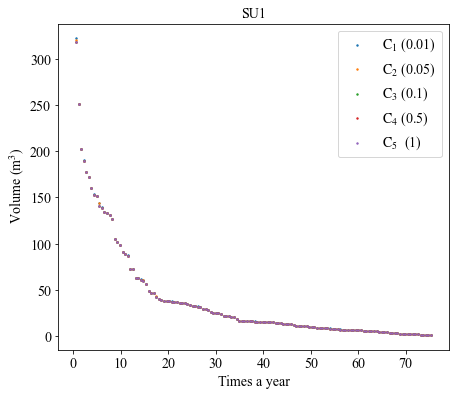

In [164]:
plt.figure(figsize=(7,6))
plt.scatter(1/SU1_C1_TS_df_sort[2]["T"], SU1_C1_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_1}$ (0.01)", s=2)
plt.scatter(1/SU1_C2_TS_df_sort[2]["T"], SU1_C2_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_2}$ (0.05)", s=2)
plt.scatter(1/SU1_C3_TS_df_sort[2]["T"], SU1_C3_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_3}$ (0.1)", s=2)
plt.scatter(1/SU1_C4_TS_df_sort[2]["T"], SU1_C4_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_4}$ (0.5)", s=2)
plt.scatter(1/SU1_C5_TS_df_sort[2]["T"], SU1_C5_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_5}$  (1)", s=2)
plt.ylabel(" Volume $\mathrm{(m^3)}$")
plt.xlabel('Times a year')
plt.title("SU1")
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsizeplt.rc('ytick',labelsize=12)
plt.legend()
plt.savefig("Figures/Anexos/FA_SU1_C.svg")

SU2

In [165]:
phi=1
SU2_C1_TS_df_sort=A_frecuencia(df_FSU_C1,"SU2", phi)
SU2_C2_TS_df_sort=A_frecuencia(df_FSU_C2,"SU2", phi)
SU2_C3_TS_df_sort=A_frecuencia(df_FSU_C3,"SU2", phi)
SU2_C4_TS_df_sort=A_frecuencia(df_FSU_C4,"SU2", phi)
SU2_C5_TS_df_sort=A_frecuencia(df_FSU_C5,"SU2", phi)

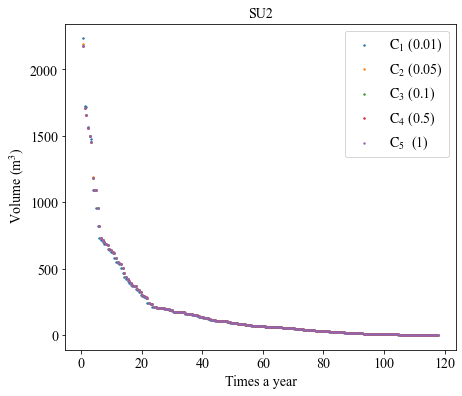

In [166]:
plt.figure(figsize=(7,6))
plt.scatter(1/SU2_C1_TS_df_sort[2]["T"], SU2_C1_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_1}$ (0.01)", s=2)
plt.scatter(1/SU2_C2_TS_df_sort[2]["T"], SU2_C2_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_2}$ (0.05)", s=2)
plt.scatter(1/SU2_C3_TS_df_sort[2]["T"], SU2_C3_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_3}$ (0.1)", s=2)
plt.scatter(1/SU2_C4_TS_df_sort[2]["T"], SU2_C4_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_4}$ (0.5)", s=2)
plt.scatter(1/SU2_C5_TS_df_sort[2]["T"], SU2_C5_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_5}$  (1)", s=2)
plt.ylabel(" Volume $\mathrm{(m^3)}$")
plt.xlabel('Times a year')
plt.title("SU2")
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsizeplt.rc('ytick',labelsize=12)
plt.legend()
plt.savefig("Figures/Anexos/FA_SU2_C.svg")

SU3

In [167]:
phi=1
SU3_C1_TS_df_sort=A_frecuencia(df_FSU_C1,"SU3", phi)
SU3_C2_TS_df_sort=A_frecuencia(df_FSU_C2,"SU3", phi)
SU3_C3_TS_df_sort=A_frecuencia(df_FSU_C3,"SU3", phi)
SU3_C4_TS_df_sort=A_frecuencia(df_FSU_C4,"SU3", phi)
SU3_C5_TS_df_sort=A_frecuencia(df_FSU_C5,"SU3", phi)

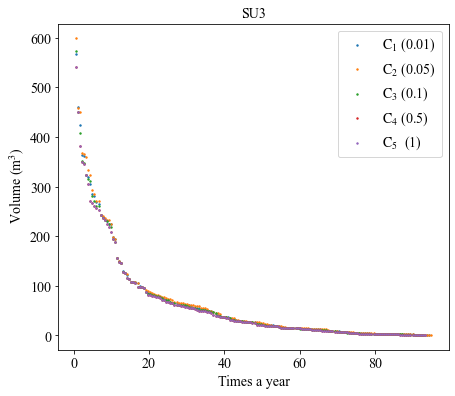

In [168]:
plt.figure(figsize=(7,6))
plt.scatter(1/SU3_C1_TS_df_sort[2]["T"], SU3_C1_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_1}$ (0.01)", s=2)
plt.scatter(1/SU3_C2_TS_df_sort[2]["T"], SU3_C2_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_2}$ (0.05)", s=2)
plt.scatter(1/SU3_C3_TS_df_sort[2]["T"], SU3_C3_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_3}$ (0.1)", s=2)
plt.scatter(1/SU3_C4_TS_df_sort[2]["T"], SU3_C4_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_4}$ (0.5)", s=2)
plt.scatter(1/SU3_C5_TS_df_sort[2]["T"], SU3_C5_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_5}$  (1)", s=2)
plt.ylabel(" Volume $\mathrm{(m^3)}$")
plt.xlabel('Times a year')
plt.title("SU3")
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsizeplt.rc('ytick',labelsize=12)
plt.legend()
plt.savefig("Figures/Anexos/FA_SU3_C.svg")

SU4

In [169]:
phi=1
SU4_C1_TS_df_sort=A_frecuencia(df_FSU_C1,"SU4", phi)
SU4_C2_TS_df_sort=A_frecuencia(df_FSU_C2,"SU4", phi)
SU4_C3_TS_df_sort=A_frecuencia(df_FSU_C3,"SU4", phi)
SU4_C4_TS_df_sort=A_frecuencia(df_FSU_C4,"SU4", phi)
SU4_C5_TS_df_sort=A_frecuencia(df_FSU_C5,"SU4", phi)

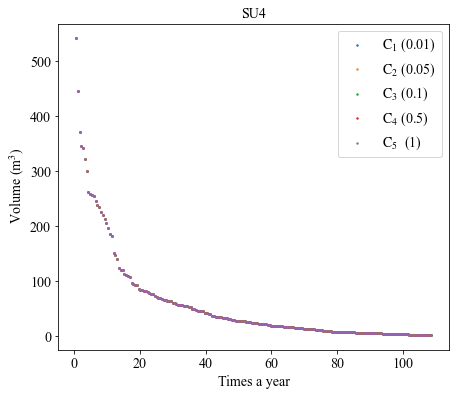

In [170]:
plt.figure(figsize=(7,6))
plt.scatter(1/SU4_C1_TS_df_sort[2]["T"], SU4_C1_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_1}$ (0.01)", s=2)
plt.scatter(1/SU4_C2_TS_df_sort[2]["T"], SU4_C2_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_2}$ (0.05)", s=2)
plt.scatter(1/SU4_C3_TS_df_sort[2]["T"], SU4_C3_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_3}$ (0.1)", s=2)
plt.scatter(1/SU4_C4_TS_df_sort[2]["T"], SU4_C4_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_4}$ (0.5)", s=2)
plt.scatter(1/SU4_C5_TS_df_sort[2]["T"], SU4_C5_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_5}$  (1)", s=2)
plt.ylabel(" Volume $\mathrm{(m^3)}$")
plt.xlabel('Times a year')
plt.title("SU4")
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsizeplt.rc('ytick',labelsize=12)
plt.legend()
plt.savefig("Figures/Anexos/FA_SU4_C.svg")

SU5

In [171]:
phi=1
SU5_C1_TS_df_sort=A_frecuencia(df_FSU_C1,"SU5", phi)
SU5_C2_TS_df_sort=A_frecuencia(df_FSU_C2,"SU5", phi)
SU5_C3_TS_df_sort=A_frecuencia(df_FSU_C3,"SU5", phi)
SU5_C4_TS_df_sort=A_frecuencia(df_FSU_C4,"SU5", phi)
SU5_C5_TS_df_sort=A_frecuencia(df_FSU_C5,"SU5", phi)

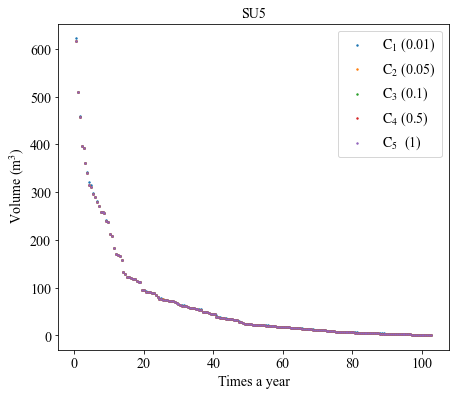

In [172]:
plt.figure(figsize=(7,6))
plt.scatter(1/SU5_C1_TS_df_sort[2]["T"], SU5_C1_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_1}$ (0.01)", s=2)
plt.scatter(1/SU5_C2_TS_df_sort[2]["T"], SU5_C2_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_2}$ (0.05)", s=2)
plt.scatter(1/SU5_C3_TS_df_sort[2]["T"], SU5_C3_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_3}$ (0.1)", s=2)
plt.scatter(1/SU5_C4_TS_df_sort[2]["T"], SU5_C4_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_4}$ (0.5)", s=2)
plt.scatter(1/SU5_C5_TS_df_sort[2]["T"], SU5_C5_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_5}$  (1)", s=2)
plt.ylabel(" Volume $\mathrm{(m^3)}$")
plt.xlabel('Times a year')
plt.title("SU5")
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsizeplt.rc('ytick',labelsize=12)
plt.legend()
plt.savefig("Figures/Anexos/FA_SU5_C.svg")

SU6

In [173]:
phi=1
SU6_C1_TS_df_sort=A_frecuencia(df_FSU_C1,"SU6", phi)
SU6_C2_TS_df_sort=A_frecuencia(df_FSU_C2,"SU6", phi)
SU6_C3_TS_df_sort=A_frecuencia(df_FSU_C3,"SU6", phi)
SU6_C4_TS_df_sort=A_frecuencia(df_FSU_C4,"SU6", phi)
SU6_C5_TS_df_sort=A_frecuencia(df_FSU_C5,"SU6", phi)

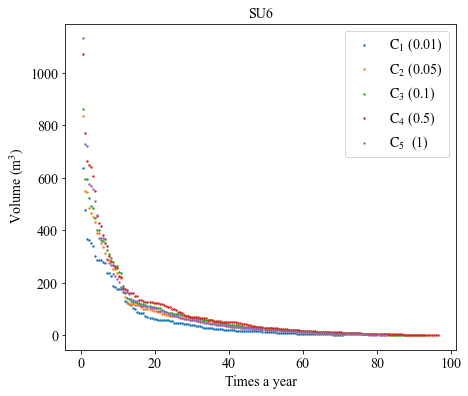

In [174]:
plt.figure(figsize=(7,6))
plt.scatter(1/SU6_C1_TS_df_sort[2]["T"], SU6_C1_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_1}$ (0.01)", s=2)
plt.scatter(1/SU6_C2_TS_df_sort[2]["T"], SU6_C2_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_2}$ (0.05)", s=2)
plt.scatter(1/SU6_C3_TS_df_sort[2]["T"], SU6_C3_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_3}$ (0.1)", s=2)
plt.scatter(1/SU6_C4_TS_df_sort[2]["T"], SU6_C4_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_4}$ (0.5)", s=2)
plt.scatter(1/SU6_C5_TS_df_sort[2]["T"], SU6_C5_TS_df_sort[2]["Volume (m3)"], label="$\mathrm{C_5}$  (1)", s=2)
plt.ylabel(" Volume $\mathrm{(m^3)}$")
plt.xlabel('Times a year')
plt.title("SU6")
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsizeplt.rc('ytick',labelsize=12)
plt.legend()
plt.savefig("Figures/Anexos/FA_SU6_C.svg")

## Zone Budget: RCH - DRN

In [175]:
ZB_by_zone_C1=import_xls_2('Iteracion_C_1/ZB_by_zone.xls') 
ZB_by_zone_C2=import_xls_2('Iteracion_C_2/ZB_by_zone.xls') 
ZB_by_zone_C3=import_xls_2('Iteracion_K_4/ZB_by_zone.xls') 
ZB_by_zone_C4=import_xls_2('Iteracion_C_4/ZB_by_zone.xls') 
ZB_by_zone_C5=import_xls_2('Iteracion_C_5/ZB_by_zone.xls')

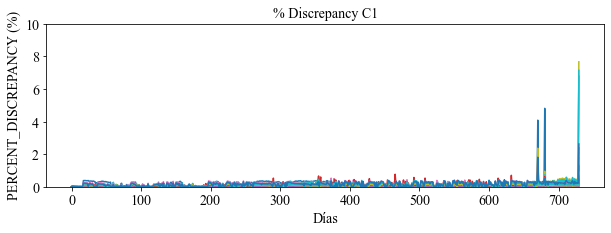

In [176]:
for i in range(len(ZB_by_zone_C1)):
    ZB_by_zone_C1[i]["PERCENT_DISCREPANCY"].plot(figsize=(10,3))
plt.ylabel("PERCENT_DISCREPANCY (%)")
plt.xlabel("Días")
plt.title("% Discrepancy C1")
plt.ylim((0,10))
plt.show()

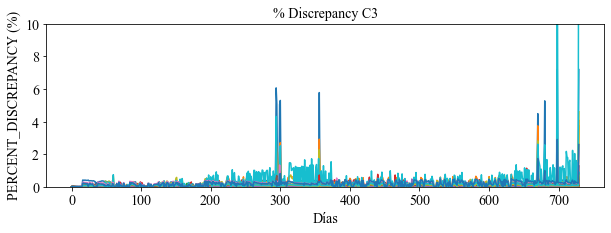

In [177]:
for i in range(len(ZB_by_zone_C3)):
    ZB_by_zone_C3[i]["PERCENT_DISCREPANCY"].plot(figsize=(10,3))
plt.ylabel("PERCENT_DISCREPANCY (%)")
plt.xlabel("Días")
plt.title("% Discrepancy C3")
plt.ylim((0,10))
plt.show()

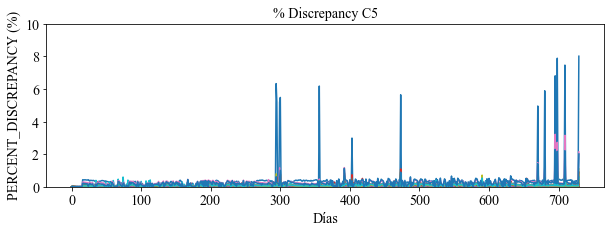

In [178]:
for i in range(len(ZB_by_zone_C5)):
    ZB_by_zone_C5[i]["PERCENT_DISCREPANCY"].plot(figsize=(10,3))
plt.ylabel("PERCENT_DISCREPANCY (%)")
plt.xlabel("Días")
plt.title("% Discrepancy C5")
plt.ylim((0,10))
plt.show()

In [179]:
rch_drn_C1=import_xls_2('Iteracion_C_1/rch_drn.xls')
rch_drn_C2=import_xls_2('Iteracion_C_2/rch_drn.xls') 
rch_drn_C3=import_xls_2('Iteracion_K_4/rch_drn.xls') 
rch_drn_C4=import_xls_2('Iteracion_C_4/rch_drn.xls') 
rch_drn_C5=import_xls_2('Iteracion_C_5/rch_drn.xls') 

In [180]:
rch_drn_C1_S_WSU=rch_drn_S_WSU(rch_drn_C1)
rch_drn_C2_S_WSU=rch_drn_S_WSU(rch_drn_C2)
rch_drn_C3_S_WSU=rch_drn_S_WSU(rch_drn_C3)
rch_drn_C4_S_WSU=rch_drn_S_WSU(rch_drn_C4)
rch_drn_C5_S_WSU=rch_drn_S_WSU(rch_drn_C5)

### Baquedano

Text(0.5, 1.0, 'RCH rate Baquedano')

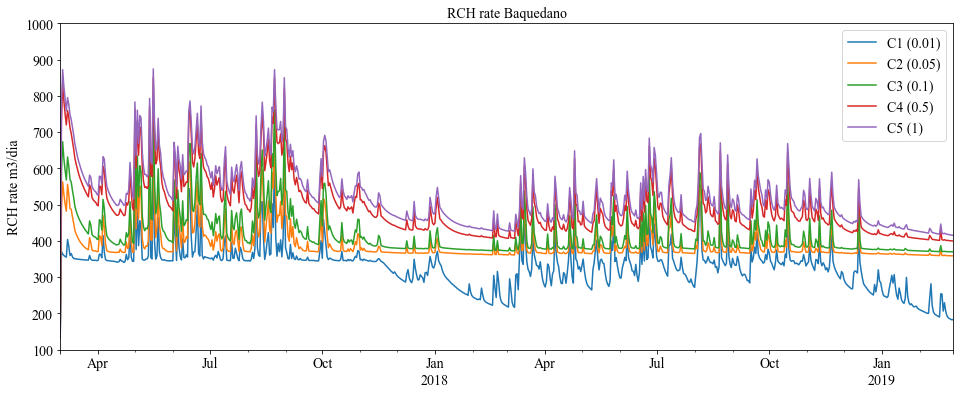

In [181]:
rch_drn_C1_S_WSU[1].W1.plot(label="C1 (0.01)", figsize=(16,6))
rch_drn_C2_S_WSU[1].W1.plot(label="C2 (0.05)")
rch_drn_C3_S_WSU[1].W1.plot(label="C3 (0.1)")
rch_drn_C4_S_WSU[1].W1.plot(label="C4 (0.5)")
rch_drn_C5_S_WSU[1].W1.plot(label="C5 (1)")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.ylim([100,1000])
plt.title("RCH rate Baquedano")

Text(0.5, 1.0, 'DRN rate Baquedano + S10')

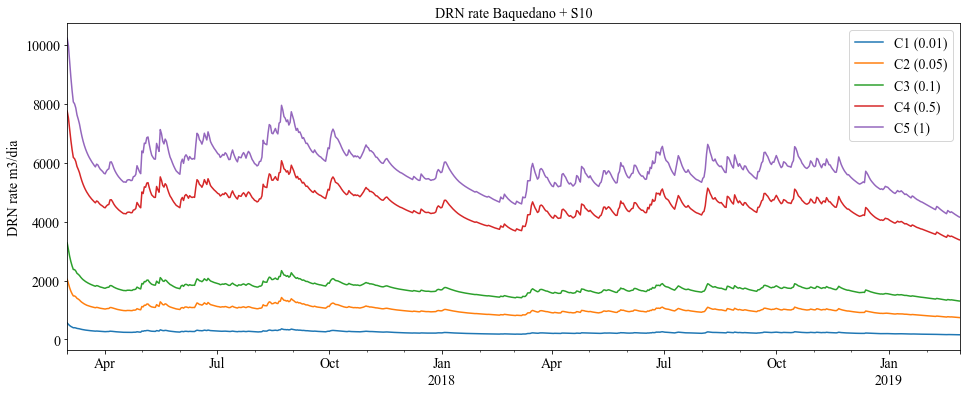

In [182]:
(rch_drn_C1_S_WSU[0].W1+rch_drn_C1_S_WSU[2].S10).plot(label="C1 (0.01)", figsize=(16,6))
(rch_drn_C2_S_WSU[0].W1+rch_drn_C2_S_WSU[2].S10).plot(label="C2 (0.05)")
(rch_drn_C3_S_WSU[0].W1+rch_drn_C3_S_WSU[2].S10).plot(label="C3 (0.1)")
(rch_drn_C4_S_WSU[0].W1+rch_drn_C4_S_WSU[2].S10).plot(label="C4 (0.5)")
(rch_drn_C5_S_WSU[0].W1+rch_drn_C5_S_WSU[2].S10).plot(label="C5 (1)")
plt.legend()
plt.ylabel("DRN rate m3/dia")
#plt.ylim([0,2500])
plt.title("DRN rate Baquedano + S10")

In [183]:
rch_drn_C2_S_WSU[0].W1["2017-05-01":"2019-03-01"]

2017-05-01    1118.919373
2017-05-02    1106.277943
2017-05-03    1157.911301
2017-05-04    1153.342724
2017-05-05    1187.432766
                 ...     
2019-02-24     754.765511
2019-02-25     751.048565
2019-02-26     747.400284
2019-02-27     743.933678
2019-02-28     741.429329
Freq: D, Name: W1, Length: 669, dtype: float64

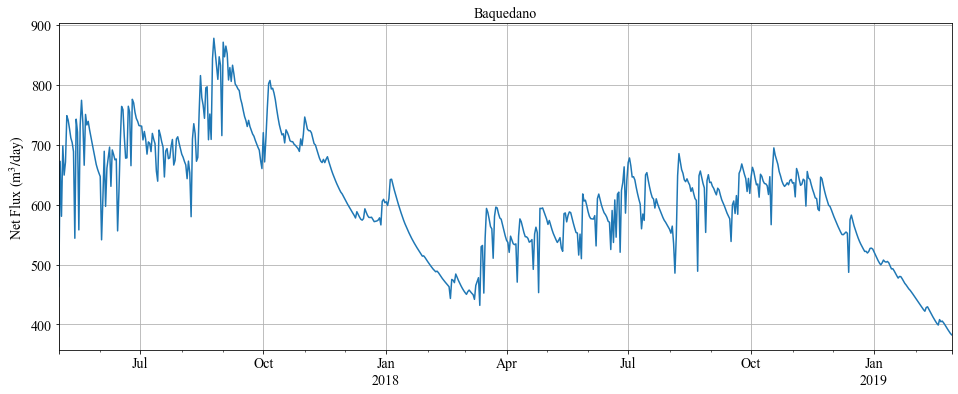

In [184]:
#(rch_drn_C1_S_WSU[0].W1+rch_drn_C1_S_WSU[2].S10-rch_drn_C1_S_WSU[1].W1).plot(label="C1 (0.01)", figsize=(12,4))
(rch_drn_C2_S_WSU[0].W1["2017-05-01":"2019-03-01"]+rch_drn_C2_S_WSU[2].S10["2017-05-01":"2019-03-01"]-rch_drn_C2_S_WSU[1].W1["2017-05-01":"2019-03-01"]).plot(label="C2 (0.05)", figsize=(16,6))
#(rch_drn_C3_S_WSU[0].W1+rch_drn_C3_S_WSU[2].S10-rch_drn_C3_S_WSU[1].W1).plot(label="C3 (0.1)")
#(rch_drn_C4_S_WSU[0].W1+rch_drn_C4_S_WSU[2].S10-rch_drn_C4_S_WSU[1].W1).plot(label="C4 (0.5)")
#(rch_drn_C5_S_WSU[0].W1+rch_drn_C5_S_WSU[2].S10-rch_drn_C5_S_WSU[1].W1).plot(label="C5 (1)")
plt.ylabel("Net Flux $\mathrm{(m^3/day)}$")
#plt.ylim([500,2000])
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.title("Baquedano")
plt.grid()
plt.savefig("Figures/Anexos/DRN_RCH_TS_W1.svg")

### El Loto

Text(0.5, 1.0, 'RCH rate El Loto')

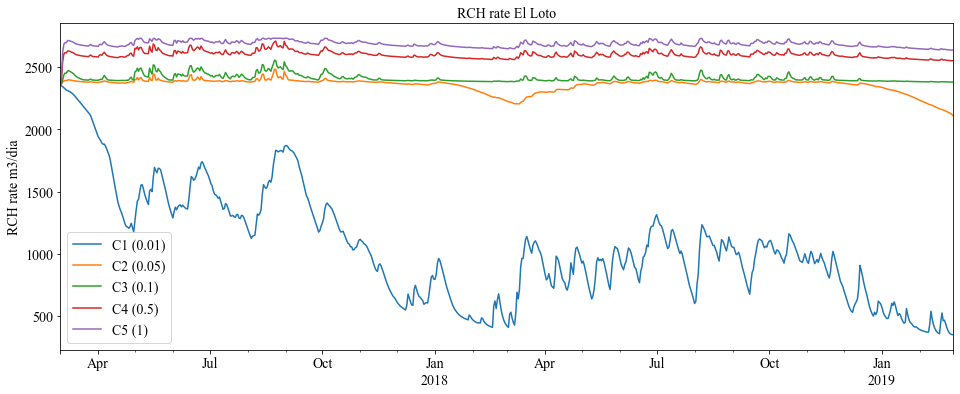

In [185]:
rch_drn_C1_S_WSU[1].W2.plot(label="C1 (0.01)", figsize=(16,6))
rch_drn_C2_S_WSU[1].W2.plot(label="C2 (0.05)")
rch_drn_C3_S_WSU[1].W2.plot(label="C3 (0.1)")
rch_drn_C4_S_WSU[1].W2.plot(label="C4 (0.5)")
rch_drn_C5_S_WSU[1].W2.plot(label="C5 (1)")
plt.legend()
plt.ylabel("RCH rate m3/dia")
#plt.ylim([100,1000])
plt.title("RCH rate El Loto")

Text(0.5, 1.0, 'DRN  El Loto + S16 + S17 + S23')

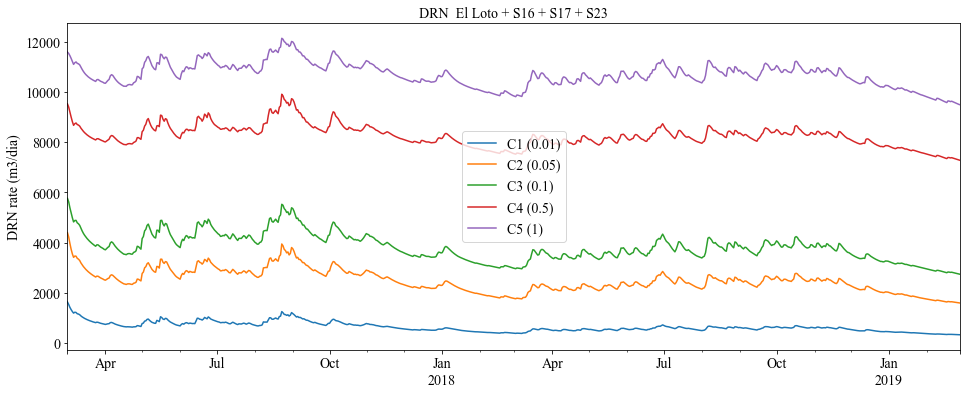

In [186]:
(rch_drn_C1_S_WSU[0].W2+rch_drn_C1_S_WSU[2].S16+rch_drn_C1_S_WSU[2].S17+rch_drn_C1_S_WSU[2].S23).plot(label="C1 (0.01)", figsize=(16,6))
(rch_drn_C2_S_WSU[0].W2+rch_drn_C2_S_WSU[2].S16+rch_drn_C2_S_WSU[2].S17+rch_drn_C2_S_WSU[2].S23).plot(label="C2 (0.05)")
(rch_drn_C3_S_WSU[0].W2+rch_drn_C3_S_WSU[2].S16+rch_drn_C3_S_WSU[2].S17+rch_drn_C3_S_WSU[2].S23).plot(label="C3 (0.1)")
(rch_drn_C4_S_WSU[0].W2+rch_drn_C4_S_WSU[2].S16+rch_drn_C4_S_WSU[2].S17+rch_drn_C4_S_WSU[2].S23).plot(label="C4 (0.5)")
(rch_drn_C5_S_WSU[0].W2+rch_drn_C5_S_WSU[2].S16+rch_drn_C5_S_WSU[2].S17+rch_drn_C5_S_WSU[2].S23).plot(label="C5 (1)")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
#plt.ylim([2000,6000])
plt.title("DRN  El Loto + S16 + S17 + S23")

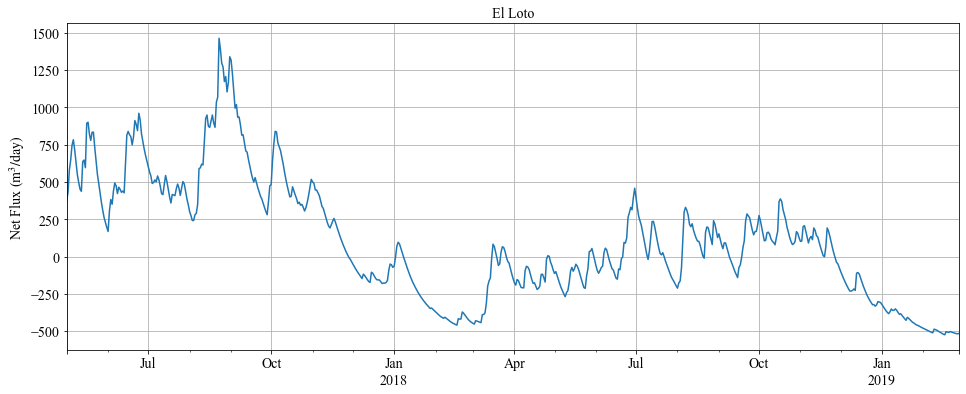

In [187]:
#(rch_drn_C1_S_WSU[0].W2+rch_drn_C1_S_WSU[2].S16+rch_drn_C1_S_WSU[2].S17+rch_drn_C1_S_WSU[2].S23-rch_drn_C1_S_WSU[1].W2).plot(label="C1 (0.01)", figsize=(16,6))
(rch_drn_C2_S_WSU[0].W2["2017-05-01":"2019-03-01"]+rch_drn_C2_S_WSU[2].S16["2017-05-01":"2019-03-01"]+rch_drn_C2_S_WSU[2].S17["2017-05-01":"2019-03-01"]+rch_drn_C2_S_WSU[2].S23["2017-05-01":"2019-03-01"]-rch_drn_C2_S_WSU[1].W2["2017-05-01":"2019-03-01"]).plot(label="C2 (0.05)", figsize=(16,6))
#(rch_drn_C3_S_WSU[0].W2+rch_drn_C3_S_WSU[2].S16+rch_drn_C3_S_WSU[2].S17+rch_drn_C3_S_WSU[2].S23-rch_drn_C3_S_WSU[1].W2).plot(label="C3 (0.1)")
#(rch_drn_C4_S_WSU[0].W2+rch_drn_C4_S_WSU[2].S16+rch_drn_C4_S_WSU[2].S17+rch_drn_C4_S_WSU[2].S23-rch_drn_C4_S_WSU[1].W2).plot(label="C4 (0.5)")
#(rch_drn_C5_S_WSU[0].W2+rch_drn_C5_S_WSU[2].S16+rch_drn_C5_S_WSU[2].S17+rch_drn_C5_S_WSU[2].S23-rch_drn_C5_S_WSU[1].W2).plot(label="C5 (1)")
#plt.legend()
plt.ylabel("Net Flux $\mathrm{(m^3/day)}$")
#plt.ylim([0,3000])
plt.title("El Loto")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.grid()
plt.savefig("Figures/Anexos/DRN_RCH_TS_W2.svg")

### Los Helechos

Text(0.5, 1.0, 'RCH rate Los Helechos')

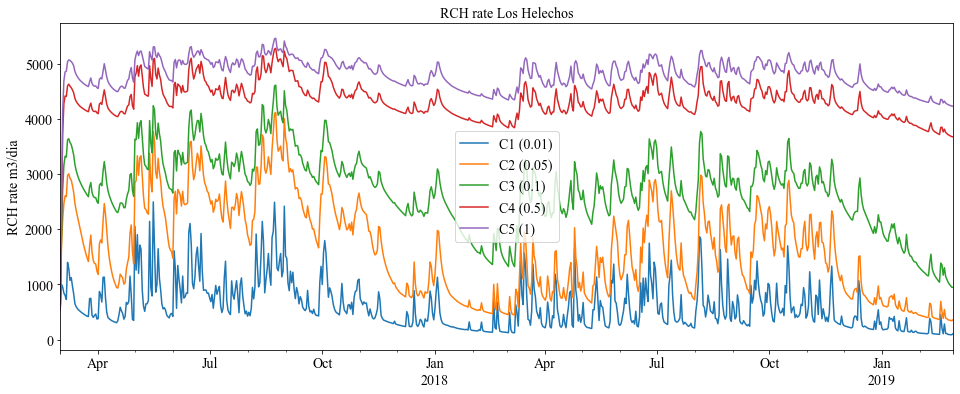

In [188]:
rch_drn_C1_S_WSU[1].W3.plot(label="C1 (0.01)", figsize=(16,6))
rch_drn_C2_S_WSU[1].W3.plot(label="C2 (0.05)")
rch_drn_C3_S_WSU[1].W3.plot(label="C3 (0.1)")
rch_drn_C4_S_WSU[1].W3.plot(label="C4 (0.5)")
rch_drn_C5_S_WSU[1].W3.plot(label="C5 (1)")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.title("RCH rate Los Helechos")

Text(0.5, 1.0, 'DRN Los Helechos + S29')

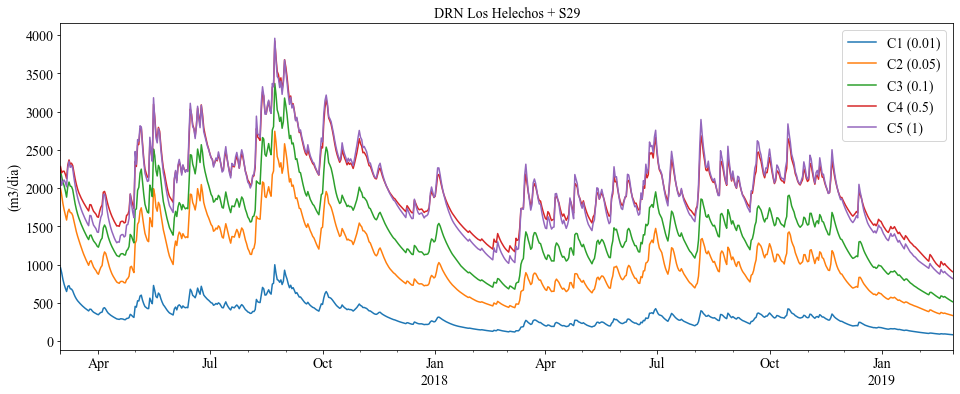

In [189]:
(rch_drn_C1_S_WSU[0].W3+rch_drn_C1_S_WSU[2].S29).plot(label="C1 (0.01)", figsize=(16,6))
(rch_drn_C2_S_WSU[0].W3+rch_drn_C2_S_WSU[2].S29).plot(label="C2 (0.05)")
(rch_drn_C3_S_WSU[0].W3+rch_drn_C3_S_WSU[2].S29).plot(label="C3 (0.1)")
(rch_drn_C4_S_WSU[0].W3+rch_drn_C4_S_WSU[2].S29).plot(label="C4 (0.5)")
(rch_drn_C5_S_WSU[0].W3+rch_drn_C5_S_WSU[2].S29).plot(label="C5 (1)")
plt.legend()
plt.ylabel("(m3/dia)")
plt.title("DRN Los Helechos + S29")

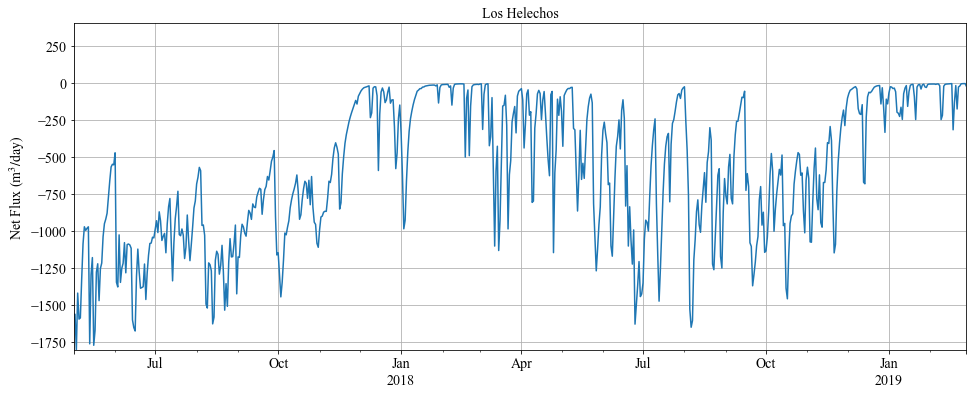

In [190]:
#(rch_drn_C1_S_WSU[0].W3+rch_drn_C1_S_WSU[2].S29-rch_drn_C1_S_WSU[1].W3).plot(label="C1 (0.01)", figsize=(16,6))
(rch_drn_C2_S_WSU[0].W3["2017-05-01":"2019-03-01"]+rch_drn_C2_S_WSU[2].S29["2017-05-01":"2019-03-01"]-rch_drn_C2_S_WSU[1].W3["2017-05-01":"2019-03-01"]).plot(label="C2 (0.05)", figsize=(16,6))
#(rch_drn_C3_S_WSU[0].W3+rch_drn_C3_S_WSU[2].S29-rch_drn_C3_S_WSU[1].W3).plot(label="C3 (0.1)")
#(rch_drn_C4_S_WSU[0].W3+rch_drn_C4_S_WSU[2].S29-rch_drn_C4_S_WSU[1].W3).plot(label="C4 (0.5)")
#(rch_drn_C5_S_WSU[0].W3+rch_drn_C5_S_WSU[2].S29-rch_drn_C5_S_WSU[1].W3).plot(label="C5 (1)")
plt.ylim(-1800,400)
plt.ylabel("Net Flux $\mathrm{(m^3/day)}$")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.grid()
plt.title("Los Helechos")
plt.savefig("Figures/Anexos/DRN_RCH_TS_W3.svg")

### Las Ranas

Text(0.5, 1.0, 'RCH rate Las Ranas')

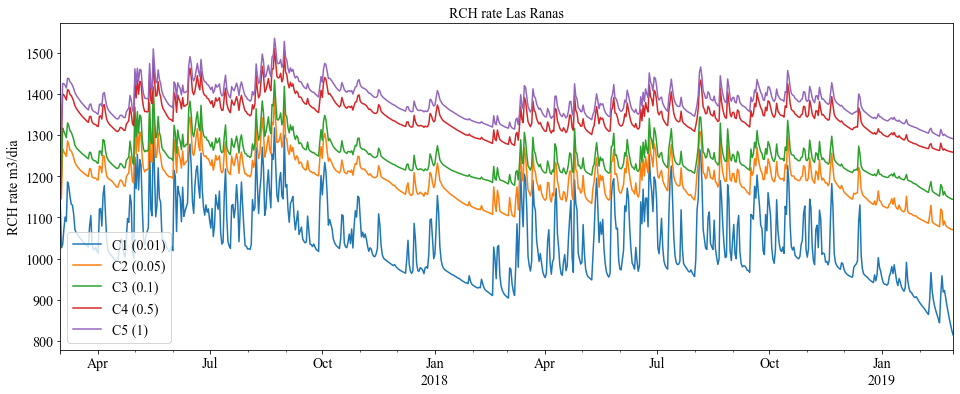

In [191]:
rch_drn_C1_S_WSU[1].W4.plot(label="C1 (0.01)", figsize=(16,6))
rch_drn_C2_S_WSU[1].W4.plot(label="C2 (0.05)")
rch_drn_C3_S_WSU[1].W4.plot(label="C3 (0.1)")
rch_drn_C4_S_WSU[1].W4.plot(label="C4 (0.5)")
rch_drn_C5_S_WSU[1].W4.plot(label="C5 (1)")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.title("RCH rate Las Ranas")

Text(0.5, 1.0, 'DRN La Ranas + S31 + S33 + S34')

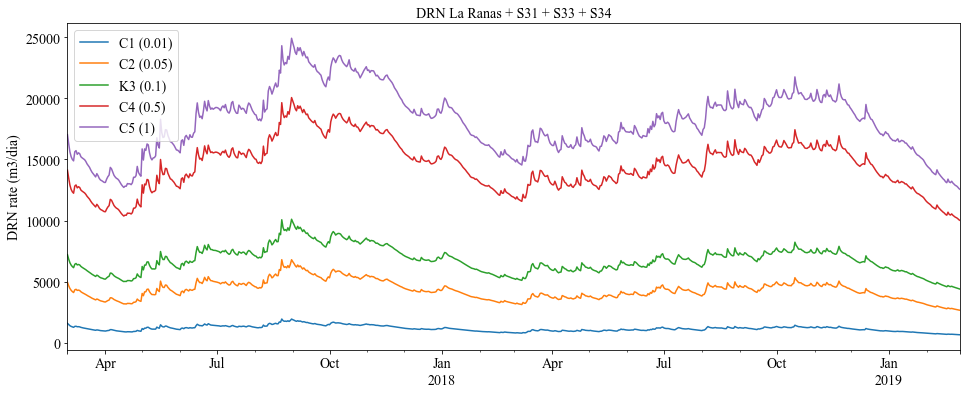

In [192]:
(rch_drn_C1_S_WSU[0].W4+rch_drn_C1_S_WSU[2].S31+rch_drn_C1_S_WSU[2].S33+rch_drn_C1_S_WSU[2].S34).plot(label="C1 (0.01)", figsize=(16,6))
(rch_drn_C2_S_WSU[0].W4+rch_drn_C2_S_WSU[2].S31+rch_drn_C2_S_WSU[2].S33+rch_drn_C2_S_WSU[2].S34).plot(label="C2 (0.05)")
(rch_drn_C3_S_WSU[0].W4+rch_drn_C3_S_WSU[2].S31+rch_drn_C3_S_WSU[2].S33+rch_drn_C3_S_WSU[2].S34).plot(label="K3 (0.1)")
(rch_drn_C4_S_WSU[0].W4+rch_drn_C4_S_WSU[2].S31+rch_drn_C4_S_WSU[2].S33+rch_drn_C4_S_WSU[2].S34).plot(label="C4 (0.5)")
(rch_drn_C5_S_WSU[0].W4+rch_drn_C5_S_WSU[2].S31+rch_drn_C5_S_WSU[2].S33+rch_drn_C5_S_WSU[2].S34).plot(label="C5 (1)")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
plt.title("DRN La Ranas + S31 + S33 + S34")

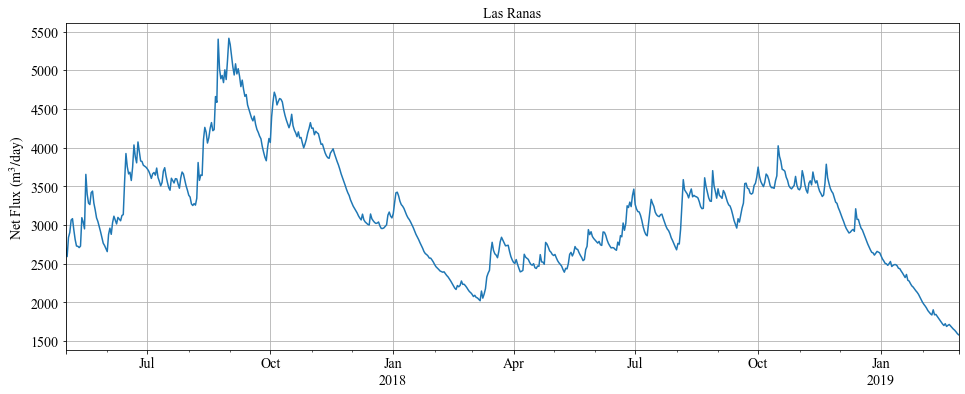

In [193]:
#(rch_drn_C1_S_WSU[0].W4+rch_drn_C1_S_WSU[2].S31+rch_drn_C1_S_WSU[2].S33+rch_drn_C1_S_WSU[2].S34-rch_drn_C1_S_WSU[1].W4).plot(label="C1 (0.01)", figsize=(16,6))
(rch_drn_C2_S_WSU[0].W4["2017-05-01":"2019-03-01"]+rch_drn_C2_S_WSU[2].S31["2017-05-01":"2019-03-01"]+rch_drn_C2_S_WSU[2].S33["2017-05-01":"2019-03-01"]+rch_drn_C2_S_WSU[2].S34["2017-05-01":"2019-03-01"]-rch_drn_C2_S_WSU[1].W4["2017-05-01":"2019-03-01"]).plot(label="C2 (0.05)", figsize=(16,6))
#(rch_drn_C3_S_WSU[0].W4+rch_drn_C3_S_WSU[2].S31+rch_drn_C3_S_WSU[2].S33+rch_drn_C3_S_WSU[2].S34-rch_drn_C3_S_WSU[1].W4).plot(label="C3 (0.1)")
#(rch_drn_C4_S_WSU[0].W4+rch_drn_C4_S_WSU[2].S31+rch_drn_C4_S_WSU[2].S33+rch_drn_C4_S_WSU[2].S34-rch_drn_C4_S_WSU[1].W4).plot(label="C4 (0.5)")
#(rch_drn_C5_S_WSU[0].W4+rch_drn_C5_S_WSU[2].S31+rch_drn_C5_S_WSU[2].S33+rch_drn_C5_S_WSU[2].S34-rch_drn_C5_S_WSU[1].W4).plot(label="C5 (1)")
plt.ylabel("Net Flux $\mathrm{(m^3/day)}$")
plt.title("Las Ranas")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.grid()
plt.savefig("Figures/Anexos/DRN_RCH_TS_W4.svg")

### Humedal Estero Teodosio Sarao

Text(0.5, 1.0, 'RCH rate Humedal Estero Teodosio Sarao')

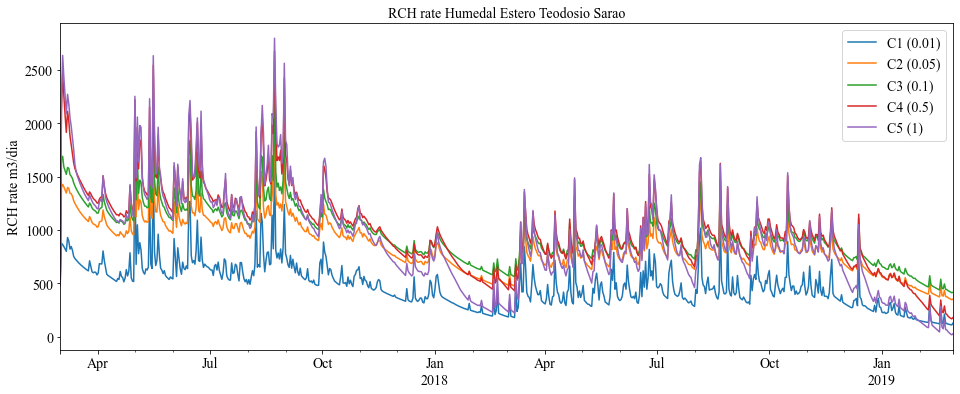

In [194]:
rch_drn_C1_S_WSU[1].W5.plot(label="C1 (0.01)", figsize=(16,6))
rch_drn_C2_S_WSU[1].W5.plot(label="C2 (0.05)")
rch_drn_C3_S_WSU[1].W5.plot(label="C3 (0.1)")
rch_drn_C4_S_WSU[1].W5.plot(label="C4 (0.5)")
rch_drn_C5_S_WSU[1].W5.plot(label="C5 (1)")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.title("RCH rate Humedal Estero Teodosio Sarao")

Text(0.5, 1.0, 'DRN Humedal Estero Teodosio Sarao')

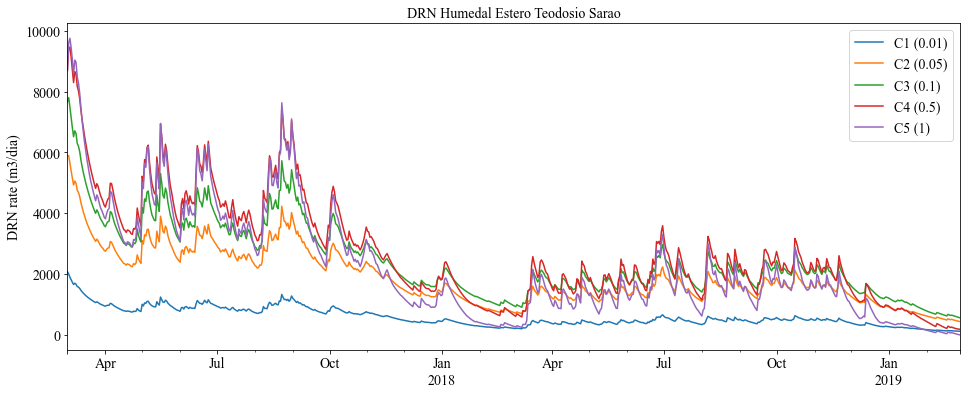

In [195]:
(rch_drn_C1_S_WSU[0].W5).plot(label="C1 (0.01)", figsize=(16,6))
(rch_drn_C2_S_WSU[0].W5).plot(label="C2 (0.05)")
(rch_drn_C3_S_WSU[0].W5).plot(label="C3 (0.1)")
(rch_drn_C4_S_WSU[0].W5).plot(label="C4 (0.5)")
(rch_drn_C5_S_WSU[0].W5).plot(label="C5 (1)")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
plt.title("DRN Humedal Estero Teodosio Sarao")

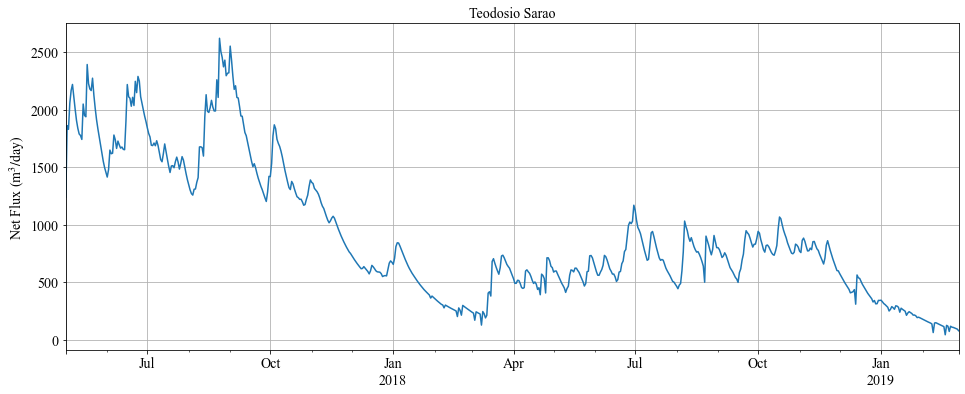

In [196]:
#(rch_drn_C1_S_WSU[0].W5-rch_drn_C1_S_WSU[1].W5).plot(label="C1 (0.01)", figsize=(16,6))
(rch_drn_C2_S_WSU[0].W5["2017-05-01":"2019-03-01"]-rch_drn_C2_S_WSU[1].W5["2017-05-01":"2019-03-01"]).plot(label="C2 (0.05)", figsize=(16,6))
#(rch_drn_C3_S_WSU[0].W5-rch_drn_C3_S_WSU[1].W5).plot(label="C3 (0.1)")
#(rch_drn_C4_S_WSU[0].W5-rch_drn_C4_S_WSU[1].W5).plot(label="C4 (0.5)")
#(rch_drn_C5_S_WSU[0].W5-rch_drn_C3_S_WSU[1].W5).plot(label="C5 (1)")
plt.ylabel("Net Flux $\mathrm{(m^3/day)}$")
plt.title("Teodosio Sarao")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.grid()
plt.savefig("Figures/Anexos/DRN_RCH_TS_W5.svg")

## Sensitive Analisis Resume

In [197]:
df_sensitive_analisis_W_h_C=pd.DataFrame(index=["C", "W1", "W2", "W3", "W4", "W5"])

In [198]:
df_sensitive_analisis_W_h_C["C1"]=""
df_sensitive_analisis_W_h_C["C2"]=""
df_sensitive_analisis_W_h_C["C3"]=""
df_sensitive_analisis_W_h_C["C4"]=""
df_sensitive_analisis_W_h_C["C5"]=""

In [199]:
df_sensitive_analisis_W_h_C["C1"]["C"]=0.01
df_sensitive_analisis_W_h_C["C2"]["C"]=0.05
df_sensitive_analisis_W_h_C["C3"]["C"]=0.1
df_sensitive_analisis_W_h_C["C4"]["C"]=0.5
df_sensitive_analisis_W_h_C["C5"]["C"]=1

In [200]:
j="W1"
df_sensitive_analisis_W_h_C["C1"][j]= W1_C1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C2"][j]= W1_C2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C3"][j]= W1_C3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C4"][j]= W1_C4_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C5"][j]= W1_C5_TS_df_sort["Depth (m)"].mean()

In [201]:
j="W2"
df_sensitive_analisis_W_h_C["C1"][j]= W2_C1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C2"][j]= W2_C2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C3"][j]= W2_C3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C4"][j]= W2_C4_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C5"][j]= W2_C5_TS_df_sort["Depth (m)"].mean()

In [202]:
j="W3"
df_sensitive_analisis_W_h_C["C1"][j]= W3_C1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C2"][j]= W3_C2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C3"][j]= W3_C3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C4"][j]= W3_C4_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C5"][j]= W3_C5_TS_df_sort["Depth (m)"].mean()

In [203]:
j="W4"
df_sensitive_analisis_W_h_C["C1"][j]= W4_C1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C2"][j]= W4_C2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C3"][j]= W4_C3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C4"][j]= W4_C4_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C5"][j]= W4_C5_TS_df_sort["Depth (m)"].mean()

In [204]:
j="W5"
df_sensitive_analisis_W_h_C["C1"][j]= W5_C1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C2"][j]= W5_C2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C3"][j]= W5_C3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C4"][j]= W5_C4_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_C["C5"][j]= W5_C5_TS_df_sort["Depth (m)"].mean()

In [205]:
df_sensitive_analisis_W_h_C

,C1,C2,C3,C4,C5
C,0.01,0.05,0.1,0.5,1
W1,0.733928,0.769992,0.780085,0.810732,0.822208
W2,0.748123,2.84503,2.99748,3.12181,3.17402
W3,0.146279,0.248673,0.325817,0.437681,0.482958
W4,0.967762,1.05206,1.08426,1.14594,1.16787
W5,0.0331606,0.0600365,0.0680864,0.0703031,0.0632566


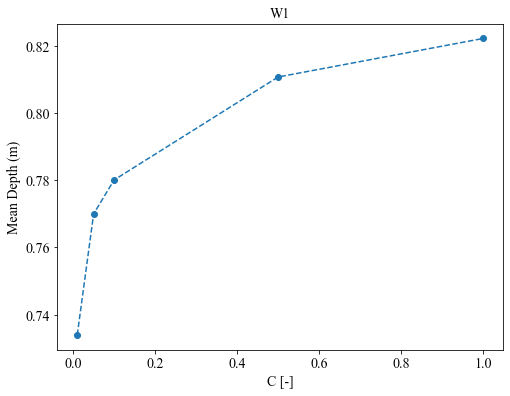

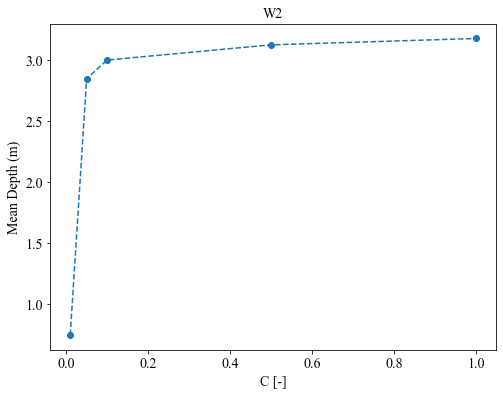

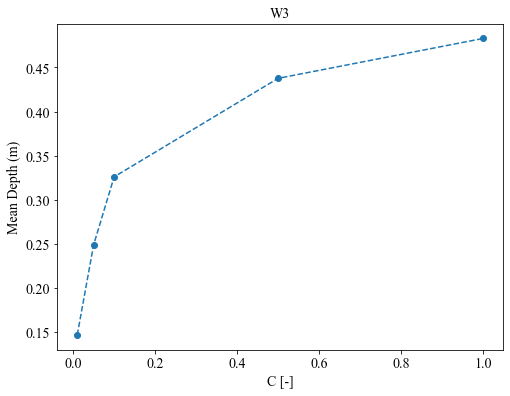

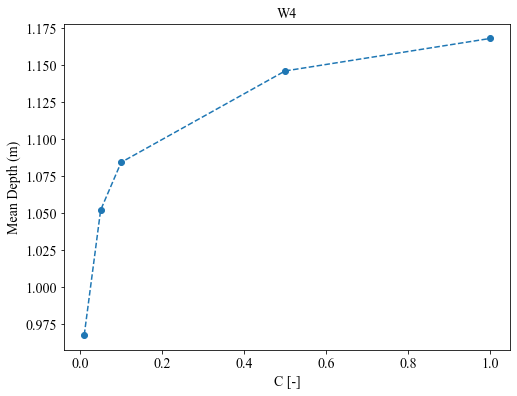

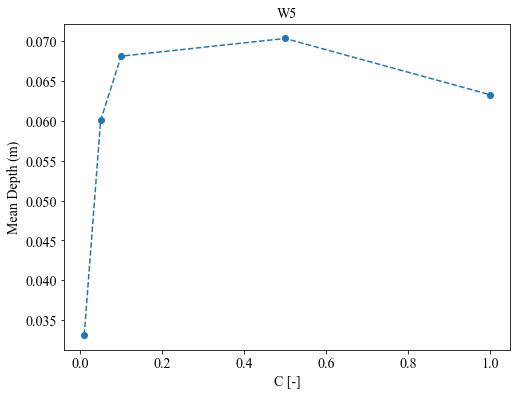

In [206]:
for i in df_sensitive_analisis_W_h_C.index[1:]:
    plt.figure(figsize=(8,6))
    plt.title(i)
    plt.ylabel("Mean Depth (m)")
    plt.xlabel("C [-]")
    plt.plot(df_sensitive_analisis_W_h_C.loc["C"],df_sensitive_analisis_W_h_C.loc[i], '--o')
    #plt.xscale("log")

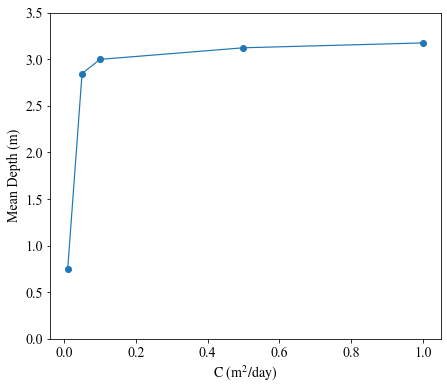

In [207]:
plt.figure(figsize=(7,6))
plt.plot(df_sensitive_analisis_W_h_C.loc["C"],df_sensitive_analisis_W_h_C.loc["W2"], marker='o', linewidth=1.2)
plt.ylim(0.2, 3.4)
plt.xlabel("$\mathrm{C}$ ($\mathrm{m^2/day}$)")
plt.ylabel("Mean Depth (m)")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.ylim(0, 3.5)
# plt.rc('legend', fontsize=14)    # legend fontsize
#plt.title("Curvas de Duración Altura Humedal El Loto")
plt.savefig("Figures/Fig7e.png")

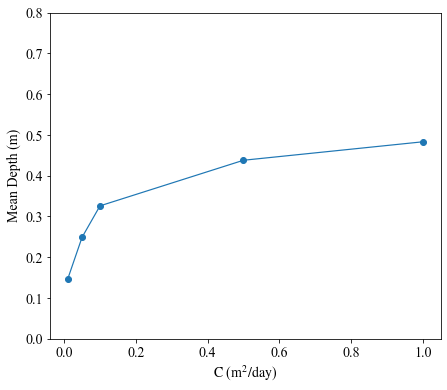

In [208]:
plt.figure(figsize=(7,6))
plt.plot(df_sensitive_analisis_W_h_C.loc["C"],df_sensitive_analisis_W_h_C.loc["W3"], marker='o', linewidth=1.2)
plt.ylim(0.2, 3.4)
plt.xlabel("$\mathrm{C}$ ($\mathrm{m^2/day}$)")
plt.ylabel("Mean Depth (m)")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.ylim(0, 0.8)
#plt.rc('legend', fontsize=14)    # legend fontsize
#plt.title("Curvas de Duración Altura Humedal El Loto")
plt.savefig("Figures/Fig8e.png")

## Flooding Resume

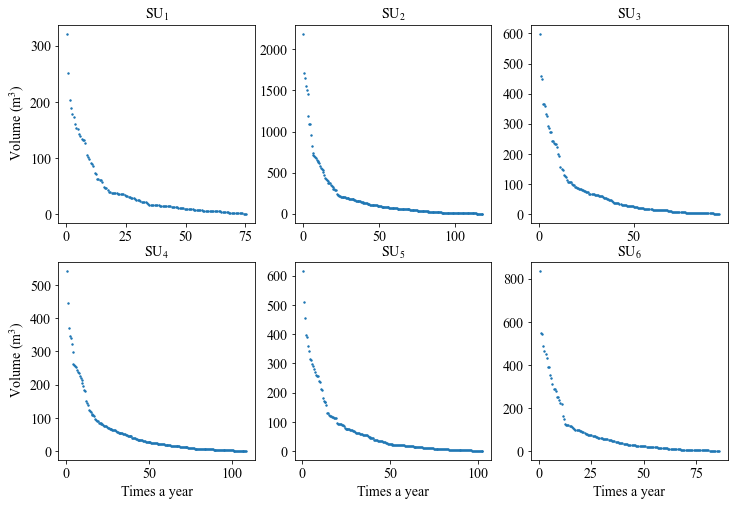

In [209]:
n=14
f, ((ax1, ax2, ax3), (ax4, ax5, ax6) )= plt.subplots(2,3, figsize=(12,8))
ax1.scatter(1/SU1_C2_TS_df_sort[2]["T"], SU1_C2_TS_df_sort[2]["Volume (m3)"], s=2)
ax2.scatter(1/SU2_C2_TS_df_sort[2]["T"], SU2_C2_TS_df_sort[2]["Volume (m3)"], s=2)
ax3.scatter(1/SU3_C2_TS_df_sort[2]["T"], SU3_C2_TS_df_sort[2]["Volume (m3)"], s=2)
ax4.scatter(1/SU4_C2_TS_df_sort[2]["T"], SU4_C2_TS_df_sort[2]["Volume (m3)"], s=2)
ax5.scatter(1/SU5_C2_TS_df_sort[2]["T"], SU5_C2_TS_df_sort[2]["Volume (m3)"], s=2)
ax6.scatter(1/SU6_C2_TS_df_sort[2]["T"], SU6_C2_TS_df_sort[2]["Volume (m3)"], s=2)
ax1.set_ylabel(" Volume $\mathrm{(m^3)}$", fontsize=n)
ax4.set_ylabel(" Volume $\mathrm{(m^3)}$", fontsize=n)
ax4.set_xlabel('Times a year', fontsize=n)
ax5.set_xlabel('Times a year', fontsize=n)
ax6.set_xlabel('Times a year', fontsize=n)
ax1.set_title("$\mathrm{SU_1}$")
ax2.set_title("$\mathrm{SU_2}$")
ax3.set_title("$\mathrm{SU_3}$")
ax4.set_title("$\mathrm{SU_4}$")
ax5.set_title("$\mathrm{SU_5}$")
ax6.set_title("$\mathrm{SU_6}$")
plt.rc('ytick',labelsize=n)
plt.rc('xtick',labelsize=n)
plt.savefig("Figures/Fig10a.svg")

In [364]:
SU1_C2_TS_df_sort[2].quantile(0.8)

Volume (m3)    53.580911
T               0.064561
Name: 0.8, dtype: float64

In [372]:
SU2_C2_TS_df_sort[2].quantile(0.8)

Volume (m3)    213.721059
T                0.041659
Name: 0.8, dtype: float64

In [366]:
SU3_C2_TS_df_sort[2].quantile(0.8)

Volume (m3)    90.469801
T               0.051498
Name: 0.8, dtype: float64

In [367]:
SU4_C2_TS_df_sort[2].quantile(0.8)

Volume (m3)    80.725073
T               0.045154
Name: 0.8, dtype: float64

In [368]:
SU5_C2_TS_df_sort[2].quantile(0.8)

Volume (m3)    91.670968
T               0.047742
Name: 0.8, dtype: float64

In [369]:
SU6_C2_TS_df_sort[2].quantile(0.8)

Volume (m3)    99.179174
T               0.056934
Name: 0.8, dtype: float64

# Storage

## Wetland Storage Units

### Time Series

In [210]:
df_WSU_S1=import_xls('Iteracion_S_1/WSU_SWMM_TS.xls') # 0.05
df_WSU_S2=import_xls('Iteracion_S_2/WSU_SWMM_TS.xls') # 0.1
df_WSU_S3=import_xls('Iteracion_K_4/WSU_SWMM_TS.xls') # 0.15
df_WSU_S4=import_xls('Iteracion_S_4/WSU_SWMM_TS.xls') # 0.25

In [211]:
WSU_name="W1"
i=WSU_names_list.index(WSU_name)

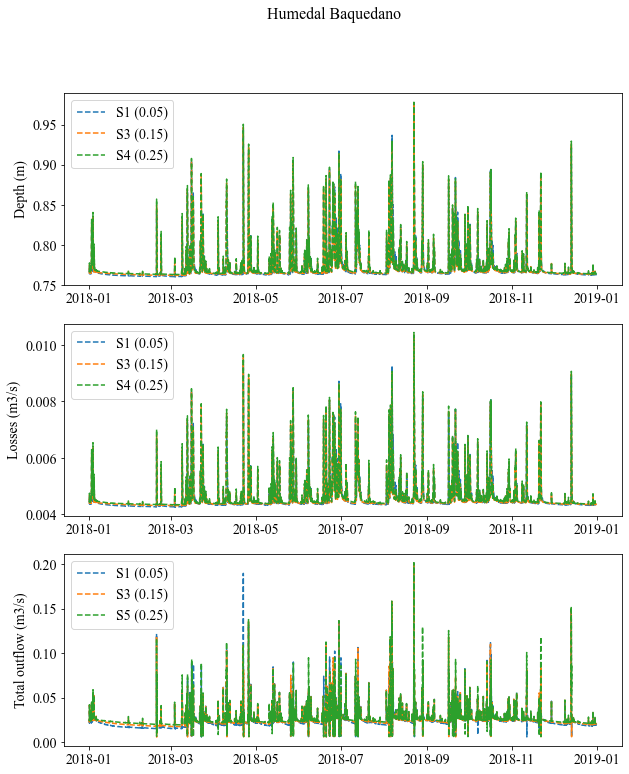

In [212]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Depth (m)"], label="S1 (0.05)",linestyle="--" )
ax1.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Depth (m)"], label="S3 (0.15)",linestyle="--" )
ax1.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Depth (m)"], label="S4 (0.25)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Losses (m3/s)"],label="S1 (0.05)",linestyle="--")
ax3.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Losses (m3/s)"],label="S3 (0.15)",linestyle="--")
ax3.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Losses (m3/s)"],label="S4 (0.25)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Total outflow (m3/s)"],label="S1 (0.05)",linestyle="--" )
ax4.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Total outflow (m3/s)"],label="S3 (0.15)",linestyle="--" )
ax4.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Total outflow (m3/s)"],label="S5 (0.25)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Baquedano",fontsize=16)
plt.show()

In [213]:
WSU_name="W2"
i=WSU_names_list.index(WSU_name)

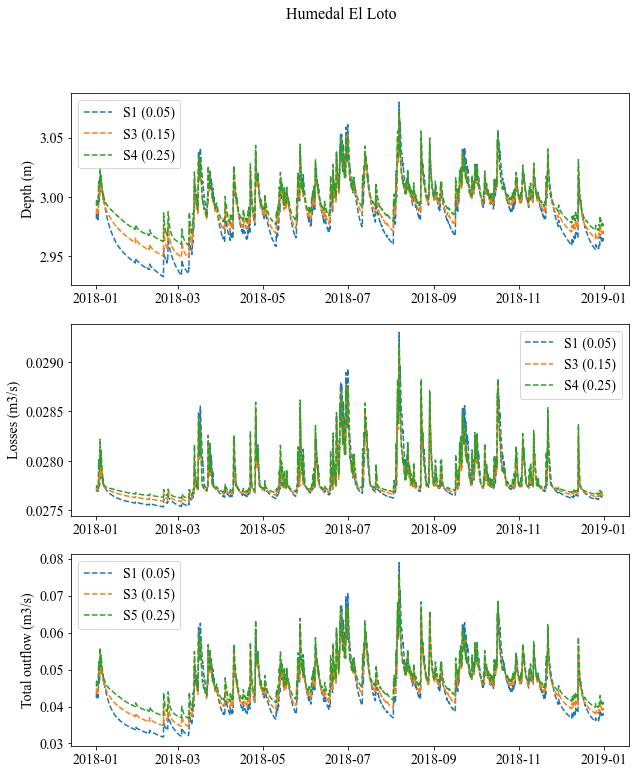

In [214]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Depth (m)"], label="S1 (0.05)",linestyle="--" )
ax1.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Depth (m)"], label="S3 (0.15)",linestyle="--" )
ax1.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Depth (m)"], label="S4 (0.25)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Losses (m3/s)"],label="S1 (0.05)",linestyle="--")
ax3.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Losses (m3/s)"],label="S3 (0.15)",linestyle="--")
ax3.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Losses (m3/s)"],label="S4 (0.25)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Total outflow (m3/s)"],label="S1 (0.05)",linestyle="--" )
ax4.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Total outflow (m3/s)"],label="S3 (0.15)",linestyle="--" )
ax4.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Total outflow (m3/s)"],label="S5 (0.25)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal El Loto",fontsize=16)
plt.show()

In [215]:
WSU_name="W3"
i=WSU_names_list.index(WSU_name)

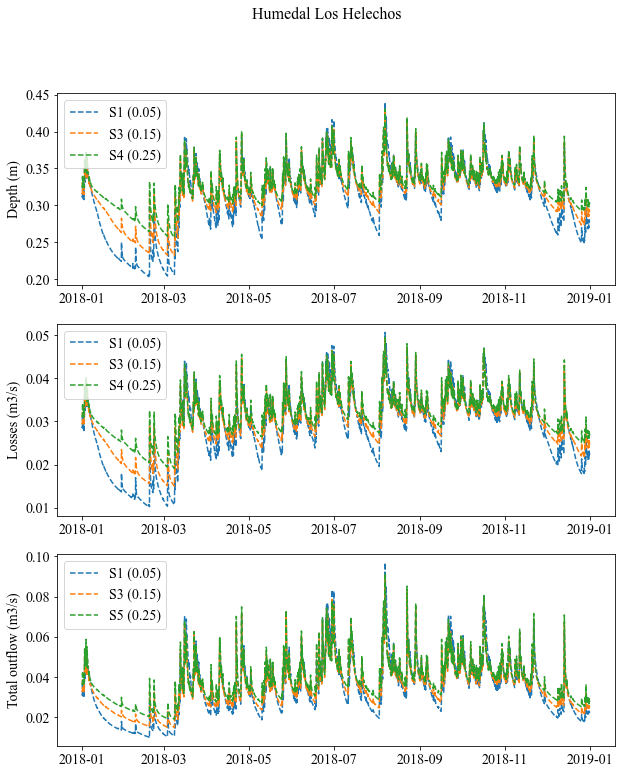

In [216]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Depth (m)"], label="S1 (0.05)",linestyle="--" )
ax1.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Depth (m)"], label="S3 (0.15)",linestyle="--" )
ax1.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Depth (m)"], label="S4 (0.25)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Losses (m3/s)"],label="S1 (0.05)",linestyle="--")
ax3.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Losses (m3/s)"],label="S3 (0.15)",linestyle="--")
ax3.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Losses (m3/s)"],label="S4 (0.25)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Total outflow (m3/s)"],label="S1 (0.05)",linestyle="--" )
ax4.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Total outflow (m3/s)"],label="S3 (0.15)",linestyle="--" )
ax4.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Total outflow (m3/s)"],label="S5 (0.25)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Los Helechos",fontsize=16)
plt.show()

In [217]:
WSU_name="W4"
i=WSU_names_list.index(WSU_name)

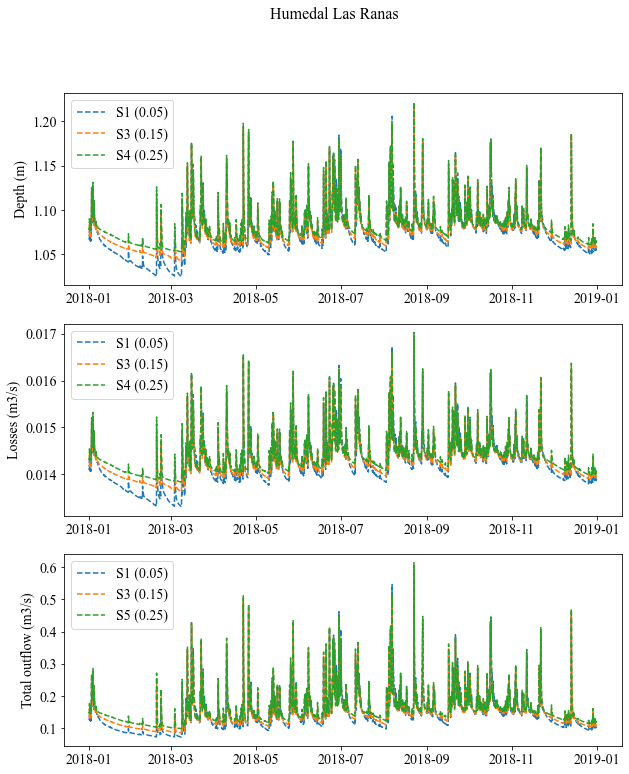

In [218]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Depth (m)"], label="S1 (0.05)",linestyle="--" )
ax1.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Depth (m)"], label="S3 (0.15)",linestyle="--" )
ax1.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Depth (m)"], label="S4 (0.25)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Losses (m3/s)"],label="S1 (0.05)",linestyle="--")
ax3.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Losses (m3/s)"],label="S3 (0.15)",linestyle="--")
ax3.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Losses (m3/s)"],label="S4 (0.25)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Total outflow (m3/s)"],label="S1 (0.05)",linestyle="--" )
ax4.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Total outflow (m3/s)"],label="S3 (0.15)",linestyle="--" )
ax4.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Total outflow (m3/s)"],label="S5 (0.25)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Las Ranas",fontsize=16)
plt.show()

In [219]:
WSU_name="W5"
i=WSU_names_list.index(WSU_name)

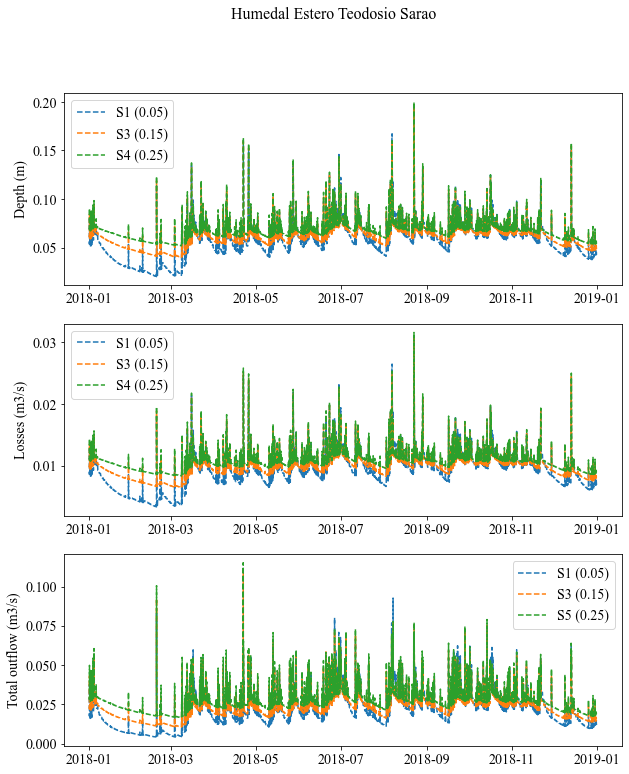

In [220]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Depth (m)"], label="S1 (0.05)",linestyle="--" )
ax1.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Depth (m)"], label="S3 (0.15)",linestyle="--" )
ax1.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Depth (m)"], label="S4 (0.25)",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Losses (m3/s)"],label="S1 (0.05)",linestyle="--")
ax3.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Losses (m3/s)"],label="S3 (0.15)",linestyle="--")
ax3.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Losses (m3/s)"],label="S4 (0.25)",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_S1[i]["2018"].index,df_WSU_S1[i]["2018"]["Total outflow (m3/s)"],label="S1 (0.05)",linestyle="--" )
ax4.plot(df_WSU_S3[i]["2018"].index,df_WSU_S3[i]["2018"]["Total outflow (m3/s)"],label="S3 (0.15)",linestyle="--" )
ax4.plot(df_WSU_S4[i]["2018"].index,df_WSU_S4[i]["2018"]["Total outflow (m3/s)"],label="S5 (0.25)",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Estero Teodosio Sarao",fontsize=16)
plt.show()

### Curvas de Duración

Baquedano

In [221]:
W1_S1_TS_df_sort=C_duracion(df_WSU_S1, "W1")
W1_S2_TS_df_sort=C_duracion(df_WSU_S2, "W1")
W1_S3_TS_df_sort=C_duracion(df_WSU_S3, "W1")
W1_S4_TS_df_sort=C_duracion(df_WSU_S4, "W1")

Text(0.5, 1.0, 'Curvas de Duración Altura Humedal Baquedano')

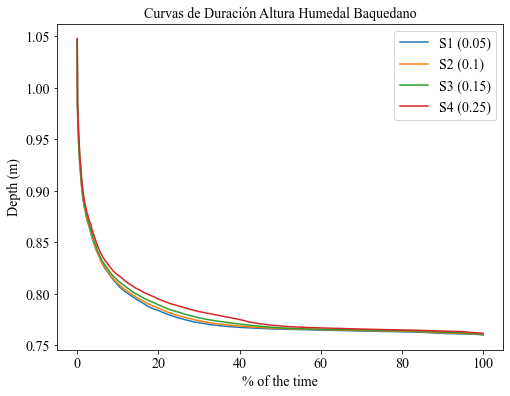

In [222]:
plt.figure(figsize=(8,6))
plt.plot(W1_S1_TS_df_sort["% Tiempo"], W1_S1_TS_df_sort["Depth (m)"], label="S1 (0.05)")
plt.plot(W1_S2_TS_df_sort["% Tiempo"], W1_S2_TS_df_sort["Depth (m)"], label="S2 (0.1)")
plt.plot(W1_S3_TS_df_sort["% Tiempo"], W1_S3_TS_df_sort["Depth (m)"], label="S3 (0.15)")
plt.plot(W1_S4_TS_df_sort["% Tiempo"], W1_S4_TS_df_sort["Depth (m)"], label="S4 (0.25)")
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Altura Humedal Baquedano")

El Loto

In [223]:
W2_S1_TS_df_sort=C_duracion(df_WSU_S1, "W2")
W2_S2_TS_df_sort=C_duracion(df_WSU_S2, "W2")
W2_S3_TS_df_sort=C_duracion(df_WSU_S3, "W2")
W2_S4_TS_df_sort=C_duracion(df_WSU_S4, "W2")

Text(0.5, 1.0, 'Curvas de Duración Altura El Loto')

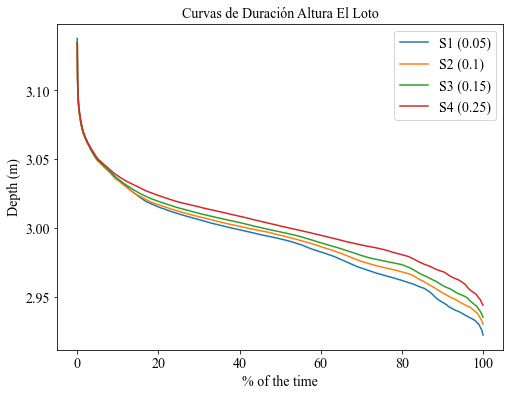

In [224]:
plt.figure(figsize=(8,6))
plt.plot(W2_S1_TS_df_sort["% Tiempo"], W2_S1_TS_df_sort["Depth (m)"], label="S1 (0.05)")
plt.plot(W2_S2_TS_df_sort["% Tiempo"], W2_S2_TS_df_sort["Depth (m)"], label="S2 (0.1)")
plt.plot(W2_S3_TS_df_sort["% Tiempo"], W2_S3_TS_df_sort["Depth (m)"], label="S3 (0.15)")
plt.plot(W2_S4_TS_df_sort["% Tiempo"], W2_S4_TS_df_sort["Depth (m)"], label="S4 (0.25)")
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Altura El Loto")

Los Helechos

In [225]:
W3_S1_TS_df_sort=C_duracion(df_WSU_S1, "W3")
W3_S2_TS_df_sort=C_duracion(df_WSU_S2, "W3")
W3_S3_TS_df_sort=C_duracion(df_WSU_S3, "W3")
W3_S4_TS_df_sort=C_duracion(df_WSU_S4, "W3")

Text(0.5, 1.0, 'Curvas de Duración Altura Los Helechos')

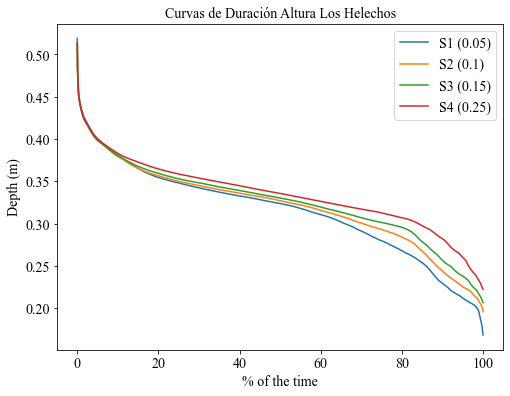

In [226]:
plt.figure(figsize=(8,6))
plt.plot(W3_S1_TS_df_sort["% Tiempo"], W3_S1_TS_df_sort["Depth (m)"], label="S1 (0.05)")
plt.plot(W3_S2_TS_df_sort["% Tiempo"], W3_S2_TS_df_sort["Depth (m)"], label="S2 (0.1)")
plt.plot(W3_S3_TS_df_sort["% Tiempo"], W3_S3_TS_df_sort["Depth (m)"], label="S3 (0.15)")
plt.plot(W3_S4_TS_df_sort["% Tiempo"], W3_S4_TS_df_sort["Depth (m)"], label="S4 (0.25)")
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Altura Los Helechos")

In [227]:
W4_S1_TS_df_sort=C_duracion(df_WSU_S1, "W4")
W4_S2_TS_df_sort=C_duracion(df_WSU_S2, "W4")
W4_S3_TS_df_sort=C_duracion(df_WSU_S3, "W4")
W4_S4_TS_df_sort=C_duracion(df_WSU_S4, "W4")

Text(0.5, 1.0, 'Curvas de Duración Altura Las Ranas')

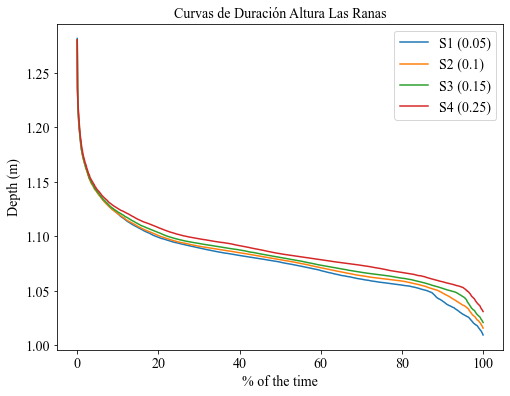

In [228]:
plt.figure(figsize=(8,6))
plt.plot(W4_S1_TS_df_sort["% Tiempo"], W4_S1_TS_df_sort["Depth (m)"], label="S1 (0.05)")
plt.plot(W4_S2_TS_df_sort["% Tiempo"], W4_S2_TS_df_sort["Depth (m)"], label="S2 (0.1)")
plt.plot(W4_S3_TS_df_sort["% Tiempo"], W4_S3_TS_df_sort["Depth (m)"], label="S3 (0.15)")
plt.plot(W4_S4_TS_df_sort["% Tiempo"], W4_S4_TS_df_sort["Depth (m)"], label="S4 (0.25)")
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Altura Las Ranas")

In [229]:
W5_S1_TS_df_sort=C_duracion(df_WSU_S1, "W5")
W5_S2_TS_df_sort=C_duracion(df_WSU_S2, "W5")
W5_S3_TS_df_sort=C_duracion(df_WSU_S3, "W5")
W5_S4_TS_df_sort=C_duracion(df_WSU_S4, "W5")

Text(0.5, 1.0, 'Curvas de Duración Humedal Estero Teodosio Sarao')

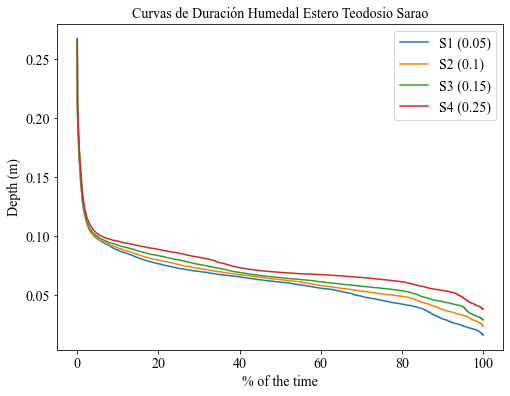

In [230]:
plt.figure(figsize=(8,6))
plt.plot(W5_S1_TS_df_sort["% Tiempo"], W5_S1_TS_df_sort["Depth (m)"], label="S1 (0.05)")
plt.plot(W5_S2_TS_df_sort["% Tiempo"], W5_S2_TS_df_sort["Depth (m)"], label="S2 (0.1)")
plt.plot(W5_S3_TS_df_sort["% Tiempo"], W5_S3_TS_df_sort["Depth (m)"], label="S3 (0.15)")
plt.plot(W5_S4_TS_df_sort["% Tiempo"], W5_S4_TS_df_sort["Depth (m)"], label="S4 (0.25)")
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Humedal Estero Teodosio Sarao")

## Flooding Storage Units

In [231]:
df_FSU_S1=import_xls('Iteracion_S_1/FSU_SWMM_TS.xls') #0.05
df_FSU_S2=import_xls('Iteracion_S_2/FSU_SWMM_TS.xls') #0.5
df_FSU_S3=import_xls('Iteracion_K_4/FSU_SWMM_TS.xls') #0.15
df_FSU_S4=import_xls('Iteracion_S_4/FSU_SWMM_TS.xls') #0.25

### Time Series

### Frecuency Analysis

SU1

In [232]:
phi=1
SU1_S1_TS_df_sort=A_frecuencia(df_FSU_S1,"SU1", phi)
SU1_S2_TS_df_sort=A_frecuencia(df_FSU_S2,"SU1", phi)
SU1_S3_TS_df_sort=A_frecuencia(df_FSU_S3,"SU1", phi)
SU1_S4_TS_df_sort=A_frecuencia(df_FSU_S4,"SU1", phi)

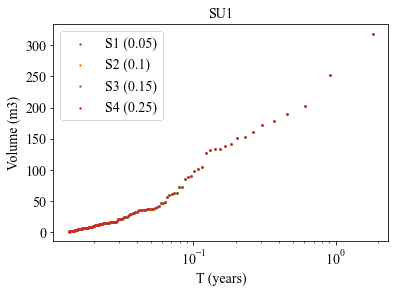

In [233]:
plt.scatter(SU1_S1_TS_df_sort[2]["T"], SU1_S1_TS_df_sort[2]["Volume (m3)"], label="S1 (0.05)", s=2)
plt.scatter(SU1_S2_TS_df_sort[2]["T"], SU1_S2_TS_df_sort[2]["Volume (m3)"], label="S2 (0.1)", s=2)
plt.scatter(SU1_S3_TS_df_sort[2]["T"], SU1_S3_TS_df_sort[2]["Volume (m3)"], label="S3 (0.15)", s=2)
plt.scatter(SU1_S4_TS_df_sort[2]["T"], SU1_S4_TS_df_sort[2]["Volume (m3)"], label="S4 (0.25)", s=2)
plt.ylabel("Volume (m3)")
plt.xlabel("T (years)")
plt.xscale("log")
plt.title("SU1")
plt.legend()

SU2

In [234]:
phi=1
SU2_S1_TS_df_sort=A_frecuencia(df_FSU_S1,"SU2", phi)
SU2_S2_TS_df_sort=A_frecuencia(df_FSU_S2,"SU2", phi)
SU2_S3_TS_df_sort=A_frecuencia(df_FSU_S3,"SU2", phi)
SU2_S4_TS_df_sort=A_frecuencia(df_FSU_S4,"SU2", phi)

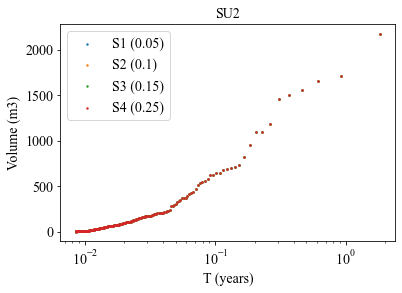

In [235]:
plt.scatter(SU2_S1_TS_df_sort[2]["T"], SU2_S1_TS_df_sort[2]["Volume (m3)"], label="S1 (0.05)", s=2)
plt.scatter(SU2_S2_TS_df_sort[2]["T"], SU2_S2_TS_df_sort[2]["Volume (m3)"], label="S2 (0.1)", s=2)
plt.scatter(SU2_S3_TS_df_sort[2]["T"], SU2_S3_TS_df_sort[2]["Volume (m3)"], label="S3 (0.15)", s=2)
plt.scatter(SU2_S4_TS_df_sort[2]["T"], SU2_S4_TS_df_sort[2]["Volume (m3)"], label="S4 (0.25)", s=2)
plt.ylabel("Volume (m3)")
plt.xlabel("T (years)")
plt.xscale("log")
plt.title("SU2")
plt.legend()

SU3

In [236]:
phi=1
SU3_S1_TS_df_sort=A_frecuencia(df_FSU_S1,"SU3", phi)
SU3_S2_TS_df_sort=A_frecuencia(df_FSU_S2,"SU3", phi)
SU3_S3_TS_df_sort=A_frecuencia(df_FSU_S3,"SU3", phi)
SU3_S4_TS_df_sort=A_frecuencia(df_FSU_S4,"SU3", phi)

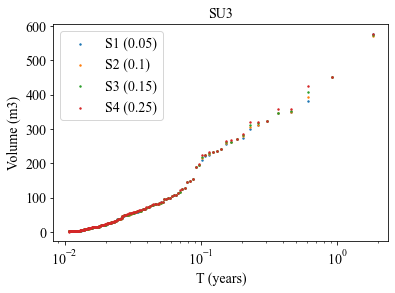

In [237]:
plt.scatter(SU3_S1_TS_df_sort[2]["T"], SU3_S1_TS_df_sort[2]["Volume (m3)"], label="S1 (0.05)", s=2)
plt.scatter(SU3_S2_TS_df_sort[2]["T"], SU3_S2_TS_df_sort[2]["Volume (m3)"], label="S2 (0.1)", s=2)
plt.scatter(SU3_S3_TS_df_sort[2]["T"], SU3_S3_TS_df_sort[2]["Volume (m3)"], label="S3 (0.15)", s=2)
plt.scatter(SU3_S4_TS_df_sort[2]["T"], SU3_S4_TS_df_sort[2]["Volume (m3)"], label="S4 (0.25)", s=2)
plt.ylabel("Volume (m3)")
plt.xlabel("T (years)")
plt.xscale("log")
plt.title("SU3")
plt.legend()

In [238]:
phi=1
SU4_S1_TS_df_sort=A_frecuencia(df_FSU_S1,"SU4", phi)
SU4_S2_TS_df_sort=A_frecuencia(df_FSU_S2,"SU4", phi)
SU4_S3_TS_df_sort=A_frecuencia(df_FSU_S3,"SU4", phi)
SU4_S4_TS_df_sort=A_frecuencia(df_FSU_S4,"SU4", phi)

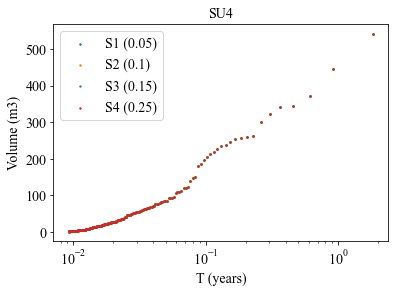

In [239]:
plt.scatter(SU4_S1_TS_df_sort[2]["T"], SU4_S1_TS_df_sort[2]["Volume (m3)"], label="S1 (0.05)", s=2)
plt.scatter(SU4_S2_TS_df_sort[2]["T"], SU4_S2_TS_df_sort[2]["Volume (m3)"], label="S2 (0.1)", s=2)
plt.scatter(SU4_S3_TS_df_sort[2]["T"], SU4_S3_TS_df_sort[2]["Volume (m3)"], label="S3 (0.15)", s=2)
plt.scatter(SU4_S4_TS_df_sort[2]["T"], SU4_S4_TS_df_sort[2]["Volume (m3)"], label="S4 (0.25)", s=2)
plt.ylabel("Volume (m3)")
plt.xlabel("T (years)")
plt.xscale("log")
plt.title("SU4")
plt.legend()

In [240]:
phi=1
SU5_S1_TS_df_sort=A_frecuencia(df_FSU_S1,"SU5", phi)
SU5_S2_TS_df_sort=A_frecuencia(df_FSU_S2,"SU5", phi)
SU5_S3_TS_df_sort=A_frecuencia(df_FSU_S3,"SU5", phi)
SU5_S4_TS_df_sort=A_frecuencia(df_FSU_S4,"SU5", phi)

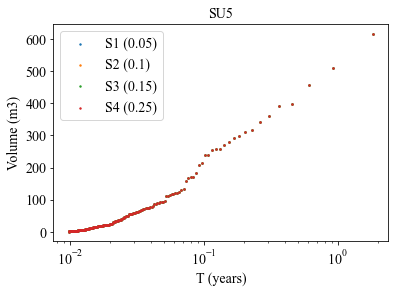

In [241]:
plt.scatter(SU5_S1_TS_df_sort[2]["T"], SU5_S1_TS_df_sort[2]["Volume (m3)"], label="S1 (0.05)", s=2)
plt.scatter(SU5_S2_TS_df_sort[2]["T"], SU5_S2_TS_df_sort[2]["Volume (m3)"], label="S2 (0.1)", s=2)
plt.scatter(SU5_S3_TS_df_sort[2]["T"], SU5_S3_TS_df_sort[2]["Volume (m3)"], label="S3 (0.15)", s=2)
plt.scatter(SU5_S4_TS_df_sort[2]["T"], SU5_S4_TS_df_sort[2]["Volume (m3)"], label="S4 (0.25)", s=2)
plt.ylabel("Volume (m3)")
plt.xlabel("T (years)")
plt.xscale("log")
plt.title("SU5")
plt.legend()

In [242]:
phi=5
SU6_S1_TS_df_sort=A_frecuencia(df_FSU_S1,"SU6", phi)
SU6_S2_TS_df_sort=A_frecuencia(df_FSU_S2,"SU6", phi)
SU6_S3_TS_df_sort=A_frecuencia(df_FSU_S3,"SU6", phi)
SU6_S4_TS_df_sort=A_frecuencia(df_FSU_S4,"SU6", phi)

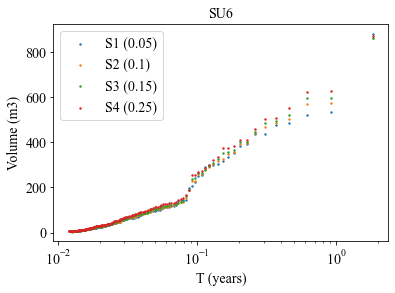

In [243]:
plt.scatter(SU6_S1_TS_df_sort[2]["T"], SU6_S1_TS_df_sort[2]["Volume (m3)"], label="S1 (0.05)", s=2)
plt.scatter(SU6_S2_TS_df_sort[2]["T"], SU6_S2_TS_df_sort[2]["Volume (m3)"], label="S2 (0.1)", s=2)
plt.scatter(SU6_S3_TS_df_sort[2]["T"], SU6_S3_TS_df_sort[2]["Volume (m3)"], label="S3 (0.15)", s=2)
plt.scatter(SU6_S4_TS_df_sort[2]["T"], SU6_S4_TS_df_sort[2]["Volume (m3)"], label="S4 (0.25)", s=2)
plt.ylabel("Volume (m3)")
plt.xlabel("T (years)")
plt.xscale("log")
plt.title("SU6")
plt.legend()

## Zone Budget: RCH - DRN

In [244]:
ZB_by_zone_S1=import_xls_2('Iteracion_S_1/ZB_by_zone.xls') 
ZB_by_zone_S2=import_xls_2('Iteracion_S_2/ZB_by_zone.xls') 
ZB_by_zone_S3=import_xls_2('Iteracion_K_4/ZB_by_zone.xls') 
ZB_by_zone_S4=import_xls_2('Iteracion_S_4/ZB_by_zone.xls') 

In [245]:
rch_drn_S1=import_xls_2('Iteracion_S_1/rch_drn.xls')
rch_drn_S2=import_xls_2('Iteracion_S_2/rch_drn.xls') 
rch_drn_S3=import_xls_2('Iteracion_K_4/rch_drn.xls') 
rch_drn_S4=import_xls_2('Iteracion_S_4/rch_drn.xls') 

In [246]:
rch_drn_S1_S_WSU=rch_drn_S_WSU(rch_drn_S1)
rch_drn_S2_S_WSU=rch_drn_S_WSU(rch_drn_S2)
rch_drn_S3_S_WSU=rch_drn_S_WSU(rch_drn_S3)
rch_drn_S4_S_WSU=rch_drn_S_WSU(rch_drn_S4)

### Baquedano

Text(0.5, 1.0, 'RCH rate Baquedano')

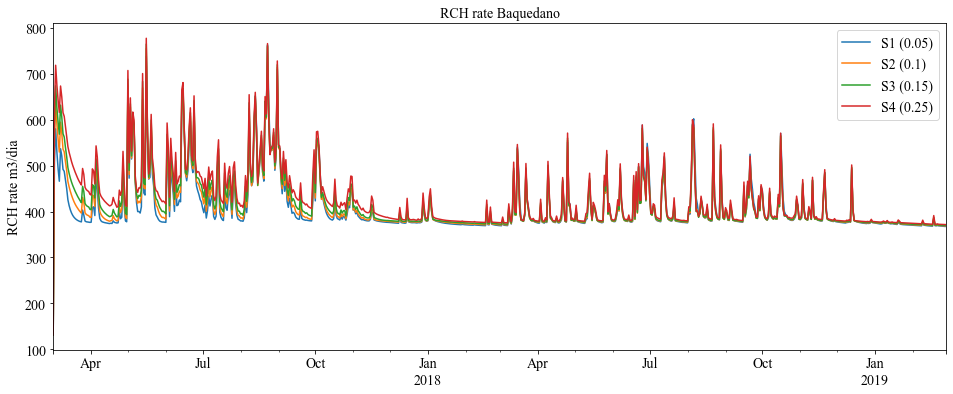

In [247]:
rch_drn_S1_S_WSU[1].W1.plot(label="S1 (0.05)", figsize=(16,6))
rch_drn_S2_S_WSU[1].W1.plot(label="S2 (0.1)")
rch_drn_S3_S_WSU[1].W1.plot(label="S3 (0.15)")
rch_drn_S4_S_WSU[1].W1.plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.title("RCH rate Baquedano")

Text(0.5, 1.0, 'DRN rate Baquedano + S10')

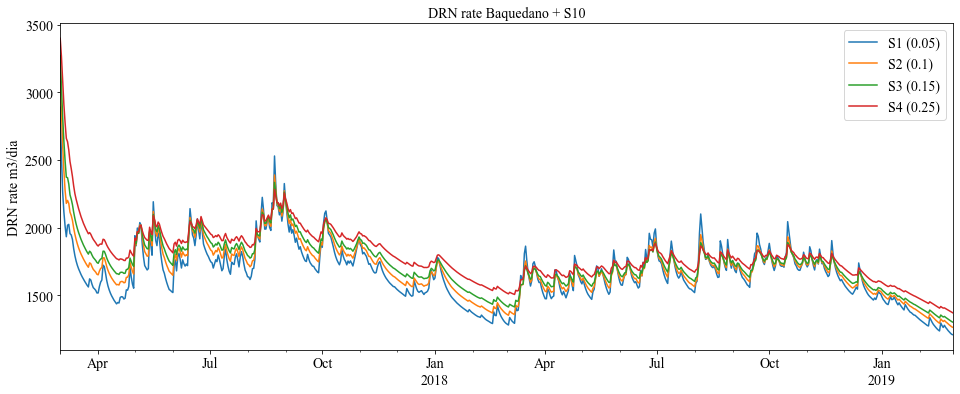

In [248]:
(rch_drn_S1_S_WSU[0].W1+rch_drn_S1_S_WSU[2].S10).plot(label="S1 (0.05)", figsize=(16,6))
(rch_drn_S2_S_WSU[0].W1+rch_drn_S2_S_WSU[2].S10).plot(label="S2 (0.1)")
(rch_drn_S3_S_WSU[0].W1+rch_drn_S3_S_WSU[2].S10).plot(label="S3 (0.15)")
(rch_drn_S4_S_WSU[0].W1+rch_drn_S4_S_WSU[2].S10).plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("DRN rate m3/dia")
#plt.ylim([0,2500])
plt.title("DRN rate Baquedano + S10")

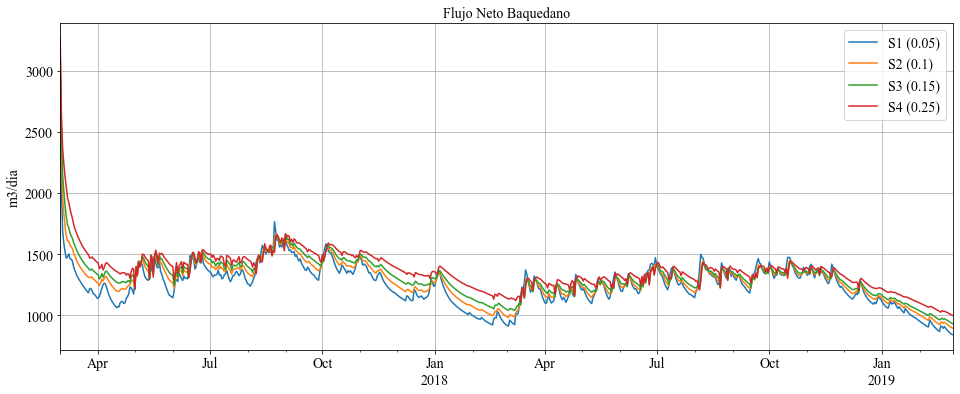

In [249]:
(rch_drn_S1_S_WSU[0].W1+rch_drn_S1_S_WSU[2].S10-rch_drn_S1_S_WSU[1].W1).plot(label="S1 (0.05)", figsize=(16,6))
(rch_drn_S2_S_WSU[0].W1+rch_drn_S2_S_WSU[2].S10-rch_drn_S2_S_WSU[1].W1).plot(label="S2 (0.1)")
(rch_drn_S3_S_WSU[0].W1+rch_drn_S3_S_WSU[2].S10-rch_drn_S3_S_WSU[1].W1).plot(label="S3 (0.15)")
(rch_drn_S4_S_WSU[0].W1+rch_drn_S4_S_WSU[2].S10-rch_drn_S4_S_WSU[1].W1).plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("m3/dia")
#plt.ylim([500,2000])
plt.title("Flujo Neto Baquedano")
plt.grid()

### El Loto

Text(0.5, 1.0, 'RCH rate El Loto')

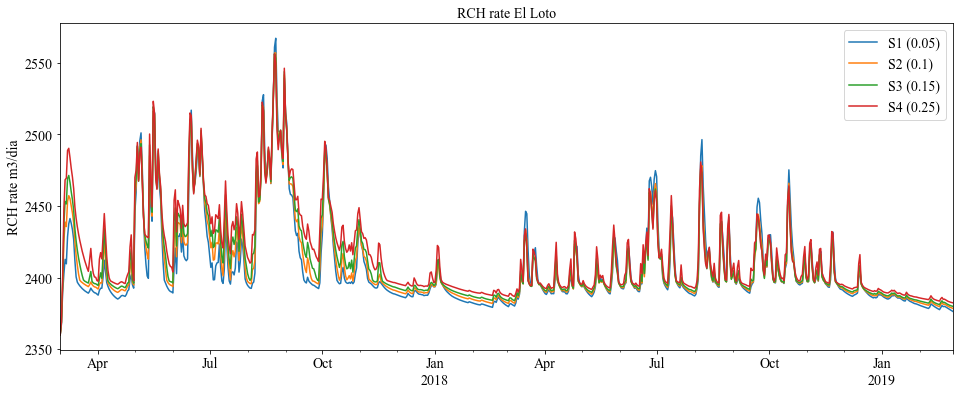

In [250]:
rch_drn_S1_S_WSU[1].W2.plot(label="S1 (0.05)", figsize=(16,6))
rch_drn_S2_S_WSU[1].W2.plot(label="S2 (0.1)")
rch_drn_S3_S_WSU[1].W2.plot(label="S3 (0.15)")
rch_drn_S4_S_WSU[1].W2.plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("RCH rate m3/dia")
#plt.ylim([100,1000])
plt.title("RCH rate El Loto")

Text(0.5, 1.0, 'DRN  El Loto + S16 + S17 + S23')

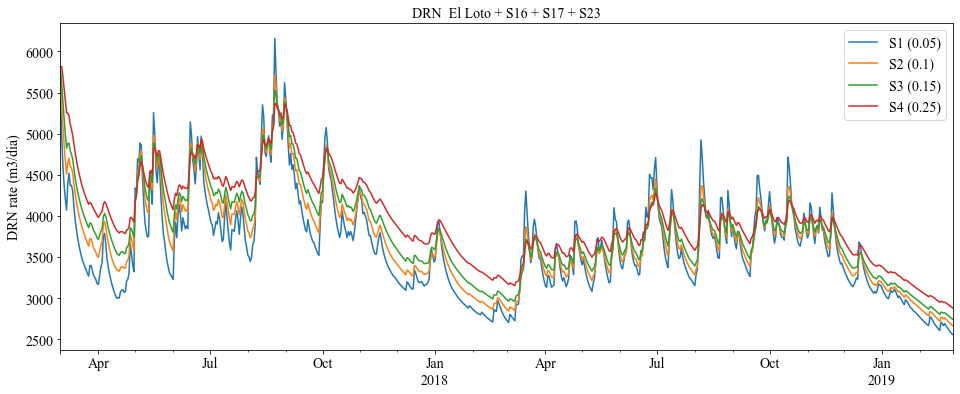

In [251]:
(rch_drn_S1_S_WSU[0].W2+rch_drn_S1_S_WSU[2].S16+rch_drn_S1_S_WSU[2].S17+rch_drn_S1_S_WSU[2].S23).plot(label="S1 (0.05)", figsize=(16,6))
(rch_drn_S2_S_WSU[0].W2+rch_drn_S2_S_WSU[2].S16+rch_drn_S2_S_WSU[2].S17+rch_drn_S2_S_WSU[2].S23).plot(label="S2 (0.1)")
(rch_drn_S3_S_WSU[0].W2+rch_drn_S3_S_WSU[2].S16+rch_drn_S3_S_WSU[2].S17+rch_drn_S3_S_WSU[2].S23).plot(label="S3 (0.15)")
(rch_drn_S4_S_WSU[0].W2+rch_drn_S4_S_WSU[2].S16+rch_drn_S4_S_WSU[2].S17+rch_drn_S4_S_WSU[2].S23).plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
#plt.ylim([2000,6000])
plt.title("DRN  El Loto + S16 + S17 + S23")

Text(0.5, 1.0, 'Flujo Neto El Loto')

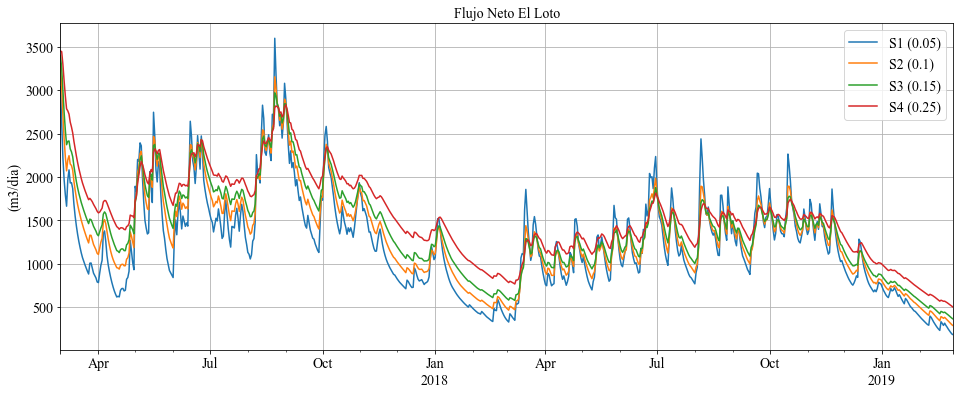

In [252]:
(rch_drn_S1_S_WSU[0].W2+rch_drn_S1_S_WSU[2].S16+rch_drn_S1_S_WSU[2].S17+rch_drn_S1_S_WSU[2].S23-rch_drn_S1_S_WSU[1].W2).plot(label="S1 (0.05)", figsize=(16,6))
(rch_drn_S2_S_WSU[0].W2+rch_drn_S2_S_WSU[2].S16+rch_drn_S2_S_WSU[2].S17+rch_drn_S2_S_WSU[2].S23-rch_drn_S2_S_WSU[1].W2).plot(label="S2 (0.1)")
(rch_drn_S3_S_WSU[0].W2+rch_drn_S3_S_WSU[2].S16+rch_drn_S3_S_WSU[2].S17+rch_drn_S3_S_WSU[2].S23-rch_drn_S3_S_WSU[1].W2).plot(label="S3 (0.15)")
(rch_drn_S4_S_WSU[0].W2+rch_drn_S4_S_WSU[2].S16+rch_drn_S4_S_WSU[2].S17+rch_drn_S4_S_WSU[2].S23-rch_drn_S4_S_WSU[1].W2).plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("(m3/dia)")
plt.grid()
#plt.ylim([0,3000])
plt.title("Flujo Neto El Loto")

### Los Helechos

Text(0.5, 1.0, 'RCH rate Los Helechos')

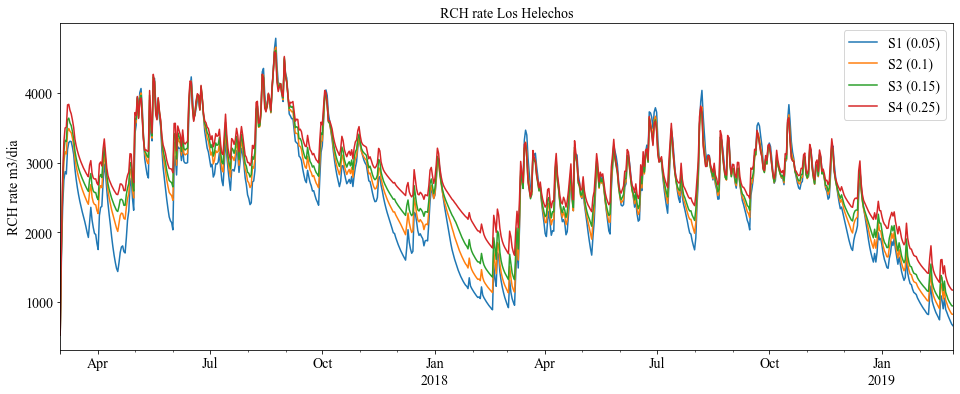

In [253]:
rch_drn_S1_S_WSU[1].W3.plot(label="S1 (0.05)", figsize=(16,6))
rch_drn_S2_S_WSU[1].W3.plot(label="S2 (0.1)")
rch_drn_S3_S_WSU[1].W3.plot(label="S3 (0.15)")
rch_drn_S4_S_WSU[1].W3.plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.title("RCH rate Los Helechos")

Text(0.5, 1.0, 'DRN Los Helechos + S29')

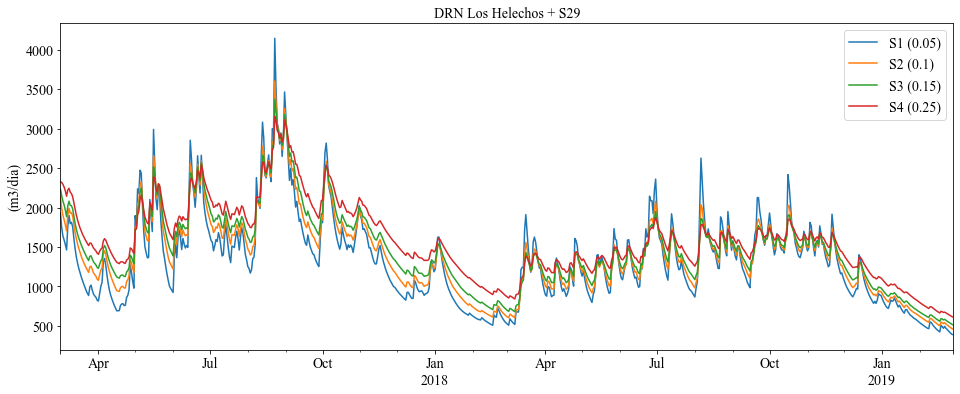

In [254]:
(rch_drn_S1_S_WSU[0].W3+rch_drn_S1_S_WSU[2].S29).plot(label="S1 (0.05)", figsize=(16,6))
(rch_drn_S2_S_WSU[0].W3+rch_drn_S2_S_WSU[2].S29).plot(label="S2 (0.1)")
(rch_drn_S3_S_WSU[0].W3+rch_drn_S3_S_WSU[2].S29).plot(label="S3 (0.15)")
(rch_drn_S4_S_WSU[0].W3+rch_drn_S4_S_WSU[2].S29).plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("(m3/dia)")
plt.title("DRN Los Helechos + S29")

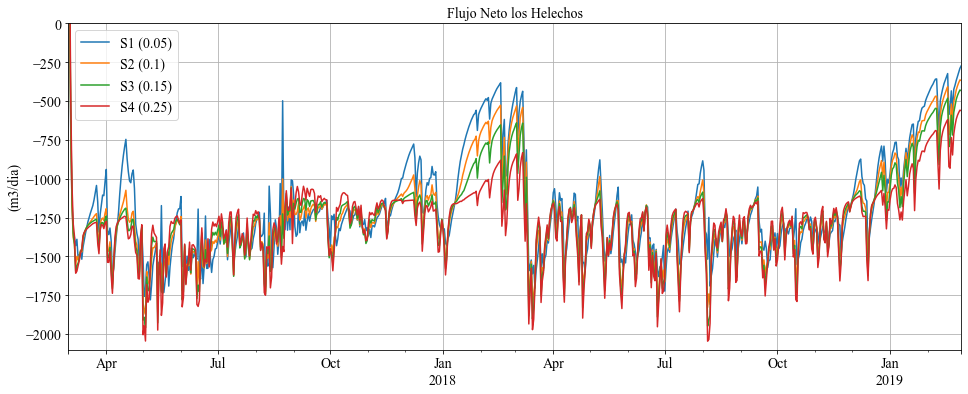

In [255]:
(rch_drn_S1_S_WSU[0].W3+rch_drn_S1_S_WSU[2].S29-rch_drn_S1_S_WSU[1].W3).plot(label="S1 (0.05)", figsize=(16,6))
(rch_drn_S2_S_WSU[0].W3+rch_drn_S2_S_WSU[2].S29-rch_drn_S2_S_WSU[1].W3).plot(label="S2 (0.1)")
(rch_drn_S3_S_WSU[0].W3+rch_drn_S3_S_WSU[2].S29-rch_drn_S3_S_WSU[1].W3).plot(label="S3 (0.15)")
(rch_drn_S4_S_WSU[0].W3+rch_drn_S4_S_WSU[2].S29-rch_drn_S4_S_WSU[1].W3).plot(label="S4 (0.25)")
plt.ylim(-2100,0)
plt.legend()
plt.ylabel("(m3/dia)")
plt.title("Flujo Neto los Helechos")
plt.grid()

### Las Ranas

Text(0.5, 1.0, 'RCH rate Las Ranas')

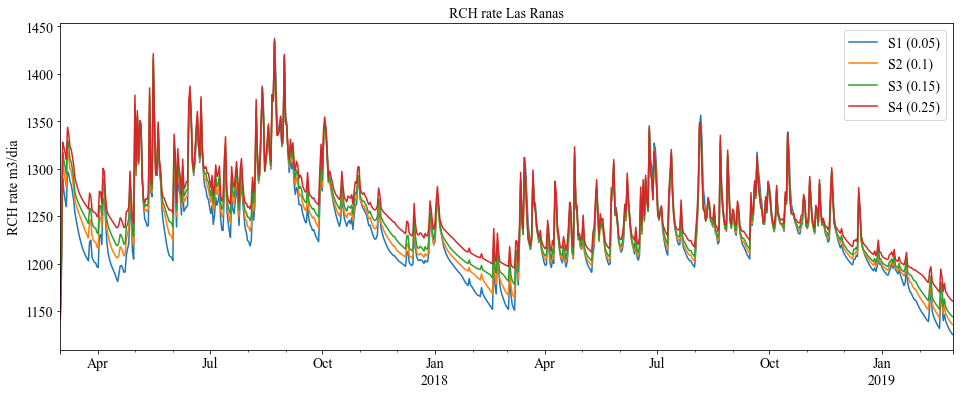

In [256]:
rch_drn_S1_S_WSU[1].W4.plot(label="S1 (0.05)", figsize=(16,6))
rch_drn_S2_S_WSU[1].W4.plot(label="S2 (0.1)")
rch_drn_S3_S_WSU[1].W4.plot(label="S3 (0.15)")
rch_drn_S4_S_WSU[1].W4.plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.title("RCH rate Las Ranas")

Text(0.5, 1.0, 'DRN La Ranas + S31 + S33 + S34')

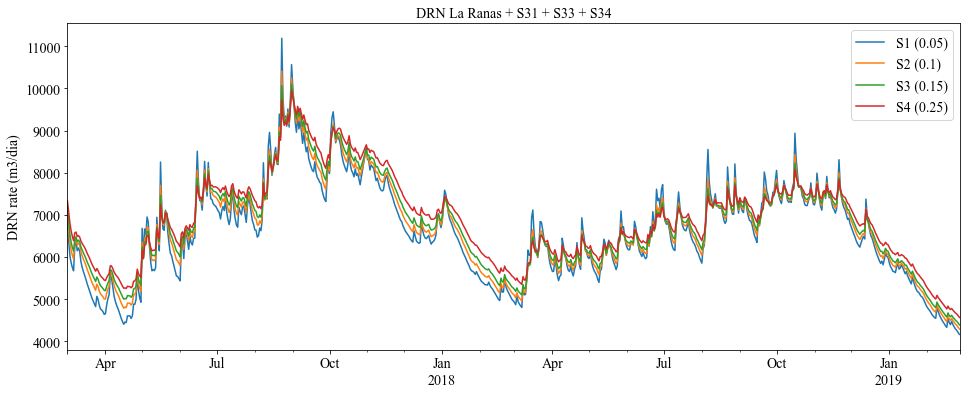

In [257]:
(rch_drn_S1_S_WSU[0].W4+rch_drn_S1_S_WSU[2].S31+rch_drn_S1_S_WSU[2].S33+rch_drn_S1_S_WSU[2].S34).plot(label="S1 (0.05)", figsize=(16,6))
(rch_drn_S2_S_WSU[0].W4+rch_drn_S2_S_WSU[2].S31+rch_drn_S2_S_WSU[2].S33+rch_drn_S2_S_WSU[2].S34).plot(label="S2 (0.1)")
(rch_drn_S3_S_WSU[0].W4+rch_drn_S3_S_WSU[2].S31+rch_drn_S3_S_WSU[2].S33+rch_drn_S3_S_WSU[2].S34).plot(label="S3 (0.15)")
(rch_drn_S4_S_WSU[0].W4+rch_drn_S4_S_WSU[2].S31+rch_drn_S4_S_WSU[2].S33+rch_drn_S4_S_WSU[2].S34).plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
plt.title("DRN La Ranas + S31 + S33 + S34")

Text(0.5, 1.0, 'Flujo Neto Las Ranas')

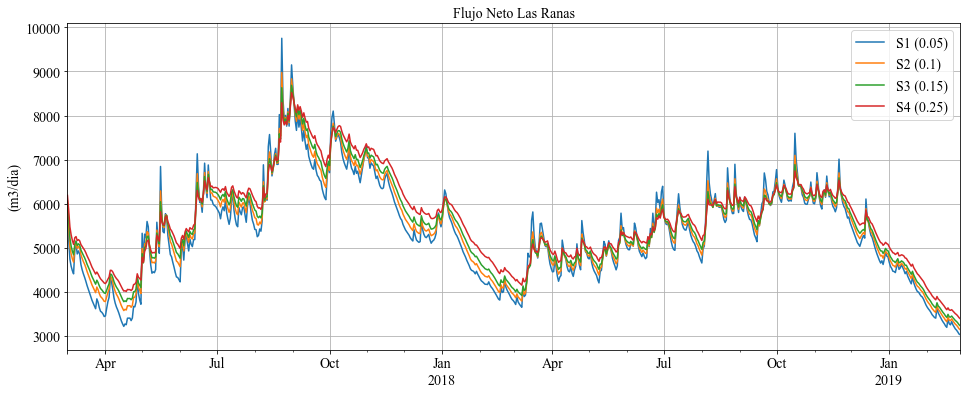

In [258]:
(rch_drn_S1_S_WSU[0].W4+rch_drn_S1_S_WSU[2].S31+rch_drn_S1_S_WSU[2].S33+rch_drn_S1_S_WSU[2].S34-rch_drn_S1_S_WSU[1].W4).plot(label="S1 (0.05)", figsize=(16,6))
(rch_drn_S2_S_WSU[0].W4+rch_drn_S2_S_WSU[2].S31+rch_drn_S2_S_WSU[2].S33+rch_drn_S2_S_WSU[2].S34-rch_drn_S2_S_WSU[1].W4).plot(label="S2 (0.1)")
(rch_drn_S3_S_WSU[0].W4+rch_drn_S3_S_WSU[2].S31+rch_drn_S3_S_WSU[2].S33+rch_drn_S3_S_WSU[2].S34-rch_drn_S3_S_WSU[1].W4).plot(label="S3 (0.15)")
(rch_drn_S4_S_WSU[0].W4+rch_drn_S4_S_WSU[2].S31+rch_drn_S4_S_WSU[2].S33+rch_drn_S4_S_WSU[2].S34-rch_drn_S4_S_WSU[1].W4).plot(label="S4 (0.25)")
plt.legend()
plt.grid()
plt.ylabel("(m3/dia)")
plt.title("Flujo Neto Las Ranas")

### Humedal Estero Teodosio Sarao

Text(0.5, 1.0, 'RCH rate Humedal Estero Teodosio Sarao')

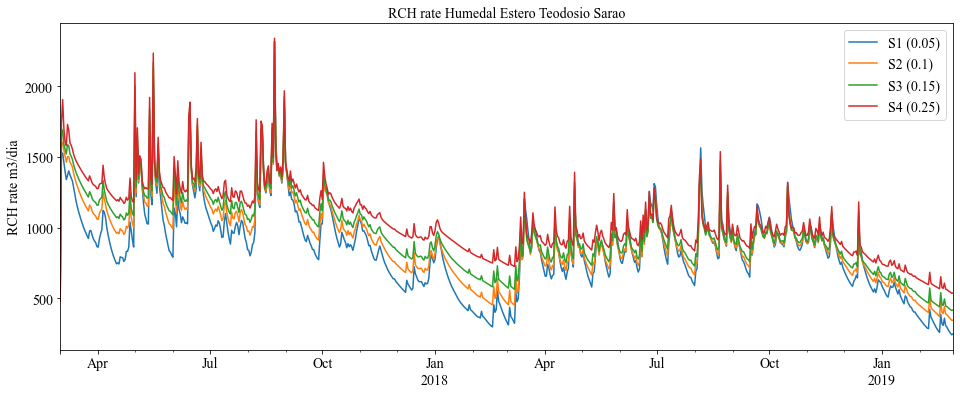

In [259]:
rch_drn_S1_S_WSU[1].W5.plot(label="S1 (0.05)", figsize=(16,6))
rch_drn_S2_S_WSU[1].W5.plot(label="S2 (0.1)")
rch_drn_S3_S_WSU[1].W5.plot(label="S3 (0.15)")
rch_drn_S4_S_WSU[1].W5.plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.title("RCH rate Humedal Estero Teodosio Sarao")

Text(0.5, 1.0, 'DRN Humedal Estero Teodosio Sarao')

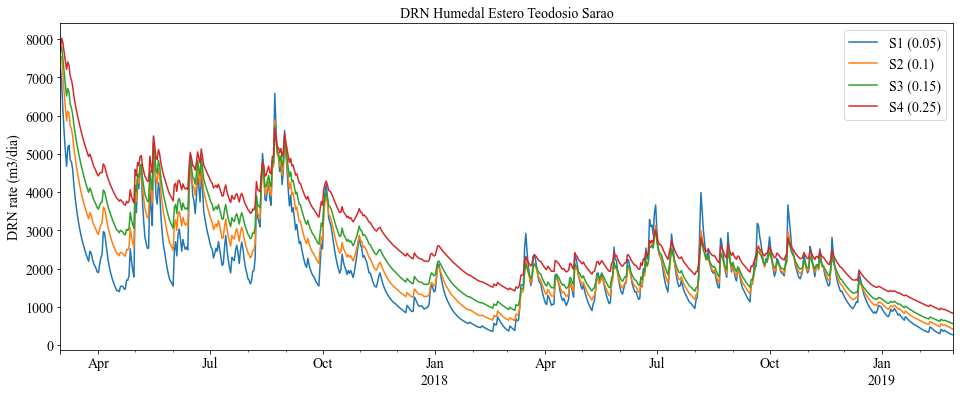

In [260]:
(rch_drn_S1_S_WSU[0].W5).plot(label="S1 (0.05)", figsize=(16,6))
(rch_drn_S2_S_WSU[0].W5).plot(label="S2 (0.1)")
(rch_drn_S3_S_WSU[0].W5).plot(label="S3 (0.15)")
(rch_drn_S4_S_WSU[0].W5).plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
plt.title("DRN Humedal Estero Teodosio Sarao")

Text(0.5, 1.0, 'Flujo Neto Humedal Estero Teodosio Sarao')

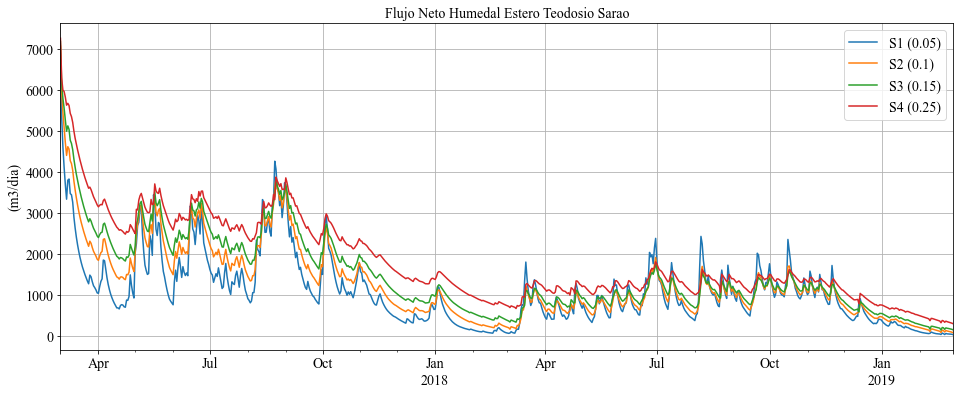

In [261]:
(rch_drn_S1_S_WSU[0].W5-rch_drn_S1_S_WSU[1].W5).plot(label="S1 (0.05)", figsize=(16,6))
(rch_drn_S2_S_WSU[0].W5-rch_drn_S2_S_WSU[1].W5).plot(label="S2 (0.1)")
(rch_drn_S3_S_WSU[0].W5-rch_drn_S3_S_WSU[1].W5).plot(label="S3 (0.15)")
(rch_drn_S4_S_WSU[0].W5-rch_drn_S4_S_WSU[1].W5).plot(label="S4 (0.25)")
plt.legend()
plt.ylabel("(m3/dia)")
plt.grid()
plt.title("Flujo Neto Humedal Estero Teodosio Sarao")

## Sensitive Analisis Resume

In [262]:
df_sensitive_analisis_W_h_S=pd.DataFrame(index=["S", "W1", "W2", "W3", "W4", "W5"])

In [263]:
df_sensitive_analisis_W_h_S["S1"]=""
df_sensitive_analisis_W_h_S["S2"]=""
df_sensitive_analisis_W_h_S["S3"]=""
df_sensitive_analisis_W_h_S["S4"]=""

In [264]:
df_sensitive_analisis_W_h_S["S1"]["S"]=0.05
df_sensitive_analisis_W_h_S["S2"]["S"]=0.1
df_sensitive_analisis_W_h_S["S3"]["S"]=0.15
df_sensitive_analisis_W_h_S["S4"]["S"]=0.25

In [265]:
j="W1"
df_sensitive_analisis_W_h_S["S1"][j]= W1_S1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S2"][j]= W1_S2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S3"][j]= W1_S3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S4"][j]= W1_S4_TS_df_sort["Depth (m)"].mean()

In [266]:
j="W2"
df_sensitive_analisis_W_h_S["S1"][j]= W2_S1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S2"][j]= W2_S2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S3"][j]= W2_S3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S4"][j]= W2_S4_TS_df_sort["Depth (m)"].mean()

In [267]:
j="W3"
df_sensitive_analisis_W_h_S["S1"][j]= W3_S1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S2"][j]= W3_S2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S3"][j]= W3_S3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S4"][j]= W3_S4_TS_df_sort["Depth (m)"].mean()

In [268]:
j="W4"
df_sensitive_analisis_W_h_S["S1"][j]= W4_S1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S2"][j]= W4_S2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S3"][j]= W4_S3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S4"][j]= W4_S4_TS_df_sort["Depth (m)"].mean()

In [269]:
j="W5"
df_sensitive_analisis_W_h_S["S1"][j]= W5_S1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S2"][j]= W5_S2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S3"][j]= W5_S3_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_W_h_S["S4"][j]= W5_S4_TS_df_sort["Depth (m)"].mean()

In [270]:
df_sensitive_analisis_W_h_S

,S1,S2,S3,S4
S,0.05,0.1,0.15,0.25
W1,0.777558,0.778594,0.780085,0.783046
W2,2.99112,2.99439,2.99748,3.00296
W3,0.314633,0.320621,0.325817,0.334532
W4,1.07877,1.08151,1.08426,1.0891
W5,0.0609447,0.0646206,0.0680864,0.074047


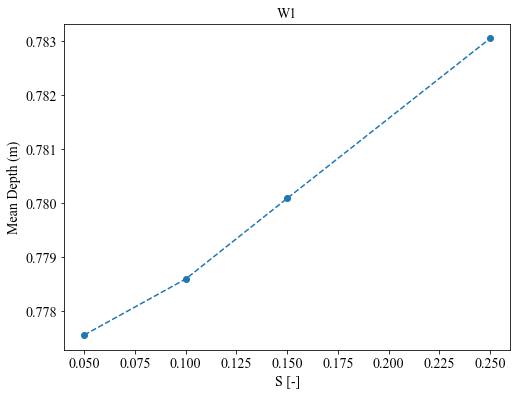

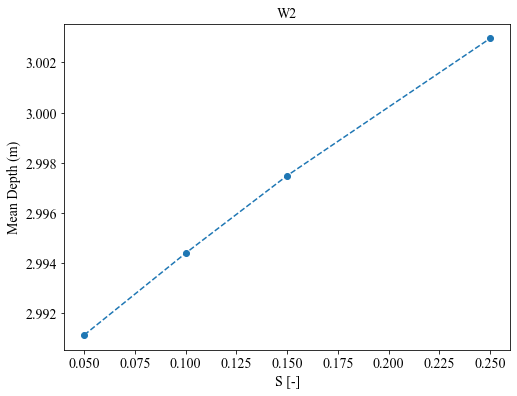

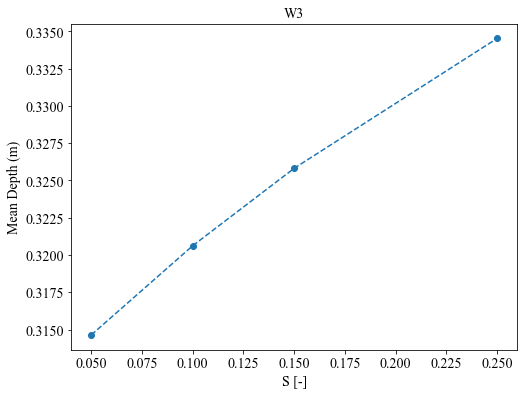

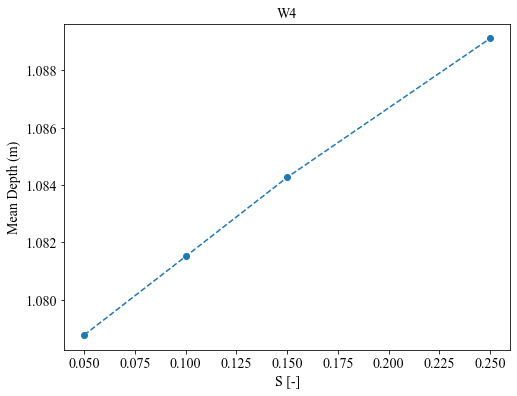

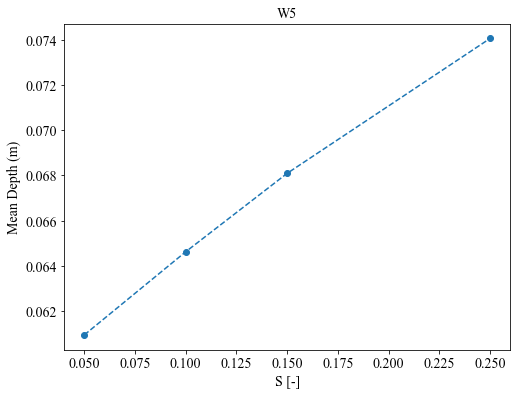

In [271]:
for i in df_sensitive_analisis_W_h_S.index[1:]:
    plt.figure(figsize=(8,6))
    plt.title(i)
    plt.ylabel("Mean Depth (m)")
    plt.xlabel("S [-]")
    plt.plot(df_sensitive_analisis_W_h_S.loc["S"],df_sensitive_analisis_W_h_S.loc[i], '--o')
    #plt.xscale("log")

# Infiltration Parameters

## Wetland Storage Units Parameters

### Curvas de Duración

In [272]:
df_WSU_infW_1=import_xls('Iteracion_C_2/WSU_SWMM_TS.xls') 
df_WSU_infW_2=import_xls('Iteracion_inf_2/WSU_SWMM_TS.xls') 
df_WSU_infW_3=import_xls('Iteracion_inf_3/WSU_SWMM_TS.xls') 

Baquedano

In [273]:
W1_infW_1_TS_df_sort=C_duracion(df_WSU_infW_1, "W1")
W1_infW_2_TS_df_sort=C_duracion(df_WSU_infW_2, "W1")
W1_infW_3_TS_df_sort=C_duracion(df_WSU_infW_3, "W1")

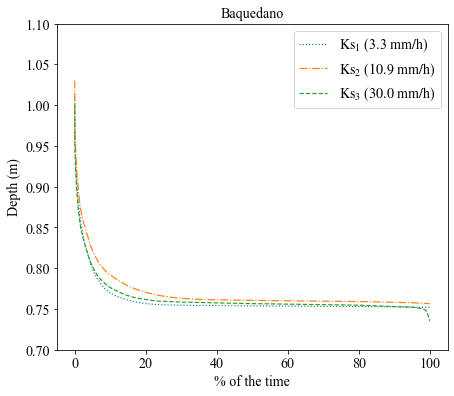

In [274]:
plt.figure(figsize=(7,6))
plt.plot(W1_infW_3_TS_df_sort["% Tiempo"], W1_infW_3_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_1}$ (3.3 $\mathrm{mm/h}$)",linestyle= ':',  linewidth=1.2)
plt.plot(W1_infW_1_TS_df_sort["% Tiempo"], W1_infW_1_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_2}$ ($10.9$ $\mathrm{mm/h}$)",linestyle= '-.',  linewidth=1.2)
plt.plot(W1_infW_2_TS_df_sort["% Tiempo"], W1_infW_2_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_3}$ ($30.0$ $\mathrm{mm/h}$)",linestyle= '--',  linewidth=1.2)
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.ylim(0.7,1.1)
plt.legend()
plt.title("Baquedano")
plt.savefig("Figures/Anexos/DC_W1_INF.svg")

El Loto

In [275]:
W2_infW_1_TS_df_sort=C_duracion(df_WSU_infW_1, "W2")
W2_infW_2_TS_df_sort=C_duracion(df_WSU_infW_2, "W2")
W2_infW_3_TS_df_sort=C_duracion(df_WSU_infW_3, "W2")

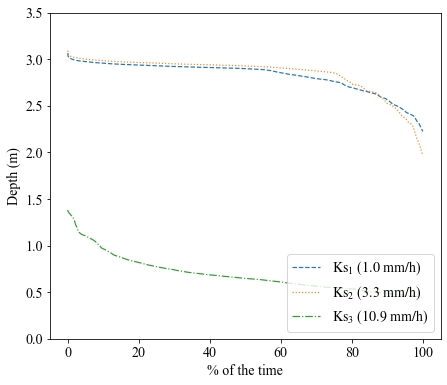

In [276]:
plt.figure(figsize=(7,6))
plt.plot(W2_infW_3_TS_df_sort["% Tiempo"], W2_infW_3_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_1}$ ($1.0$ $\mathrm{mm/h}$)",linestyle= '--',  linewidth=1.2)
plt.plot(W2_infW_1_TS_df_sort["% Tiempo"], W2_infW_1_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_2}$ (3.3 $\mathrm{mm/h}$)",linestyle= ':',  linewidth=1.2)
plt.plot(W2_infW_2_TS_df_sort["% Tiempo"], W2_infW_2_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_3}$ ($10.9$ $\mathrm{mm/h}$)",linestyle= '-.',  linewidth=1.2)

plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.ylim(0,3.5)
plt.legend(loc=4)
plt.savefig("Figures/Fig7c.svg")
#plt.title("Curvas de Duración Altura El Loto")

Los Helechos

In [277]:
W3_infW_1_TS_df_sort=C_duracion(df_WSU_infW_1, "W3")
W3_infW_2_TS_df_sort=C_duracion(df_WSU_infW_2, "W3")
W3_infW_3_TS_df_sort=C_duracion(df_WSU_infW_3, "W3")

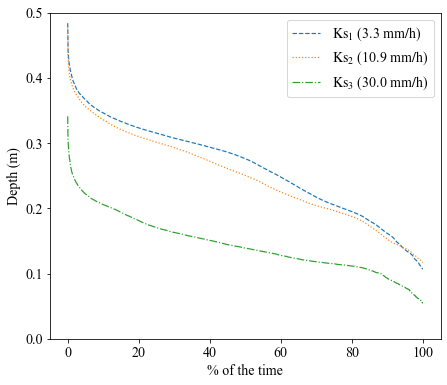

In [278]:
plt.figure(figsize=(7,6))
plt.plot(W3_infW_3_TS_df_sort["% Tiempo"], W3_infW_3_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_1}$ (3.3 $\mathrm{mm/h}$)",linestyle= '--',  linewidth=1.2)
plt.plot(W3_infW_1_TS_df_sort["% Tiempo"], W3_infW_1_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_2}$ (10.9 $\mathrm{mm/h}$)",linestyle= ':',  linewidth=1.2)
plt.plot(W3_infW_2_TS_df_sort["% Tiempo"], W3_infW_2_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_3}$ (30.0 $\mathrm{mm/h}$)",linestyle= '-.',  linewidth=1.2)
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.ylim(0,0.5)
plt.legend()
plt.savefig("Figures/Fig8c.svg")

Las Ranas

In [279]:
W4_infW_1_TS_df_sort=C_duracion(df_WSU_infW_1, "W4")
W4_infW_2_TS_df_sort=C_duracion(df_WSU_infW_2, "W4")
W4_infW_3_TS_df_sort=C_duracion(df_WSU_infW_3, "W4")

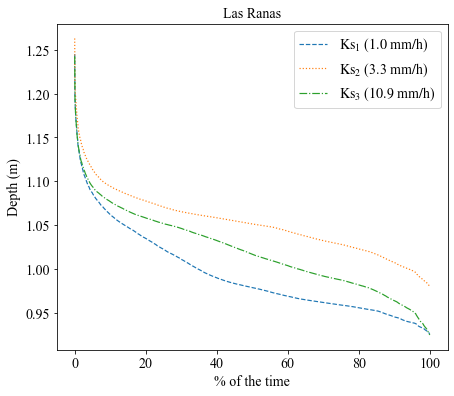

In [280]:
plt.figure(figsize=(7,6))
plt.plot(W4_infW_3_TS_df_sort["% Tiempo"], W4_infW_3_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_1}$ ($1.0$ $\mathrm{mm/h}$)",linestyle= '--',  linewidth=1.2)
plt.plot(W4_infW_1_TS_df_sort["% Tiempo"], W4_infW_1_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_2}$ (3.3 $\mathrm{mm/h}$)",linestyle= ':',  linewidth=1.2)
plt.plot(W4_infW_2_TS_df_sort["% Tiempo"], W4_infW_2_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_3}$ ($10.9$ $\mathrm{mm/h}$)",linestyle= '-.',  linewidth=1.2)
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Las Ranas")
plt.savefig("Figures/Anexos/DC_W4_INF.svg")

Humedal Estero Teodosio Sarao

In [281]:
W5_infW_1_TS_df_sort=C_duracion(df_WSU_infW_1, "W5")
W5_infW_2_TS_df_sort=C_duracion(df_WSU_infW_2, "W5")
W5_infW_3_TS_df_sort=C_duracion(df_WSU_infW_3, "W5")

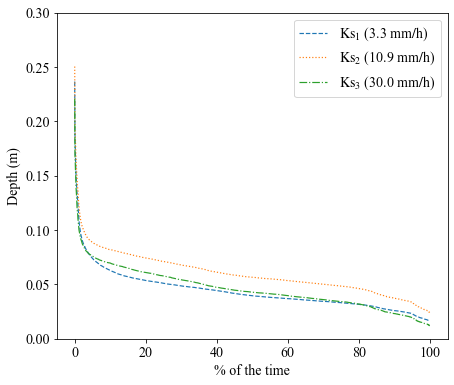

In [282]:
plt.figure(figsize=(7,6))
plt.plot(W5_infW_3_TS_df_sort["% Tiempo"], W5_infW_3_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_1}$ (3.3 $\mathrm{mm/h}$)",linestyle= '--',  linewidth=1.2)
plt.plot(W5_infW_1_TS_df_sort["% Tiempo"], W5_infW_1_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_2}$ (10.9 $\mathrm{mm/h}$)",linestyle= ':',  linewidth=1.2)
plt.plot(W5_infW_2_TS_df_sort["% Tiempo"], W5_infW_2_TS_df_sort["Depth (m)"], label="$\mathrm{Ks_3}$ (30.0 $\mathrm{mm/h}$)",linestyle= '-.',  linewidth=1.2)
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.ylim(0,0.3)
plt.legend()
plt.savefig("Figures/Anexos/DC_W5_INF.svg")

### Time Series

In [283]:
WSU_name="W1"
i=WSU_names_list.index(WSU_name)

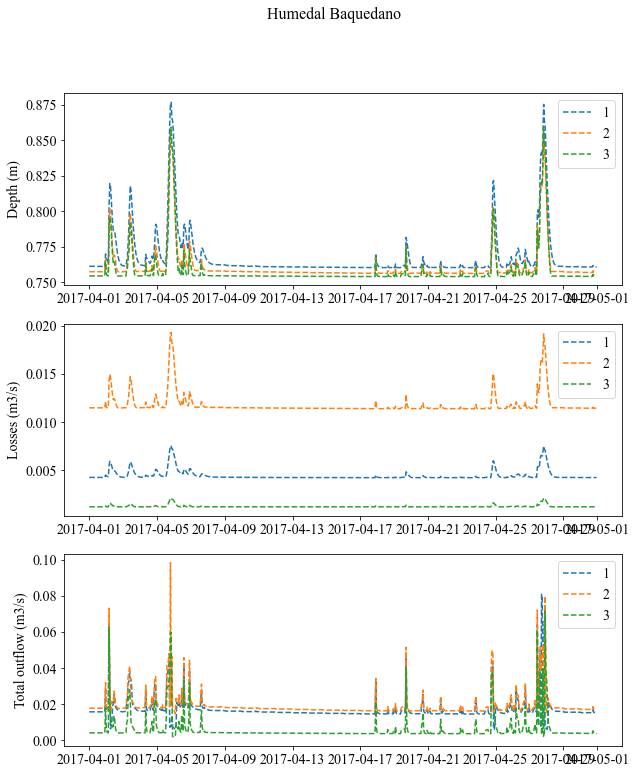

In [284]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_infW_1[i]["2017-04"].index,df_WSU_infW_1[i]["2017-04"]["Depth (m)"], label="1",linestyle="--" )
ax1.plot(df_WSU_infW_2[i]["2017-04"].index,df_WSU_infW_2[i]["2017-04"]["Depth (m)"], label="2",linestyle="--" )
ax1.plot(df_WSU_infW_3[i]["2017-04"].index,df_WSU_infW_3[i]["2017-04"]["Depth (m)"], label="3",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_infW_1[i]["2017-04"].index,df_WSU_infW_1[i]["2017-04"]["Losses (m3/s)"],label="1",linestyle="--")
ax3.plot(df_WSU_infW_2[i]["2017-04"].index,df_WSU_infW_2[i]["2017-04"]["Losses (m3/s)"],label="2",linestyle="--")
ax3.plot(df_WSU_infW_3[i]["2017-04"].index,df_WSU_infW_3[i]["2017-04"]["Losses (m3/s)"],label="3",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_infW_1[i]["2017-04"].index,df_WSU_infW_1[i]["2017-04"]["Total outflow (m3/s)"],label="1",linestyle="--" )
ax4.plot(df_WSU_infW_2[i]["2017-04"].index,df_WSU_infW_2[i]["2017-04"]["Total outflow (m3/s)"],label="2",linestyle="--" )
ax4.plot(df_WSU_infW_3[i]["2017-04"].index,df_WSU_infW_3[i]["2017-04"]["Total outflow (m3/s)"],label="3",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Baquedano",fontsize=16)
plt.show()

In [285]:
WSU_name="W2"
i=WSU_names_list.index(WSU_name)

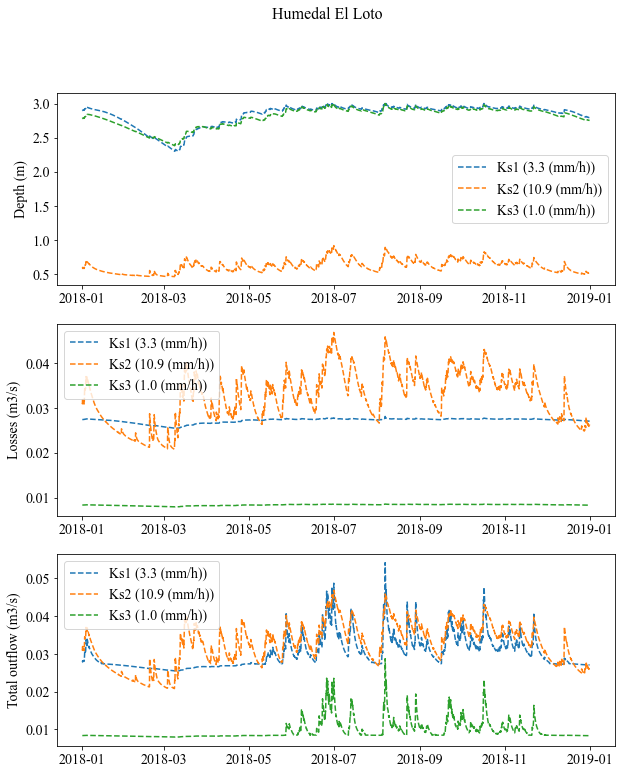

In [286]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_infW_1[i]["2018"].index,df_WSU_infW_1[i]["2018"]["Depth (m)"], label="Ks1 (3.3 (mm/h))",linestyle="--" )
ax1.plot(df_WSU_infW_2[i]["2018"].index,df_WSU_infW_2[i]["2018"]["Depth (m)"], label="Ks2 (10.9 (mm/h))",linestyle="--" )
ax1.plot(df_WSU_infW_3[i]["2018"].index,df_WSU_infW_3[i]["2018"]["Depth (m)"], label="Ks3 (1.0 (mm/h))",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_infW_1[i]["2018"].index,df_WSU_infW_1[i]["2018"]["Losses (m3/s)"],label="Ks1 (3.3 (mm/h))",linestyle="--")
ax3.plot(df_WSU_infW_2[i]["2018"].index,df_WSU_infW_2[i]["2018"]["Losses (m3/s)"],label="Ks2 (10.9 (mm/h))",linestyle="--")
ax3.plot(df_WSU_infW_3[i]["2018"].index,df_WSU_infW_3[i]["2018"]["Losses (m3/s)"],label="Ks3 (1.0 (mm/h))",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_infW_1[i]["2018"].index,df_WSU_infW_1[i]["2018"]["Total outflow (m3/s)"],label="Ks1 (3.3 (mm/h))",linestyle="--" )
ax4.plot(df_WSU_infW_2[i]["2018"].index,df_WSU_infW_2[i]["2018"]["Total outflow (m3/s)"],label="Ks2 (10.9 (mm/h))",linestyle="--" )
ax4.plot(df_WSU_infW_3[i]["2018"].index,df_WSU_infW_3[i]["2018"]["Total outflow (m3/s)"],label="Ks3 (1.0 (mm/h))",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal El Loto",fontsize=16)
plt.show()

In [287]:
WSU_name="W3"
i=WSU_names_list.index(WSU_name)

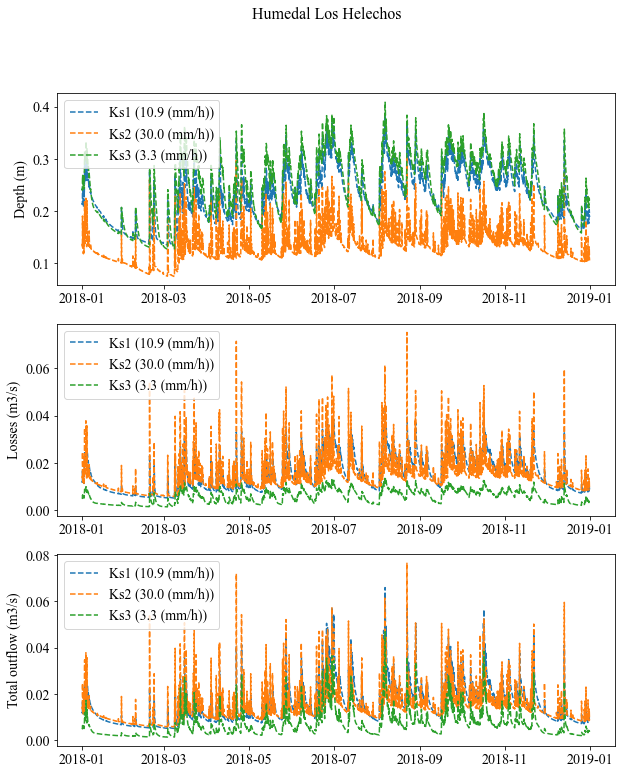

In [288]:
f, (ax1 ,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_infW_1[i]["2018"].index,df_WSU_infW_1[i]["2018"]["Depth (m)"], label="Ks1 (10.9 (mm/h))",linestyle="--" )
ax1.plot(df_WSU_infW_2[i]["2018"].index,df_WSU_infW_2[i]["2018"]["Depth (m)"], label="Ks2 (30.0 (mm/h))",linestyle="--" )
ax1.plot(df_WSU_infW_3[i]["2018"].index,df_WSU_infW_3[i]["2018"]["Depth (m)"], label="Ks3 (3.3 (mm/h))",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_infW_1[i]["2018"].index,df_WSU_infW_1[i]["2018"]["Losses (m3/s)"],label="Ks1 (10.9 (mm/h))",linestyle="--")
ax3.plot(df_WSU_infW_2[i]["2018"].index,df_WSU_infW_2[i]["2018"]["Losses (m3/s)"],label="Ks2 (30.0 (mm/h))",linestyle="--")
ax3.plot(df_WSU_infW_3[i]["2018"].index,df_WSU_infW_3[i]["2018"]["Losses (m3/s)"],label="Ks3 (3.3 (mm/h))",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_infW_1[i]["2018"].index,df_WSU_infW_1[i]["2018"]["Total outflow (m3/s)"],label="Ks1 (10.9 (mm/h))",linestyle="--" )
ax4.plot(df_WSU_infW_2[i]["2018"].index,df_WSU_infW_2[i]["2018"]["Total outflow (m3/s)"],label="Ks2 (30.0 (mm/h))",linestyle="--" )
ax4.plot(df_WSU_infW_3[i]["2018"].index,df_WSU_infW_3[i]["2018"]["Total outflow (m3/s)"],label="Ks3 (3.3 (mm/h))",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Los Helechos",fontsize=16)
plt.show()

In [289]:
WSU_name="W4"
i=WSU_names_list.index(WSU_name)

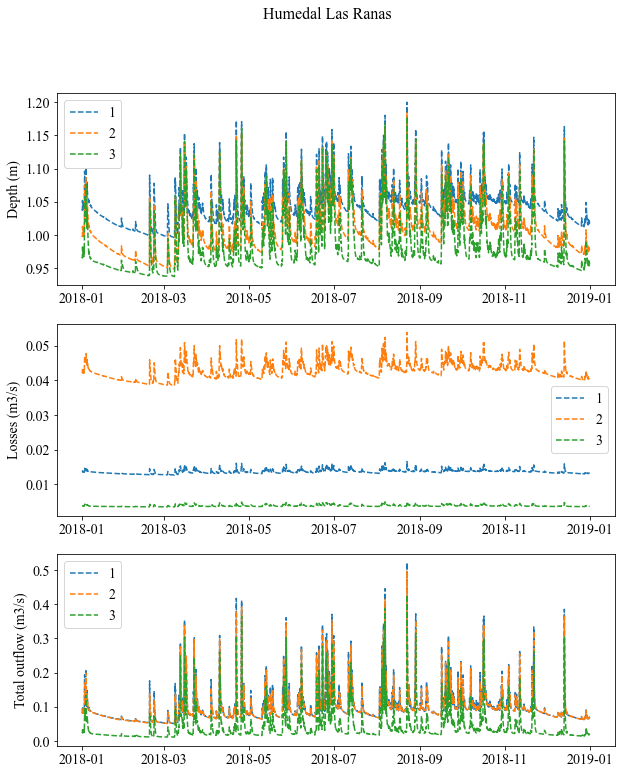

In [290]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_infW_1[i]["2018"].index,df_WSU_infW_1[i]["2018"]["Depth (m)"], label="1",linestyle="--" )
ax1.plot(df_WSU_infW_2[i]["2018"].index,df_WSU_infW_2[i]["2018"]["Depth (m)"], label="2",linestyle="--" )
ax1.plot(df_WSU_infW_3[i]["2018"].index,df_WSU_infW_3[i]["2018"]["Depth (m)"], label="3",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_infW_1[i]["2018"].index,df_WSU_infW_1[i]["2018"]["Losses (m3/s)"],label="1",linestyle="--")
ax3.plot(df_WSU_infW_2[i]["2018"].index,df_WSU_infW_2[i]["2018"]["Losses (m3/s)"],label="2",linestyle="--")
ax3.plot(df_WSU_infW_3[i]["2018"].index,df_WSU_infW_3[i]["2018"]["Losses (m3/s)"],label="3",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_infW_1[i]["2018"].index,df_WSU_infW_1[i]["2018"]["Total outflow (m3/s)"],label="1",linestyle="--" )
ax4.plot(df_WSU_infW_2[i]["2018"].index,df_WSU_infW_2[i]["2018"]["Total outflow (m3/s)"],label="2",linestyle="--" )
ax4.plot(df_WSU_infW_3[i]["2018"].index,df_WSU_infW_3[i]["2018"]["Total outflow (m3/s)"],label="3",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Las Ranas",fontsize=16)
plt.show()

In [291]:
WSU_name="W5"
i=WSU_names_list.index(WSU_name)

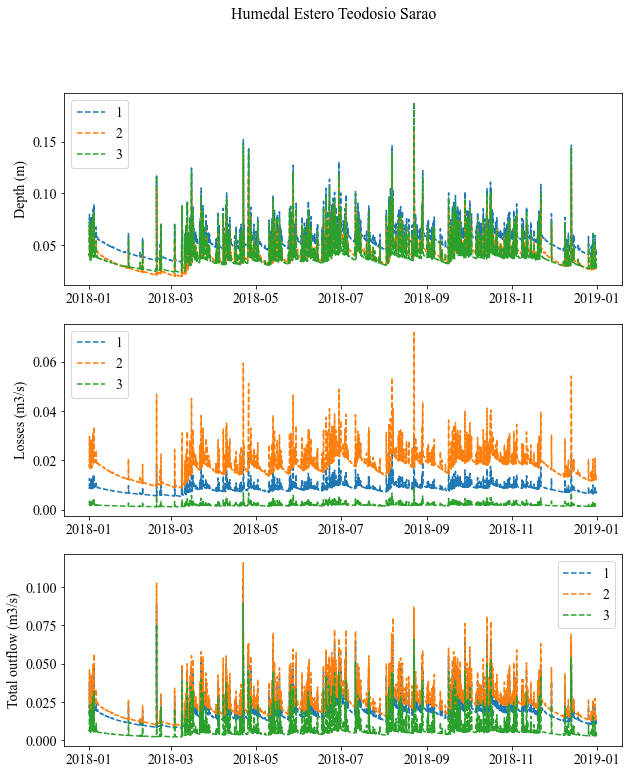

In [292]:
f, (ax1,ax3, ax4) = plt.subplots(3,1, figsize=(10,12))
ax1.plot(df_WSU_infW_1[i]["2018"].index,df_WSU_infW_1[i]["2018"]["Depth (m)"], label="1",linestyle="--" )
ax1.plot(df_WSU_infW_2[i]["2018"].index,df_WSU_infW_2[i]["2018"]["Depth (m)"], label="2",linestyle="--" )
ax1.plot(df_WSU_infW_3[i]["2018"].index,df_WSU_infW_3[i]["2018"]["Depth (m)"], label="3",linestyle="--" )
ax1.legend()
ax1.set_ylabel("Depth (m)")
# ax2.plot(df_WSU_K1[i].index,df_WSU_K1[i]["Total inflow (m3/s)"],label="K1 (2.5 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K3[i].index,df_WSU_K3[i]["Total inflow (m3/s)"],label="K3 (7.8 m/dia)",linestyle="--" )
# ax2.plot(df_WSU_K5[i].index,df_WSU_K5[i]["Total inflow (m3/s)"],label="K5 (100 m/dia)",linestyle="--" )
# ax2.legend()
# ax2.set_ylabel("Total inflow (m3/s)")
ax3.plot(df_WSU_infW_1[i]["2018"].index,df_WSU_infW_1[i]["2018"]["Losses (m3/s)"],label="1",linestyle="--")
ax3.plot(df_WSU_infW_2[i]["2018"].index,df_WSU_infW_2[i]["2018"]["Losses (m3/s)"],label="2",linestyle="--")
ax3.plot(df_WSU_infW_3[i]["2018"].index,df_WSU_infW_3[i]["2018"]["Losses (m3/s)"],label="3",linestyle="--")
ax3.legend()
ax3.set_ylabel("Losses (m3/s)")
ax4.plot(df_WSU_infW_1[i]["2018"].index,df_WSU_infW_1[i]["2018"]["Total outflow (m3/s)"],label="1",linestyle="--" )
ax4.plot(df_WSU_infW_2[i]["2018"].index,df_WSU_infW_2[i]["2018"]["Total outflow (m3/s)"],label="2",linestyle="--" )
ax4.plot(df_WSU_infW_3[i]["2018"].index,df_WSU_infW_3[i]["2018"]["Total outflow (m3/s)"],label="3",linestyle="--" )
ax4.legend()
ax4.set_ylabel("Total outflow (m3/s)")
f.suptitle("Humedal Estero Teodosio Sarao",fontsize=16)
plt.show()

### Zone Budget: RCH-DRN

In [293]:
rch_drn_inf1_W=import_xls_2('Iteracion_C_2/rch_drn.xls')
rch_drn_inf2_W=import_xls_2('Iteracion_inf_2/rch_drn.xls') 
rch_drn_inf3_W=import_xls_2('Iteracion_inf_3/rch_drn.xls') 

In [294]:
rch_drn_inf1W_WSU=rch_drn_S_WSU(rch_drn_inf1_W)
rch_drn_inf2W_WSU=rch_drn_S_WSU(rch_drn_inf2_W)
rch_drn_inf3W_WSU=rch_drn_S_WSU(rch_drn_inf3_W)

Baquedano

Text(0.5, 1.0, 'RCH rate Baquedano')

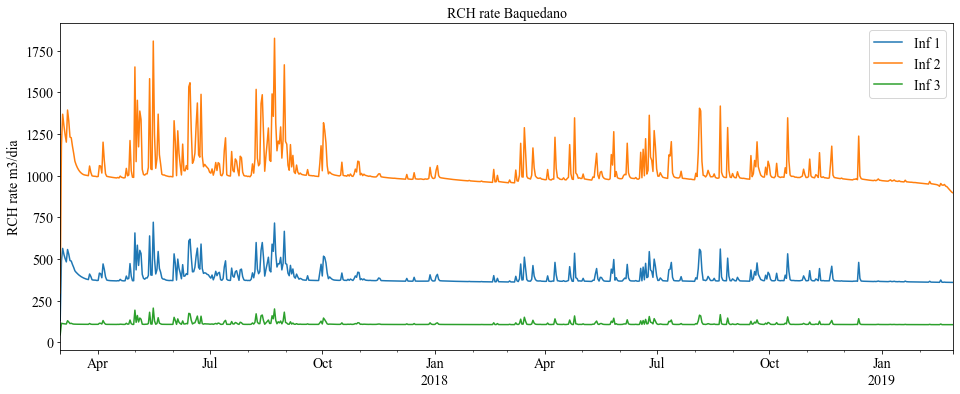

In [295]:
rch_drn_inf1W_WSU[1].W1.plot(label="Inf 1", figsize=(16,6))
rch_drn_inf2W_WSU[1].W1.plot(label="Inf 2")
rch_drn_inf3W_WSU[1].W1.plot(label="Inf 3")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.title("RCH rate Baquedano")

Text(0.5, 1.0, 'DRN rate Baquedano + S10')

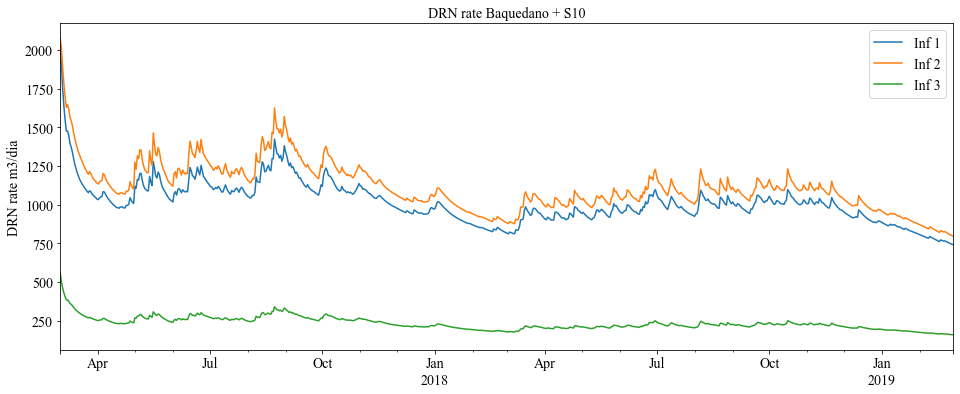

In [296]:
(rch_drn_inf1W_WSU[0].W1+rch_drn_inf1W_WSU[2].S10).plot(label="Inf 1", figsize=(16,6))
(rch_drn_inf2W_WSU[0].W1+rch_drn_inf2W_WSU[2].S10).plot(label="Inf 2")
(rch_drn_inf3W_WSU[0].W1+rch_drn_inf3W_WSU[2].S10).plot(label="Inf 3")
plt.legend()
plt.ylabel("DRN rate m3/dia")
#plt.ylim([0,2500])
plt.title("DRN rate Baquedano + S10")

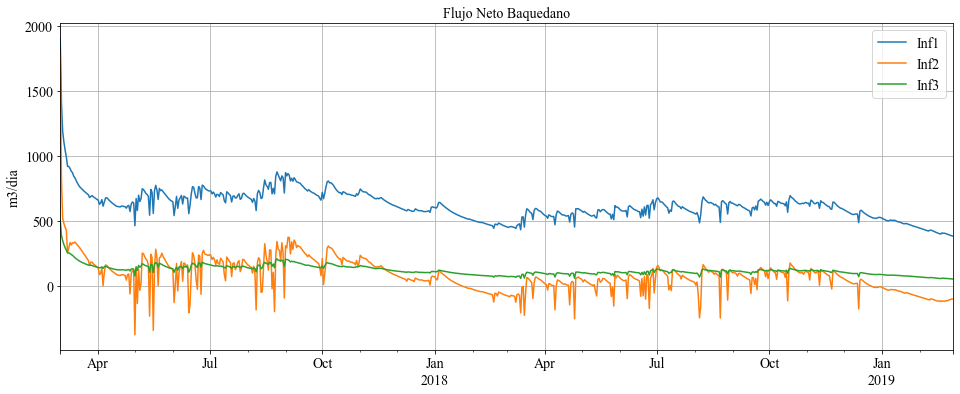

In [297]:
(rch_drn_inf1W_WSU[0].W1+rch_drn_inf1W_WSU[2].S10-rch_drn_inf1W_WSU[1].W1).plot(label="Inf1", figsize=(16,6))
(rch_drn_inf2W_WSU[0].W1+rch_drn_inf2W_WSU[2].S10-rch_drn_inf2W_WSU[1].W1).plot(label="Inf2")
(rch_drn_inf3W_WSU[0].W1+rch_drn_inf3W_WSU[2].S10-rch_drn_inf3W_WSU[1].W1).plot(label="Inf3")
plt.legend()
plt.ylabel("m3/dia")
#plt.ylim([500,2000])
plt.title("Flujo Neto Baquedano")
plt.grid()

El Loto

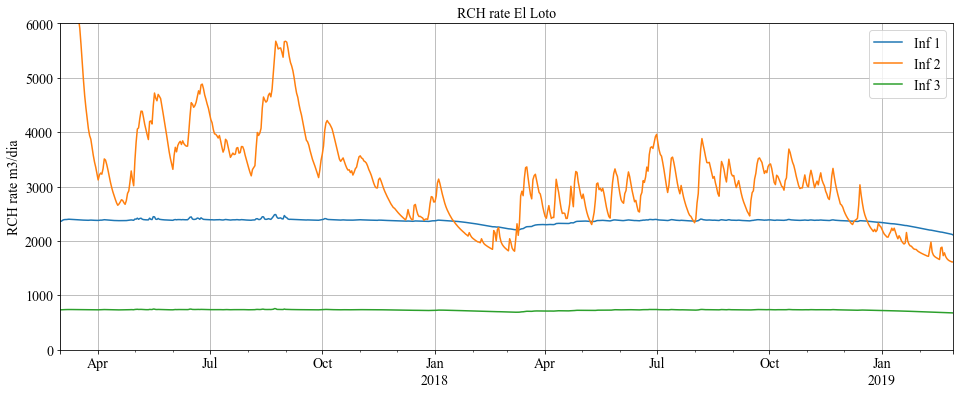

In [298]:
rch_drn_inf1W_WSU[1].W2.plot(label="Inf 1", figsize=(16,6))
rch_drn_inf2W_WSU[1].W2.plot(label="Inf 2")
rch_drn_inf3W_WSU[1].W2.plot(label="Inf 3")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.title("RCH rate El Loto")
plt.ylim(0,6000)
plt.grid()

Text(0.5, 1.0, 'DRN  El Loto + S16 + S17 + S23')

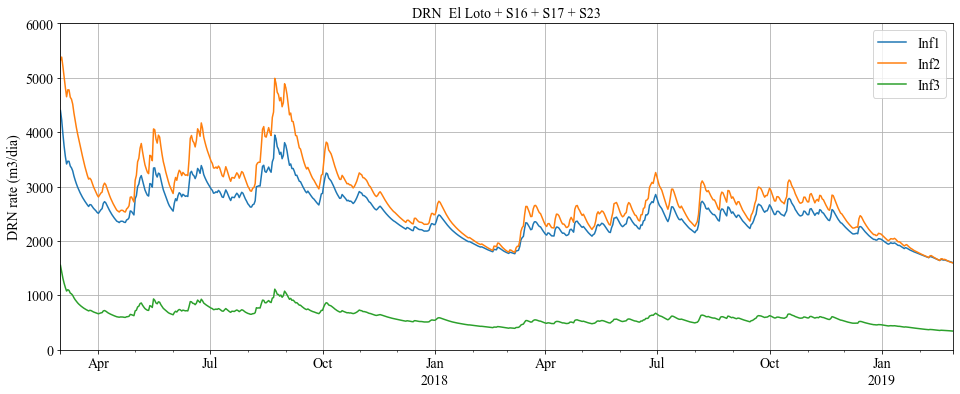

In [299]:
(rch_drn_inf1W_WSU[0].W2+rch_drn_inf1W_WSU[2].S16+rch_drn_inf1W_WSU[2].S17+rch_drn_inf1W_WSU[2].S23).plot(label="Inf1", figsize=(16,6))
(rch_drn_inf2W_WSU[0].W2+rch_drn_inf2W_WSU[2].S16+rch_drn_inf2W_WSU[2].S17+rch_drn_inf2W_WSU[2].S23).plot(label="Inf2")
(rch_drn_inf3W_WSU[0].W2+rch_drn_inf3W_WSU[2].S16+rch_drn_inf3W_WSU[2].S17+rch_drn_inf3W_WSU[2].S23).plot(label="Inf3")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
plt.ylim(0,6000)
plt.grid()
plt.title("DRN  El Loto + S16 + S17 + S23")

Text(0.5, 1.0, 'Flujo Neto El Loto')

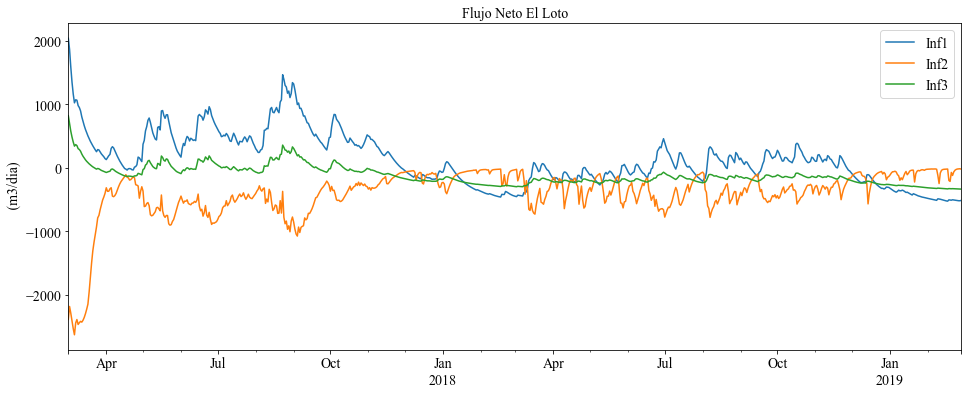

In [300]:
(rch_drn_inf1W_WSU[0].W2+rch_drn_inf1W_WSU[2].S16+rch_drn_inf1W_WSU[2].S17+rch_drn_inf1W_WSU[2].S23-rch_drn_inf1W_WSU[1].W2).plot(label="Inf1", figsize=(16,6))
(rch_drn_inf2W_WSU[0].W2+rch_drn_inf2W_WSU[2].S16+rch_drn_inf2W_WSU[2].S17+rch_drn_inf2W_WSU[2].S23-rch_drn_inf2W_WSU[1].W2).plot(label="Inf2")
(rch_drn_inf3W_WSU[0].W2+rch_drn_inf3W_WSU[2].S16+rch_drn_inf3W_WSU[2].S17+rch_drn_inf3W_WSU[2].S23-rch_drn_inf3W_WSU[1].W2).plot(label="Inf3")
plt.legend()
plt.ylabel(" (m3/dia)")
#plt.ylim([2000,6000])
plt.title("Flujo Neto El Loto")

Text(0.5, 1.0, 'RCH rate Los Helechos')

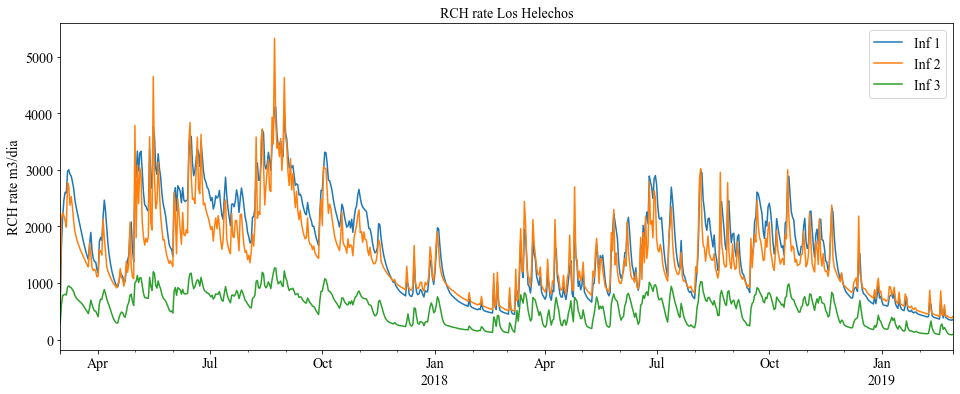

In [301]:
rch_drn_inf1W_WSU[1].W3.plot(label="Inf 1", figsize=(16,6))
rch_drn_inf2W_WSU[1].W3.plot(label="Inf 2")
rch_drn_inf3W_WSU[1].W3.plot(label="Inf 3")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.title("RCH rate Los Helechos")

Text(0.5, 1.0, 'DRN Los Helechos + S29')

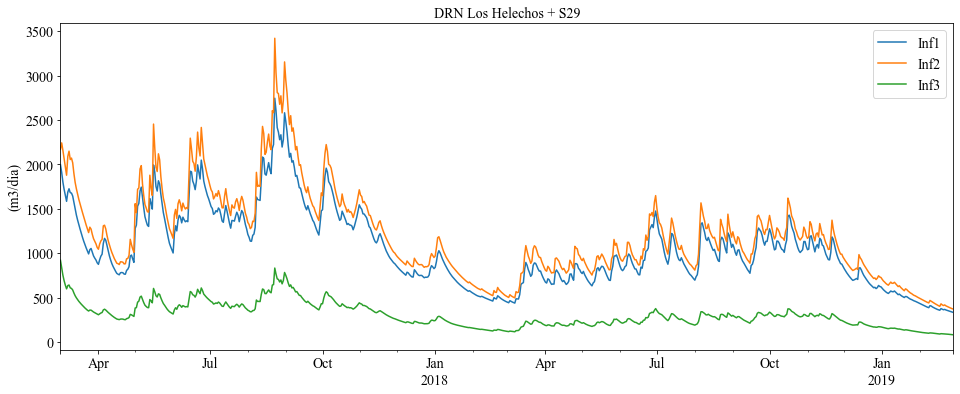

In [302]:
(rch_drn_inf1W_WSU[0].W3+rch_drn_inf1W_WSU[2].S29).plot(label="Inf1", figsize=(16,6))
(rch_drn_inf2W_WSU[0].W3+rch_drn_inf2W_WSU[2].S29).plot(label="Inf2")
(rch_drn_inf3W_WSU[0].W3+rch_drn_inf3W_WSU[2].S29).plot(label="Inf3")
plt.legend()
plt.ylabel("(m3/dia)")
plt.title("DRN Los Helechos + S29")

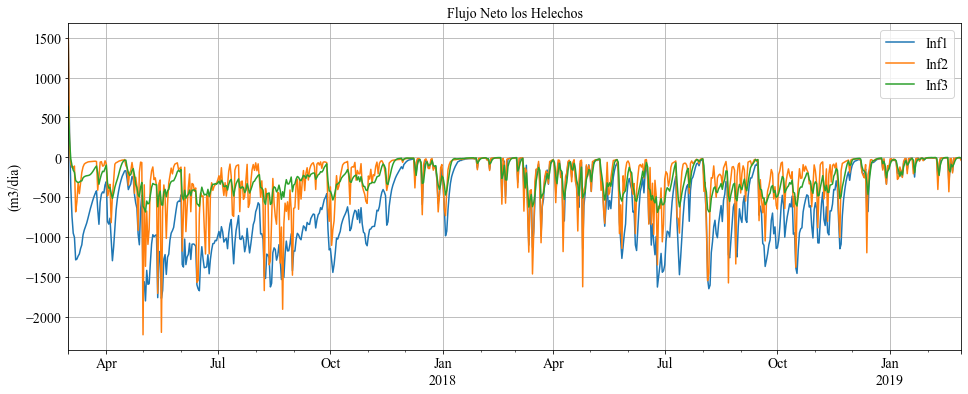

In [303]:
(rch_drn_inf1W_WSU[0].W3+rch_drn_inf1W_WSU[2].S29-rch_drn_inf1W_WSU[1].W3).plot(label="Inf1", figsize=(16,6))
(rch_drn_inf2W_WSU[0].W3+rch_drn_inf2W_WSU[2].S29-rch_drn_inf2W_WSU[1].W3).plot(label="Inf2")
(rch_drn_inf3W_WSU[0].W3+rch_drn_inf3W_WSU[2].S29-rch_drn_inf3W_WSU[1].W3).plot(label="Inf3")
#plt.ylim(-2100,0)
plt.legend()
plt.ylabel("(m3/dia)")
plt.title("Flujo Neto los Helechos")
plt.grid()

Las Ranas

Text(0.5, 1.0, 'RCH rate Las Ranas')

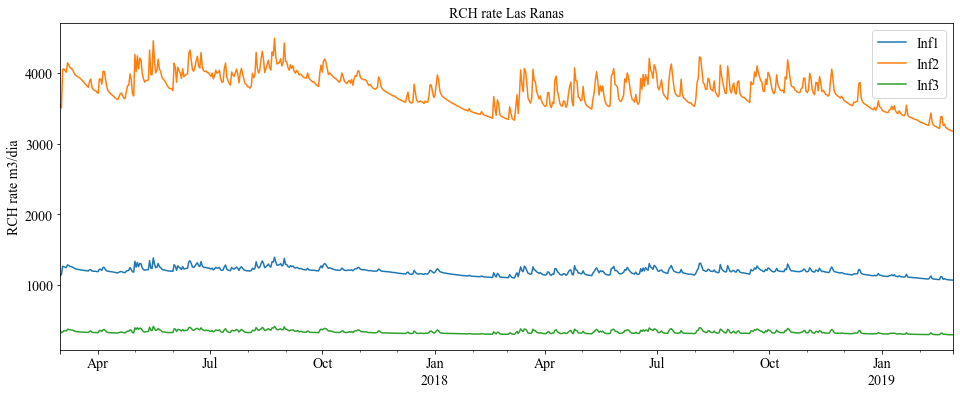

In [304]:
rch_drn_inf1W_WSU[1].W4.plot(label="Inf1", figsize=(16,6))
rch_drn_inf2W_WSU[1].W4.plot(label="Inf2")
rch_drn_inf3W_WSU[1].W4.plot(label="Inf3")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.title("RCH rate Las Ranas")

Text(0.5, 1.0, 'DRN La Ranas + S31 + S33 + S34')

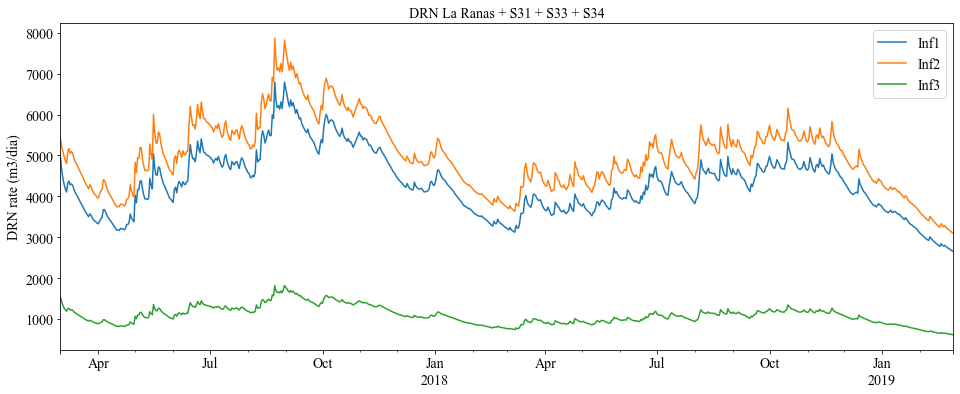

In [305]:
(rch_drn_inf1W_WSU[0].W4+rch_drn_inf1W_WSU[2].S31+rch_drn_inf1W_WSU[2].S33+rch_drn_inf1W_WSU[2].S34).plot(label="Inf1", figsize=(16,6))
(rch_drn_inf2W_WSU[0].W4+rch_drn_inf2W_WSU[2].S31+rch_drn_inf2W_WSU[2].S33+rch_drn_inf2W_WSU[2].S34).plot(label="Inf2")
(rch_drn_inf3W_WSU[0].W4+rch_drn_inf3W_WSU[2].S31+rch_drn_inf3W_WSU[2].S33+rch_drn_inf3W_WSU[2].S34).plot(label="Inf3")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
plt.title("DRN La Ranas + S31 + S33 + S34")

Text(0.5, 1.0, 'Flujo Neto Las Ranas')

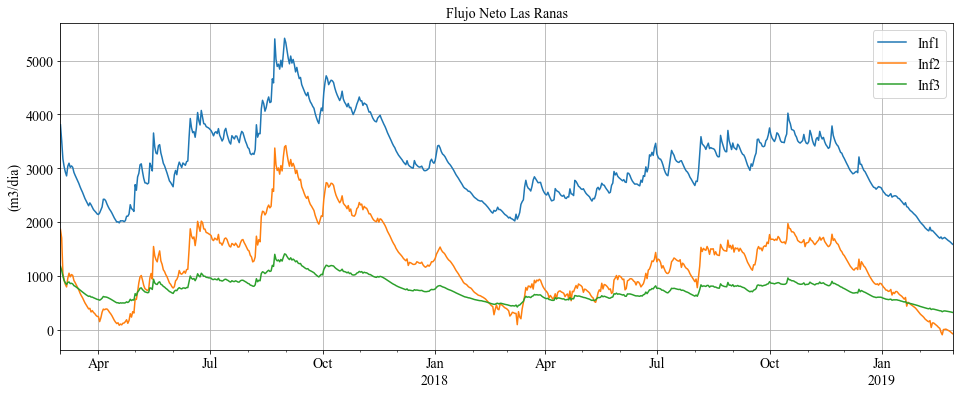

In [306]:
(rch_drn_inf1W_WSU[0].W4+rch_drn_inf1W_WSU[2].S31+rch_drn_inf1W_WSU[2].S33+rch_drn_inf1W_WSU[2].S34-rch_drn_inf1W_WSU[1].W4).plot(label="Inf1", figsize=(16,6))
(rch_drn_inf2W_WSU[0].W4+rch_drn_inf2W_WSU[2].S31+rch_drn_inf2W_WSU[2].S33+rch_drn_inf2W_WSU[2].S34-rch_drn_inf2W_WSU[1].W4).plot(label="Inf2")
(rch_drn_inf3W_WSU[0].W4+rch_drn_inf3W_WSU[2].S31+rch_drn_inf3W_WSU[2].S33+rch_drn_inf3W_WSU[2].S34-rch_drn_inf3W_WSU[1].W4).plot(label="Inf3")
plt.legend()
plt.grid()
plt.ylabel("(m3/dia)")
plt.title("Flujo Neto Las Ranas")

Text(0.5, 1.0, 'RCH rate Humedal Estero Teodosio Sarao')

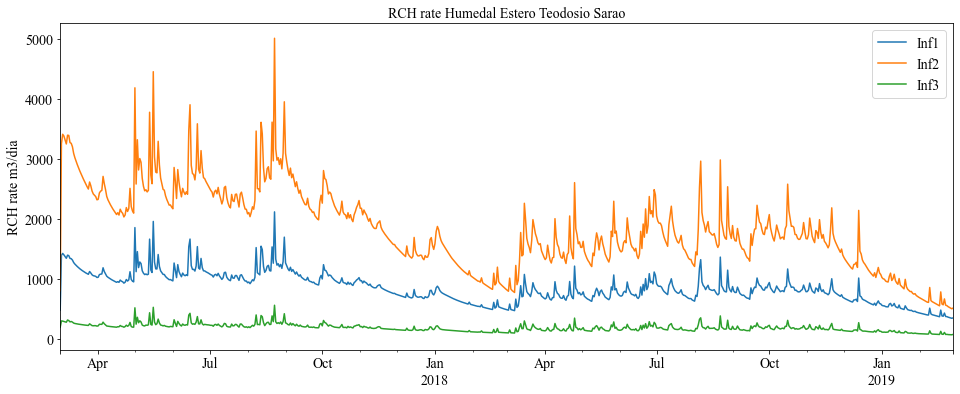

In [307]:
rch_drn_inf1W_WSU[1].W5.plot(label="Inf1", figsize=(16,6))
rch_drn_inf2W_WSU[1].W5.plot(label="Inf2")
rch_drn_inf3W_WSU[1].W5.plot(label="Inf3")
plt.legend()
plt.ylabel("RCH rate m3/dia")
plt.title("RCH rate Humedal Estero Teodosio Sarao")

Text(0.5, 1.0, 'DRN Humedal Estero Teodosio Sarao')

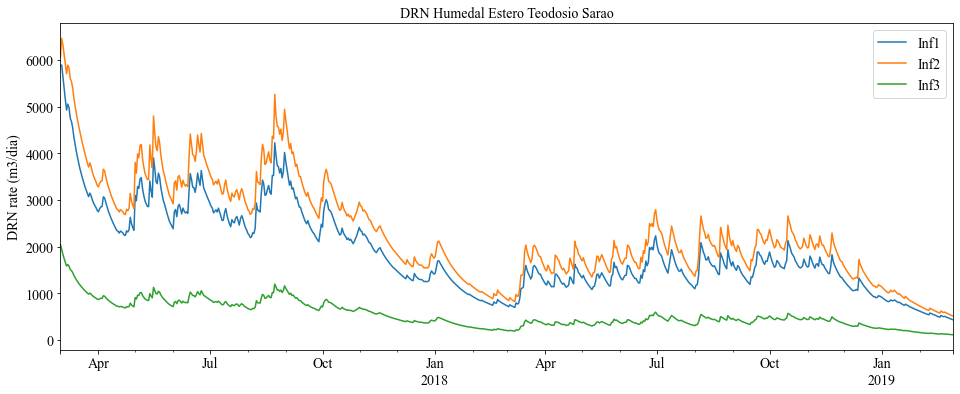

In [308]:
(rch_drn_inf1W_WSU[0].W5).plot(label="Inf1", figsize=(16,6))
(rch_drn_inf2W_WSU[0].W5).plot(label="Inf2")
(rch_drn_inf3W_WSU[0].W5).plot(label="Inf3")
plt.legend()
plt.ylabel("DRN rate (m3/dia)")
plt.title("DRN Humedal Estero Teodosio Sarao")

Text(0.5, 1.0, 'Flujo Neto Humedal Estero Teodosio Sarao')

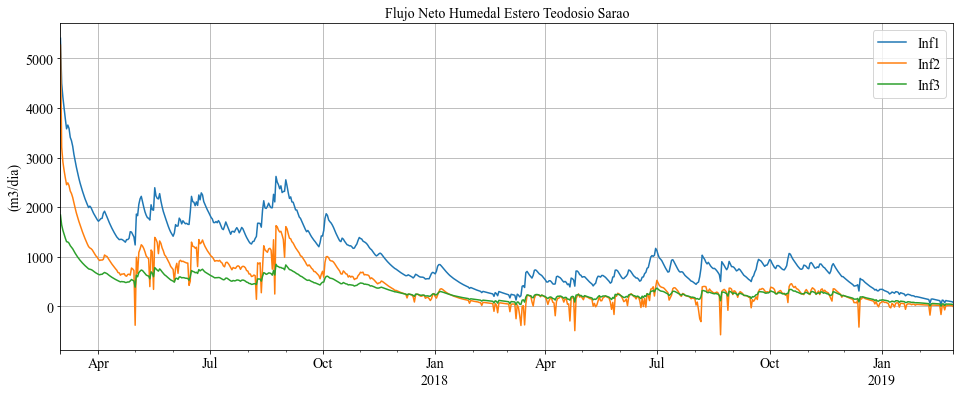

In [309]:
(rch_drn_inf1W_WSU[0].W5-rch_drn_inf1W_WSU[1].W5).plot(label="Inf1", figsize=(16,6))
(rch_drn_inf2W_WSU[0].W5-rch_drn_inf2W_WSU[1].W5).plot(label="Inf2")
(rch_drn_inf3W_WSU[0].W5-rch_drn_inf3W_WSU[1].W5).plot(label="Inf3")
plt.legend()
plt.ylabel("(m3/dia)")
plt.grid()
plt.title("Flujo Neto Humedal Estero Teodosio Sarao")

### Sensitive Analisis Resume

In [310]:
df_sensitive_analisis_inf_SU=pd.DataFrame(index=["Ks", "W1", "W2", "W3", "W4", "W5"])

In [311]:
df_sensitive_analisis_inf_SU["Inf3"]=""
df_sensitive_analisis_inf_SU["Inf1"]=""
df_sensitive_analisis_inf_SU["Inf2"]=""

In [312]:
j="W1"
df_sensitive_analisis_inf_SU["Inf1"][j]= W1_infW_1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_inf_SU["Inf2"][j]= W1_infW_2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_inf_SU["Inf3"][j]= W1_infW_3_TS_df_sort["Depth (m)"].mean()

In [313]:
j="W2"
df_sensitive_analisis_inf_SU["Inf1"][j]= W2_infW_1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_inf_SU["Inf2"][j]= W2_infW_2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_inf_SU["Inf3"][j]= W2_infW_3_TS_df_sort["Depth (m)"].mean()

In [314]:
j="W3"
df_sensitive_analisis_inf_SU["Inf1"][j]= W3_infW_1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_inf_SU["Inf2"][j]= W3_infW_2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_inf_SU["Inf3"][j]= W3_infW_3_TS_df_sort["Depth (m)"].mean()

In [315]:
j="W4"
df_sensitive_analisis_inf_SU["Inf1"][j]= W4_infW_1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_inf_SU["Inf2"][j]= W4_infW_2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_inf_SU["Inf3"][j]= W4_infW_3_TS_df_sort["Depth (m)"].mean()

In [316]:
j="W5"
df_sensitive_analisis_inf_SU["Inf1"][j]= W5_infW_1_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_inf_SU["Inf2"][j]= W5_infW_2_TS_df_sort["Depth (m)"].mean()
df_sensitive_analisis_inf_SU["Inf3"][j]= W5_infW_3_TS_df_sort["Depth (m)"].mean()

In [317]:
df_sensitive_analisis_inf_SU

,Inf3,Inf1,Inf2
Ks,,,
W1,0.760635,0.769992,0.762956
W2,2.82115,2.84503,0.690585
W3,0.262516,0.248673,0.144808
W4,0.993619,1.05206,1.02035
W5,0.0438453,0.0600365,0.0461576


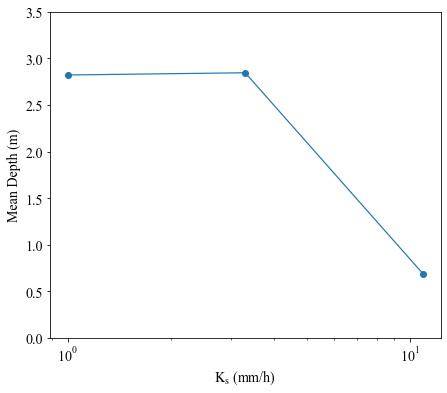

In [318]:
plt.figure(figsize=(7,6))
plt.plot([1,3.3,10.9],df_sensitive_analisis_inf_SU.loc["W2"], marker='o', linewidth=1.2)
plt.ylim(0., 3.5)
plt.xlabel("$\mathrm{K_s}$ (mm/h)")
plt.ylabel("Mean Depth (m)")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.ylim(0, 3.5)
plt.xscale("log")

# plt.rc('legend', fontsize=14)    # legend fontsize
#plt.title("Curvas de Duración Altura Humedal El Loto")
plt.savefig("Figures/Fig7f.png")

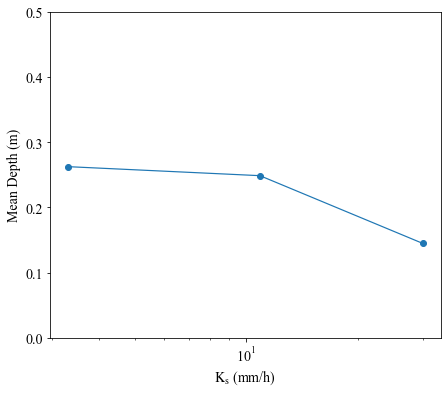

In [319]:
plt.figure(figsize=(7,6))
plt.plot([3.3, 10.9, 30.0],df_sensitive_analisis_inf_SU.loc["W3"], marker='o', linewidth=1.2)
plt.ylim(0., 3.5)
plt.xlabel("$\mathrm{K_s}$ (mm/h)")
plt.ylabel("Mean Depth (m)")
plt.rc('font', size=14)          # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.ylim(0, 0.5)
plt.xscale("log")
# plt.rc('legend', fontsize=14)    # legend fontsize
#plt.title("Curvas de Duración Altura Humedal El Loto")
plt.savefig("Figures/Fig8f.png")

## Subcatchments Parameters

### Curvas de Duración Humedales

In [320]:
df_WSU_infS_1=import_xls('Iteracion_C_2/WSU_SWMM_TS.xls') 
df_WSU_infS_2=import_xls('Iteracion_inf_2_S/WSU_SWMM_TS.xls') 
df_WSU_infS_3=import_xls('Iteracion_inf_3_S/WSU_SWMM_TS.xls') 

In [321]:
W1_infS_1_TS_df_sort=C_duracion(df_WSU_infS_1, "W2")
W1_infS_2_TS_df_sort=C_duracion(df_WSU_infS_2, "W2")
W1_infS_3_TS_df_sort=C_duracion(df_WSU_infS_3, "W2")

Text(0.5, 1.0, 'Curvas de Duración Altura Baquedano')

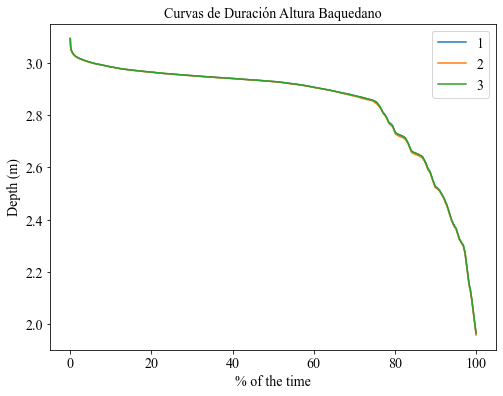

In [322]:
plt.figure(figsize=(8,6))
plt.plot(W1_infS_1_TS_df_sort["% Tiempo"], W1_infS_1_TS_df_sort["Depth (m)"], label="1")
plt.plot(W1_infS_2_TS_df_sort["% Tiempo"], W1_infS_2_TS_df_sort["Depth (m)"], label="2")
plt.plot(W1_infS_3_TS_df_sort["% Tiempo"], W1_infS_3_TS_df_sort["Depth (m)"], label="3")
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Altura Baquedano")

In [323]:
W2_infS_1_TS_df_sort=C_duracion(df_WSU_infS_1, "W2")
W2_infS_2_TS_df_sort=C_duracion(df_WSU_infS_2, "W2")
W2_infS_3_TS_df_sort=C_duracion(df_WSU_infS_3, "W2")

Text(0.5, 1.0, 'Curvas de Duración Altura El Loto')

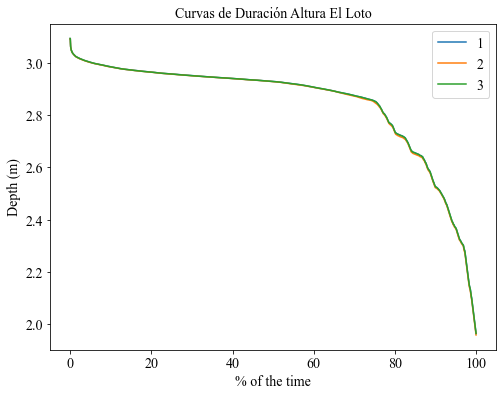

In [324]:
plt.figure(figsize=(8,6))
plt.plot(W2_infS_1_TS_df_sort["% Tiempo"], W2_infS_1_TS_df_sort["Depth (m)"], label="1")
plt.plot(W2_infS_2_TS_df_sort["% Tiempo"], W2_infS_2_TS_df_sort["Depth (m)"], label="2")
plt.plot(W2_infS_3_TS_df_sort["% Tiempo"], W2_infS_3_TS_df_sort["Depth (m)"], label="3")
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Altura El Loto")

In [325]:
W3_infS_1_TS_df_sort=C_duracion(df_WSU_infS_1, "W3")
W3_infS_2_TS_df_sort=C_duracion(df_WSU_infS_2, "W3")
W3_infS_3_TS_df_sort=C_duracion(df_WSU_infS_3, "W3")

Text(0.5, 1.0, 'Curvas de Duración Altura Los Helechos')

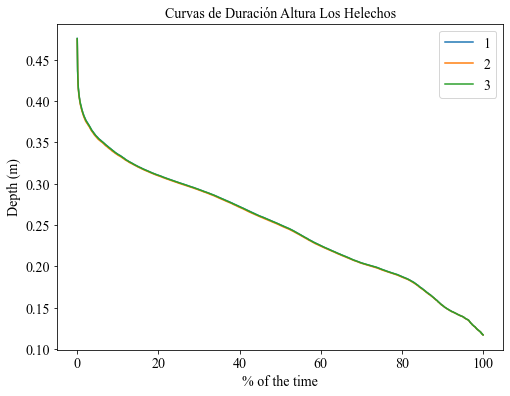

In [326]:
plt.figure(figsize=(8,6))
plt.plot(W3_infS_1_TS_df_sort["% Tiempo"], W3_infS_1_TS_df_sort["Depth (m)"], label="1")
plt.plot(W3_infS_2_TS_df_sort["% Tiempo"], W3_infS_2_TS_df_sort["Depth (m)"], label="2")
plt.plot(W3_infS_3_TS_df_sort["% Tiempo"], W3_infS_3_TS_df_sort["Depth (m)"], label="3")
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Altura Los Helechos")

In [327]:
W4_infS_1_TS_df_sort=C_duracion(df_WSU_infS_1, "W4")
W4_infS_2_TS_df_sort=C_duracion(df_WSU_infS_2, "W4")
W4_infS_3_TS_df_sort=C_duracion(df_WSU_infS_3, "W4")

Text(0.5, 1.0, 'Curvas de Duración Altura Las Ranas')

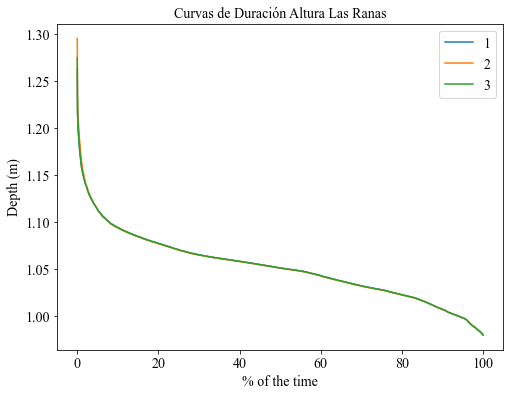

In [328]:
plt.figure(figsize=(8,6))
plt.plot(W4_infS_1_TS_df_sort["% Tiempo"], W4_infS_1_TS_df_sort["Depth (m)"], label="1")
plt.plot(W4_infS_2_TS_df_sort["% Tiempo"], W4_infS_2_TS_df_sort["Depth (m)"], label="2")
plt.plot(W4_infS_3_TS_df_sort["% Tiempo"], W4_infS_3_TS_df_sort["Depth (m)"], label="3")
plt.ylabel("Depth (m)")
plt.xlabel("% of the time")
plt.legend()
plt.title("Curvas de Duración Altura Las Ranas")

### Flooding Storage Units

In [329]:
df_FSU_infS_1=import_xls('Iteracion_C_2/FSU_SWMM_TS.xls')
df_FSU_infS_2=import_xls('Iteracion_inf_2_S/FSU_SWMM_TS.xls') 
df_FSU_infS_3=import_xls('Iteracion_inf_3_S/FSU_SWMM_TS.xls') 

SU1

In [330]:
phi=1
SU1_infS_1_TS_df_sort=A_frecuencia(df_FSU_infS_1,"SU1", phi)
SU1_infS_2_TS_df_sort=A_frecuencia(df_FSU_infS_2,"SU1", phi)
SU1_infS_3_TS_df_sort=A_frecuencia(df_FSU_infS_3,"SU1", phi)

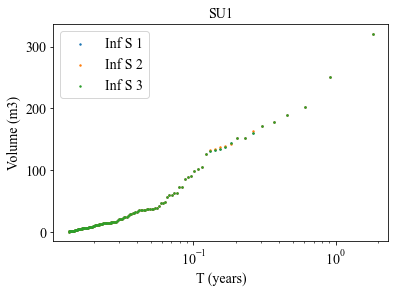

In [331]:
plt.scatter(SU1_infS_1_TS_df_sort[2]["T"], SU1_infS_1_TS_df_sort[2]["Volume (m3)"], label="Inf S 1", s=2)
plt.scatter(SU1_infS_2_TS_df_sort[2]["T"], SU1_infS_2_TS_df_sort[2]["Volume (m3)"], label="Inf S 2", s=2)
plt.scatter(SU1_infS_3_TS_df_sort[2]["T"], SU1_infS_3_TS_df_sort[2]["Volume (m3)"], label="Inf S 3", s=2)
plt.ylabel("Volume (m3)")
plt.xlabel("T (years)")
plt.xscale("log")
plt.title("SU1")
plt.legend()

SU2

In [332]:
phi=1
SU2_infS_1_TS_df_sort=A_frecuencia(df_FSU_infS_1,"SU2", phi)
SU2_infS_2_TS_df_sort=A_frecuencia(df_FSU_infS_2,"SU2", phi)
SU2_infS_3_TS_df_sort=A_frecuencia(df_FSU_infS_3,"SU2", phi)

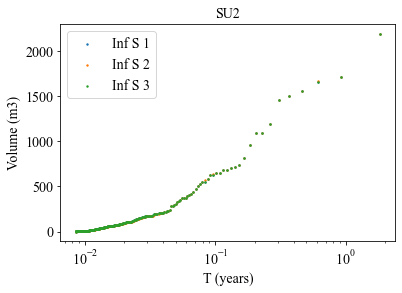

In [333]:
plt.scatter(SU2_infS_1_TS_df_sort[2]["T"], SU2_infS_1_TS_df_sort[2]["Volume (m3)"], label="Inf S 1", s=2)
plt.scatter(SU2_infS_2_TS_df_sort[2]["T"], SU2_infS_2_TS_df_sort[2]["Volume (m3)"], label="Inf S 2", s=2)
plt.scatter(SU2_infS_3_TS_df_sort[2]["T"], SU2_infS_3_TS_df_sort[2]["Volume (m3)"], label="Inf S 3", s=2)
plt.ylabel("Volume (m3)")
plt.xlabel("T (years)")
plt.xscale("log")
plt.title("SU2")
plt.legend()

SU3

In [334]:
phi=1
SU3_infS_1_TS_df_sort=A_frecuencia(df_FSU_infS_1,"SU3", phi)
SU3_infS_2_TS_df_sort=A_frecuencia(df_FSU_infS_2,"SU3", phi)
SU3_infS_3_TS_df_sort=A_frecuencia(df_FSU_infS_3,"SU3", phi)

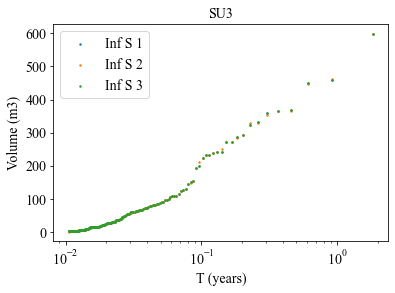

In [335]:
plt.scatter(SU3_infS_1_TS_df_sort[2]["T"], SU3_infS_1_TS_df_sort[2]["Volume (m3)"], label="Inf S 1", s=2)
plt.scatter(SU3_infS_2_TS_df_sort[2]["T"], SU3_infS_2_TS_df_sort[2]["Volume (m3)"], label="Inf S 2", s=2)
plt.scatter(SU3_infS_3_TS_df_sort[2]["T"], SU3_infS_3_TS_df_sort[2]["Volume (m3)"], label="Inf S 3", s=2)
plt.ylabel("Volume (m3)")
plt.xlabel("T (years)")
plt.xscale("log")
plt.title("SU3")
plt.legend()

In [336]:
xls=pd.ExcelFile('Iteracion_C_2/S_SWMM_TS.xls')
dict_S_SWMM_TS = pd.read_excel(xls, sheet_name=None)
S_SWMM_TS_C_2=list(dict_S_SWMM_TS.values())

xls=pd.ExcelFile('Iteracion_inf_2_S/S_SWMM_TS.xls')
dict_S_SWMM_TS = pd.read_excel(xls, sheet_name=None)
S_SWMM_TS_inf_2_S=list(dict_S_SWMM_TS.values())

xls=pd.ExcelFile('Iteracion_inf_3_S/S_SWMM_TS.xls')
dict_S_SWMM_TS = pd.read_excel(xls, sheet_name=None)
S_SWMM_TS_inf_3_S=list(dict_S_SWMM_TS.values())

In [337]:
S_name="S34"
i=S_names_list.index(S_name)

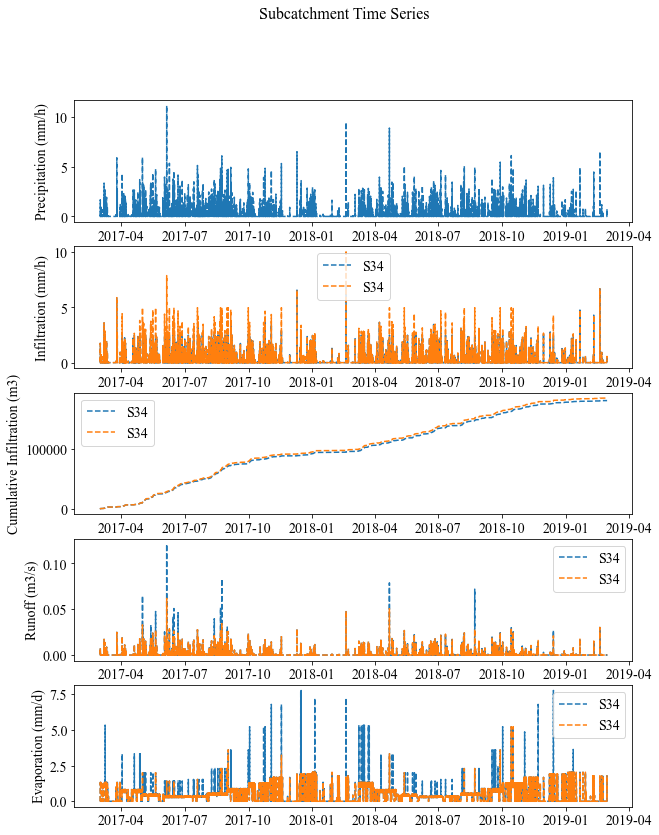

In [338]:
f, (ax1, ax2, ax3,ax4, ax5) = plt.subplots(5,1, figsize=(10,13))
ax1.plot(S_SWMM_TS_C_2[i].Time,S_SWMM_TS_C_2[i]["Precipitation (mm/h)"], label=S_name,linestyle="--" )
ax1.set_ylabel("Precipitation (mm/h)")
#ax2.plot(S_SWMM_TS_C_2[i].Time, S_SWMM_TS_C_2[i]["Infiltration (mm/h)"], label=S_name,linestyle="--"  )
ax2.plot(S_SWMM_TS_inf_2_S[i].Time, S_SWMM_TS_inf_2_S[i]["Infiltration (mm/h)"], label=S_name,linestyle="--"  )
ax2.plot(S_SWMM_TS_inf_3_S[i].Time, S_SWMM_TS_inf_3_S[i]["Infiltration (mm/h)"], label=S_name,linestyle="--"  )
ax2.set_ylabel("Infiltration (mm/h)")
ax2.legend()
#ax3.plot(S_SWMM_TS_C_2[i].Time,S_SWMM_TS_C_2[i]["Cumulative Infiltration (m3)"], label=S_name,linestyle="--" )
ax3.plot(S_SWMM_TS_inf_2_S[i].Time,S_SWMM_TS_inf_2_S[i]["Cumulative Infiltration (m3)"], label=S_name,linestyle="--" )
ax3.plot(S_SWMM_TS_inf_3_S[i].Time,S_SWMM_TS_inf_3_S[i]["Cumulative Infiltration (m3)"], label=S_name,linestyle="--" )
ax3.set_ylabel("Cumulative Infiltration (m3)")
ax3.legend()
#ax4.plot(S_SWMM_TS_C_2[i].Time,S_SWMM_TS_C_2[i]["Runoff (m3/s)"], label=S_name,linestyle="--" )
ax4.plot(S_SWMM_TS_inf_2_S[i].Time,S_SWMM_TS_inf_2_S[i]["Runoff (m3/s)"], label=S_name,linestyle="--" )
ax4.plot(S_SWMM_TS_inf_3_S[i].Time,S_SWMM_TS_inf_3_S[i]["Runoff (m3/s)"], label=S_name,linestyle="--" )
ax4.legend()
ax4.set_ylabel("Runoff (m3/s)")
#ax5.plot(S_SWMM_TS_C_2[i].Time,S_SWMM_TS_C_2[i]["Evaporation (mm/d)"], label=S_name,linestyle="--" )
ax5.plot(S_SWMM_TS_inf_2_S[i].Time,S_SWMM_TS_inf_2_S[i]["Evaporation (mm/d)"], label=S_name,linestyle="--" )
ax5.plot(S_SWMM_TS_inf_3_S[i].Time,S_SWMM_TS_inf_3_S[i]["Evaporation (mm/d)"], label=S_name,linestyle="--" )
ax5.legend()
ax5.set_ylabel("Evaporation (mm/d)")
f.suptitle("Subcatchment Time Series",fontsize=16)
plt.show()

# Time Series

Grafica Serie de tiempo + precipitacion

In [339]:
serie_prec=S_SWMM_TS_C_2[i].set_index(S_SWMM_TS_C_2[i].Time)

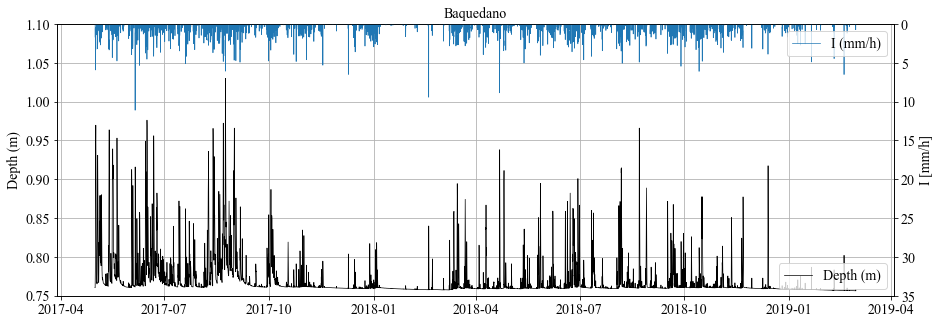

In [340]:
i=0
fig,ax=plt.subplots(figsize=(15,5))
ax.plot(df_WSU_C2[i]["2017-05-01":"2019-03-01"].index,df_WSU_C2[i]["2017-05-01":"2019-03-01"]["Depth (m)"], color="k", label="Depth (m)", linewidth=0.7)
ax.yaxis.set_label_text('Depth (m)')
ax.set_ylim(0.75,1.1)
plt.grid()
ax2=ax.twinx()
ax2.plot(serie_prec["2017-05-01":"2019-03-01"].index,serie_prec["2017-05-01":"2019-03-01"]["Precipitation (mm/h)"], label="I (mm/h)", linewidth=0.7)
ax2.set_ylim(0,35)
ax2.yaxis.set_label_text('I [mm/h]')
ax2.invert_yaxis()
ax.legend(loc="lower right")
ax2.legend(loc="upper right")
#plt.grid()
ax.set_title("Baquedano")
plt.savefig("Figures/Anexos/TS_W1_C2.svg")

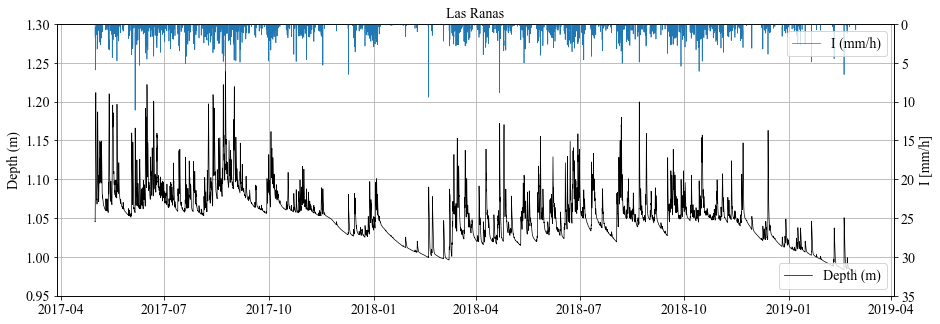

In [341]:
i=3
fig,ax=plt.subplots(figsize=(15,5))
ax.plot(df_WSU_C2[i]["2017-05-01":"2019-03-01"].index,df_WSU_C2[i]["2017-05-01":"2019-03-01"]["Depth (m)"], color="k", label="Depth (m)", linewidth=0.7)
ax.yaxis.set_label_text('Depth (m)')
ax.set_ylim(0.95,1.3)
plt.grid()
ax2=ax.twinx()
ax2.plot(serie_prec["2017-05-01":"2019-03-01"].index,serie_prec["2017-05-01":"2019-03-01"]["Precipitation (mm/h)"], label="I (mm/h)", linewidth=0.7)
ax2.set_ylim(0,35)
ax2.yaxis.set_label_text('I [mm/h]')
ax2.invert_yaxis()
ax.legend(loc="lower right")
ax2.legend(loc="upper right")
#plt.grid()
ax.set_title("Las Ranas")
plt.savefig("Figures/Anexos/TS_W4_C2.svg")

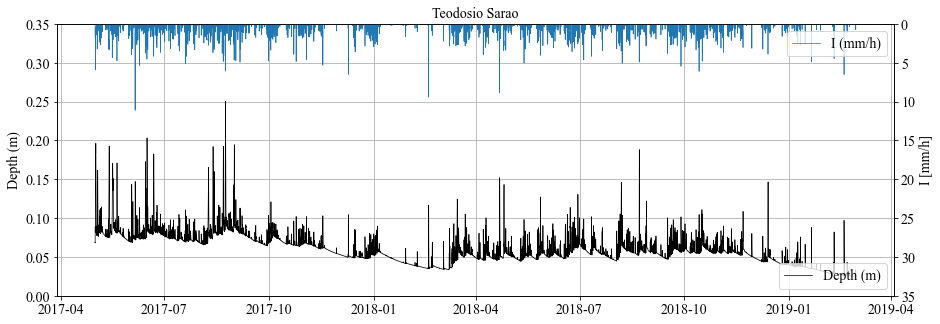

In [342]:
i=4
fig,ax=plt.subplots(figsize=(15,5))
ax.plot(df_WSU_C2[i]["2017-05-01":"2019-03-01"].index,df_WSU_C2[i]["2017-05-01":"2019-03-01"]["Depth (m)"], color="k", label="Depth (m)", linewidth=0.7)
ax.yaxis.set_label_text('Depth (m)')
ax.set_ylim(0,0.35)
plt.grid()
ax2=ax.twinx()
ax2.plot(serie_prec["2017-05-01":"2019-03-01"].index,serie_prec["2017-05-01":"2019-03-01"]["Precipitation (mm/h)"], label="I (mm/h)", linewidth=0.7)
ax2.set_ylim(0,35)
ax2.yaxis.set_label_text('I [mm/h]')
ax2.invert_yaxis()
ax.legend(loc="lower right")
ax2.legend(loc="upper right")
#plt.grid()
ax.set_title("Teodosio Sarao")
plt.savefig("Figures/Anexos/TS_W5_C2.svg")

# Comparación series de precipitación

## Importación caso base con otra serie

In [343]:
df_WSU_mod_prec=import_xls('Iteracion_mod_prec/WSU_SWMM_TS.xls')

In [344]:
xls=pd.ExcelFile('Iteracion_mod_prec/S_SWMM_TS.xls')
dict_S_SWMM_TS = pd.read_excel(xls, sheet_name=None)
S_SWMM_TS_mod_prec=list(dict_S_SWMM_TS.values())

In [345]:
i=2
serie_prec_2=S_SWMM_TS_mod_prec[i].set_index(S_SWMM_TS_mod_prec[i].Time)

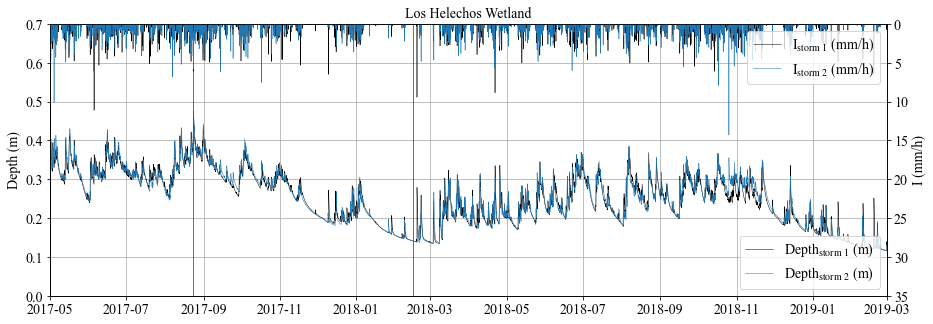

In [346]:
i=2
fig,ax=plt.subplots(figsize=(15,5))
ax.plot(df_WSU_C2[i]["2017-05-01":"2019-03-01"].index,df_WSU_C2[i]["2017-05-01":"2019-03-01"]["Depth (m)"], color="k", label="$\mathrm{Depth_{storm\ 1}}$ (m)", linewidth=0.5)
ax.plot(df_WSU_mod_prec[i]["2017-05-01":"2019-03-01"].index,df_WSU_mod_prec[i]["2017-05-01":"2019-03-01"]["Depth (m)"], color="tab:blue", label="$\mathrm{Depth_{storm\ 2}}$ (m)",  linewidth=0.5)
ax.yaxis.set_label_text('Depth (m)')
ax.set_ylim(0,0.7)
ax.axvline(x=pd.Timestamp('2017-08-23'), color='r', linewidth=0.8)
ax.axvline(x=pd.Timestamp('2018-02-15'), color='g', linewidth=0.8)
plt.grid()
ax2=ax.twinx()
ax2.plot(serie_prec["2017-05-01":"2019-03-01"].index,serie_prec["2017-05-01":"2019-03-01"]["Precipitation (mm/h)"], label="$ \mathrm{I_{storm\ 1}}$ (mm/h)", color="k", linewidth=0.5)
ax2.plot(serie_prec_2["2017-05-01":"2019-03-01"].index,serie_prec_2["2017-05-01":"2019-03-01"]["Precipitation (mm/h)"], label="$ \mathrm{I_{storm\ 2}}$ (mm/h)", color="tab:blue", linewidth=0.5)
ax2.set_ylim(0,35)
ax2.yaxis.set_label_text('I (mm/h)')
ax2.invert_yaxis()
ax2.set_xlim(["2017-05-01","2019-03-01"])
ax.legend(loc="lower right", fontsize=14)
ax2.legend(loc="upper right", fontsize=14)
ax.set_title("Los Helechos Wetland")
plt.savefig("Figures\Fig9b.svg")

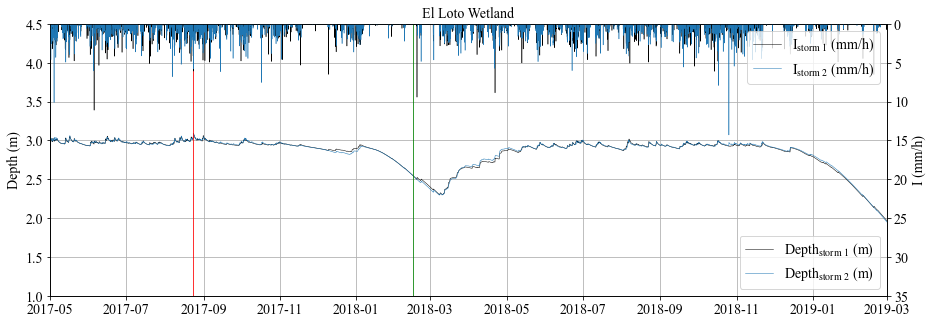

In [347]:
i=1
fig,ax=plt.subplots(figsize=(15,5))
ax.plot(df_WSU_C2[i]["2017-05-01":"2019-03-01"].index,df_WSU_C2[i]["2017-05-01":"2019-03-01"]["Depth (m)"], color="k", label="$\mathrm{Depth_{storm\ 1}}$ (m)", linewidth=0.5)
ax.plot(df_WSU_mod_prec[i]["2017-05-01":"2019-03-01"].index,df_WSU_mod_prec[i]["2017-05-01":"2019-03-01"]["Depth (m)"], color="tab:blue", label="$\mathrm{Depth_{storm\ 2}}$ (m)",  linewidth=0.5)
ax.yaxis.set_label_text('Depth (m)')
ax.set_ylim(1,4.5)
ax.axvline(x=pd.Timestamp('2017-08-23'), color='r', linewidth=0.8)
ax.axvline(x=pd.Timestamp('2018-02-15'), color='g', linewidth=0.8)
plt.grid()
ax2=ax.twinx()
ax2.plot(serie_prec["2017-05-01":"2019-03-01"].index,serie_prec["2017-05-01":"2019-03-01"]["Precipitation (mm/h)"], label="$ \mathrm{I_{storm\ 1}}$ (mm/h)", color="k", linewidth=0.5)
ax2.plot(serie_prec_2["2017-05-01":"2019-03-01"].index,serie_prec_2["2017-05-01":"2019-03-01"]["Precipitation (mm/h)"], label="$ \mathrm{I_{storm\ 2}}$ (mm/h)", color="tab:blue", linewidth=0.5)
ax2.set_ylim(0,35)
ax2.yaxis.set_label_text('I (mm/h)')
ax2.invert_yaxis()
ax2.set_xlim(["2017-05-01","2019-03-01"])
ax.legend(loc="lower right", fontsize=14)
ax2.legend(loc="upper right", fontsize=14)
#plt.grid()
ax.set_title("El Loto Wetland")
plt.savefig("Figures\Fig9a.svg")

# GDF- Spatial Results

Importación de GDF diarios

In [348]:
x_resolution=50.0
y_resolution=50.0

In [349]:
ml = flopy.modflow.Modflow.load('LLANQUIHUE_MF_workspace/LLANQUIHUE.nam')

In [350]:
geometry=gpd.read_file('GIS/SHAPES/MODFLOW_grid_flopy.shp')
geometry=geometry.geometry
SWMM_S_gdf=gpd.read_file('GIS/SHAPES/SWMM_S.shp')

In [351]:
DF_23082017 = pd.read_excel("GDF_results/2017_08_23.xlsx", index_col=0)
GDF_23082017 = GeoDataFrame(DF_23082017, crs="EPSG:32718", geometry=geometry)
DF_02152018 = pd.read_excel("GDF_results/2018_02_15.xlsx", index_col=0)
GDF_02152018 = GeoDataFrame(DF_02152018, crs="EPSG:32718", geometry=geometry)

C:\Users\tibun\Anaconda3\envs\acople\lib\site-packages\xlrd\xlsx.py:266: PendingDeprecationWarning: This method will be removed in future versions.  Use 'tree.iter()' or 'list(tree.iter())' instead.
  for elem in self.tree.iter() if Element_has_iter else self.tree.getiterator():
C:\Users\tibun\Anaconda3\envs\acople\lib\site-packages\xlrd\xlsx.py:312: PendingDeprecationWarning: This method will be removed in future versions.  Use 'tree.iter()' or 'list(tree.iter())' instead.
  for elem in self.tree.iter() if Element_has_iter else self.tree.getiterator():
C:\Users\tibun\Anaconda3\envs\acople\lib\site-packages\xlrd\xlsx.py:266: PendingDeprecationWarning: This method will be removed in future versions.  Use 'tree.iter()' or 'list(tree.iter())' instead.
  for elem in self.tree.iter() if Element_has_iter else self.tree.getiterator():
C:\Users\tibun\Anaconda3\envs\acople\lib\site-packages\xlrd\xlsx.py:266: PendingDeprecationWarning: This method will be removed in future versions.  Use 'tree.i

In [352]:
def plot_daily_net(GDF):
    net_diario=GDF.DRN_rate-(GDF.RCH_S.fillna(0)+GDF.RCH_WSU.fillna(0)+GDF.RCH_FSU.fillna(0))*x_resolution*y_resolution
    gdf_diario=GDF
    gdf_diario["NET_FLUX"]=net_diario
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(1, 1, 1, aspect='equal')
    ax =gdf_diario.plot(ax=ax, column='NET_FLUX', legend=False, cmap='seismic', vmax=400, vmin=-400)
    ax = SWMM_S_gdf.geometry.boundary.plot(color=None,edgecolor='k',linewidth = 0.5,ax=ax)
    pmv = flopy.plot.PlotMapView(modelgrid=ml.modelgrid)
    pmv.plot_grid(ax=ax, alpha=0.2);
    plt.axis("off")
    plt.rc('font', size=14)          # controls default text sizes
    plt.rc('axes', titlesize=14)     # fontsize of the axes title
    plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
    plt.rc('legend', fontsize=14)    # legend fontsize
    plt.rcParams["font.serif"] = ["Times New Roman"]
    plt.rcParams['mathtext.fontset'] = 'stix'
    norm = colors.Normalize(vmax=400, vmin=-400)
    cbar = plt.cm.ScalarMappable(norm=norm, cmap='seismic')
    ax_cbar = fig.colorbar(cbar, ax=ax)
    # add label for the colorbar
    ax_cbar.set_label('Net Flux $(\mathrm{m^3/day})$')
    return()

Text(0.5, 1.0, 'August 2017')

<Figure size 432x288 with 0 Axes>

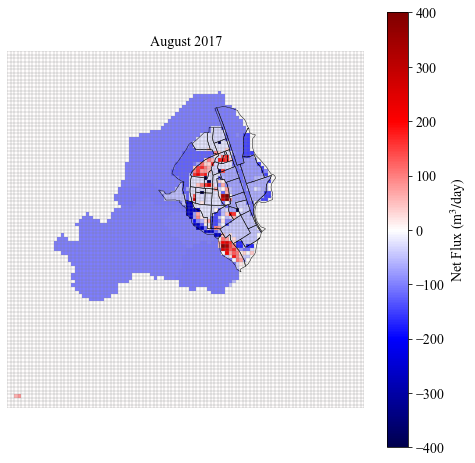

In [353]:
plt.figure()
plot_daily_net(GDF_23082017)
plt.title('August 2017', fontsize=14)
#plt.savefig("Figures/Fig11a_August2017.svg")

In [354]:
def plot_daily_depth(GDF):
    depth_dia=GDF.elevation-GDF.Altura
    for i in range(len(depth_dia)):
        if type(GDF["S"][i])!=str:
            depth_dia[i]=np.nan 
        if GDF.river[i] or GDF.lake[i]:
            depth_dia[i]=np.nan 
    gdf_dia=GDF
    gdf_dia["depth"]=depth_dia
    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(1, 1, 1, aspect='equal')

    ax = gdf_dia.plot(ax=ax, column="depth",  cmap='RdYlGn', legend=False, vmax=3, vmin=-1)
    ax = SWMM_S_gdf.geometry.boundary.plot(color=None,edgecolor='k',linewidth = 0.5,ax=ax)
    ax.set_title("August 2017", fontsize=14)
    pmv = flopy.plot.PlotMapView(modelgrid=ml.modelgrid)
    pmv.plot_grid(ax=ax, alpha=0.2);
    norm = colors.Normalize( vmax=3, vmin=-1)
    cbar = plt.cm.ScalarMappable(norm=norm, cmap='RdYlGn')
    ax_cbar = fig.colorbar(cbar, ax=ax)
    ax_cbar.set_label('Depth Ground Water Table (m)')
    plt.axis("off")
    
    #plt.savefig("Figures/Fig11d_August2017.svg")
    return

Text(0.5, 1.0, 'August 2017')

<Figure size 432x288 with 0 Axes>

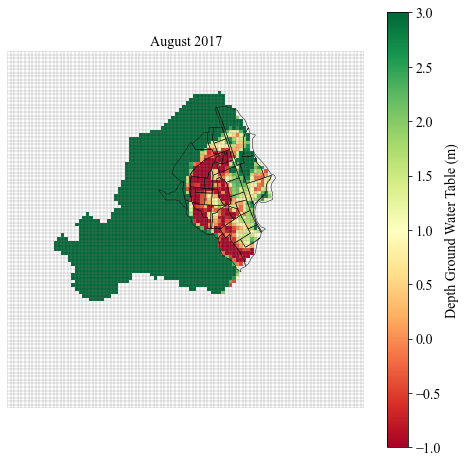

In [355]:
plt.figure()
plot_daily_depth(GDF_23082017)
plt.title('August 2017', fontsize=14)

# Cálculo de condiciones de Diseño